In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
#from scipy import interp, stats
from scipy.stats import sem
import pylab as pl
from sklearn.metrics import roc_curve, auc, recall_score, matthews_corrcoef, make_scorer, precision_recall_curve, average_precision_score
from sklearn.model_selection import StratifiedKFold
import math
import matplotlib as mpl
from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D
import json
import glob
mpl.style.use('default')
#import tqdm

CHNGE OCCLUSION SCORE TO z

Get occlusion map details for all RBPs based on Protein BERT score and classification

## Utils

In [15]:
from collections import defaultdict
from math import log

def get_IDR_coordinates(iupred_file):
    """
    IDR_file: the full file path of *.iupred.out file.
    """
    table=pd.read_table(iupred_file, skiprows=9, header=None, sep=' +', engine='python')
    table[2]=table[2].apply(float)
    disordered_coord=[rix for rix, row in table.iterrows() if row[2]>0.4] # 0-based coordinates
    return disordered_coord

def calculate_Shannon_Entropy(str_l):
    H=0
    length=len(str_l)
    aa_set=set(str_l)
    dic=defaultdict(int)
    for aa in str_l:
        dic[aa]+=1
    
    for aa in aa_set:
        p=dic[aa]*1.0/length
        H-=p*log(p,2)
    
    return H    

def get_low_complexity_coordinates(seqfile):
    with open(seqfile) as f:
        seq=f.read().split('\n')[1]
        seq_l=list(seq)
        if '*' in set(seq_l):
            seq_l.remove('*')
            
    coord=[]
    for i in range(10, len(seq_l)-10):
        H=calculate_Shannon_Entropy(seq_l[i-10:i+11])    
        if (H<3):
            coord.append(int(i))  ## 0-based coordinates.
        
    return coord

def merge_coordinates(coords):
    if len(coords)==0:
        return []
    start=coords[0]
    pre=start
    coord_list=[]
    for c in coords[1:]:
        if c==pre+1:
            pre=c
        else:
            coord_list.append('{}-{}'.format(start, pre))
            start=c
            pre=c
    
    return coord_list

def plot_annotations_v4(ax1, ax4, RBP_id, RBDs, RBDpep_table=None, RBDpep_grouped=None, IDR_file=None, seqdir='/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/sequence_files_initial_eval_noppinopia', Domain_dir='/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra/sequence_files_hmmscan_2/collapsed/'):
    """
    ax1: ax for domains
    ax2: ax for RBDpeps
    IDR_file: the full file path of *.iupred.out file.
    low_complexity_coords: list of integers, presenting the coordinates of amino acids within low complexity regions.
    """
    custom_colors = [
    '#FFFFFF',  # index 0 → background = white
    '#0072B2',  # index 1 → RBD domain = teal
    '#CC79A7',  # index 2 → LCR = purple
    '#009E73']  # index 3 → non-RBD domain = green
    
    cm = ListedColormap(custom_colors)

    seqfile=os.path.join(seqdir, RBP_id+'.fasta')
    Domain_file=os.path.join(Domain_dir, RBP_id+'_dom_hmmscan_out.txt.collapsed.Evalue0.1.0.01.out')
    
    if os.path.exists(seqfile):
        f=open(seqfile)
        seq=f.read().split('\n')[1]
        f.close()
        bar1=np.zeros(len(seq)) #bar for domains
        #bar2=np.zeros(len(seq)) #bar for RBDpeps
        #bar3=np.zeros(len(seq)) #bar for IDR
        bar4=np.zeros(len(seq)) #bar for low complexity
        ## add domain annotation from Pfam searches
        domain_list = [] #### Pratibha
        if os.path.exists(Domain_file):
            try:
                df=pd.read_table(Domain_file, header=None)
                domain_list=list(df[0])
                domain_coords=np.array(df[[7,8]])
                domains=zip(domain_list, domain_coords.tolist())
                for dom, (start, end) in domains:
                    start=start-1  #Convert to 0-based coordinates
                    end=end-1  #Convert to 0-based coordinates
                    if dom in RBDs:
                        bar1[start:end+1]=1 #pink
                    else:
                        bar1[start:end+1]=3 #light green
                    print('{}: {}-{}'.format(dom, start+1, end+1)) ### KEEP THIS
                    domain_coordinates.append([RBP_id, dom, start+1, end+1])
            except pd.errors.EmptyDataError:
                 domain_list=[]
                    
        low_complexity_coords=get_low_complexity_coordinates(seqfile)
        for low_complexity_coord in low_complexity_coords:
            bar4[low_complexity_coord]=2
            
        print("Low complexity coordinates: {}".format(', '.join(merge_coordinates(low_complexity_coords))))
        for coordinate in merge_coordinates(low_complexity_coords):
            low_complexity_coordinates.append([RBP_id, coordinate.split('-')[0], coordinate.split('-')[1]])

        bar1=np.array([bar1]*max(int(len(seq)/80),10))
        #bar2=np.array([bar2]*max(int(len(seq)/80),1))
        #bar3=np.array([bar3]*max(int(len(seq)/80),1))
        bar4=np.array([bar4]*max(int(len(seq)/80),10))
        #im1=ax1.imshow(bar1, cmap=cm, vmin=0, vmax=3)

        im4=ax4.imshow(bar4, cmap=cm, vmin=0, vmax=3)
        im1 = ax1.imshow(bar1, cmap=cm, vmin=0, vmax=3, aspect='auto', extent=[0, len(seq), 0, bar1.shape[0]])
        im4 = ax4.imshow(bar4, cmap=cm, vmin=0, vmax=3, aspect='auto', extent=[0, len(seq), 0, bar4.shape[0]])
        #ax1.set_title(RBP_id+'_domains',fontsize='x-large',verticalalignment='bottom')
       
        #ax4.set_title(RBP_id+'_LowComplexity',fontsize='x-large',verticalalignment='bottom')

        if len(domain_list)>0:
            for dom, (start, end) in zip(domain_list,domain_coords.tolist()):
                ax1.text((start+end)/2, 0.5*int(len(seq)/100), dom.replace('_', ' '), fontsize='large', horizontalalignment='center',verticalalignment='center')

        ax1.axes.get_yaxis().set_visible(False)

        ax4.axes.get_yaxis().set_visible(False)

In [25]:
def merge_peaks(peak_list):
    if len(peak_list)>0:
        out_list=[]
        peak0=peak_list[0]
        start0=int(peak0.split('-')[0])
        end0=int(peak0.split('-')[1])
        for peak in peak_list[1:]:
            start=int(peak.split('-')[0])
            end=int(peak.split('-')[1])
            if start<=end0:
                end0=end
            else:
                out_list.append('{}-{}'.format(start0,end0))
                start0=start
                end0=end
        
        out_list.append('{}-{}'.format(start0,end0))
        return out_list
    else:
        return []


def main4(watch_list, is_ID=False,customized_name=False, folder='Occlusions_Maps', p_threshold1=0.05, p_threshold2=0.001, savefig=False,occ_dir='/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ',draw_ensemble_only=False):
    watch_list=[x for x in watch_list if str(x)!='nan']
    
    out_dir='/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/'+folder

    #files=list(filter(lambda x: x.endswith('_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues.xls'), os.listdir(occ_dir)))

    xls=pd.ExcelFile('/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra/Gerstberger_RBD_list_reformatted.xls')
    RBDs=set(xls.parse('Pfam domains')['Pfam RNA binding domains'])

    wind_size=20
    
    pvalue_cmap = ListedColormap(["white", "lightskyblue", "steelblue"])


    print('All the print out coordinates are 0-based (starting from 0 rather than 1).')
    for RBP in watch_list:
        
        RBP_ids=[RBP]

        for RBP_id in RBP_ids:
            print(RBP, RBP_id)
            path=os.path.join(occ_dir,RBP_id+'_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls')
            print(path)
            if not os.path.exists(path):
                print('Occlusion plot of '+RBP+' is not found.')
                continue


            occ_df=pd.read_table(path, index_col=0)
            
            orig_ProteinBERT=list(occ_df.original_ProteinBERT_score)[0]
            
            #delta_ProteinBERT=list(occ_df.delta_ProteinBERT)

            delta_ProteinBERT = list(occ_df.zscore_deltaProteinBERT)
            
            delta_ProteinBERT_sig_coords=np.where(np.array(occ_df.deltaProteinBERT_zscore_pvalue)<p_threshold1)[0]+int((wind_size-1)/2)
           
            delta_ProteinBERT=[0]*int((wind_size-1)/2)+delta_ProteinBERT+[0]*int((wind_size)/2)
         
            f, (ax1, ax4, ax7, ax9) = plt.subplots(4, 1, figsize=(4, 2), sharex=True, gridspec_kw={'height_ratios': [0.3, 0.3, 1.5, 0.3]}) 
            plot_annotations_v4(ax1, ax4, RBP_id, RBDs)
         
            
            ax7.plot(range(len(delta_ProteinBERT)),delta_ProteinBERT, lw=0)
            ax7.set_xlim(0,len(delta_ProteinBERT))
            ax7.axhline(y=0,ls='-', color='grey', lw=1)
            #ax7.plot(delta_ProteinBERT_sig_coords, np.zeros(len(delta_ProteinBERT_sig_coords)), 'r.')
            # Fill below the curve (positive and negative separately, optional for color clarity)
            ax7.fill_between(
                range(len(delta_ProteinBERT)),
                delta_ProteinBERT,
                where=np.array(delta_ProteinBERT) >= 0,
                interpolate=True,
                color='#0072B2',
                alpha=1
            )
            
            ax7.fill_between(
                range(len(delta_ProteinBERT)),
                delta_ProteinBERT,
                where=np.array(delta_ProteinBERT) < 0,
                interpolate=True,
                color='#D55E00',
                alpha=1
            )
            plt.suptitle('{} | Standardized Delta Scores | {}'.format(RBP_id, orig_ProteinBERT),fontsize='x-large')
           
            peaks_coords1=occ_df[occ_df['deltaProteinBERT_zscore_pvalue']<=p_threshold1]['occluded_coord'] ## coordinates are 0-based.
            peaks_coords2=occ_df[occ_df['deltaProteinBERT_zscore_pvalue']<=p_threshold2]['occluded_coord'] ## coordinates are 0-based.
            print("sig peak regions (p<{}): {}".format(p_threshold1,', '.join(merge_peaks(list(peaks_coords1)))))
            print("sig peak regions (p<{}): {}".format(p_threshold2,', '.join(merge_peaks(list(peaks_coords2)))))

            for each_peak in merge_peaks(list(peaks_coords1)) + merge_peaks(list(peaks_coords2)):
                sig_peaks_list.append([RBP_id, each_peak.split('-')[0],  each_peak.split('-')[1]])
            
            #print(occ_df[occ_df['avg_zscore_deltaSVM_deltaDNN_deltaProteinBERT_pvalue']<=p_threshold2][['avg_zscore_deltaSVM_deltaDNN_deltaProteinBERT_pvalue','occluded_coord']])
            peaks_pos1=set([])
            peaks_pos2=set([])
            for coo1 in peaks_coords1:
                peaks_pos1.update(list(range(int(coo1.split('-')[0]),int(coo1.split('-')[1])+1)))
            for coo2 in peaks_coords2:
                peaks_pos2.update(list(range(int(coo2.split('-')[0]),int(coo2.split('-')[1])+1)))    
            peak_bar=np.zeros(len(occ_df)+19)
            for i in peaks_pos1:
                peak_bar[i]=1
            for j in peaks_pos2:
                peak_bar[j]=2
            peak_bar=np.array([peak_bar]*max(int(len(occ_df)/60),10))
            #im9=ax9.imshow(peak_bar, cmap=pvalue_cmap, vmin=0, vmax=2)
            im9 = ax9.imshow(peak_bar, cmap=pvalue_cmap, vmin=0, vmax=2, aspect='auto')#, extent=[0, len(peak_bar), 0, peak_bar.shape[0]])
            ax9.set_yticks([])
           

            #ax9.set_title(RBP_id+'_p_value',fontsize='x-large',verticalalignment='bottom')
            #f.colorbar(im9, ax=ax10)
            #ax10.legend([1, "orange"], loc=0, frameon=legend_drawn_flag)
            custom_lines = [Line2D([0], [0], color= "lightskyblue", lw=6), Line2D([0], [0], color="steelblue", lw=6)]
            #ax10.legend(custom_lines, ['p < {}'.format(p_threshold1), 'p < {}'.format(p_threshold2)], loc='right',fontsize='xx-large')
            plt.tight_layout()
            # if savefig:
            #     f.savefig(os.path.join(out_dir, RBP+'_'+RBP_id+'_1dOcclusion_zscores_ProtLenWiseNormed_HydRa2.0_noSS_addPvalueTrack.pdf'),format='pdf')
            #     f.savefig(os.path.join(out_dir, RBP+'_'+RBP_id+'_1dOcclusion_zscores_ProtLenWiseNormed_HydRa2.0_noSS_addPvalueTrack.svg'),format='svg')
            #     f.savefig(os.path.join(out_dir, RBP+'_'+RBP_id+'_1dOcclusion_zscores_ProtLenWiseNormed_HydRa2.0_noSS_addPvalueTrack.png'),format='png')
            #     f.savefig(os.path.join(out_dir, RBP+'_'+RBP_id+'_1dOcclusion_zscores_ProtLenWiseNormed_HydRa2.0_noSS_addPvalueTrack.jpg'),format='jpg')
            

            plt.show()

                    

In [62]:
rbp_df =  pd.read_csv('RBP_train_test_eval_bkg_corrected_nosim.tsv', sep='\t')

In [63]:
rbps_list =rbp_df['key'].tolist()

In [64]:
rbp_dict = dict(zip(rbp_df.key, rbp_df.aa_sequence))

In [65]:
def generate_fibonacci_bins(max_len=5000, start_len0=0, start_len=100):
    """
    Generate Fibonacci-like bins as (lower, upper] intervals.
    """
    bins = []
    while start_len0 < max_len:
        # Skip if both bounds are equal (degenerate bin)
        if start_len0 == start_len:
            start_len2 = start_len
            start_len = start_len + start_len0
            start_len0 = start_len2
            continue
        upper = min(start_len, max_len)
        bins.append((start_len0, upper))
        start_len2 = start_len
        start_len = start_len + start_len0
        start_len0 = start_len2
    return bins

def count_sequences_in_bins(sequences, bins):
    """
    Count how many sequences fall into each bin based on their length.
    """

    length_dict = {}
    for key, seq in sequences.items():
        length = len(seq)
        for lower, upper in bins:
            if lower < length <= upper:
                if (lower,upper) not in length_dict:
                    length_dict[(lower,upper)] = [key]
                else:
                    length_dict[(lower,upper)].append(key)
                break  
    return length_dict



In [66]:
bins = generate_fibonacci_bins(max_len=5000)
counts = count_sequences_in_bins(rbp_dict, bins)

In [67]:
for key in sorted(counts):
    print(f"{key} : {len(counts[key])}")

(0, 100) : 19
(100, 200) : 132
(200, 300) : 169
(300, 500) : 254
(500, 800) : 226
(800, 1300) : 66
(1300, 2100) : 5


In [68]:
occ_files = '/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision'

In [69]:
out_dir = '/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ'

In [70]:
from scipy.stats import norm 

In [71]:
def get_z_scores_for_occluder(delta_score, ref_mean, ref_std):
    return (delta_score-ref_mean)*1.0/ref_std


In [72]:
ref_stats = {}

for r in counts:
    ref_stats[r] = {'mean':None, 'std': None}
    delta_scores = []
    for prot in counts[r]:
        if os.path.exists(os.path.join(occ_files, f"{prot}_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib.xls"))==True:
            delta_scores += pd.read_csv(os.path.join(occ_files, f"{prot}_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib.xls"), sep='\t', index_col=0)['delta_ProteinBERT'].tolist()
    
    reference_mean = np.mean(delta_scores)
    reference_std = np.std(delta_scores)
    ref_stats[r]['mean'] = reference_mean
    ref_stats[r]['std'] = reference_std
         
    for prot in counts[r]:
        if os.path.exists(os.path.join(occ_files, f"{prot}_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib.xls"))==True:
            df = pd.read_csv(os.path.join(occ_files, f"{prot}_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib.xls"), sep='\t', index_col=0)[['occluded_ProteinBERT_scores', 'original_ProteinBERT_score', 'delta_ProteinBERT','occluded_coord']] 
            df['zscore_deltaProteinBERT']=df.apply(lambda x: get_z_scores_for_occluder(x['delta_ProteinBERT'], reference_mean, reference_std), axis=1)
            df['deltaProteinBERT_zscore_pvalue']=df['zscore_deltaProteinBERT'].apply(lambda x: norm.cdf(x))
            df.to_csv(os.path.join(out_dir, f"{prot}_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls"), sep='\t')


All the print out coordinates are 0-based (starting from 0 rather than 1).
CPNE3_BC015734-1 CPNE3_BC015734-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CPNE3_BC015734-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


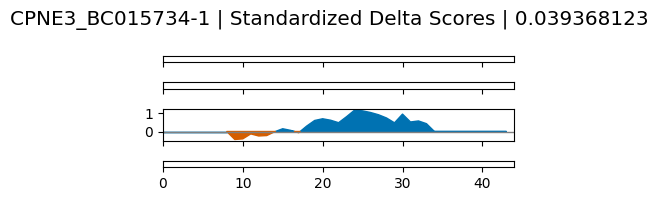

RBMS1_BC065192-1_BC080620-1 RBMS1_BC065192-1_BC080620-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBMS1_BC065192-1_BC080620-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


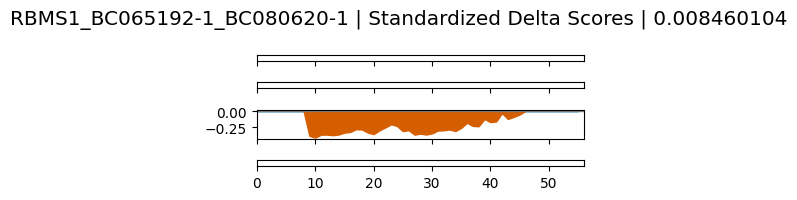

NOP10_BC008886-2 NOP10_BC008886-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOP10_BC008886-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Nop10p: 3-52
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


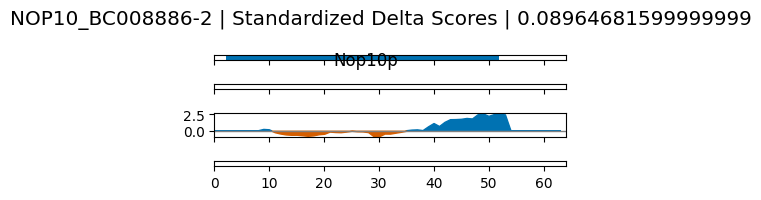

RPS28_BC000354-1_BC021239-2 RPS28_BC000354-1_BC021239-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS28_BC000354-1_BC021239-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S28e: 7-68
Low complexity coordinates: 
sig peak regions (p<0.05): 36-55
sig peak regions (p<0.001): 


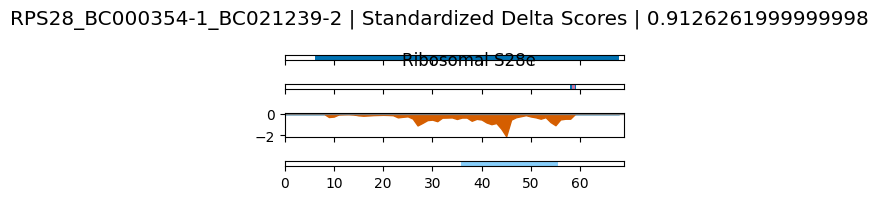

RBM26_BC000791-2 RBM26_BC000791-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM26_BC000791-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


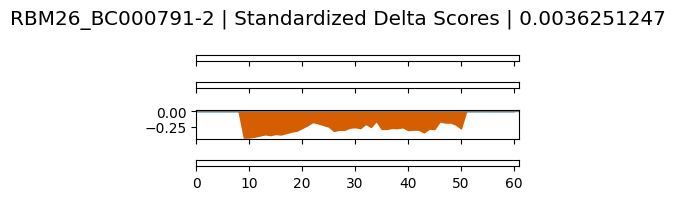

RPS21_BC027976-1 RPS21_BC027976-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS21_BC027976-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S21e: 1-47
Low complexity coordinates: 
sig peak regions (p<0.05): 23-57
sig peak regions (p<0.001): 31-51


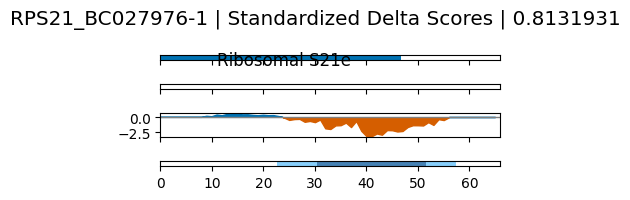

LSM6_BC016026-1 LSM6_BC016026-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LSM6_BC016026-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 10-74
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


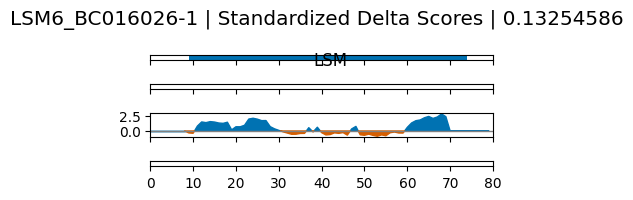

SNRPG_BC000070-2_BC022432-1_BC066302-1 SNRPG_BC000070-2_BC022432-1_BC066302-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNRPG_BC000070-2_BC022432-1_BC066302-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 8-71
Low complexity coordinates: 
sig peak regions (p<0.05): 28-66
sig peak regions (p<0.001): 


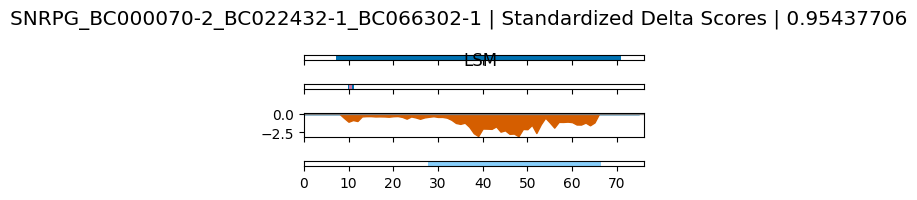

SECISBP2_BC001189-1 SECISBP2_BC001189-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SECISBP2_BC001189-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


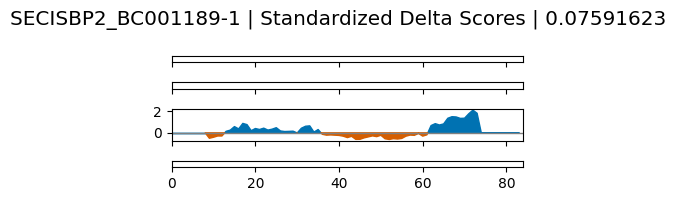

LSM5_BC005938-1 LSM5_BC005938-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LSM5_BC005938-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 17-84
Low complexity coordinates: 
sig peak regions (p<0.05): 43-81
sig peak regions (p<0.001): 52-71


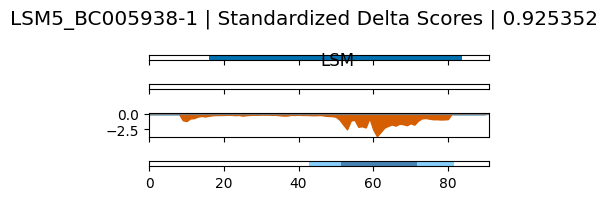

SNRPE_BC002639-2 SNRPE_BC002639-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNRPE_BC002639-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 24-88
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


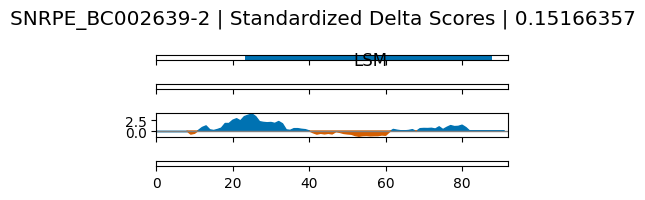

SNRPF_BC063397-1_BC128453-1 SNRPF_BC063397-1_BC128453-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNRPF_BC063397-1_BC128453-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 10-73
Low complexity coordinates: 12-13
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


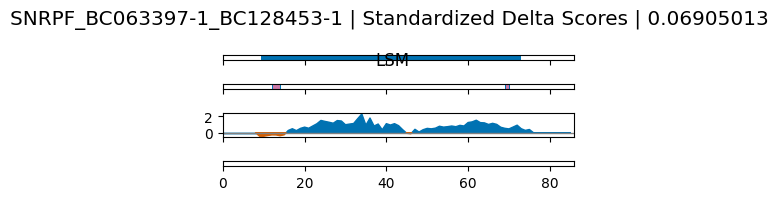

LSM2_BC009192-2 LSM2_BC009192-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LSM2_BC009192-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 6-71
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


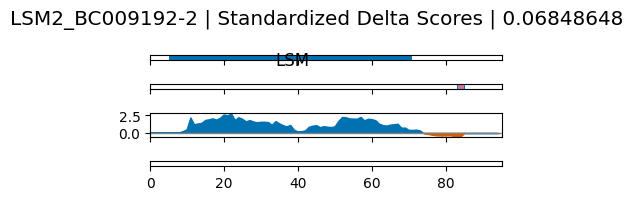

RPL36_BC004971-1 RPL36_BC004971-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL36_BC004971-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L36e: 4-99
Low complexity coordinates: 21-21, 76-76
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


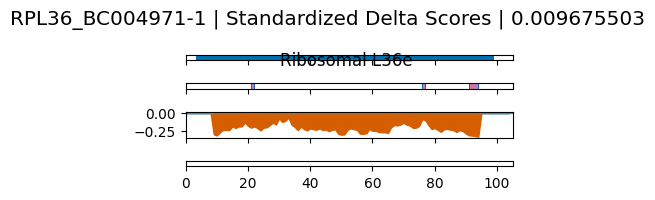

S100A4_BC016300-1 S100A4_BC016300-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/S100A4_BC016300-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
EF-hand_1: 55-80
S_100: 5-48
Low complexity coordinates: 27-27, 30-31, 35-35
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


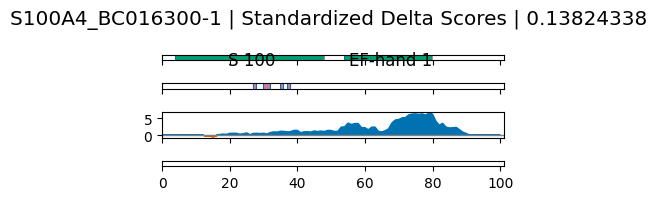

RPL5_BC001882-1 RPL5_BC001882-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL5_BC001882-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L5e: 14-98
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


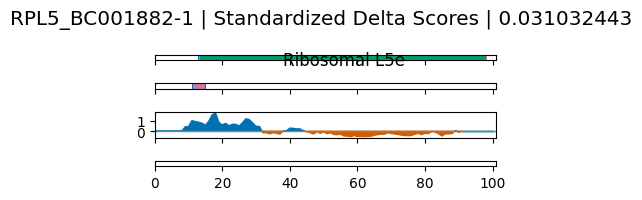

LSM3_BC007055-1 LSM3_BC007055-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LSM3_BC007055-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 21-96
Low complexity coordinates: 59-59, 61-69
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


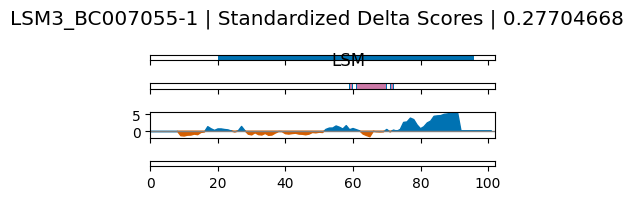

PHF5A_BC007321-2 PHF5A_BC007321-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PHF5A_BC007321-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PHF5: 1-104
Low complexity coordinates: 
sig peak regions (p<0.05): 44-68
sig peak regions (p<0.001): 


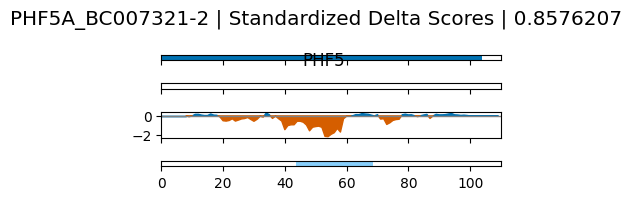

FAM32A_BC000639-1_BC017286-1 FAM32A_BC000639-1_BC017286-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FAM32A_BC000639-1_BC017286-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FAM32A: 3-75
Low complexity coordinates: 16-40
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


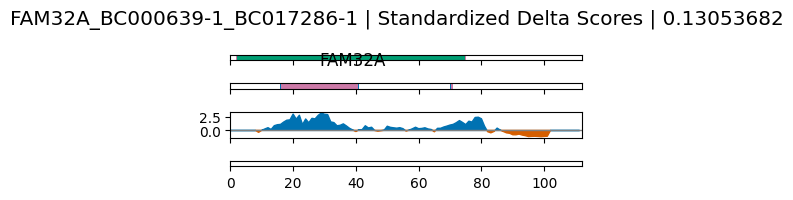

LSM10_BC007623-1 LSM10_BC007623-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LSM10_BC007623-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 20-83
Low complexity coordinates: 
sig peak regions (p<0.05): 25-51, 77-105
sig peak regions (p<0.001): 77-101


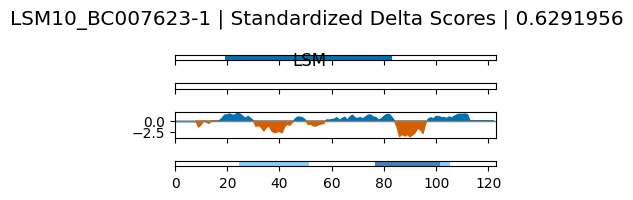

COA6_BC116455-1 COA6_BC116455-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/COA6_BC116455-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
COX6B: 48-103
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


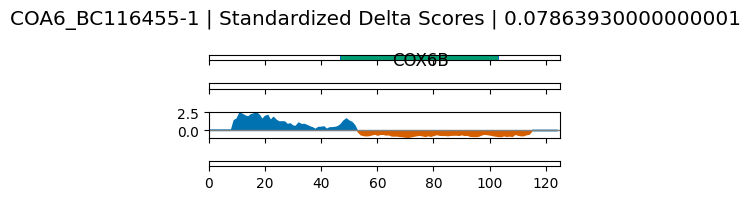

RPL31_BC017343-2 RPL31_BC017343-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL31_BC017343-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L31e: 19-100
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


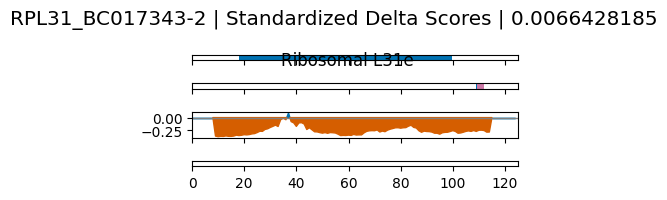

ERI3_BC001072-2 ERI3_BC001072-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ERI3_BC001072-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RNase_T: 1-110
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


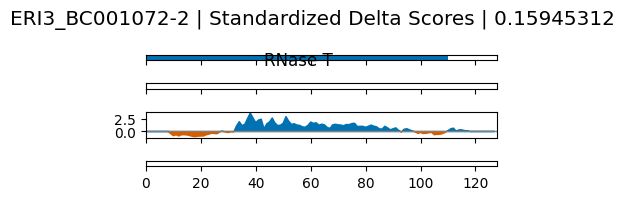

LSM1_BC001767-1 LSM1_BC001767-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LSM1_BC001767-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 10-75
Low complexity coordinates: 94-94
sig peak regions (p<0.05): 0-21
sig peak regions (p<0.001): 


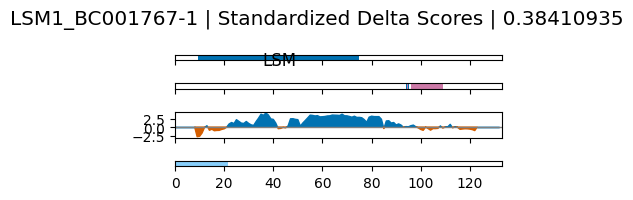

RPS24_BC000523-2 RPS24_BC000523-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS24_BC000523-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S24e: 24-101
Low complexity coordinates: 59-65, 104-109, 113-114
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


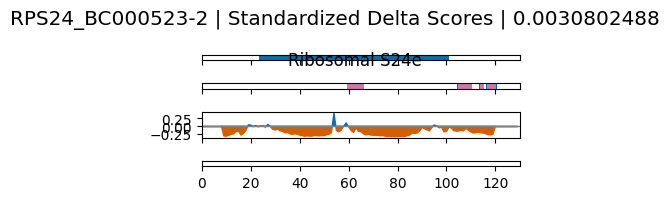

NHP2L1_BC019282-2 NHP2L1_BC019282-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NHP2L1_BC019282-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L7Ae: 21-111
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


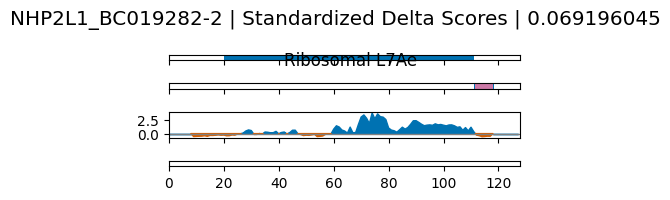

LLPH_BC006002-1 LLPH_BC006002-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LLPH_BC006002-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Laps: 3-119
Low complexity coordinates: 10-20, 23-24, 59-59, 63-69, 73-77
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


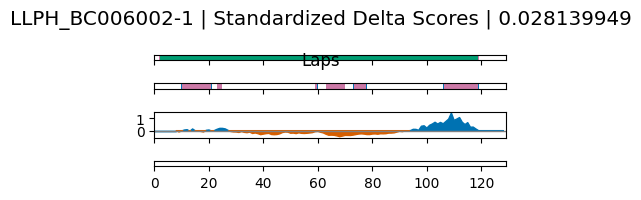

RPL28_BC010173-2_BC011582-1 RPL28_BC010173-2_BC011582-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL28_BC010173-2_BC011582-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L28e: 5-120
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


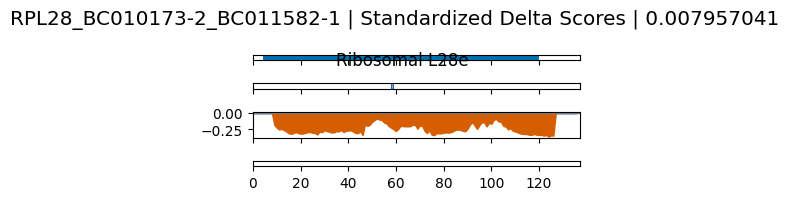

RPL27_BC001700-2_BC002588-2_BC007273-1_BC010026-2 RPL27_BC001700-2_BC002588-2_BC007273-1_BC010026-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL27_BC001700-2_BC002588-2_BC007273-1_BC010026-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L27e: 52-136
KOW: 7-36
Low complexity coordinates: 59-64, 67-68, 107-107, 109-110
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


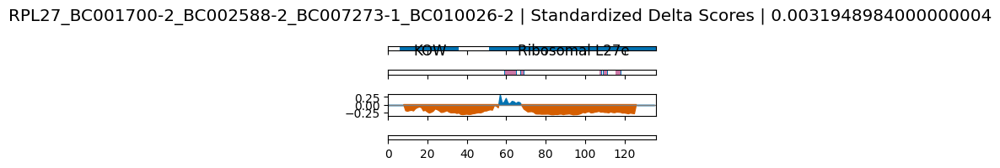

HRSP12_BC010280-1_BC012592-1 HRSP12_BC010280-1_BC012592-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HRSP12_BC010280-1_BC012592-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribonuc_L-PSP: 12-128
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


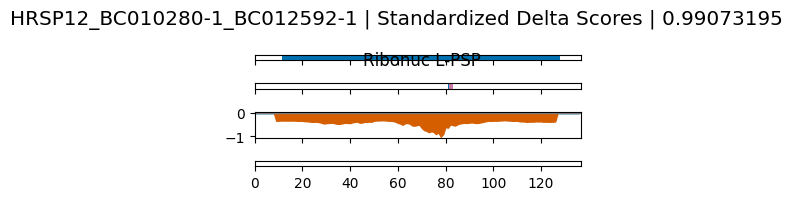

MRPL42_BC040240-2 MRPL42_BC040240-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL42_BC040240-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MRP-S32: 48-142
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


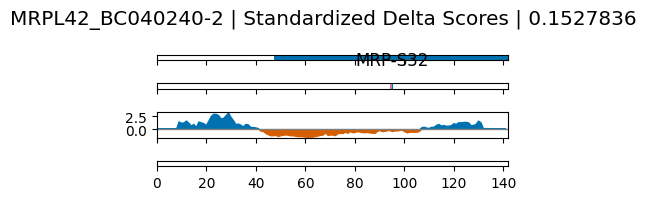

UBE2I_BC000427-2_BC051289-1 UBE2I_BC000427-2_BC051289-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/UBE2I_BC000427-2_BC051289-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
UQ_con: 8-151
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


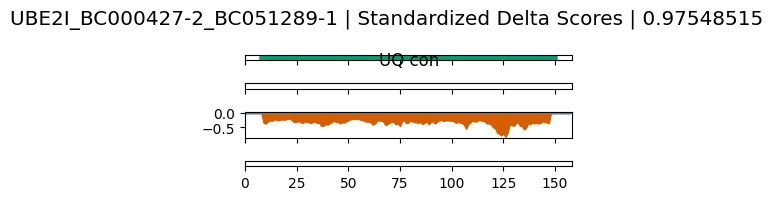

C1orf131_BC036800-1 C1orf131_BC036800-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/C1orf131_BC036800-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DUF4602: 126-243
Low complexity coordinates: 11-16, 38-41, 63-63, 100-100, 200-200, 203-203, 206-223
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


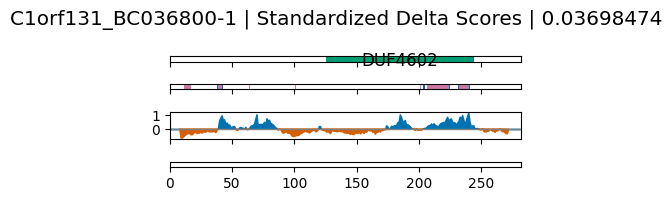

DHX57_BC060778-1 DHX57_BC060778-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX57_BC060778-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RWD: 144-316
Low complexity coordinates: 20-30, 33-35, 308-315, 317-318, 367-367, 371-371, 375-379, 381-382
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


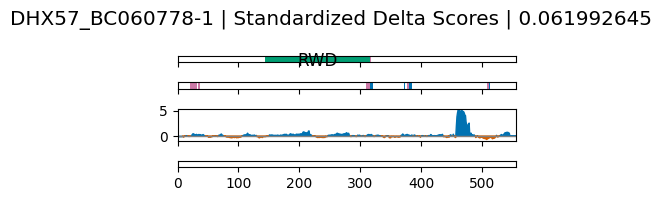

ILF3_BC064836-1 ILF3_BC064836-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ILF3_BC064836-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DZF_C: 225-356
dsrm: 531-592
DZF_N: 11-221
dsrm: 411-464
Low complexity coordinates: 93-119, 377-396, 477-480, 485-507, 576-578, 580-582, 586-595, 610-615, 617-617, 620-624, 629-634, 637-640, 643-685
sig peak regions (p<0.05): 662-696
sig peak regions (p<0.001): 


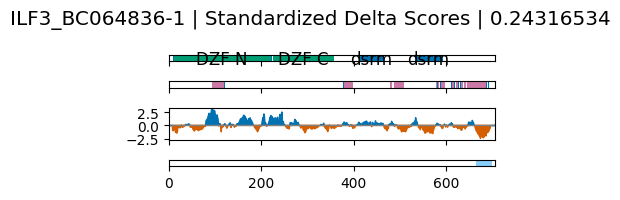

PTCD1_BC103495-1 PTCD1_BC103495-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PTCD1_BC103495-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PPR_3: 574-618
PPR_2: 521-565
PPR_long: 167-335
Low complexity coordinates: 56-57, 76-80, 82-84, 87-90, 230-230, 235-237, 356-356, 360-360, 391-394, 401-401, 403-403, 425-429, 431-443, 449-453, 497-503, 515-515, 535-535, 537-538, 540-542
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


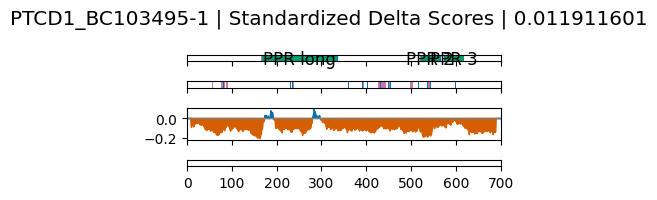

RBM14_BC000488-2 RBM14_BC000488-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM14_BC000488-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 81-142
RRM_1: 3-61
Low complexity coordinates: 54-56, 129-129, 156-158, 169-181, 186-189, 205-205, 211-216, 221-221, 223-225, 227-231, 246-248, 284-457, 459-459, 477-538, 543-547, 560-560, 576-576, 580-581, 608-617, 621-621
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


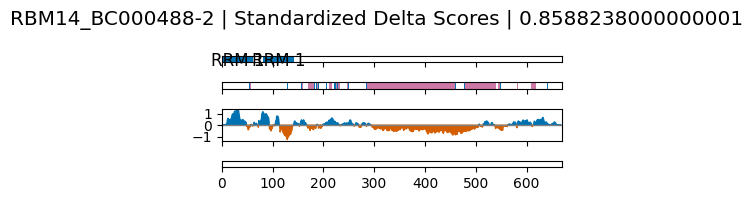

NOL10_BC005125-2 NOL10_BC005125-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOL10_BC005125-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NUC153: 482-508
Low complexity coordinates: 35-36, 446-446, 449-457, 459-466, 512-514, 517-555, 562-580, 649-651, 655-664, 667-667
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


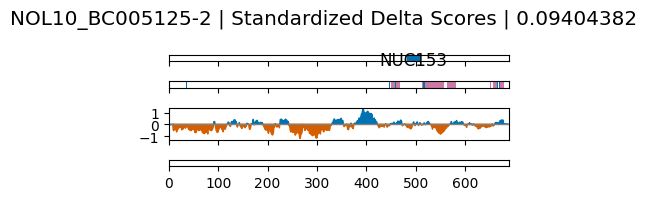

DDX50_BC000272-1 DDX50_BC000272-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX50_BC000272-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 385-483
GUCT: 571-665
DEAD: 162-334
Low complexity coordinates: 21-39, 111-112, 114-116, 120-122, 287-287, 561-563, 570-570
sig peak regions (p<0.05): 165-205, 261-312, 444-464
sig peak regions (p<0.001): 


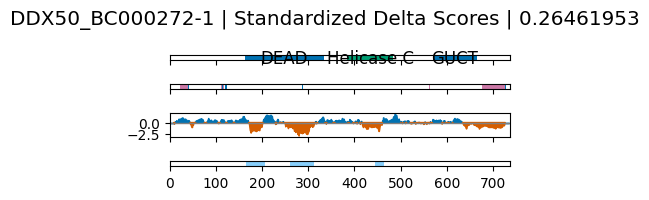

APEH_BC000362-2 APEH_BC000362-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/APEH_BC000362-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
APEH_N: 42-286
Peptidase_S9: 523-731
Low complexity coordinates: 15-18, 20-22, 253-253, 379-381, 397-399, 402-404
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


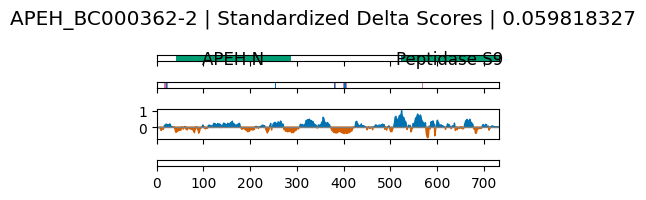

IFI16_BC017059-1 IFI16_BC017059-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/IFI16_BC017059-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PYRIN: 10-80
HIN: 519-684
HIN: 201-369
Low complexity coordinates: 73-77, 79-79, 82-84, 87-93, 106-106, 110-116, 125-137, 139-139, 143-143, 157-166, 169-171, 173-179, 266-267, 270-271, 413-413, 427-429, 431-431, 437-437, 440-441
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


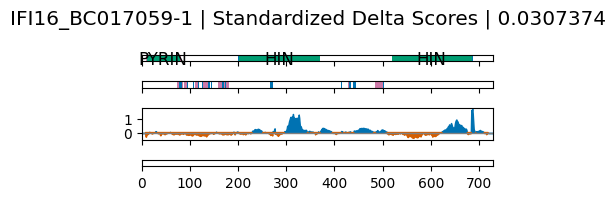

LARP4B_BC131630-1 LARP4B_BC131630-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LARP4B_BC131630-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
La: 160-216
Low complexity coordinates: 36-36, 38-43, 76-83, 96-97, 118-118, 212-212, 306-306, 310-311, 341-343, 346-346, 350-352, 386-386, 481-487, 501-501, 511-534, 581-582, 584-584, 586-593, 663-666, 687-692
sig peak regions (p<0.05): 22-47, 212-231, 241-314, 320-399
sig peak regions (p<0.001): 241-310


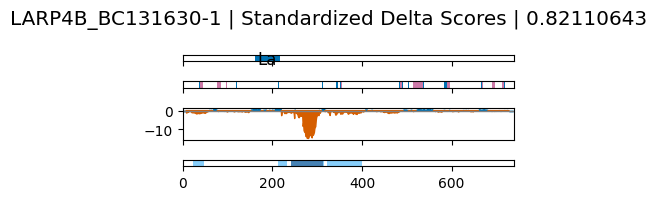

RBM12B_BC039260-1 RBM12B_BC039260-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM12B_BC039260-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 288-352
RRM_1: 157-215
RRM_1: 402-470
Low complexity coordinates: 30-31, 36-37, 39-46, 48-48, 94-97, 268-274, 426-427, 431-431, 433-434, 544-544, 547-618, 620-620, 631-646, 648-650, 656-666, 692-693, 696-699, 701-701, 726-732, 736-748, 751-751
sig peak regions (p<0.05): 150-206, 386-424
sig peak regions (p<0.001): 


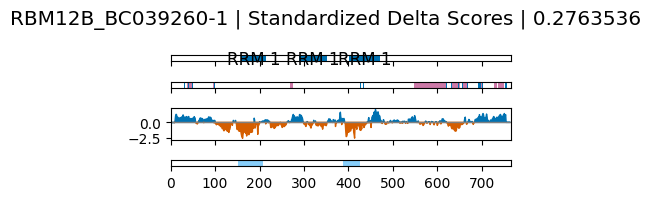

DNTTIP2_BC130622-1 DNTTIP2_BC130622-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DNTTIP2_BC130622-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Fcf2: 638-731
Low complexity coordinates: 10-23, 45-45, 66-70, 72-72, 77-78, 80-81, 87-87, 125-127, 131-131, 133-134, 142-142, 181-194, 197-197, 320-327, 332-332, 400-401, 404-408, 443-443, 445-454, 456-456, 458-458, 510-542, 545-545, 548-548, 552-552, 558-558, 560-560, 562-562, 564-565, 593-595
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


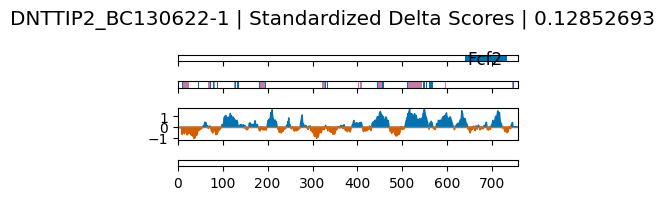

HTATSF1_BC009896-2 HTATSF1_BC009896-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HTATSF1_BC009896-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 135-212
RRM_1: 289-343
Low complexity coordinates: 32-33, 36-38, 102-110, 112-112, 194-194, 225-239, 369-373, 387-390, 392-393, 396-396, 398-398, 430-433, 435-442, 444-477, 492-495, 502-505, 509-510, 517-523, 528-558, 562-563, 565-721, 732-738, 741-741
sig peak regions (p<0.05): 141-160
sig peak regions (p<0.001): 


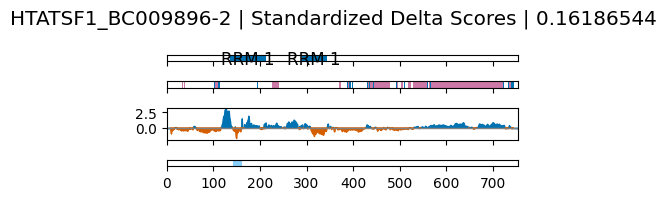

NOC2L_BC003555-1 NOC2L_BC003555-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOC2L_BC003555-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Noc2: 328-622
Low complexity coordinates: 20-22, 24-28, 31-31, 33-40, 49-58, 92-92, 94-99, 101-104, 106-115, 118-133, 632-632, 655-659, 666-666, 696-718
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


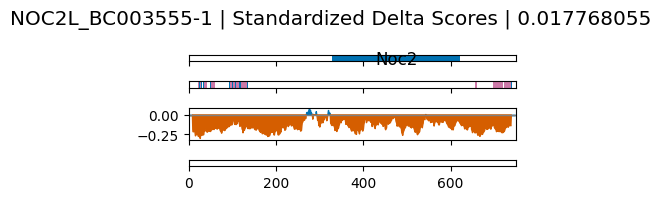

RBM28_BC013889-2 RBM28_BC013889-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM28_BC013889-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 492-562
RRM_1: 337-394
RRM_1: 6-67
RRM_1: 116-184
Low complexity coordinates: 80-85, 88-113, 192-192, 208-211, 213-252, 268-269, 282-303, 349-353, 356-356, 422-422, 587-592, 610-622, 628-628, 685-690, 694-700, 702-705, 709-709, 711-712
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


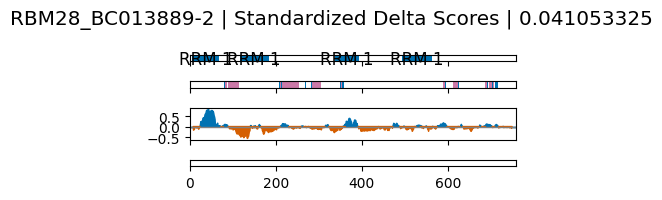

DIEXF_BC022964-1 DIEXF_BC022964-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DIEXF_BC022964-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
UTP25: 276-751
Low complexity coordinates: 11-15, 49-63, 82-113, 115-127, 143-148, 171-173, 271-271, 273-273, 336-339
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


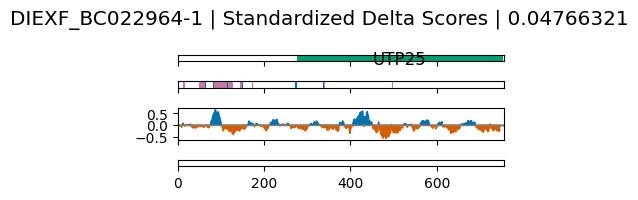

SUPV3L1_BC036112-1 SUPV3L1_BC036112-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SUPV3L1_BC036112-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SUV3_C: 625-670
Helicase_C: 364-474
Suv3_N: 62-179
Suv3_C_1: 558-598
Low complexity coordinates: 12-14, 19-19, 42-47, 51-52, 701-710, 724-724, 756-757
sig peak regions (p<0.05): 273-313, 406-432
sig peak regions (p<0.001): 


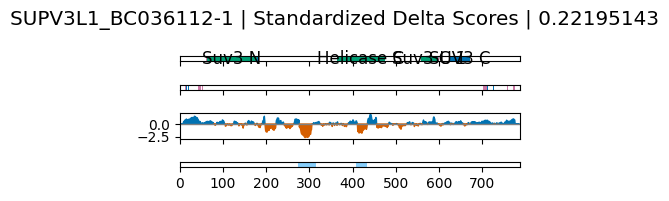

ERCC3_BC008820-2 ERCC3_BC008820-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ERCC3_BC008820-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ERCC3_RAD25_C: 496-735
Helicase_C_3: 76-201
ResIII: 315-471
Low complexity coordinates: 10-20, 26-32, 211-225, 252-271, 706-706, 714-721, 732-734, 739-745
sig peak regions (p<0.05): 422-460, 545-576
sig peak regions (p<0.001): 


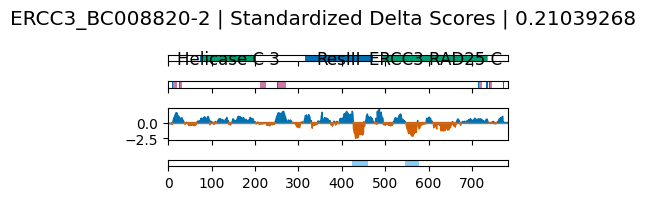

SF3A1_BC001976-1_BC007684-2 SF3A1_BC001976-1_BC007684-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SF3A1_BC001976-1_BC007684-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ubiquitin: 722-788
Surp: 164-215
PRP21_like_P: 233-472
Surp: 50-101
Low complexity coordinates: 10-29, 114-142, 146-146, 148-148, 150-152, 154-154, 252-265, 292-292, 320-340, 350-357, 360-381, 384-384, 397-404, 486-490, 518-519, 521-522, 549-610, 615-615, 618-619, 621-677
sig peak regions (p<0.05): 616-649
sig peak regions (p<0.001): 


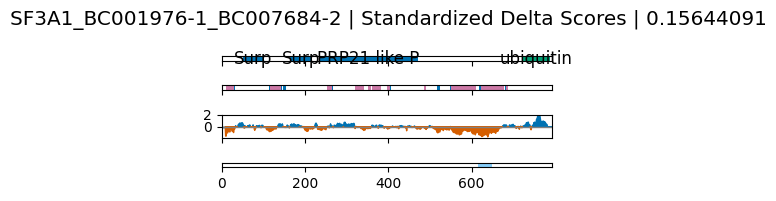

DDX20_BC031062-1 DDX20_BC031062-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX20_BC031062-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 87-250
Helicase_C: 296-404
Low complexity coordinates: 10-28, 64-64, 66-66, 502-505, 507-509, 550-550, 646-669, 673-674, 676-676, 735-737
sig peak regions (p<0.05): 90-110, 189-230, 331-433, 609-629
sig peak regions (p<0.001): 366-385


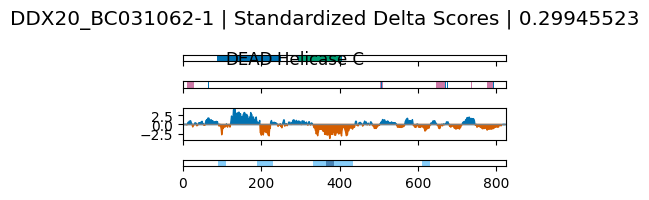

ELAC2_BC001939-1 ELAC2_BC001939-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ELAC2_BC001939-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Lactamase_B_4: 61-120
Lactamase_B_2: 512-725
Low complexity coordinates: 18-18, 33-38, 202-216, 274-274, 341-342, 544-544, 686-686, 688-691, 694-695, 777-777
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


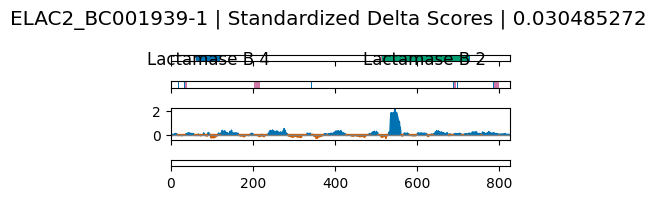

EEF2_BC126259-1 EEF2_BC126259-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EEF2_BC126259-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU_D2: 411-484
EFG_C: 739-826
EFG_IV: 622-737
EFG_III: 503-564
GTP_EFTU: 18-230
Low complexity coordinates: 124-128, 130-132, 316-328, 544-548
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


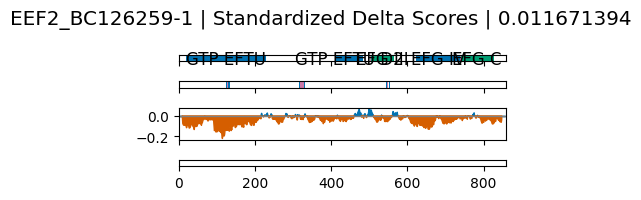

TOP3B_BC002432-2 TOP3B_BC002432-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TOP3B_BC002432-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Topoisom_bac: 170-582
Toprim: 4-154
Low complexity coordinates: 21-21, 286-286, 755-755
sig peak regions (p<0.05): 100-136, 168-187, 195-238, 249-278, 297-350, 481-526, 635-664, 684-710, 758-793
sig peak regions (p<0.001): 117-136, 302-340, 687-709, 761-780


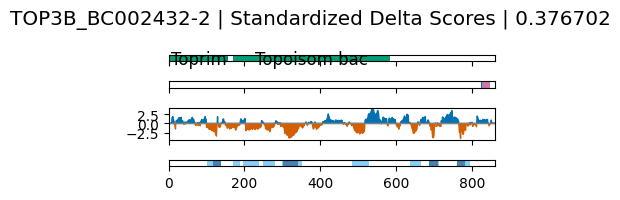

PIWIL4_BC031060-1 PIWIL4_BC031060-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PIWIL4_BC031060-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ArgoL1: 222-268
Piwi: 546-838
ArgoN: 105-192
PAZ: 274-405
Low complexity coordinates: 44-44, 173-173, 628-628
sig peak regions (p<0.05): 327-353, 489-533
sig peak regions (p<0.001): 


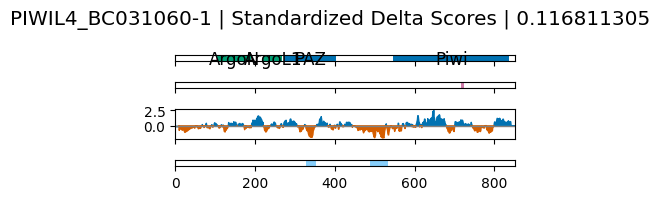

TDRD9_BC128057-1 TDRD9_BC128057-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TDRD9_BC128057-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HA2_N: 282-318
Helicase_C: 100-215
TUDOR: 619-728
HA2_C: 321-379
Low complexity coordinates: 273-273, 318-318, 612-614, 660-662, 761-766
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


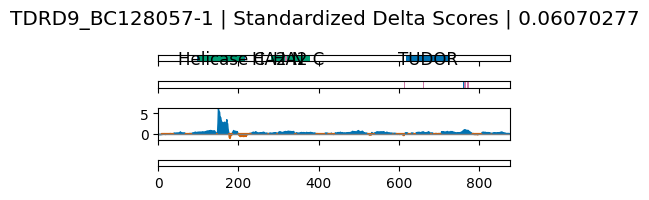

PIWIL1_BC028581-2 PIWIL1_BC028581-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PIWIL1_BC028581-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ArgoL1: 228-274
PAZ: 280-412
Piwi: 555-847
GAGE: 1-108
ArgoN: 112-199
Low complexity coordinates: 10-18, 31-35, 37-37, 39-39, 42-49, 53-53, 55-55, 57-59, 368-368
sig peak regions (p<0.05): 251-270, 534-554, 679-719
sig peak regions (p<0.001): 


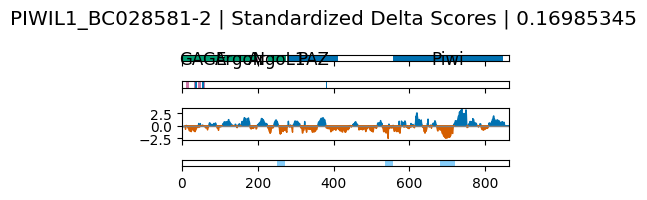

RBM12_BC012787-2_BC013981-2 RBM12_BC012787-2_BC013981-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM12_BC012787-2_BC013981-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 432-499
RRM_1: 859-928
RRM_1: 548-613
Low complexity coordinates: 64-64, 104-114, 119-119, 122-133, 162-163, 165-279, 290-290, 328-328, 404-407, 409-419, 638-695, 719-745, 747-748, 750-750, 760-846
sig peak regions (p<0.05): 241-275, 279-300, 639-700, 748-824, 891-924
sig peak regions (p<0.001): 774-798


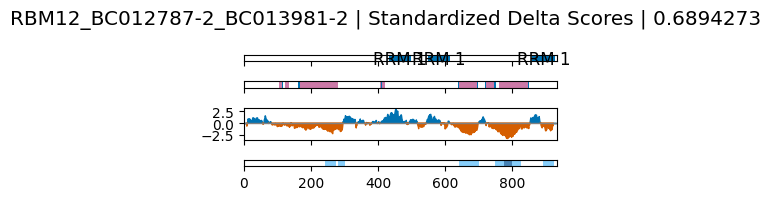

PIWIL2_BC025995-1 PIWIL2_BC025995-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PIWIL2_BC025995-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PAZ: 391-523
ArgoL1: 339-386
Piwi: 669-956
Low complexity coordinates: 146-146, 148-155
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


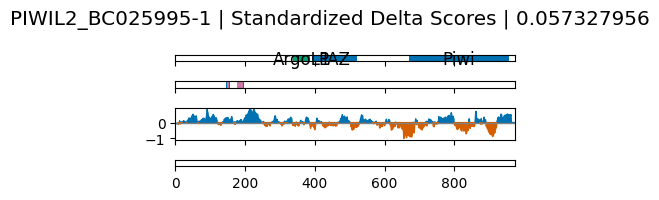

EIF3C_BC001571-1 EIF3C_BC001571-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF3C_BC001571-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
eIF-3c_N: 31-705
PCI: 713-846
Low complexity coordinates: 10-18, 48-48, 121-123, 125-127, 136-136, 168-186, 214-244, 262-262, 264-289, 291-302, 305-306, 355-361, 534-534, 641-642, 645-662, 860-860
sig peak regions (p<0.05): 609-646, 784-828
sig peak regions (p<0.001): 


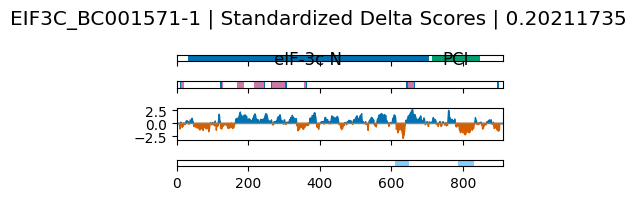

EFTUD2_BC002360-2 EFTUD2_BC002360-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EFTUD2_BC002360-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
EFG_III: 586-648
EFG_C: 826-914
EFTUD2: 4-110
GTP_EFTU: 129-344
GTP_EFTU_D2: 491-566
EFG_IV: 707-823
Low complexity coordinates: 13-16, 22-53, 83-85, 358-358
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


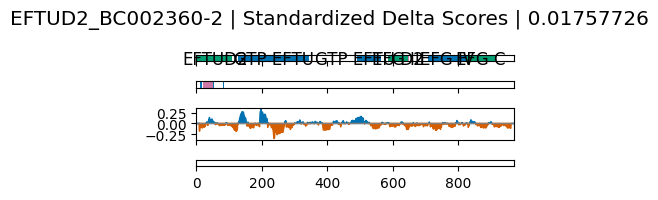

KIAA1324_BC125208-1 KIAA1324_BC125208-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/KIAA1324_BC125208-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ephrin_rec_like: 513-539
Ephrin_rec_like: 299-328
Low complexity coordinates: 19-24, 581-581, 775-775
sig peak regions (p<0.05): 750-776
sig peak regions (p<0.001): 


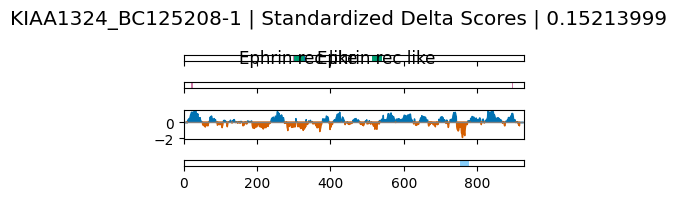

RBM19_BC004289-1_BC006137-1 RBM19_BC004289-1_BC006137-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM19_BC004289-1_BC006137-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 589-648
RRM_1: 834-905
RRM_1: 4-72
RRM_1: 404-473
RRM_1: 732-804
RRM_1: 302-362
Low complexity coordinates: 34-35, 39-43, 48-49, 91-95, 97-99, 102-111, 117-125, 179-194, 196-196, 212-215, 217-240, 268-269, 273-275, 277-282, 398-398, 487-503, 683-698, 700-700, 705-727, 753-754, 756-756, 758-760, 820-820, 822-822
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


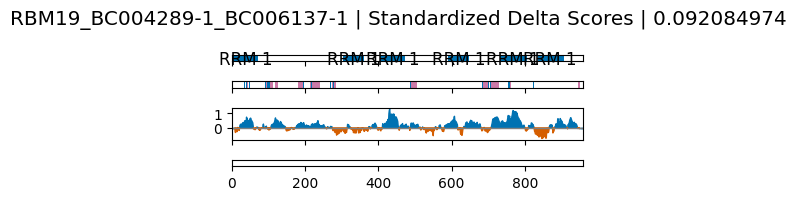

ACTN4_BC005033-1 ACTN4_BC005033-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ACTN4_BC005033-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Spectrin: 530-639
EFhand_Ca_insen: 841-907
EF-hand_7: 770-836
Spectrin: 293-402
Spectrin: 413-517
Spectrin: 650-751
CH: 164-269
CH: 51-154
Low complexity coordinates: 12-28, 30-30
sig peak regions (p<0.05): 0-40
sig peak regions (p<0.001): 0-39


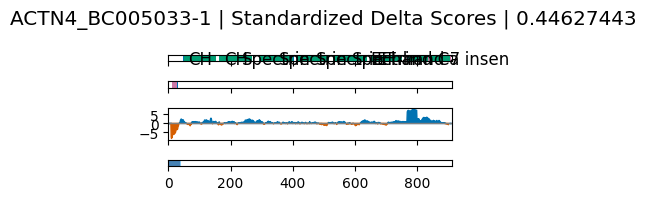

RBM15_BC103493-1 RBM15_BC103493-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM15_BC103493-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 181-245
RRM_1: 457-517
SPOC: 781-954
RRM_1: 376-443
Low complexity coordinates: 10-11, 62-103, 108-160, 162-162, 224-224, 274-296, 302-332, 346-346, 445-445, 460-462, 559-561, 563-586, 591-591, 593-599, 616-638, 648-648, 651-652, 654-654, 663-665, 668-672, 676-701, 719-719, 724-724, 750-750, 753-764
sig peak regions (p<0.05): 479-506, 866-885
sig peak regions (p<0.001): 


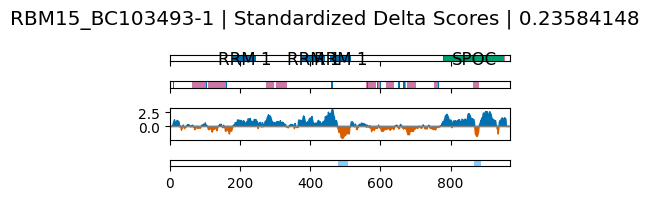

THRAP3_BC112330-1 THRAP3_BC112330-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/THRAP3_BC112330-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
THRAP3_BCLAF1: 123-792
Low complexity coordinates: 10-57, 71-71, 74-185, 238-246, 248-249, 251-287, 290-290, 297-299, 301-301, 304-304, 309-325, 327-335, 337-337, 357-367, 376-376, 378-378, 382-382, 424-429, 432-432, 436-438, 440-441, 487-504, 611-611, 613-614, 720-749, 751-807, 828-861, 899-900, 902-910
sig peak regions (p<0.05): 0-36, 104-123, 132-172, 210-233, 264-307, 310-340, 415-436
sig peak regions (p<0.001): 


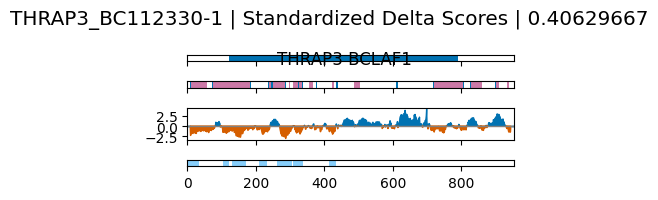

RBM10_BC004181-2_BC008733-2_BC024153-2 RBM10_BC004181-2_BC008733-2_BC024153-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM10_BC004181-2_BC008733-2_BC024153-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 302-361
zf-RanBP: 215-241
RRM_1: 132-190
OCRE: 568-618
G-patch: 859-901
Low complexity coordinates: 10-19, 29-33, 37-39, 56-69, 74-74, 78-93, 98-99, 101-101, 104-125, 254-254, 256-269, 273-287, 354-355, 361-361, 398-419, 442-444, 465-472, 478-478, 503-503, 506-520, 540-540, 544-556, 559-559, 563-563, 567-567, 569-573, 579-581, 586-590, 594-599, 631-646, 739-744, 748-748, 796-796, 822-831
sig peak regions (p<0.05): 200-241, 504-528
sig peak regions (p<0.001): 214-233


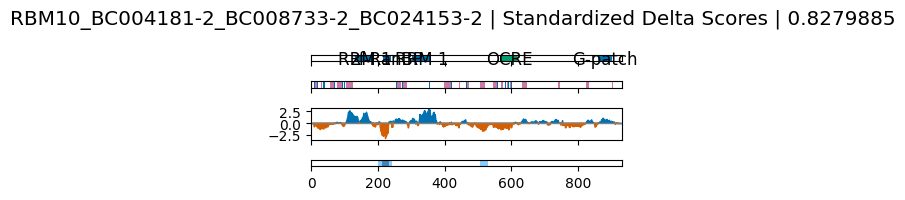

PWP2_BC013309-2_BC014988-1 PWP2_BC013309-2_BC014988-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PWP2_BC013309-2_BC014988-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 368-401
Utp12: 770-874
WD40: 407-443
WD40: 492-529
Low complexity coordinates: 89-94, 97-97, 100-102, 235-252, 259-260, 262-262, 318-318, 329-332, 334-336, 411-429, 596-596, 795-795, 801-802
sig peak regions (p<0.05): 197-216, 378-412, 431-455, 467-546
sig peak regions (p<0.001): 503-545


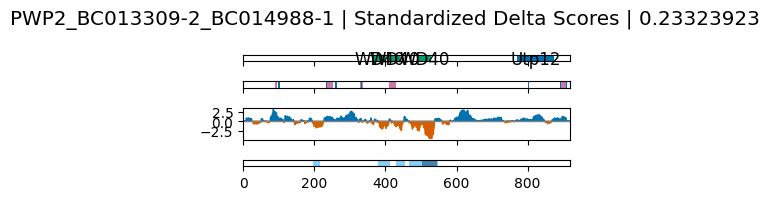

DHX16_BC008825-2_BC009392-2 DHX16_BC008825-2_BC009392-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX16_BC008825-2_BC009392-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
OB_NTP_bind: 939-1015
DEAD: 406-556
HA2_N: 792-820
Helicase_C: 604-729
HA2_C: 821-881
Low complexity coordinates: 55-55, 72-72, 74-74, 76-108, 112-113, 115-115, 119-154, 159-181, 183-183, 210-211, 231-253, 255-255, 273-273, 275-275, 283-283, 323-328, 336-336, 377-377, 458-458, 460-463, 559-560, 571-572, 723-723, 725-725, 787-800, 915-915, 917-921, 923-923, 1021-1023
sig peak regions (p<0.05): 501-539
sig peak regions (p<0.001): 


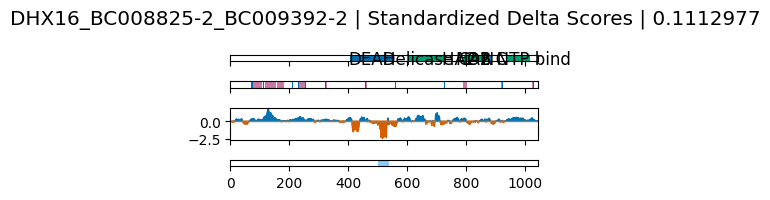

DHX36_BC036035-1 DHX36_BC036035-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX36_BC036035-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HA2_N: 670-698
DEAD: 212-372
HA2_C: 699-748
Helicase_C: 477-606
OB_NTP_bind: 802-887
Low complexity coordinates: 12-55, 82-86, 177-186, 271-278, 280-280, 468-468, 556-557, 631-631, 636-637, 640-640
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


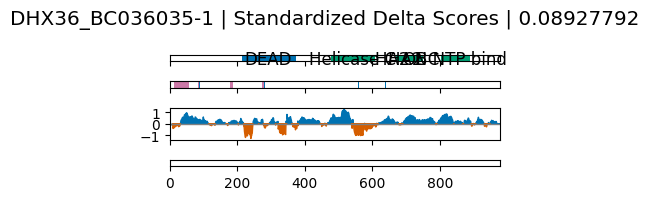

MAP4_BC008715-2_BC012794-2 MAP4_BC008715-2_BC012794-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MAP4_BC008715-2_BC012794-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Tubulin-binding: 819-849
Tubulin-binding: 758-779
Tubulin-binding: 850-880
Tubulin-binding: 881-911
Low complexity coordinates: 69-71, 155-155, 200-202, 206-216, 229-230, 259-260, 262-268, 343-344, 423-423, 430-430, 432-437, 531-531, 574-593, 595-600, 602-655, 664-664, 667-668, 687-701, 708-709, 712-712, 714-716, 718-718, 729-729, 731-735, 741-749, 784-787, 789-795, 814-816, 818-818, 826-827, 858-858, 862-864, 868-868, 917-920, 922-943, 946-946
sig peak regions (p<0.05): 1-20, 415-434, 608-656, 703-722
sig peak regions (p<0.001): 


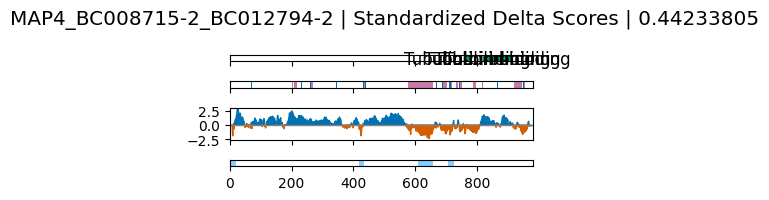

FAM208A_BC129987-1 FAM208A_BC129987-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FAM208A_BC129987-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 64-64, 165-166, 606-606, 608-617, 848-849, 948-953, 984-988
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


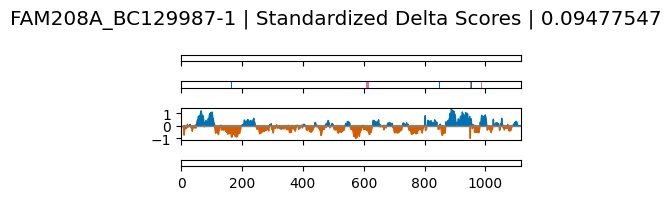

EIF5B_BC032639-1 EIF5B_BC032639-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF5B_BC032639-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU_D2: 870-944
GTP_EFTU: 632-843
GTP_EFTU_D4: 1091-1182
IF-2: 965-1069
Low complexity coordinates: 18-61, 63-64, 88-88, 91-122, 145-154, 156-158, 160-162, 164-169, 171-182, 185-185, 191-191, 204-207, 226-226, 230-269, 271-278, 302-336, 339-339, 341-341, 345-411, 414-419, 421-422, 442-445, 448-448, 450-450, 466-467, 471-471, 479-506, 521-611, 774-774, 782-782, 897-898
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


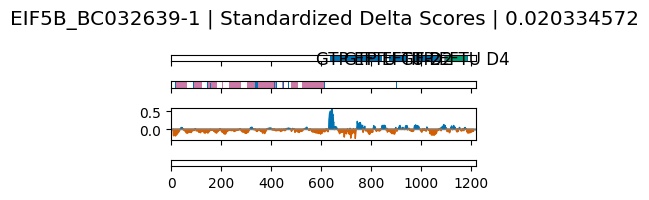

NAT10_BC035558-1 NAT10_BC035558-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NAT10_BC035558-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_RecD: 282-488
GNAT_acetyltr_2: 528-752
tRNA_bind_2: 763-975
TmcA_N: 9-201
Low complexity coordinates: 78-78, 137-137, 141-143, 233-233, 283-296, 298-298, 300-300, 391-391, 427-433, 438-452, 457-457, 560-560, 565-565, 568-568, 644-644, 687-687, 689-689, 695-699, 780-781, 815-815, 857-866, 916-917, 945-945
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


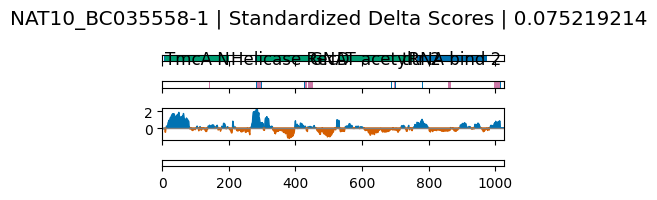

ZCCHC11_BC131734-1 ZCCHC11_BC131734-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZCCHC11_BC131734-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC: 1359-1375
zf-CCHC: 1294-1310
zf-CCHC: 914-930
NTP_transf_2: 979-1062
TUTase: 334-471
PAP_assoc: 1184-1237
PAP_assoc: 628-679
Low complexity coordinates: 46-52, 56-56, 115-126, 129-129, 132-136, 139-140, 145-151, 158-158, 226-229, 232-232, 241-250, 319-321, 327-333, 338-338, 342-354, 578-582, 592-598, 803-808, 812-812, 873-873, 876-879, 1025-1026, 1028-1029, 1176-1177, 1182-1183, 1315-1335, 1343-1352, 1354-1354, 1385-1401, 1406-1409, 1413-1413, 1415-1415, 1419-1464, 1468-1468, 1509-1514
sig peak regions (p<0.05): 287-336, 360-385, 953-972, 1274-1311, 1458-1538, 1553-1572
sig peak regions (p<0.001): 287-320, 1471-1492


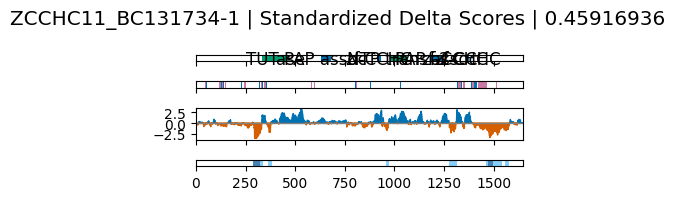

DCD_BC062682-1 DCD_BC062682-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DCD_BC062682-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Dermcidin: 21-104
Low complexity coordinates: 20-20, 71-88
sig peak regions (p<0.05): 19-41, 67-109
sig peak regions (p<0.001): 85-105


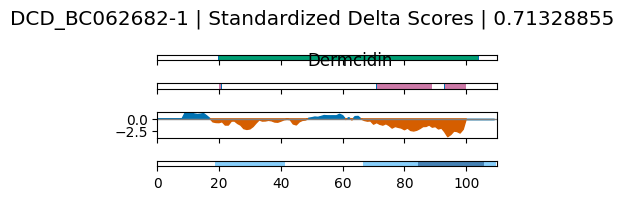

RPL32_BC011514-1 RPL32_BC011514-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL32_BC011514-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L32e: 17-124
Low complexity coordinates: 11-11
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


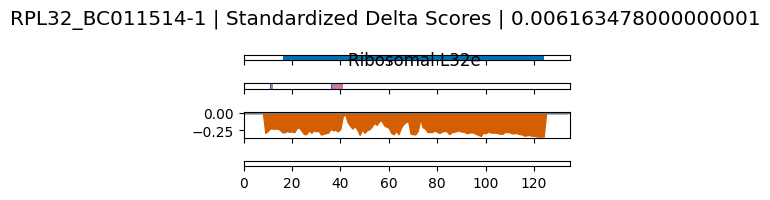

LGALS1_BC001693-1_BC020675-1 LGALS1_BC001693-1_BC020675-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LGALS1_BC001693-1_BC020675-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Gal-bind_lectin: 10-134
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


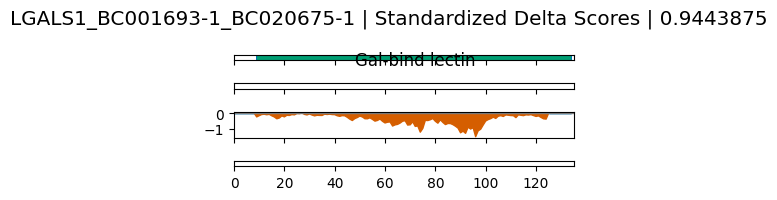

HEATR1_BC062442-1 HEATR1_BC062442-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HEATR1_BC062442-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


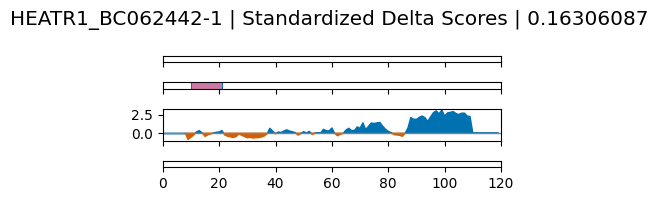

LSM4_BC000387-2_BC003652-2_BC022198-2_BC023665-2 LSM4_BC000387-2_BC003652-2_BC022198-2_BC023665-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LSM4_BC000387-2_BC003652-2_BC022198-2_BC023665-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 6-70
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


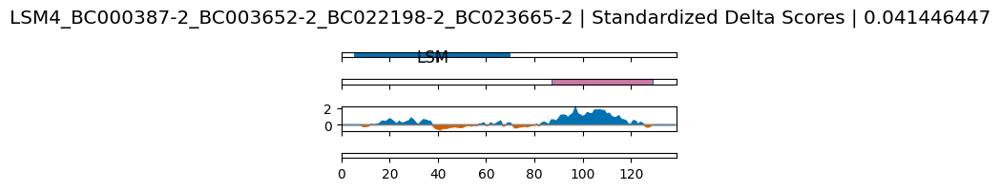

EDF1_BC015500-1 EDF1_BC015500-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EDF1_BC015500-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HTH_3: 81-132
MBF1: 4-73
Low complexity coordinates: 21-23, 130-133, 135-135
sig peak regions (p<0.05): 75-128
sig peak regions (p<0.001): 79-125


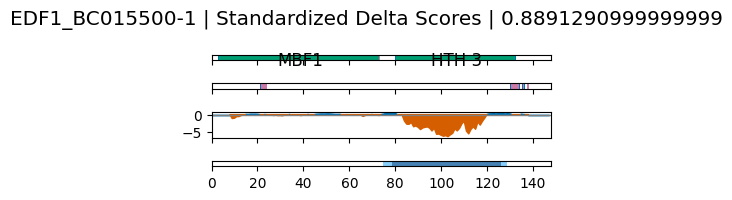

RBM3_BC006825-1 RBM3_BC006825-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM3_BC006825-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 8-78
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


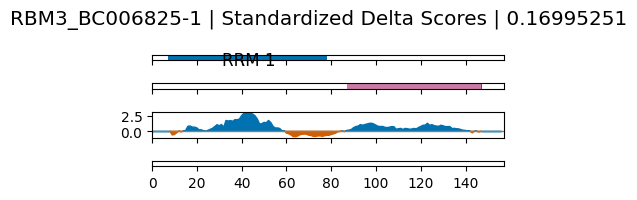

RPL23A_BC014459-1 RPL23A_BC014459-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL23A_BC014459-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L23eN: 17-67
Ribosomal_L23: 76-135
Low complexity coordinates: 10-32, 42-48, 50-53
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


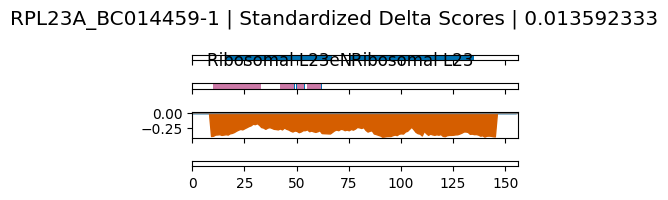

NHP2_BC000009-2_BC006387-2 NHP2_BC000009-2_BC006387-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NHP2_BC000009-2_BC006387-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L7Ae: 46-137
Low complexity coordinates: 50-51, 54-54, 58-58, 60-62, 64-66
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


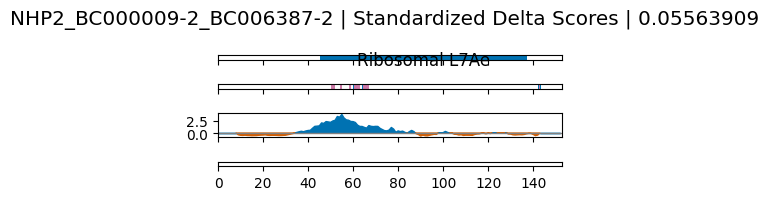

ILF3_BC003086-1 ILF3_BC003086-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ILF3_BC003086-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 66-66, 101-105, 115-123
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


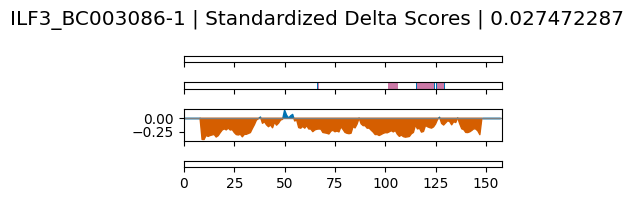

RPS11_BC007283-1_BC007603-1_BC007945-2_BC010028-2_BC010187-2_BC016378-1 RPS11_BC007283-1_BC007603-1_BC007945-2_BC010028-2_BC010187-2_BC016378-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS11_BC007283-1_BC007603-1_BC007945-2_BC010028-2_BC010187-2_BC016378-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S17: 75-144
Ribosomal_S17_N: 5-73
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


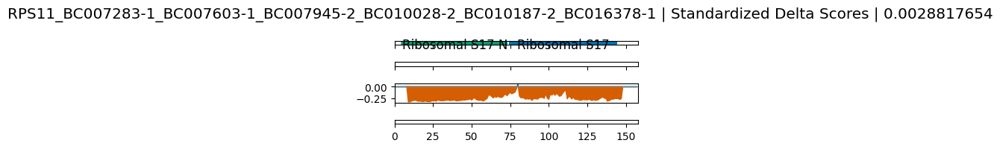

RPP21_BC011730-2 RPP21_BC011730-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPP21_BC011730-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Rpr2: 13-96
Low complexity coordinates: 
sig peak regions (p<0.05): 0-64
sig peak regions (p<0.001): 


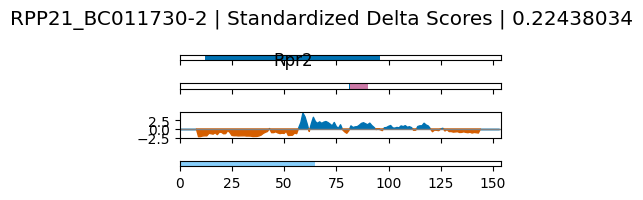

PPIA_BC000689-2_BC003026-1_BC005320-1_BC013915-1 PPIA_BC000689-2_BC003026-1_BC005320-1_BC013915-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PPIA_BC000689-2_BC003026-1_BC005320-1_BC013915-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pro_isomerase: 7-162
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


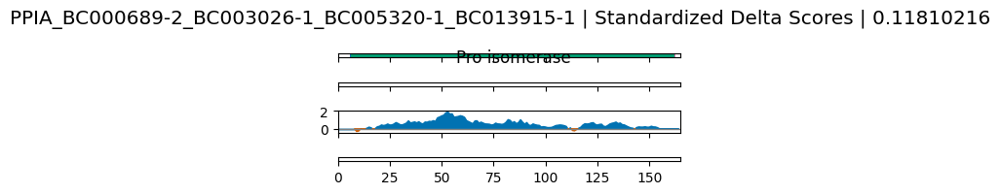

MRPL30_BC022391-1 MRPL30_BC022391-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL30_BC022391-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L30: 68-117
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


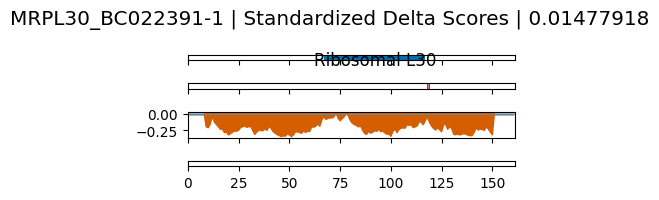

RPS10_BC001032-2_BC001955-1_BC005012-1 RPS10_BC001032-2_BC001955-1_BC005012-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS10_BC001032-2_BC001955-1_BC005012-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
S10_plectin: 3-97
Low complexity coordinates: 95-95, 100-113, 118-118
sig peak regions (p<0.05): 1-93
sig peak regions (p<0.001): 30-77


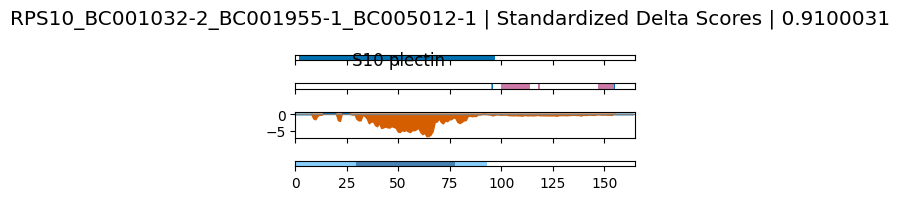

DNAJC2_BC056682-1 DNAJC2_BC056682-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DNAJC2_BC056682-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DnaJ: 88-128
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


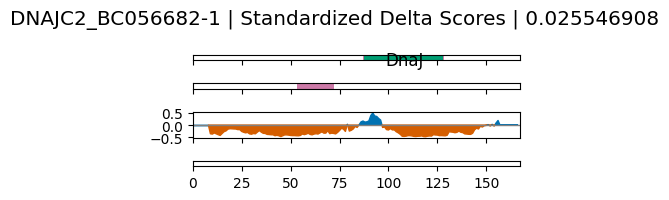

ZC3H7A_BC012575-1 ZC3H7A_BC012575-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZC3H7A_BC012575-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH: 101-122
zf-C2H2_jaz: 55-78
Low complexity coordinates: 
sig peak regions (p<0.05): 39-62
sig peak regions (p<0.001): 


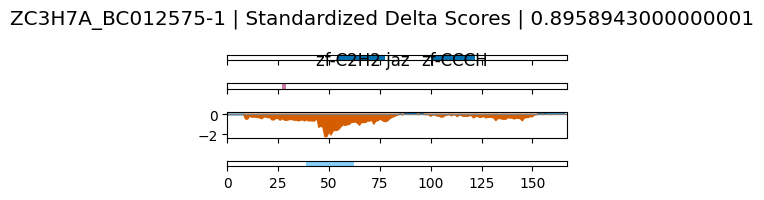

GTSF1_BC021179-1 GTSF1_BC021179-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GTSF1_BC021179-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-U11-48K: 48-71
zf-U11-48K: 14-38
Low complexity coordinates: 
sig peak regions (p<0.05): 0-29, 87-122
sig peak regions (p<0.001): 1-22, 103-122


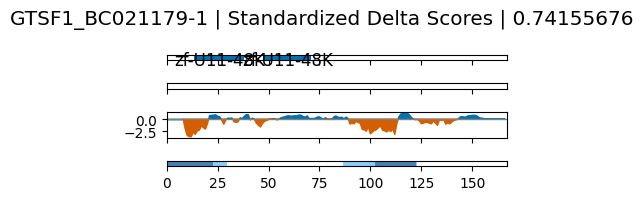

MRPL13_BC009190-2_BC021744-2 MRPL13_BC009190-2_BC021744-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL13_BC009190-2_BC021744-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L13: 17-132
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


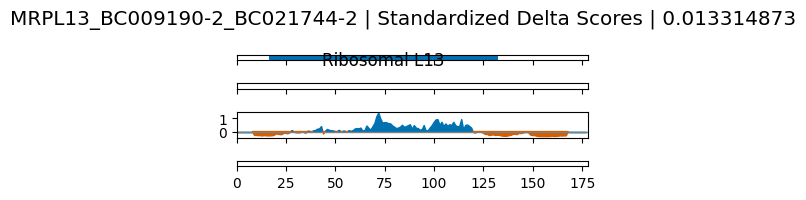

NOP56_BC004937-1 NOP56_BC004937-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOP56_BC004937-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 10-40, 42-69, 83-97, 99-99, 112-112, 136-136
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


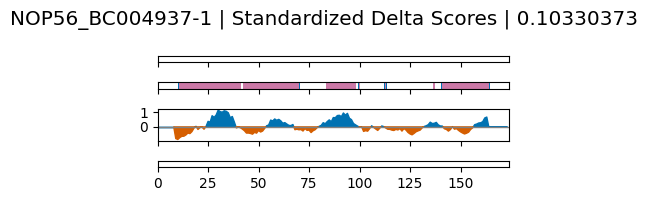

NPM3_BC054868-1 NPM3_BC054868-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NPM3_BC054868-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Nucleoplasmin: 38-138
Low complexity coordinates: 10-11
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


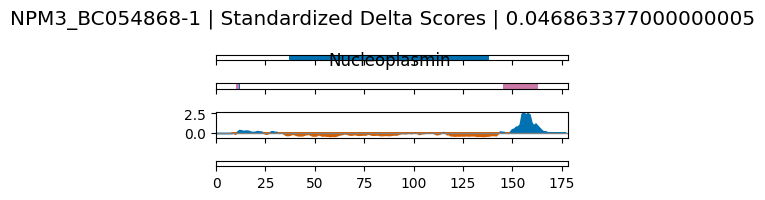

NIP7_BC015941-1 NIP7_BC015941-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NIP7_BC015941-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
UPF0113_N: 2-83
UPF0113: 96-175
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


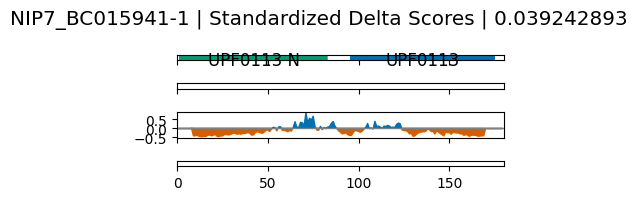

DDX60_BC020601-1 DDX60_BC020601-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX60_BC020601-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


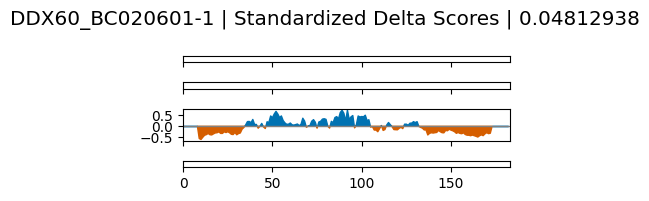

RPS7_BC002866-2_BC061901-1 RPS7_BC002866-2_BC061901-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS7_BC002866-2_BC061901-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S7e: 7-189
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


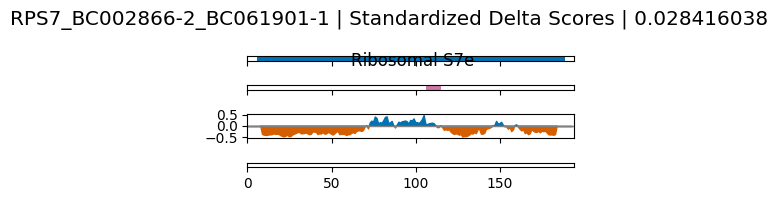

NANOS3_BC101209-2 NANOS3_BC101209-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NANOS3_BC101209-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-nanos: 77-129
Low complexity coordinates: 31-31, 33-33, 35-51
sig peak regions (p<0.05): 79-135, 144-165, 168-191
sig peak regions (p<0.001): 108-132


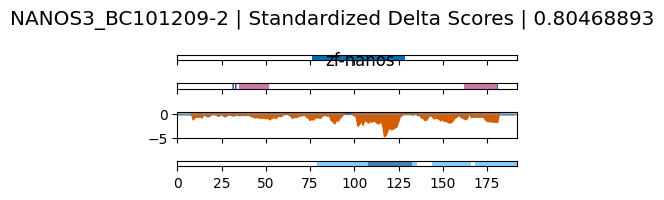

MRPS23_BC000242-1 MRPS23_BC000242-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPS23_BC000242-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MRP-S23: 2-129
Low complexity coordinates: 110-110
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


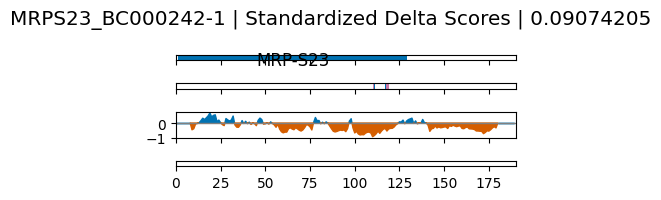

PPIL4_BC016984-1 PPIL4_BC016984-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PPIL4_BC016984-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SPT6_acidic: 58-106
Low complexity coordinates: 30-32, 34-34, 46-54, 57-58, 76-92, 136-141, 143-146, 148-151, 167-168
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


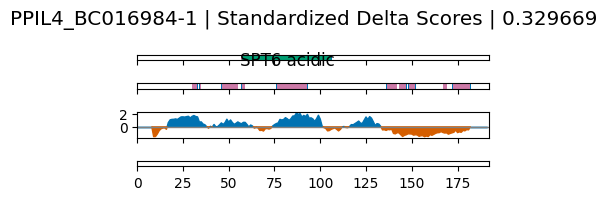

MRPL11_BC005002-1 MRPL11_BC005002-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL11_BC005002-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L11: 84-155
Ribosomal_L11_N: 20-78
Low complexity coordinates: 13-18, 23-23, 25-34, 143-150
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


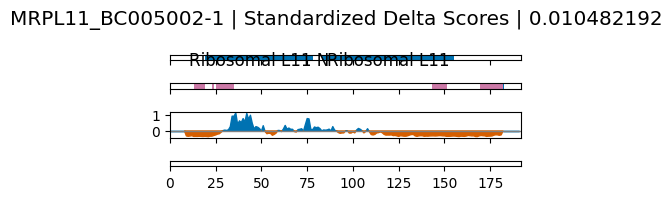

APOBEC3C_BC011739-2 APOBEC3C_BC011739-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/APOBEC3C_BC011739-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NAD2: 10-187
Low complexity coordinates: 
sig peak regions (p<0.05): 133-152
sig peak regions (p<0.001): 


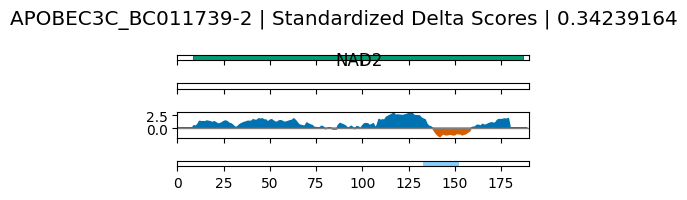

MRPL32_BC013147-1 MRPL32_BC013147-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL32_BC013147-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L32p: 79-130
Low complexity coordinates: 10-10, 36-36
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


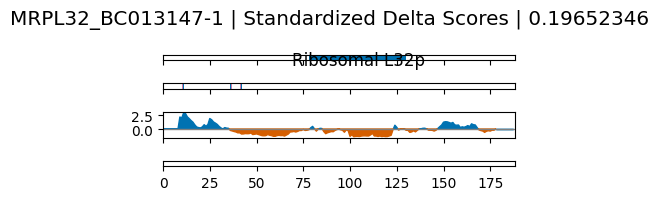

RPL19_BC000530-2_BC013016-2 RPL19_BC000530-2_BC013016-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL19_BC000530-2_BC013016-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L19e: 4-145
Low complexity coordinates: 73-73, 78-78, 97-97, 99-109, 142-142, 144-146
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


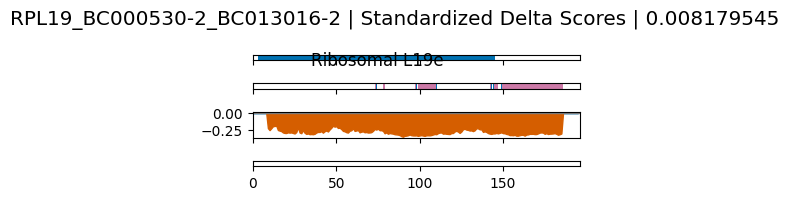

HMGB2_BC001063-2 HMGB2_BC001063-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HMGB2_BC001063-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
YABBY: 49-121
HMG_box_2: 6-78
HMG_box: 95-163
Low complexity coordinates: 48-50, 58-59, 61-63, 79-94, 143-151, 153-159, 161-163, 165-166, 169-177
sig peak regions (p<0.05): 21-43, 61-80, 105-127, 140-176
sig peak regions (p<0.001): 


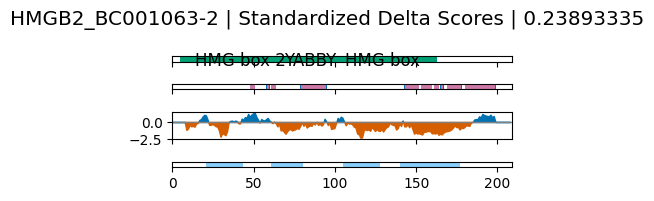

SARNP_BC007099-1 SARNP_BC007099-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SARNP_BC007099-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Tho1_MOS11_C: 147-182
Tho1_MOS11_C: 105-128
SAP: 8-42
Low complexity coordinates: 11-11, 15-17, 42-43, 45-45, 47-85, 168-172, 194-195
sig peak regions (p<0.05): 0-19, 131-175, 178-206
sig peak regions (p<0.001): 133-152, 179-198


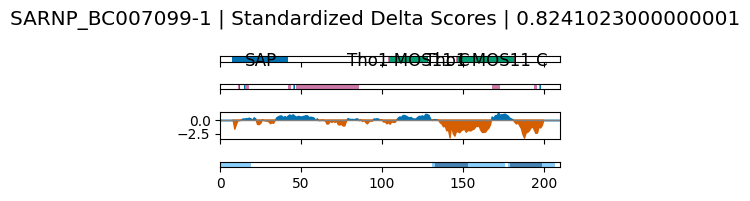

ARL6IP4_uc004dat-1 ARL6IP4_uc004dat-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ARL6IP4_uc004dat-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
4HBT: 122-192
Low complexity coordinates: 10-15
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


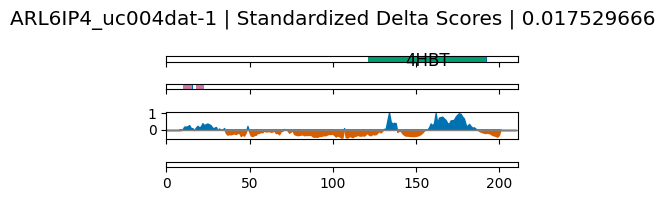

GRB2_BC000631-2 GRB2_BC000631-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GRB2_BC000631-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SH3_1: 162-206
SH3_1: 4-50
SH2: 60-135
Low complexity coordinates: 
sig peak regions (p<0.05): 0-20, 163-209
sig peak regions (p<0.001): 1-20, 171-204


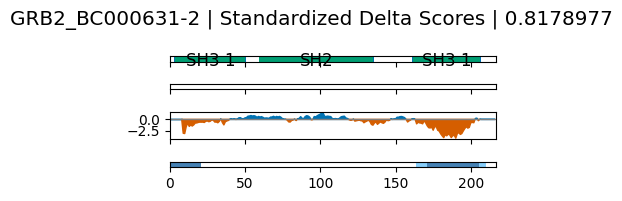

HIST1H1C_BC002649-1 HIST1H1C_BC002649-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HIST1H1C_BC002649-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Linker_histone: 38-108
Low complexity coordinates: 10-31, 54-60, 64-64, 87-95, 105-106
sig peak regions (p<0.05): 0-20
sig peak regions (p<0.001): 


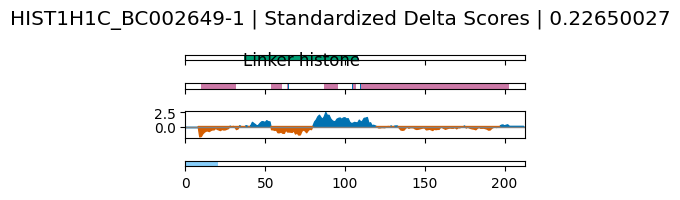

ZCRB1_BC022543-1 ZCRB1_BC022543-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZCRB1_BC022543-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 12-82
zf-CCHC: 106-122
Low complexity coordinates: 40-43, 128-159, 175-175, 177-178
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


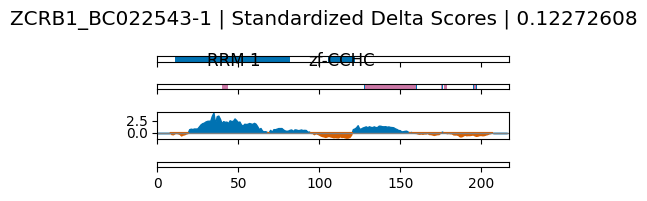

RBPMS_BC003608-2 RBPMS_BC003608-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBPMS_BC003608-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 26-87
Low complexity coordinates: 11-11, 141-141, 144-165, 167-167
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


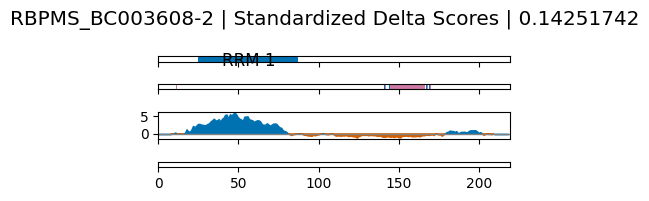

RAN_BC014518-2_BC014901-2_BC016654-1_BC051908-2 RAN_BC014518-2_BC014901-2_BC016654-1_BC051908-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RAN_BC014518-2_BC014901-2_BC016654-1_BC051908-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ras: 12-168
Low complexity coordinates: 17-18, 21-22, 131-132
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


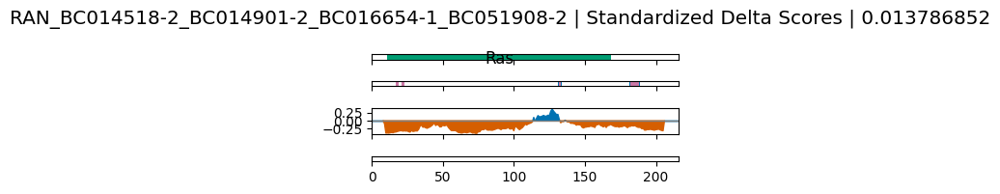

DDX54_BC001132-2 DDX54_BC001132-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX54_BC001132-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DBP10CT: 56-116
Low complexity coordinates: 11-11, 24-26, 43-44, 50-52, 97-97, 108-115, 127-143, 145-146, 153-153, 170-170, 175-176, 178-185, 194-195, 203-204
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


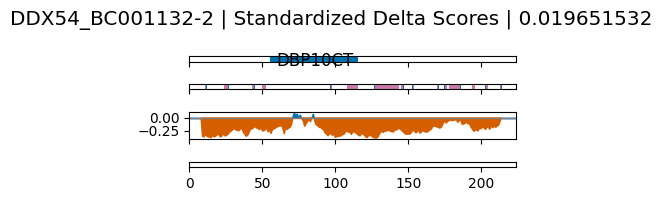

LSM7_BC018621-1 LSM7_BC018621-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LSM7_BC018621-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM: 14-86
Low complexity coordinates: 10-13
sig peak regions (p<0.05): 41-72
sig peak regions (p<0.001): 47-71


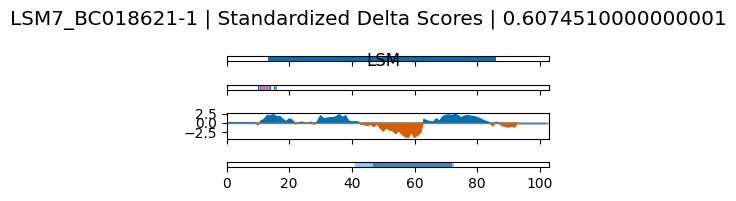

SRP14_BC035495-2 SRP14_BC035495-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRP14_BC035495-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SRP14: 4-94
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


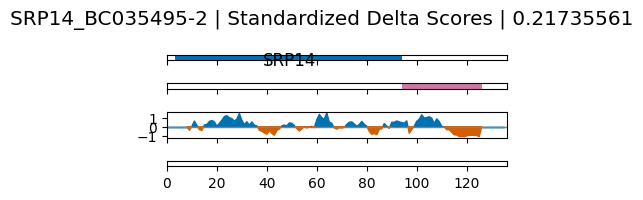

SNRPB2_BC018022-1_BC036737-2 SNRPB2_BC018022-1_BC036737-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNRPB2_BC018022-1_BC036737-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 153-212
RRM_1: 9-79
Low complexity coordinates: 98-119, 123-135, 138-138, 148-149, 156-156
sig peak regions (p<0.05): 115-148
sig peak regions (p<0.001): 


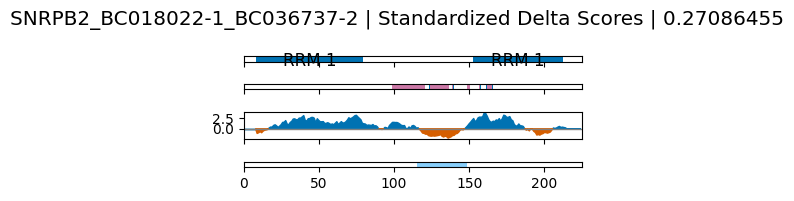

MRPS35_BC015862-1 MRPS35_BC015862-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPS35_BC015862-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MRP-S28: 51-139
Low complexity coordinates: 68-77, 82-83, 86-86, 176-177, 182-188, 190-190, 193-193
sig peak regions (p<0.05): 0-48
sig peak regions (p<0.001): 


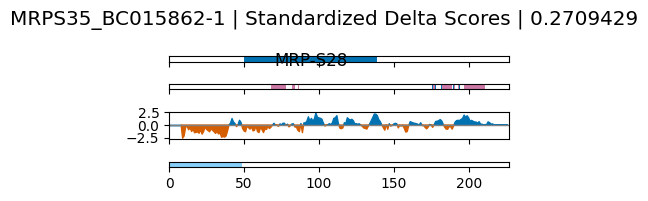

SLIRP_BC017895-1 SLIRP_BC017895-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SLIRP_BC017895-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 22-83
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


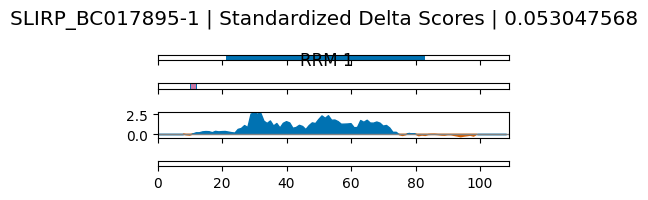

TRMU_BC080631-1 TRMU_BC080631-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRMU_BC080631-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
tRNA_Me_trans_M: 76-138
tRNA_Me_trans_C: 149-191
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


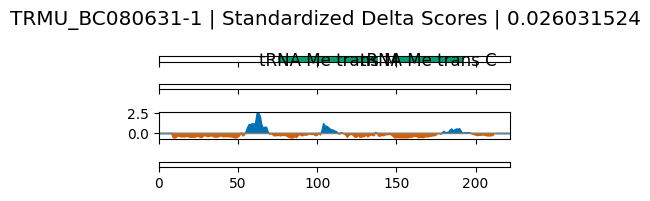

SSBP1_BC000895-1 SSBP1_BC000895-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SSBP1_BC000895-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SSB: 30-140
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


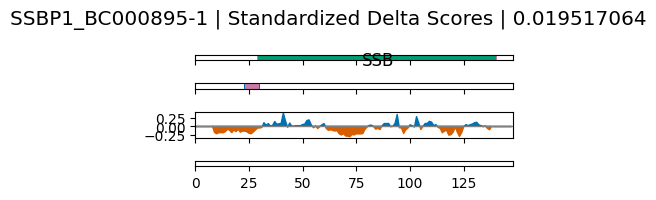

TPD52L2_BC006804-1 TPD52L2_BC006804-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TPD52L2_BC006804-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TPD52: 41-121
TPD52: 118-168
Low complexity coordinates: 34-58, 60-60, 79-79, 84-85, 138-139, 141-141
sig peak regions (p<0.05): 0-48, 105-124, 167-205
sig peak regions (p<0.001): 178-204


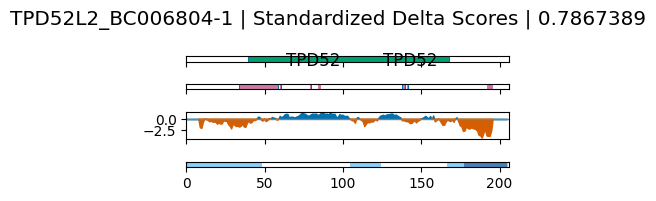

DYNC1H1_BC064521-1 DYNC1H1_BC064521-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DYNC1H1_BC064521-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Dynein_C: 1-155
Low complexity coordinates: 20-22, 88-88, 163-172
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


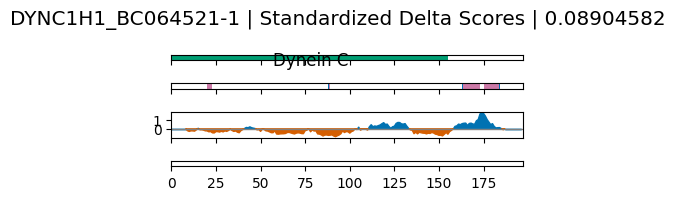

ARL6IP4_BC001958-1 ARL6IP4_BC001958-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ARL6IP4_BC001958-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SR-25: 7-216
Low complexity coordinates: 10-35
sig peak regions (p<0.05): 57-82, 132-189
sig peak regions (p<0.001): 138-175


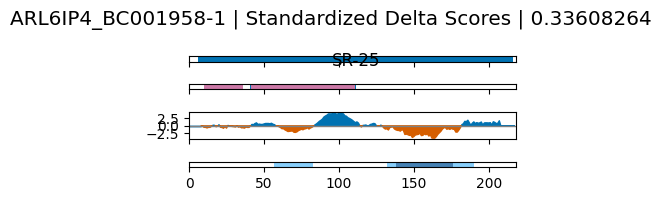

NOL12_BC002808-1 NOL12_BC002808-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOL12_BC002808-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Nop25: 20-97
Low complexity coordinates: 12-12, 17-18, 44-85, 113-113, 120-124, 126-127, 129-129, 131-131, 133-134, 136-136, 142-142, 157-157, 161-161, 169-169, 171-173, 178-193
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


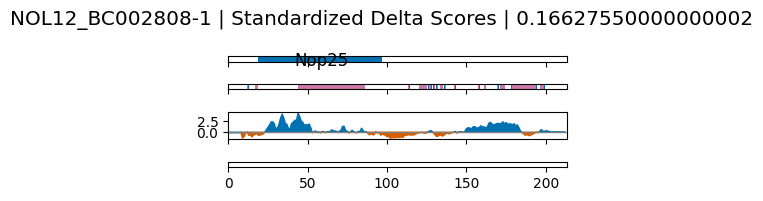

MRPL43_BC041165-1 MRPL43_BC041165-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL43_BC041165-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
L51_S25_CI-B8: 43-93
Low complexity coordinates: 33-33, 37-41, 65-65, 173-175, 177-180, 182-190
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


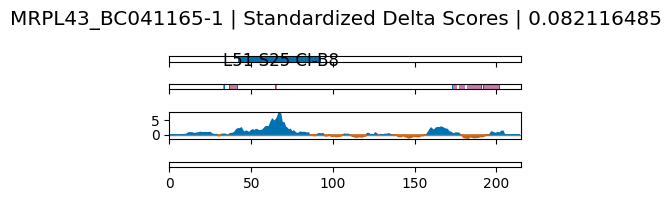

PTRH1_BC047012-1 PTRH1_BC047012-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PTRH1_BC047012-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pept_tRNA_hydro: 32-204
Low complexity coordinates: 77-86, 95-95, 97-97
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


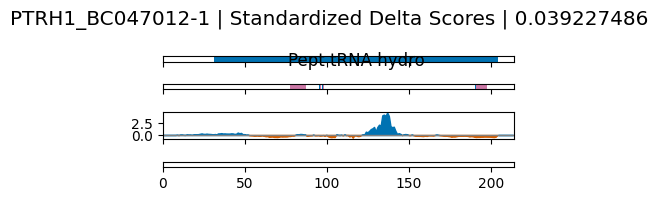

LIN28A_BC028566-2 LIN28A_BC028566-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LIN28A_BC028566-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CSD: 42-111
zf-CCHC: 138-153
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


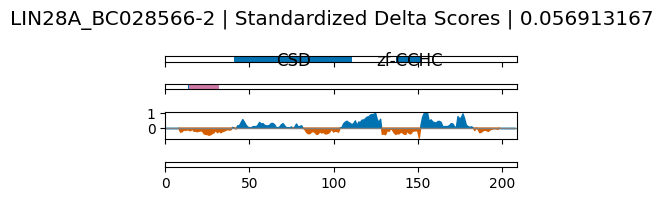

GAR1_BC003413-1 GAR1_BC003413-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GAR1_BC003413-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Gar1: 70-158
Low complexity coordinates: 10-60, 147-148, 150-151
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


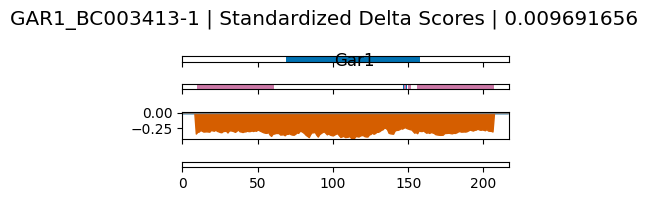

RPL10A_BC006791-1_BC011366-1 RPL10A_BC006791-1_BC011366-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL10A_BC006791-1_BC011366-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L1: 24-212
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


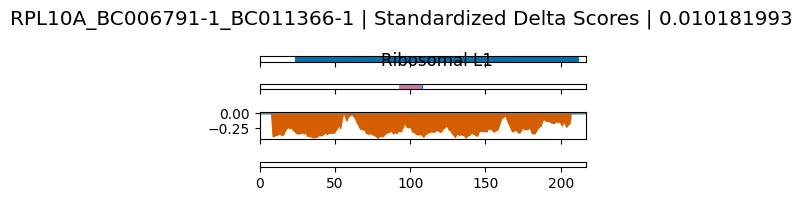

FKBP3_BC016288-1_BC020809-1 FKBP3_BC016288-1_BC020809-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FKBP3_BC016288-1_BC020809-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
BTHB: 6-77
FKBP_C: 123-221
Low complexity coordinates: 94-95, 98-99, 101-103
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


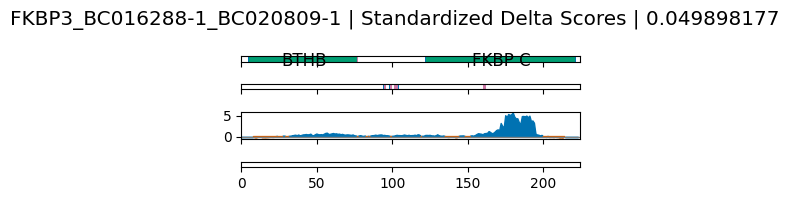

MEPCE_BC000556-2_BC016396-1 MEPCE_BC000556-2_BC016396-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MEPCE_BC000556-2_BC016396-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Bin3: 106-214
Low complexity coordinates: 
sig peak regions (p<0.05): 0-24
sig peak regions (p<0.001): 


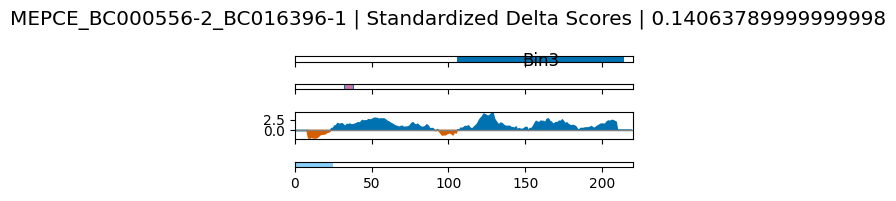

POLDIP3_BC019643-1 POLDIP3_BC019643-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/POLDIP3_BC019643-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 18-24, 28-28, 32-36, 73-73, 179-189
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


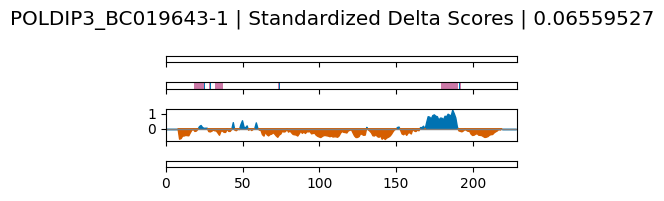

EIF4H_BC021214-2_BC066928-1 EIF4H_BC021214-2_BC066928-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF4H_BC021214-2_BC066928-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 45-112
Low complexity coordinates: 11-26, 125-163
sig peak regions (p<0.05): 0-24, 84-109, 166-185
sig peak regions (p<0.001): 1-20, 88-107


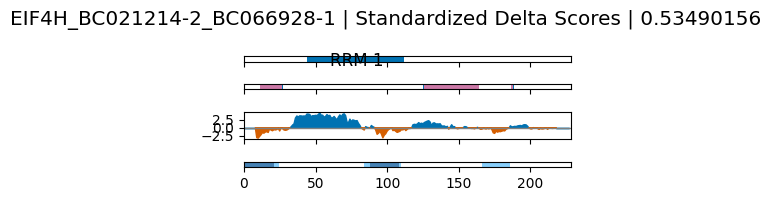

PTCD2_BC018720-1 PTCD2_BC018720-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PTCD2_BC018720-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PPR_2: 12-52
Low complexity coordinates: 121-121, 125-127, 130-132, 159-160, 162-162
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


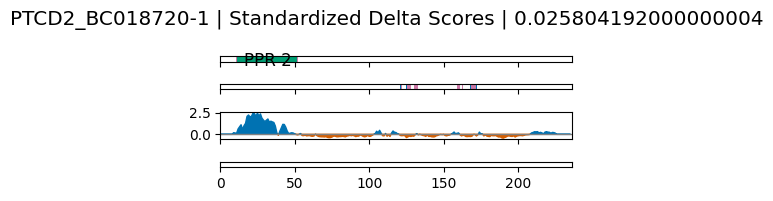

SRSF7_BC000997-2_BC017369-2_BC022328-1 SRSF7_BC000997-2_BC017369-2_BC022328-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF7_BC000997-2_BC017369-2_BC022328-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC: 105-119
RRM_1: 13-77
Low complexity coordinates: 12-17, 55-55, 90-97
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


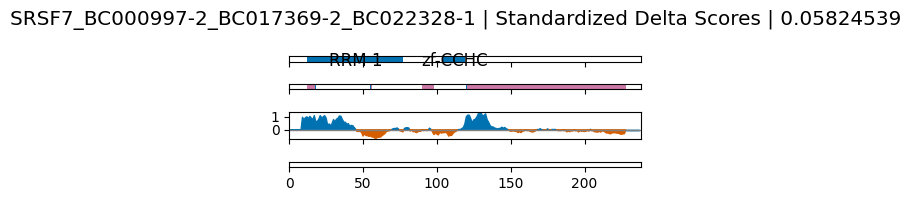

SMNDC1_BC011234-1 SMNDC1_BC011234-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SMNDC1_BC011234-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SMN_Tudor: 72-122
Low complexity coordinates: 11-14, 34-34, 36-42, 57-61, 94-94, 98-104, 149-166
sig peak regions (p<0.05): 54-122, 216-237
sig peak regions (p<0.001): 83-104


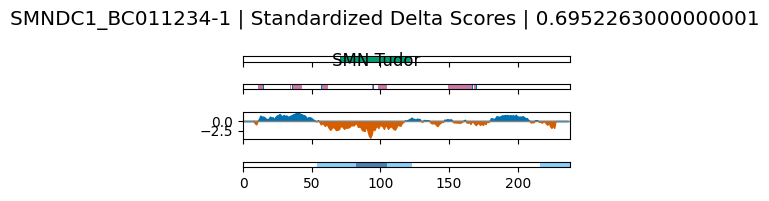

MRPS7_BC000241-1 MRPS7_BC000241-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPS7_BC000241-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S7: 82-234
Low complexity coordinates: 11-15, 17-18, 22-23, 56-62
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


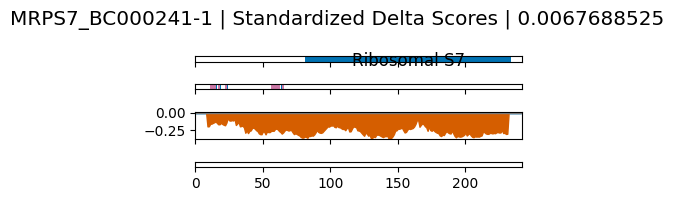

MRTO4_BC003013-1 MRTO4_BC003013-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRTO4_BC003013-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RL10P_insert: 125-194
Ribosomal_L10: 21-119
Low complexity coordinates: 12-12, 21-21
sig peak regions (p<0.05): 171-202
sig peak regions (p<0.001): 


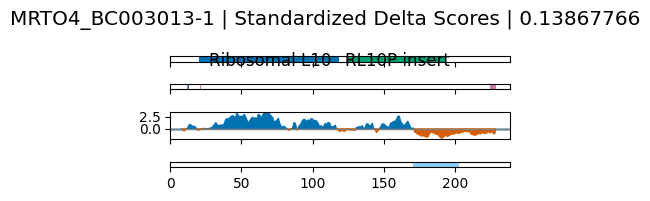

HDGF_BC018991-1 HDGF_BC018991-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HDGF_BC018991-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PWWP: 13-92
Low complexity coordinates: 73-74, 109-110, 114-129, 152-152, 170-181, 184-187
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


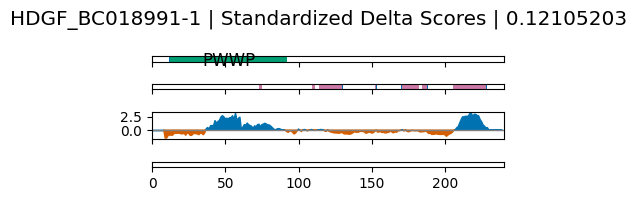

SYF2_BC010862-1 SYF2_BC010862-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SYF2_BC010862-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SYF2: 91-238
Low complexity coordinates: 10-33, 38-39, 66-91, 201-201, 205-205
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


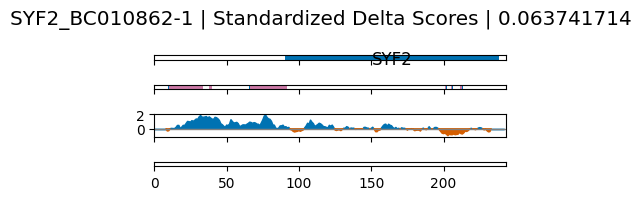

RPS3_BC003137-1_BC034149-1 RPS3_BC003137-1_BC034149-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS3_BC003137-1_BC034149-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S3_C: 106-188
KH_2: 20-93
Low complexity coordinates: 113-114
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


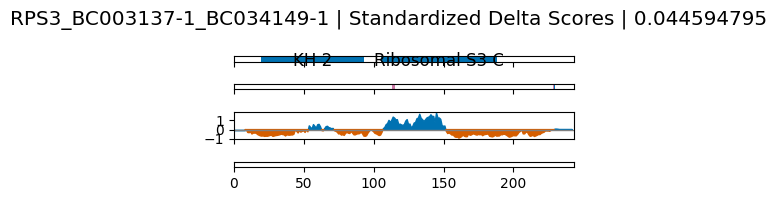

CCDC59_BC020647-1 CCDC59_BC020647-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CCDC59_BC020647-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
rRNA_processing: 125-239
Low complexity coordinates: 65-70, 73-73, 138-140, 160-161, 169-171, 177-203, 210-210, 212-212
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


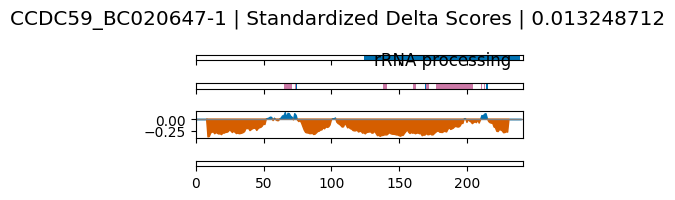

ZCCHC17_BC007446-2_BC050609-1 ZCCHC17_BC007446-2_BC050609-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZCCHC17_BC007446-2_BC050609-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC: 132-147
SR-25: 164-240
S1: 17-85
Low complexity coordinates: 163-171
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


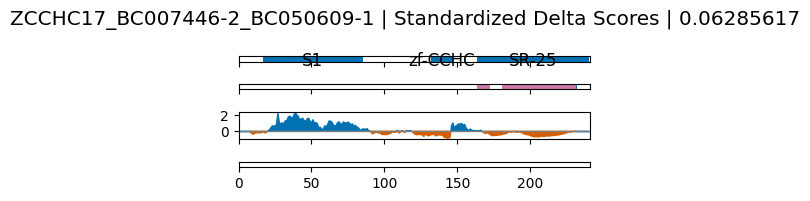

UTP23_BC005955-1_BC022441-1 UTP23_BC005955-1_BC022441-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/UTP23_BC005955-1_BC022441-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Fcf1: 51-149
Low complexity coordinates: 170-170, 175-175, 200-204, 213-213, 217-221
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


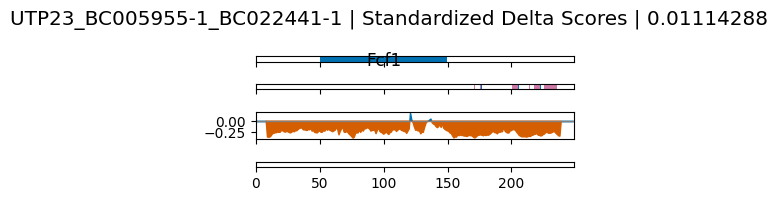

SRSF1_BC010264-1 SRSF1_BC010264-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF1_BC010264-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 123-184
RRM_1: 18-85
Low complexity coordinates: 59-60, 69-77, 89-123
sig peak regions (p<0.05): 60-80
sig peak regions (p<0.001): 


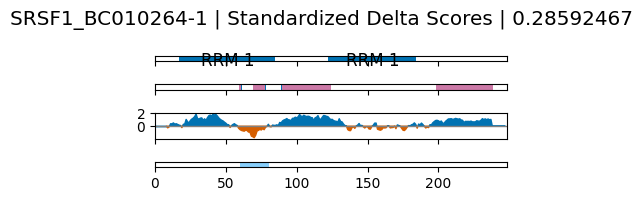

EMG1_BC055314-1 EMG1_BC055314-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EMG1_BC055314-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
EMG1: 45-238
Low complexity coordinates: 32-34
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


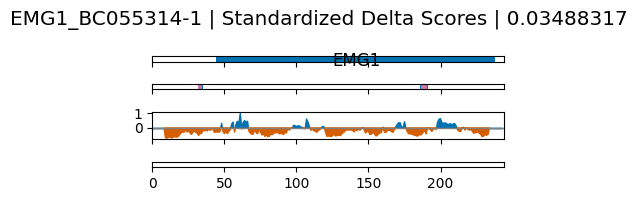

YWHAG_BC020963-2 YWHAG_BC020963-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/YWHAG_BC020963-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
14-3-3: 10-234
Low complexity coordinates: 84-85, 144-146, 153-153
sig peak regions (p<0.05): 0-22, 153-172, 178-212
sig peak regions (p<0.001): 185-204


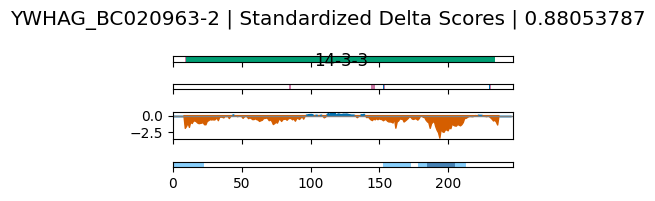

UTP11L_BC005182-1 UTP11L_BC005182-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/UTP11L_BC005182-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Utp11: 13-253
Low complexity coordinates: 10-11, 34-51, 140-140
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


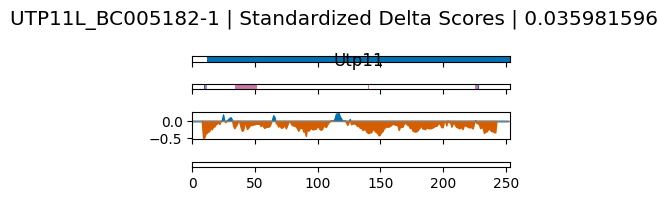

LGALS3_BC053667-1 LGALS3_BC053667-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LGALS3_BC053667-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Gal-bind_lectin: 117-246
Low complexity coordinates: 19-119, 121-121
sig peak regions (p<0.05): 87-113, 139-158
sig peak regions (p<0.001): 


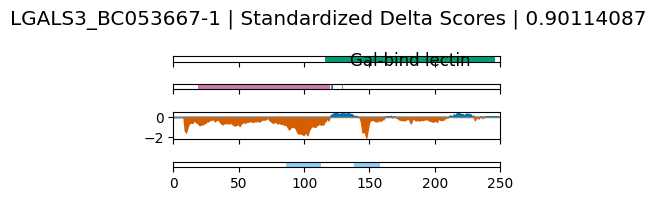

PNO1_BC008304-1 PNO1_BC008304-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PNO1_BC008304-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 178-226
KH_8: 82-150
Low complexity coordinates: 19-19, 29-35, 41-41, 46-47
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


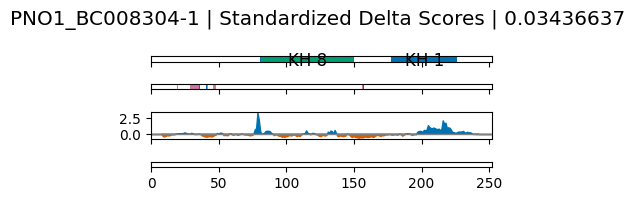

NSA2_BC005288-1 NSA2_BC005288-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NSA2_BC005288-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S8e: 35-259
Low complexity coordinates: 14-20, 25-33, 35-35, 60-60, 65-67, 69-70, 141-143
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


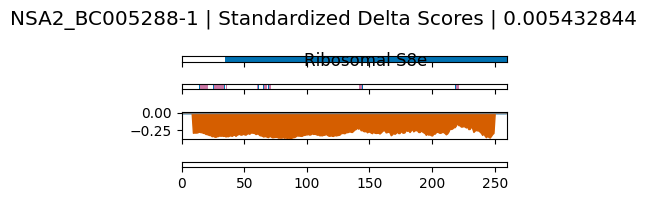

SRSF12_BC021715-1 SRSF12_BC021715-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF12_BC021715-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 12-81
Low complexity coordinates: 105-135, 137-163, 165-208, 212-213
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


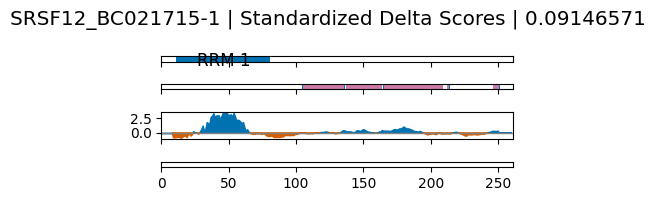

PUS7_BC005209-2 PUS7_BC005209-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PUS7_BC005209-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TruD: 11-240
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


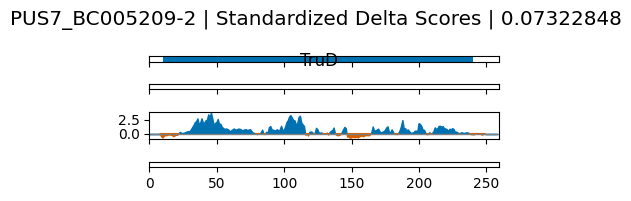

FRG1_BC053997-1 FRG1_BC053997-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FRG1_BC053997-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FRG1: 68-256
Low complexity coordinates: 11-33, 220-222, 226-227
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


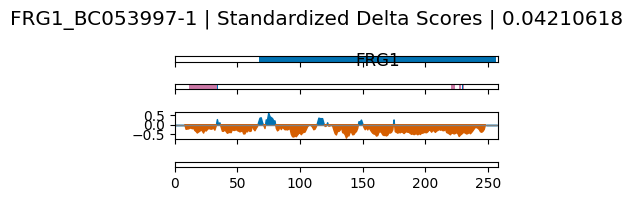

RNPC3_BC010697-1 RNPC3_BC010697-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RNPC3_BC010697-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 166-240
Low complexity coordinates: 18-22, 40-42, 44-46, 48-49, 128-128, 136-136, 138-140
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


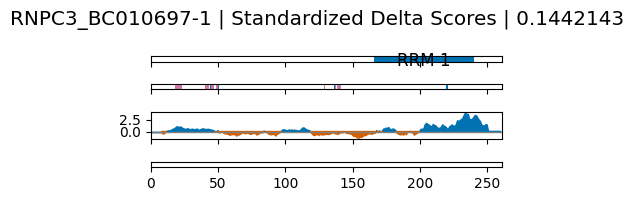

NOA1_BC004894-2 NOA1_BC004894-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOA1_BC004894-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MMR_HSR1: 341-392
YqeH-like_C: 556-657
Low complexity coordinates: 10-14, 17-17, 24-24, 28-28, 86-116, 187-187, 193-194, 198-201, 220-236, 269-270, 293-293
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


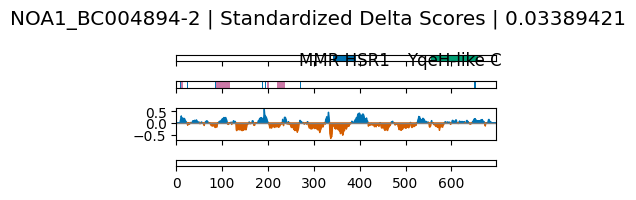

DDX23_BC002366-2 DDX23_BC002366-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX23_BC002366-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 415-615
Helicase_C: 651-759
Low complexity coordinates: 13-130, 141-169, 171-197, 207-232, 235-236, 330-346
sig peak regions (p<0.05): 14-74, 76-102, 268-294, 350-385, 411-471, 504-581, 685-778
sig peak regions (p<0.001): 417-449, 516-579, 696-766


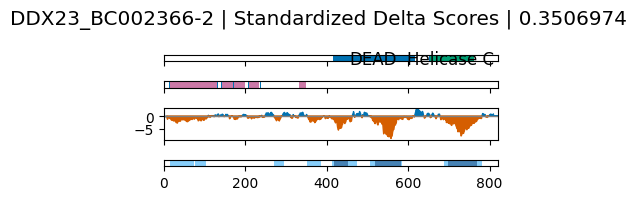

RBM33_BC011923-2 RBM33_BC011923-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM33_BC011923-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 10-18, 31-31, 33-75, 111-122, 143-148, 150-150, 153-154, 157-174, 176-176
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


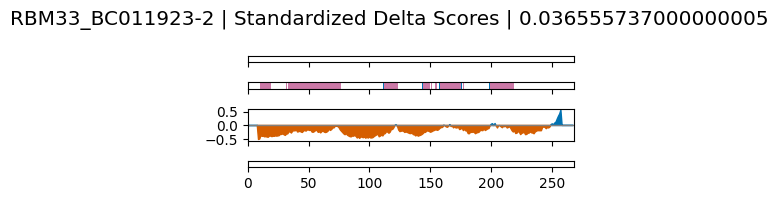

DHX8_BC044586-1 DHX8_BC044586-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX8_BC044586-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
OB_NTP_bind: 1097-1173
HA2_C: 980-1039
HA2_N: 951-979
Helicase_C: 758-889
S1: 255-327
DEAD: 566-715
Low complexity coordinates: 11-13, 96-108, 133-138, 140-140, 159-159, 162-227, 234-236, 304-304, 306-308, 315-317, 322-322, 344-345, 416-435, 474-482, 880-881, 884-884, 962-962
sig peak regions (p<0.05): 660-699
sig peak regions (p<0.001): 


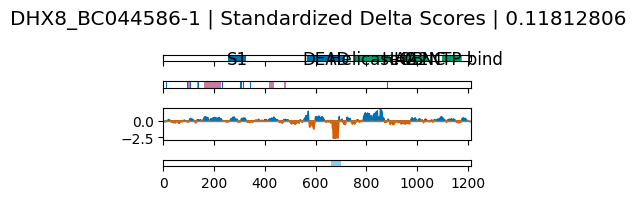

RPL35A_BC001037-2_BC010949-1_BC017093-1_BC061890-1 RPL35A_BC001037-2_BC010949-1_BC017093-1_BC061890-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL35A_BC001037-2_BC010949-1_BC017093-1_BC061890-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L35Ae: 5-104
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


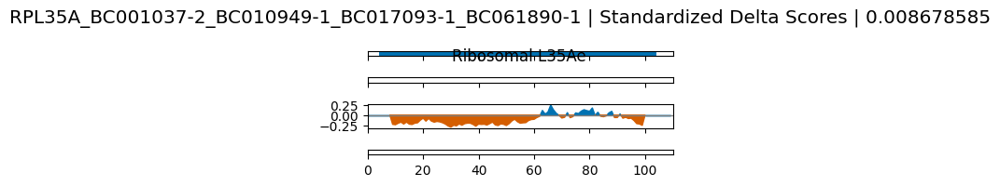

CISD2_BC032300-1 CISD2_BC032300-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CISD2_BC032300-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MitoNEET_N: 4-66
zf-CDGSH: 80-115
Low complexity coordinates: 40-41, 44-53, 69-71
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


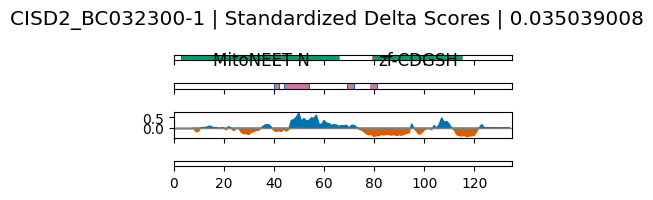

PRR3_BC126457-1 PRR3_BC126457-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRR3_BC126457-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH: 157-181
Low complexity coordinates: 10-16, 18-23, 26-36, 38-38, 40-47, 58-58, 63-93
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


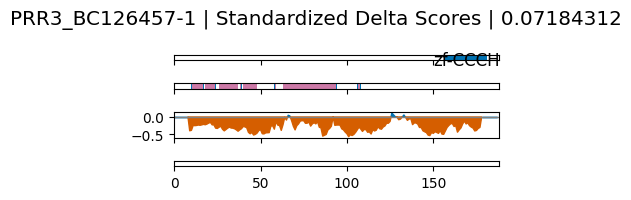

APOBEC3A_BC126416-1 APOBEC3A_BC126416-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/APOBEC3A_BC126416-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NAD2: 12-194
Low complexity coordinates: 
sig peak regions (p<0.05): 128-158
sig peak regions (p<0.001): 131-150


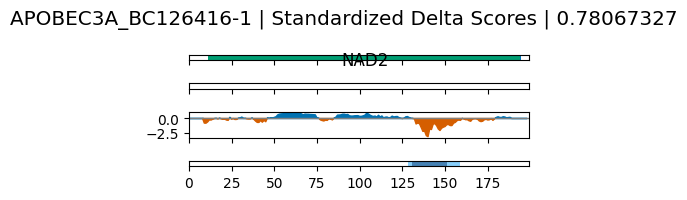

SBDS_BC065700-1 SBDS_BC065700-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SBDS_BC065700-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SBDS_C: 172-239
SBDS_domain_II: 109-170
SBDS: 14-101
Low complexity coordinates: 184-191
sig peak regions (p<0.05): 0-21, 64-89, 91-124, 190-231
sig peak regions (p<0.001): 


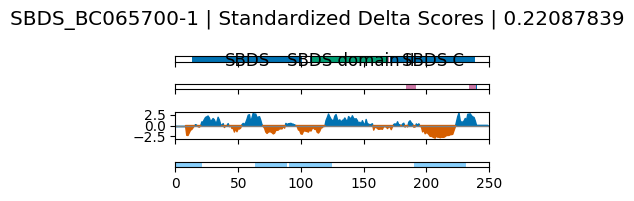

FUBP3_BC007874-2 FUBP3_BC007874-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FUBP3_BC007874-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 19-81
KH_1: 196-233
KH_1: 105-170
Low complexity coordinates: 41-42
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


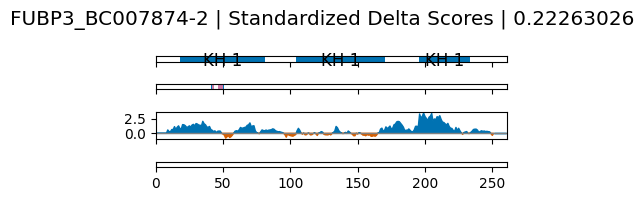

CHTOP_BC120961-1 CHTOP_BC120961-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CHTOP_BC120961-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FoP_duplication: 167-244
Low complexity coordinates: 44-53, 71-73, 75-80, 92-138
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


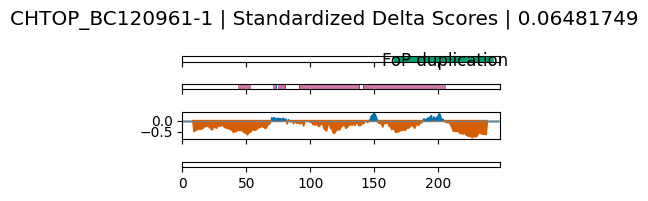

RPL7L1_BC073890-1 RPL7L1_BC073890-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL7L1_BC073890-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L30_N: 12-82
Ribosomal_L30: 88-138
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


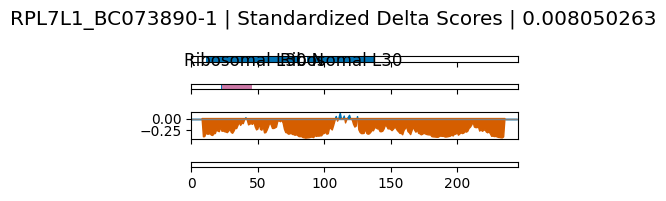

RBM7_BC034381-1 RBM7_BC034381-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM7_BC034381-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 12-81
Low complexity coordinates: 19-20, 40-44, 47-47, 104-104, 115-117, 162-162, 164-189, 219-219
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


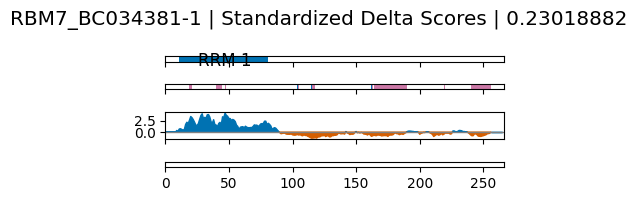

C1orf35_BC002843-2 C1orf35_BC002843-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/C1orf35_BC002843-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MMtag: 8-83
Low complexity coordinates: 63-78, 120-126, 161-161, 179-208, 214-227, 229-230, 232-232, 234-235
sig peak regions (p<0.05): 83-117
sig peak regions (p<0.001): 


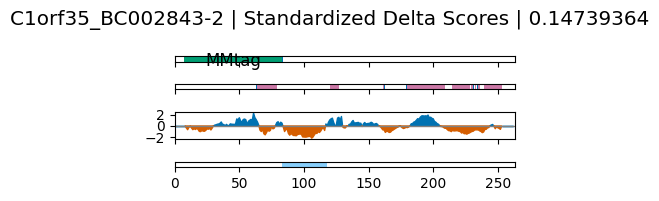

RPS3A_BC000204-1_BC001708-1_BC004981-1_BC006298-2_BC009219-2_BC009404-2_BC017123-2_BC019072-2_BC030161-2 RPS3A_BC000204-1_BC001708-1_BC004981-1_BC006298-2_BC009219-2_BC009404-2_BC017123-2_BC019072-2_BC030161-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS3A_BC000204-1_BC001708-1_BC004981-1_BC006298-2_BC009219-2_BC009404-2_BC017123-2_BC019072-2_BC030161-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S3Ae: 17-221
Low complexity coordinates: 10-14, 16-24, 26-26, 219-229
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


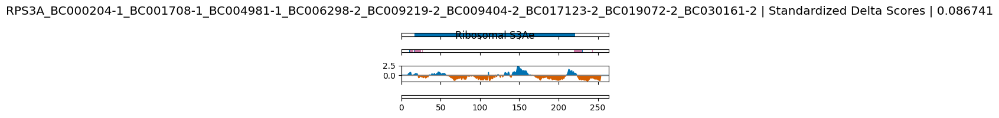

HELQ_BC011863-2 HELQ_BC011863-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HELQ_BC011863-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 34-42, 66-69
sig peak regions (p<0.05): 0-21
sig peak regions (p<0.001): 


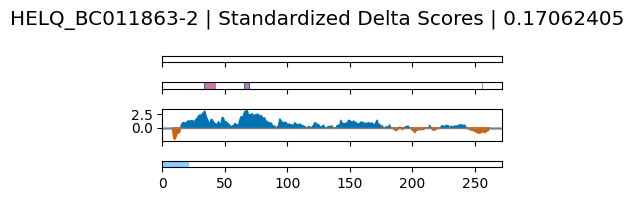

SRSF5_BC018823-2 SRSF5_BC018823-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF5_BC018823-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 6-67
RRM_1: 110-175
Low complexity coordinates: 30-31, 72-75, 77-99, 101-101, 166-171
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


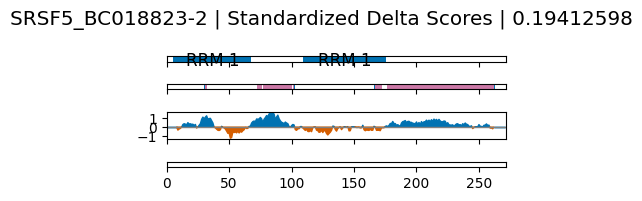

SLBP_BC014908-1_BC015703-1 SLBP_BC014908-1_BC015703-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SLBP_BC014908-1_BC015703-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SLBP_RNA_bind: 130-199
Low complexity coordinates: 11-15, 27-35, 38-50, 54-55, 60-60, 109-116, 118-119, 222-223
sig peak regions (p<0.05): 110-133, 165-217
sig peak regions (p<0.001): 


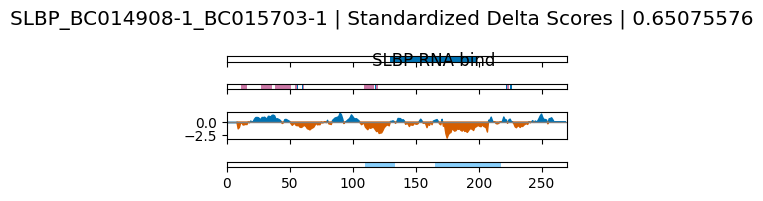

ZCCHC9_BC014841-1 ZCCHC9_BC014841-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZCCHC9_BC014841-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC: 212-228
zf-CCHC: 129-144
zf-CCHC: 185-200
Low complexity coordinates: 53-60
sig peak regions (p<0.05): 144-178
sig peak regions (p<0.001): 


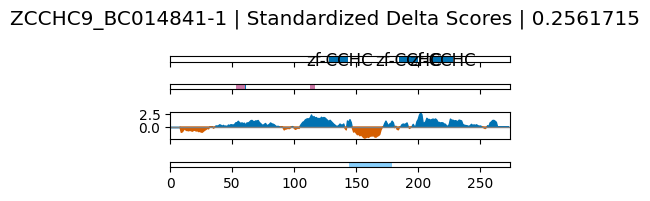

TRA2A_BC017094-2 TRA2A_BC017094-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRA2A_BC017094-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 123-191
Low complexity coordinates: 23-23, 25-25, 27-104
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


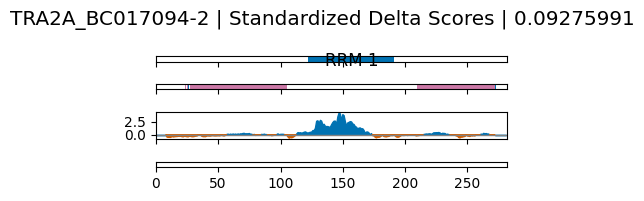

CMSS1_BC006475-1 CMSS1_BC006475-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CMSS1_BC006475-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CMS1: 61-263
Low complexity coordinates: 20-20, 22-24, 34-36, 41-43, 65-73, 192-192
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


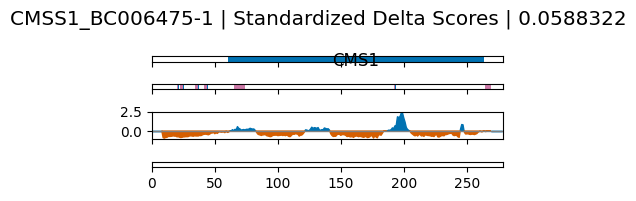

RBM11_BC030196-1 RBM11_BC030196-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM11_BC030196-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 12-80
Low complexity coordinates: 171-171, 175-175, 213-213, 217-217
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


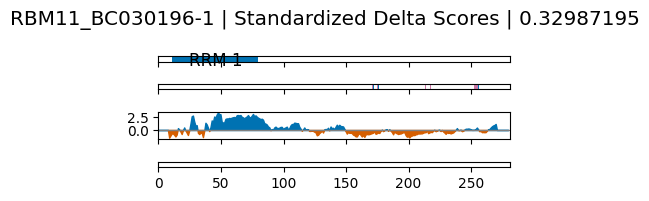

RRP7A_BC073834-1_BC121118-1 RRP7A_BC073834-1_BC121118-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RRP7A_BC073834-1_BC121118-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_Rrp7: 22-90
RRP7: 162-280
Low complexity coordinates: 79-81, 115-115, 119-119, 183-196, 201-203, 215-232
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


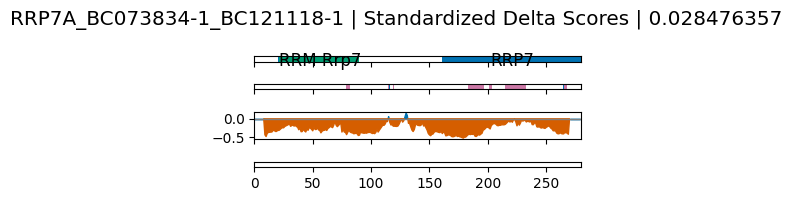

UTP15_BC013064-1 UTP15_BC013064-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/UTP15_BC013064-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 6-43
UTP15_C: 110-257
Low complexity coordinates: 15-16, 26-26, 29-30, 32-32, 39-39, 47-47, 89-90, 92-92
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


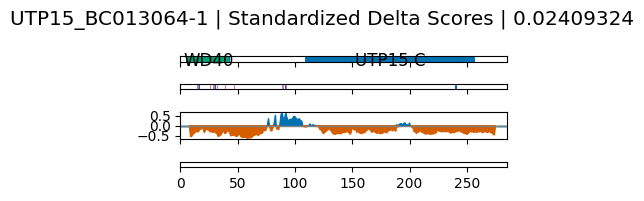

SNRPA_BC000405-2_BC008290-1 SNRPA_BC000405-2_BC008290-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNRPA_BC000405-2_BC008290-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 12-82
RRM_1: 210-272
Low complexity coordinates: 20-22, 112-113, 115-115, 125-143, 147-197, 209-213
sig peak regions (p<0.05): 154-207
sig peak regions (p<0.001): 


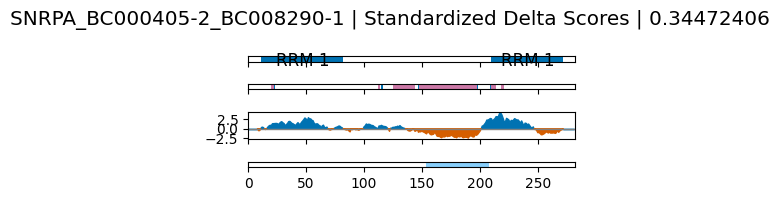

ZMAT3_BC002896-2 ZMAT3_BC002896-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZMAT3_BC002896-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-met: 70-94
zf-C2H2_jaz: 245-271
zf-met: 148-171
Low complexity coordinates: 10-14, 16-19, 24-24, 40-42, 47-49, 54-57, 59-59, 115-120
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


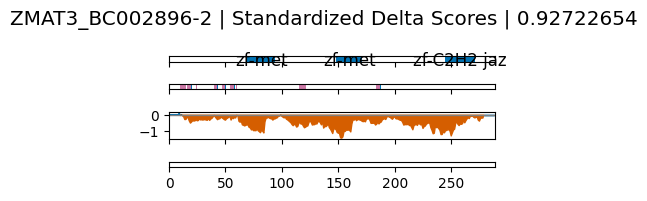

USP36_BC038983-1 USP36_BC038983-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/USP36_BC038983-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
UCH: 122-226
Low complexity coordinates: 14-17, 23-23, 25-28
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


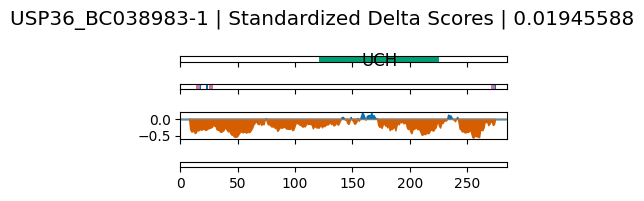

CNOT8_BC017366-2 CNOT8_BC017366-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CNOT8_BC017366-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CAF1: 15-132
Low complexity coordinates: 
sig peak regions (p<0.05): 10-29
sig peak regions (p<0.001): 


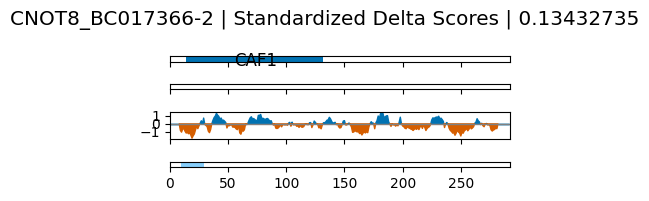

HNRPDL_BC007392-2 HNRPDL_BC007392-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HNRPDL_BC007392-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 32-99
RRM_1: 116-175
Low complexity coordinates: 84-84, 87-87, 97-99, 102-105, 110-110, 192-192
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


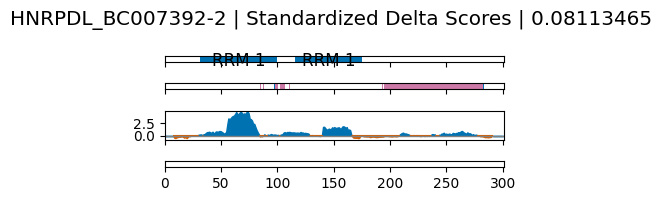

PPIE_BC004898-2_BC008451-1 PPIE_BC004898-2_BC008451-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PPIE_BC004898-2_BC008451-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pro_isomerase: 143-298
RRM_1: 8-78
Low complexity coordinates: 58-59, 62-62
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


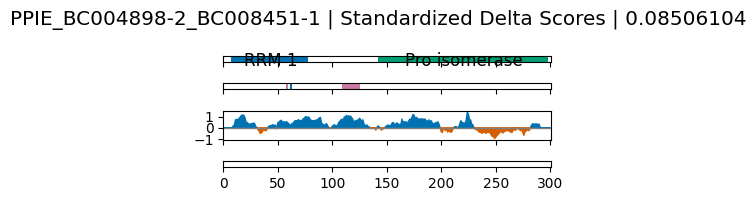

EBNA1BP2_BC009175-2 EBNA1BP2_BC009175-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EBNA1BP2_BC009175-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ebp2: 47-298
Low complexity coordinates: 10-17, 39-40, 118-120, 160-162, 164-164, 224-233, 243-251, 253-253, 281-281
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


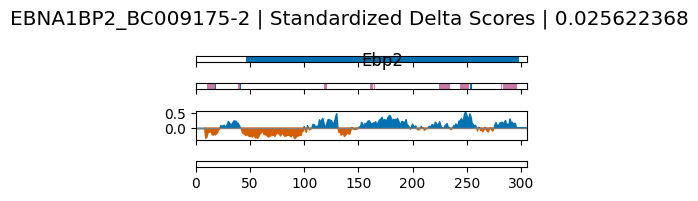

ZC3H14_BC027607-2 ZC3H14_BC027607-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZC3H14_BC027607-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH_2: 251-268
zf-CCCH_2: 192-210
zf-CCCH_2: 271-287
zf-CCCH_2: 212-227
Fib_alpha: 40-90
zf-CCCH_2: 172-189
Low complexity coordinates: 10-10, 12-19, 31-32, 105-105, 235-243
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


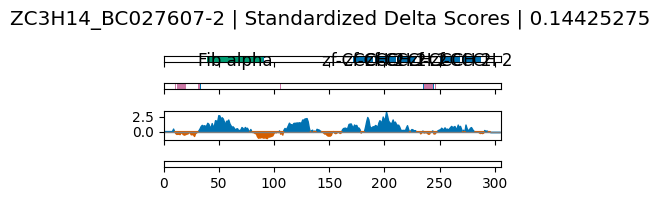

DNAJC17_BC000048-2 DNAJC17_BC000048-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DNAJC17_BC000048-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 189-233
DnaJ: 11-73
Low complexity coordinates: 20-20, 67-78, 82-89, 91-100, 103-152, 180-183, 202-202, 224-227
sig peak regions (p<0.05): 0-59
sig peak regions (p<0.001): 0-59


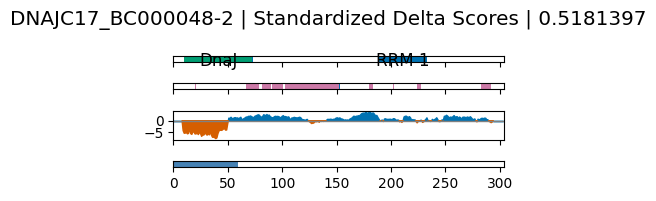

RNPS1_BC001659-2 RNPS1_BC001659-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RNPS1_BC001659-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 164-233
Low complexity coordinates: 10-13, 24-24, 27-153
sig peak regions (p<0.05): 77-104, 198-238
sig peak regions (p<0.001): 209-233


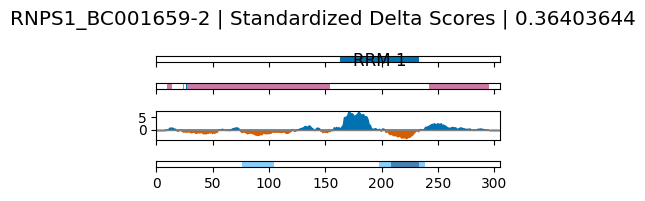

AIMP1_BC014051-2 AIMP1_BC014051-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/AIMP1_BC014051-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NUDE_C: 37-108
tRNA_bind: 157-249
Low complexity coordinates: 29-29, 40-40, 47-47, 49-67, 98-98, 107-107, 111-111
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


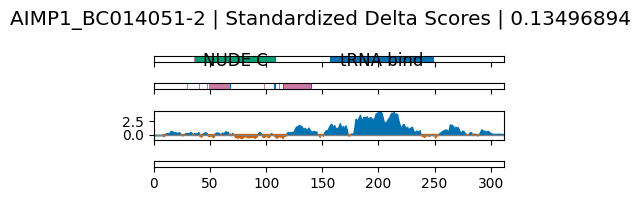

PRKRA_BC009470-1 PRKRA_BC009470-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRKRA_BC009470-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Staufen_C: 241-306
dsrm: 35-99
dsrm: 127-191
Low complexity coordinates: 91-95, 181-182
sig peak regions (p<0.05): 0-21, 83-120, 186-205, 213-272
sig peak regions (p<0.001): 186-205, 213-267


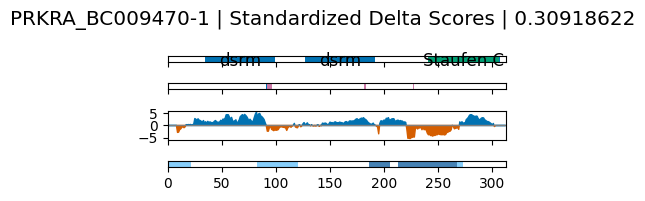

ENOX2_BC019254-1 ENOX2_BC019254-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ENOX2_BC019254-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Mobilization_B: 23-82
Low complexity coordinates: 22-24, 85-86, 92-116, 161-174
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


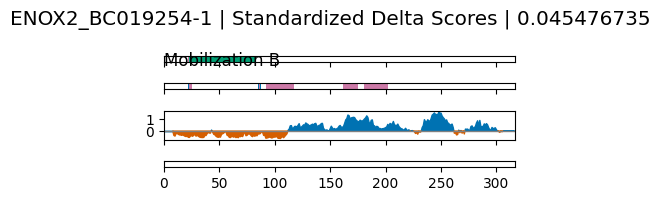

PRRC2B_BC012289-1 PRRC2B_BC012289-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRRC2B_BC012289-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 10-14, 40-61, 71-72, 94-94, 152-153, 155-155, 159-164, 178-180, 184-196, 201-208, 250-259
sig peak regions (p<0.05): 37-59
sig peak regions (p<0.001): 


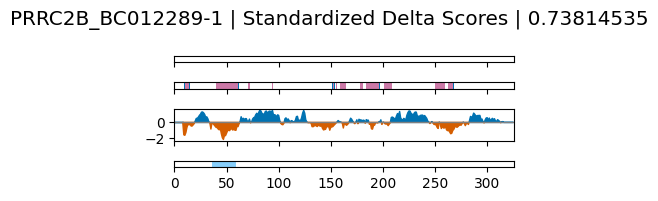

EIF3G_BC000733-2 EIF3G_BC000733-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF3G_BC000733-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 241-303
eIF3g: 58-175
Low complexity coordinates: 42-48, 51-54, 89-89, 188-191
sig peak regions (p<0.05): 106-126, 147-189
sig peak regions (p<0.001): 151-179


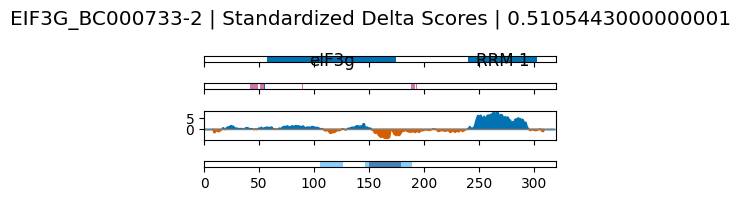

USP32_BC054344-1 USP32_BC054344-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/USP32_BC054344-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
EF-hand_6: 236-258
EF-hand_7: 270-341
Low complexity coordinates: 283-284
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


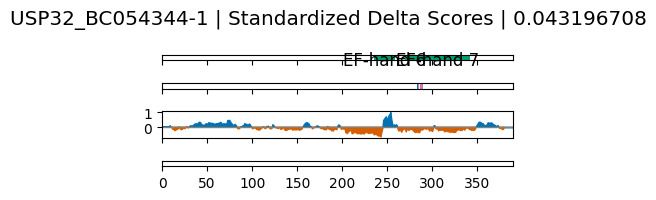

FCF1_BC080600-1 FCF1_BC080600-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FCF1_BC080600-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Fcf1: 3-99
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


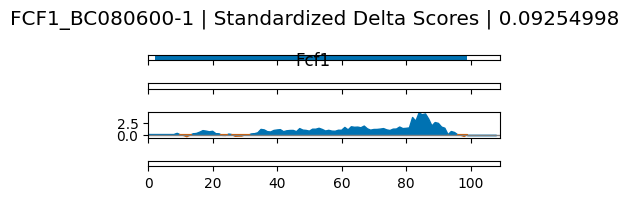

CWC15_BC040946-1 CWC15_BC040946-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CWC15_BC040946-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Cwf_Cwc_15: 1-229
Low complexity coordinates: 10-11, 22-23, 57-75, 104-105, 107-153, 192-192
sig peak regions (p<0.05): 0-20, 68-115, 199-218
sig peak regions (p<0.001): 


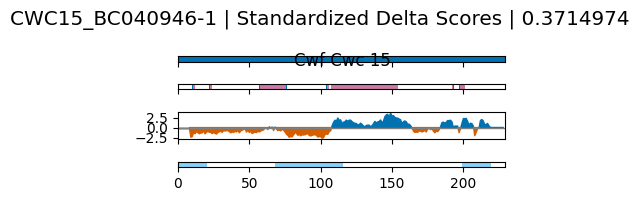

DUT_BC033645-1 DUT_BC033645-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DUT_BC033645-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
dUTPase: 34-162
Low complexity coordinates: 35-36, 44-46
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


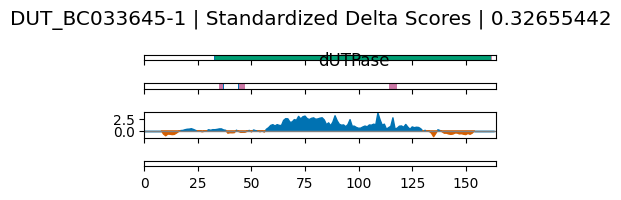

EIF2C3_BC066888-1 EIF2C3_BC066888-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF2C3_BC066888-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ArgoN: 28-167
ArgoL1: 177-219
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


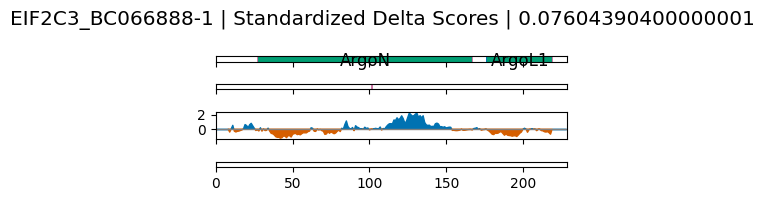

RPL18A_BC066319-1 RPL18A_BC066319-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL18A_BC066319-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L18A: 7-130
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


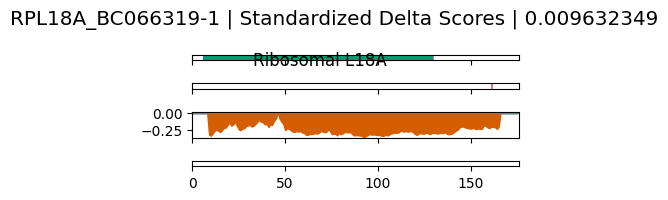

RPS8_BC070875-1 RPS8_BC070875-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS8_BC070875-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S8e: 5-190
Low complexity coordinates: 14-21, 133-133, 137-137
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


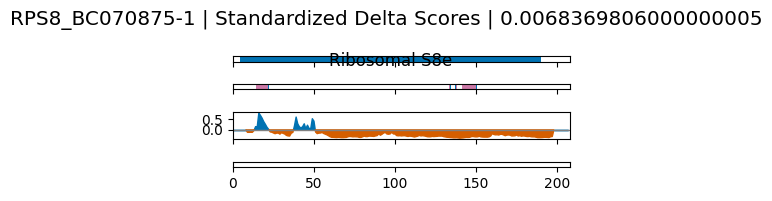

BST2_BC033873-1 BST2_BC033873-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BST2_BC033873-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
BST2: 49-136
Low complexity coordinates: 23-38, 154-154, 156-158, 162-162
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


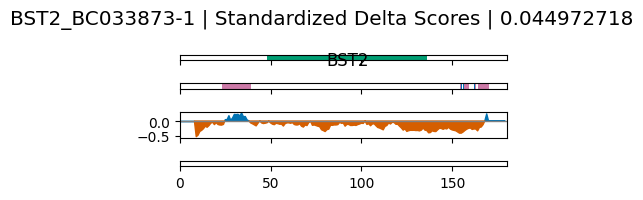

CCDC75_BC071798-1 CCDC75_BC071798-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CCDC75_BC071798-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DUF4187: 103-155
Low complexity coordinates: 18-18
sig peak regions (p<0.05): 0-23, 111-155
sig peak regions (p<0.001): 129-153


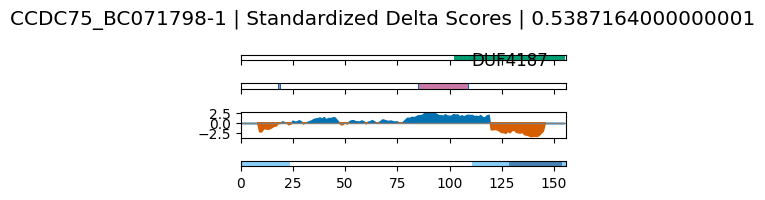

MSI2_BC017560-2 MSI2_BC017560-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MSI2_BC017560-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 8-74
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


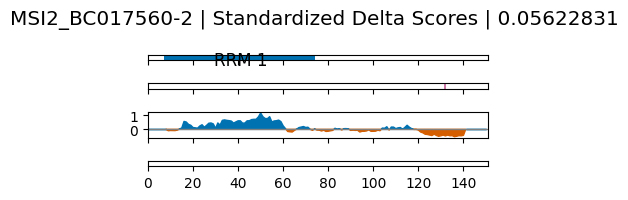

RPP30_BC006991-1 RPP30_BC006991-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPP30_BC006991-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RNase_P_p30: 16-224
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


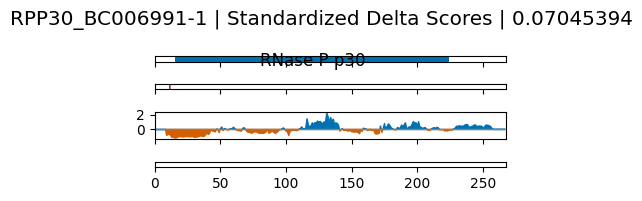

NOL7_BC023517-2 NOL7_BC023517-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOL7_BC023517-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NUC129: 172-234
Low complexity coordinates: 20-105, 111-111, 151-167, 181-182
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


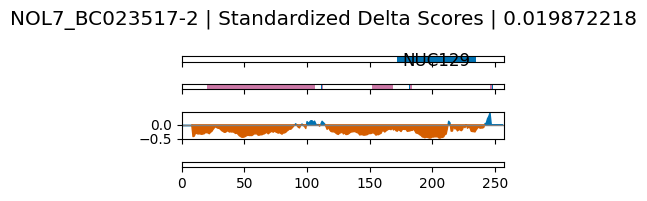

ZC3H8_BC032001-1 ZC3H8_BC032001-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZC3H8_BC032001-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH_2: 248-269
zf_CCCH_4: 226-244
zf_CCCH_4: 197-215
Low complexity coordinates: 25-42, 58-61, 130-139
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


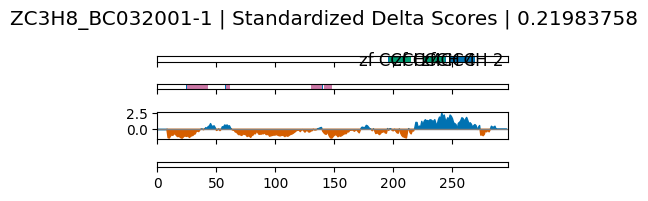

MRPL1_BC014356-1_BC032595-1 MRPL1_BC014356-1_BC032595-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL1_BC014356-1_BC032595-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L1: 93-278
Low complexity coordinates: 27-46, 49-52, 140-140, 145-145, 188-188, 191-195
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


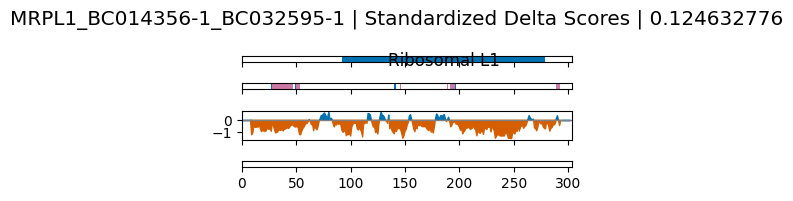

MRPL4_BC009858-2 MRPL4_BC009858-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL4_BC009858-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L4: 81-271
Low complexity coordinates: 30-30, 50-52, 143-143, 146-146
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


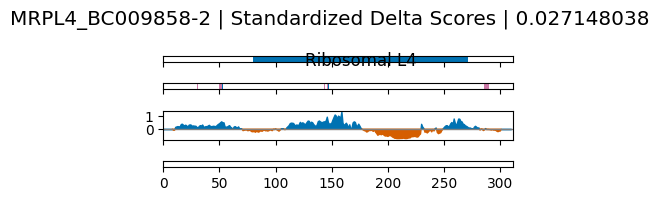

DIMT1_BC010874-2 DIMT1_BC010874-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DIMT1_BC010874-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RrnaAD: 30-255
Low complexity coordinates: 14-19, 81-83
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


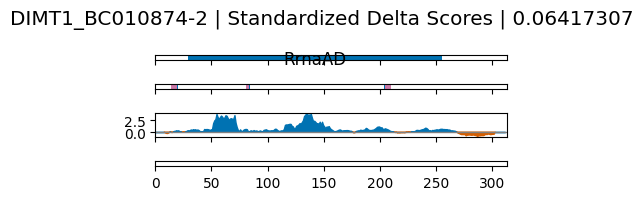

BCCIP_BC009771-1 BCCIP_BC009771-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BCCIP_BC009771-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
BCCIP: 56-256
Low complexity coordinates: 16-54, 56-57, 113-113, 231-245
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


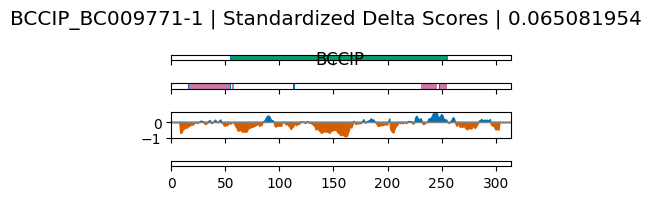

GNB2L1_BC014788-1 GNB2L1_BC014788-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GNB2L1_BC014788-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 224-260
WD40: 286-310
WD40: 96-133
WD40: 186-220
WD40: 55-91
WD40: 7-43
WD40: 145-178
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


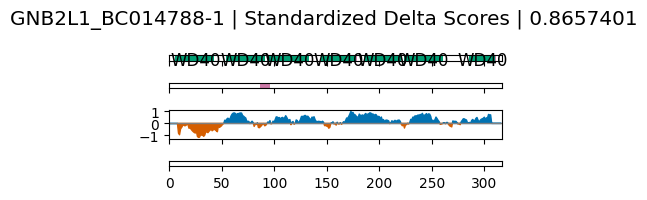

NGDN_BC030817-1 NGDN_BC030817-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NGDN_BC030817-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Sas10_Utp3: 18-98
Low complexity coordinates: 30-30, 62-62, 141-161, 167-170, 188-201, 250-251
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


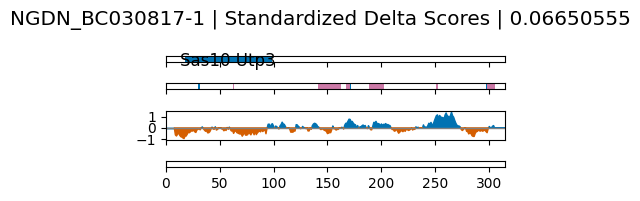

DDX47_BC009379-2 DDX47_BC009379-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX47_BC009379-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 6-82
Helicase_C: 120-226
Low complexity coordinates: 272-273
sig peak regions (p<0.05): 22-63, 187-215
sig peak regions (p<0.001): 


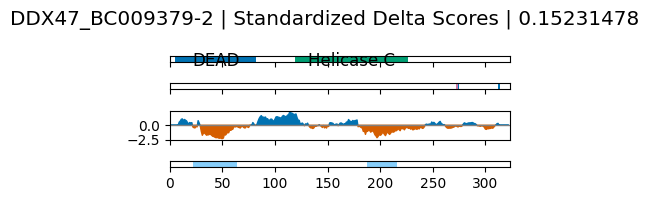

BYSL_BC007340-2 BYSL_BC007340-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BYSL_BC007340-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Bystin: 30-316
Low complexity coordinates: 76-76, 236-238, 283-284, 289-289, 292-293
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


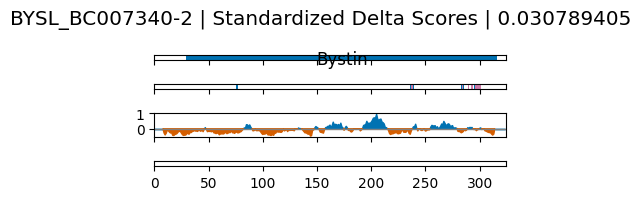

FBL_BC019260-1 FBL_BC019260-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FBL_BC019260-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Fibrillarin: 88-314
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


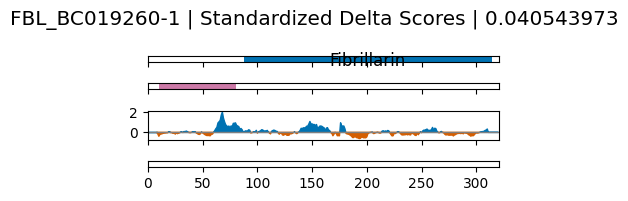

UCHL5_BC015521-1 UCHL5_BC015521-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/UCHL5_BC015521-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
UCH_C: 264-308
Peptidase_C12: 8-209
Low complexity coordinates: 
sig peak regions (p<0.05): 0-20, 29-49, 103-136, 168-223
sig peak regions (p<0.001): 


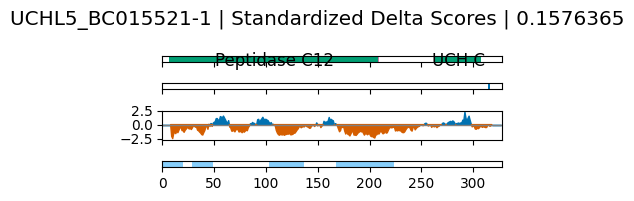

PINX1_BC015479-1 PINX1_BC015479-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PINX1_BC015479-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
G-patch: 27-69
Low complexity coordinates: 105-114, 161-166, 169-172, 246-251, 293-295
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


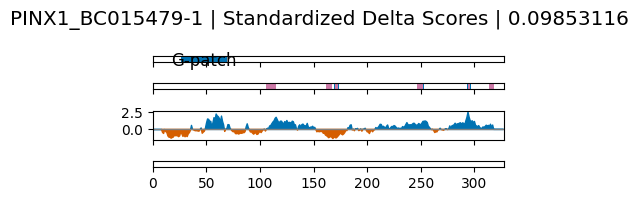

TRUB2_BC001457-2 TRUB2_BC001457-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRUB2_BC001457-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TruB_C_2: 236-300
TruB_N: 89-232
Low complexity coordinates: 98-101
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


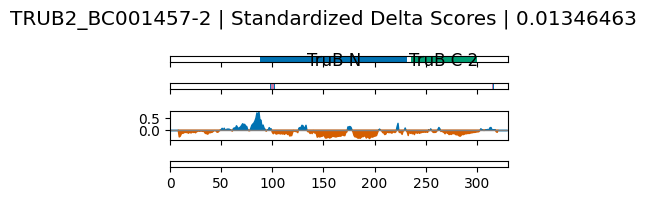

MRPL39_BC004896-2 MRPL39_BC004896-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL39_BC004896-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TGS: 81-124
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


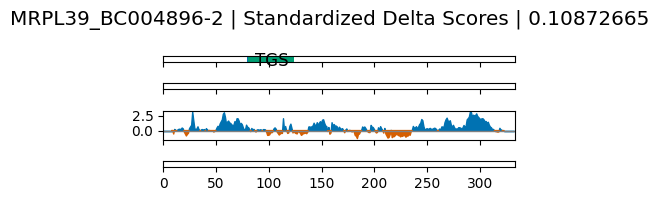

RPUSD3_BC065741-1 RPUSD3_BC065741-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPUSD3_BC065741-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PseudoU_synth_2: 82-243
Low complexity coordinates: 10-14, 87-91, 108-115, 126-127, 234-237, 291-291, 293-310, 313-313
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


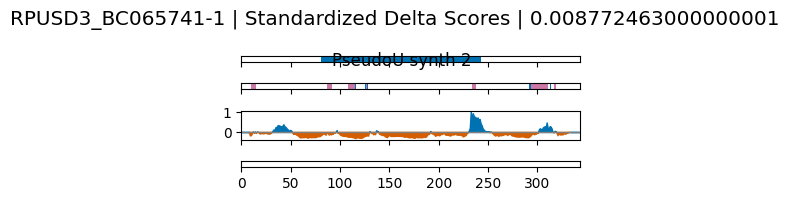

ZFP36L1_BC018340-1 ZFP36L1_BC018340-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZFP36L1_BC018340-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH: 153-178
zf-CCCH: 115-140
Tis11B_N: 1-104
Low complexity coordinates: 82-90, 187-188, 205-237, 261-263, 267-268, 270-270, 289-292, 298-318
sig peak regions (p<0.05): 117-148, 168-187, 205-274, 280-326
sig peak regions (p<0.001): 231-260


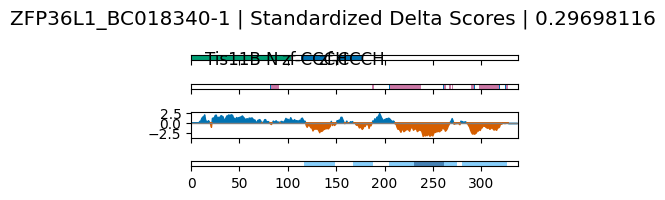

MDH2_BC001917-1 MDH2_BC001917-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MDH2_BC001917-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ldh_1_N: 26-168
Ldh_1_C: 170-334
Low complexity coordinates: 10-12, 34-34, 38-40, 42-42, 241-241, 245-246
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


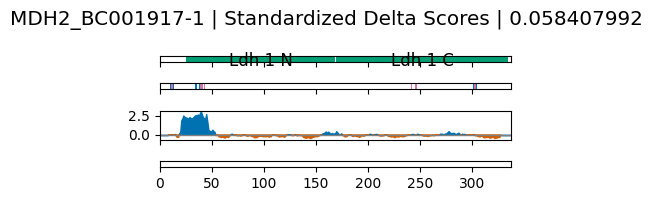

TFB1M_BC017788-1 TFB1M_BC017788-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TFB1M_BC017788-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RrnaAD: 28-283
Low complexity coordinates: 15-16, 20-20, 30-34, 244-244
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


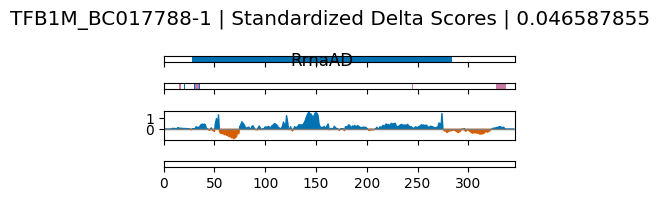

QKI_BC019917-2 QKI_BC019917-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/QKI_BC019917-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
A-ATP_synth_H_N: 157-179
Quaking_NLS: 312-341
KH_1: 97-125
STAR_dimer: 10-62
Low complexity coordinates: 172-176, 180-180, 215-216, 218-223, 226-247, 270-270, 281-288
sig peak regions (p<0.05): 232-282
sig peak regions (p<0.001): 


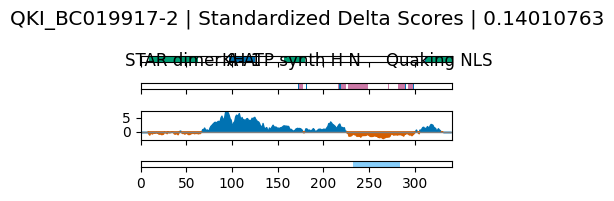

SRSF6_BC006832-2 SRSF6_BC006832-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF6_BC006832-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 112-177
RRM_1: 4-64
Low complexity coordinates: 77-97, 188-277, 279-295
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


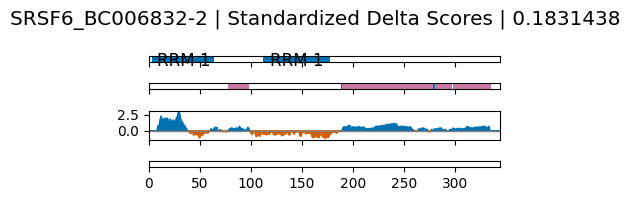

TWF2_BC016452-1 TWF2_BC016452-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TWF2_BC016452-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Cofilin_ADF: 187-310
Cofilin_ADF: 14-132
Low complexity coordinates: 59-60, 62-63, 181-185, 321-327
sig peak regions (p<0.05): 0-26, 33-52, 62-93, 113-138, 281-314
sig peak regions (p<0.001): 


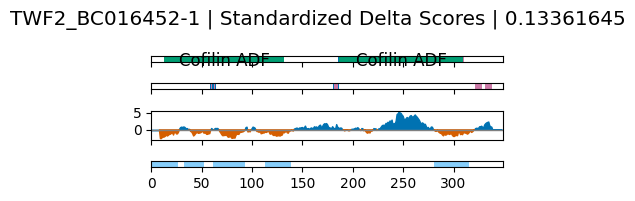

KHDRBS2_BC034043-1 KHDRBS2_BC034043-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/KHDRBS2_BC034043-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 62-117
Qua1: 5-57
Sam68-YY: 267-321
Low complexity coordinates: 36-40, 50-51, 112-112, 181-288
sig peak regions (p<0.05): 0-24, 117-229, 234-263, 265-348
sig peak regions (p<0.001): 0-20, 281-308


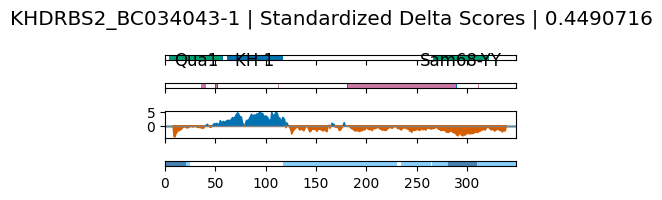

PURG_BC106708-2 PURG_BC106708-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PURG_BC106708-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PurA: 58-321
Low complexity coordinates: 10-21, 35-35, 40-41, 43-44, 137-143, 159-161, 199-202
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


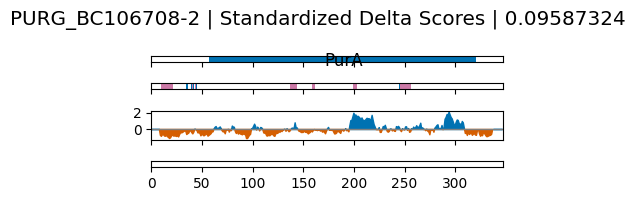

HEATR1_BC011983-1 HEATR1_BC011983-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HEATR1_BC011983-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Cnd1: 266-339
BP28CT: 65-216
Low complexity coordinates: 12-12, 17-25, 297-297, 316-316
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


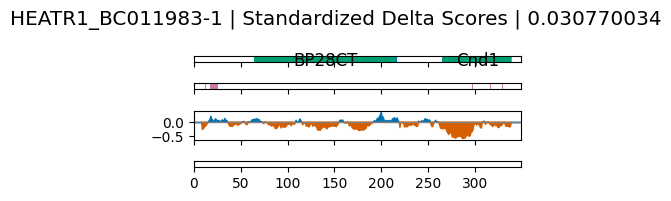

MRPL3_BC003375-2 MRPL3_BC003375-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL3_BC003375-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L3: 115-278
Low complexity coordinates: 12-21
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


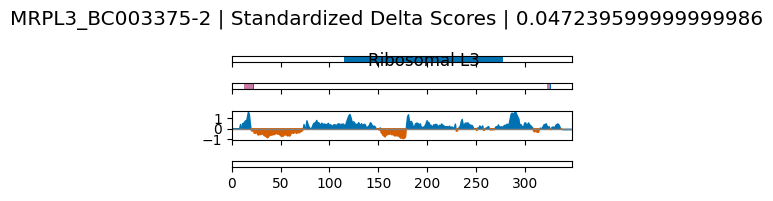

GPANK1_BC008783-1 GPANK1_BC008783-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GPANK1_BC008783-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-DBF: 216-236
G-patch: 256-298
Ank_4: 106-163
Low complexity coordinates: 63-63, 66-68, 70-78, 86-87, 89-90, 118-124, 156-162, 241-241, 245-249, 252-253, 255-256, 265-275, 326-329, 331-331
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


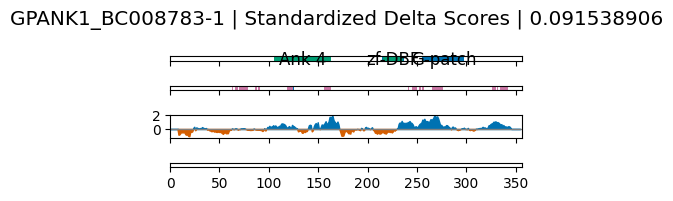

DND1_BC033496-1 DND1_BC033496-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DND1_BC033496-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 141-199
DND1_DSRM: 254-333
RRM_1: 60-121
Low complexity coordinates: 43-44, 46-47, 49-53, 102-103, 105-107, 152-173, 231-232, 251-252, 332-332, 334-334
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


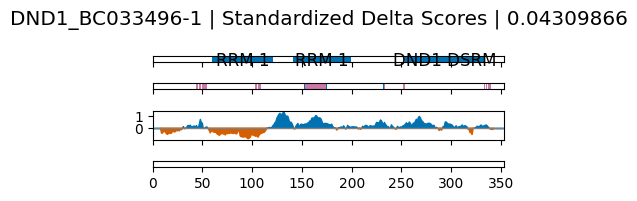

MRM1_BC072411-1 MRM1_BC072411-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRM1_BC072411-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SpoU_sub_bind: 51-128
SpoU_methylase: 146-301
Low complexity coordinates: 32-32, 34-34, 38-44, 64-85, 262-264
sig peak regions (p<0.05): 147-183
sig peak regions (p<0.001): 


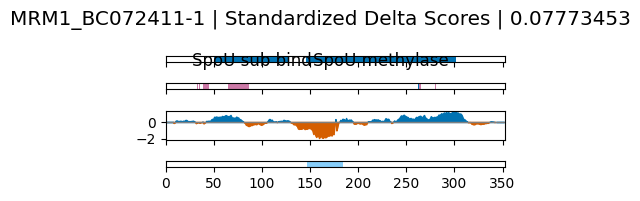

EIF3H_BC000386-2 EIF3H_BC000386-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF3H_BC000386-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
JAB: 35-146
eIF3h_C: 157-351
Low complexity coordinates: 10-36, 60-68, 225-228, 235-236, 268-288
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


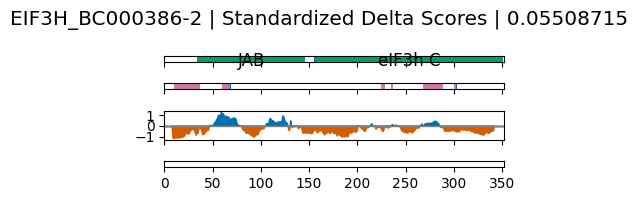

ASCC1_BC012291-1 ASCC1_BC012291-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ASCC1_BC012291-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 63-120
AKAP7_NLS: 133-356
Low complexity coordinates: 145-148
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


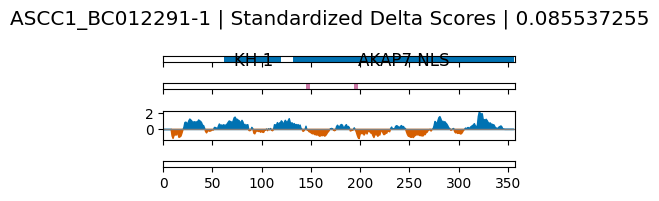

DCN_BC005322-1 DCN_BC005322-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DCN_BC005322-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LRR_4: 201-237
LRRNT: 54-80
LRR_8: 84-141
LRR_8: 221-281
LRR_8: 269-312
LRR_8: 151-212
Low complexity coordinates: 76-82, 110-111, 136-136, 139-139
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


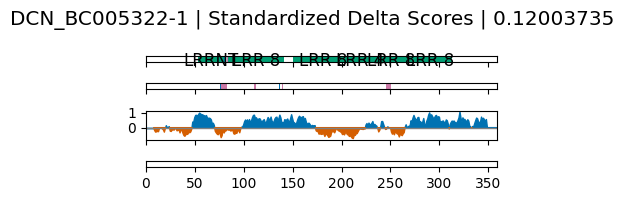

SNRNP40_BC001494-2 SNRNP40_BC001494-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNRNP40_BC001494-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 226-263
WD40: 102-137
WD40: 273-313
WD40: 58-94
WD40: 141-180
WD40: 319-352
Low complexity coordinates: 15-15, 28-28, 31-43
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


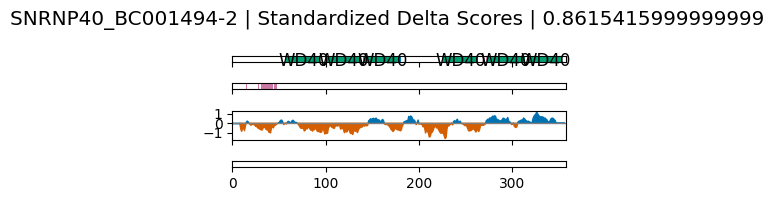

SCAF8_BC070071-1 SCAF8_BC070071-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SCAF8_BC070071-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Transformer: 397-467
CID: 6-131
RRM_1: 479-544
Low complexity coordinates: 26-32, 143-144, 147-162, 164-168, 194-219, 222-223, 227-247, 307-321, 323-326, 340-344, 347-348, 366-366, 368-381, 383-386, 390-391, 397-453, 457-459, 601-629, 638-717, 742-743, 748-748, 826-831, 840-850, 853-905, 933-949, 955-956, 960-963, 971-973, 1026-1026, 1028-1028, 1031-1055, 1057-1057, 1129-1131, 1150-1163, 1166-1167, 1169-1171, 1257-1258
sig peak regions (p<0.05): 148-169, 509-542, 873-894
sig peak regions (p<0.001): 


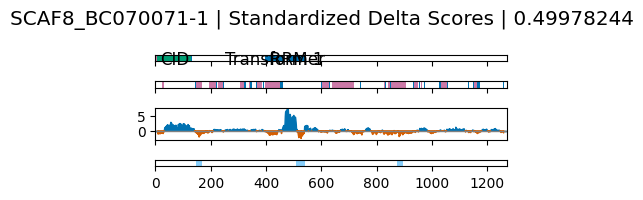

DZIP3_BC063882-1 DZIP3_BC063882-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DZIP3_BC063882-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TTC3_DZIP3_dom: 228-332
HEPN_DZIP3: 421-559
zf-RING_2: 1148-1188
Low complexity coordinates: 27-29, 47-48, 53-55, 57-58, 502-503, 594-594, 599-611, 651-673, 675-676, 945-956, 959-960, 1017-1019, 1094-1100, 1104-1106, 1108-1113, 1116-1116, 1134-1138
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


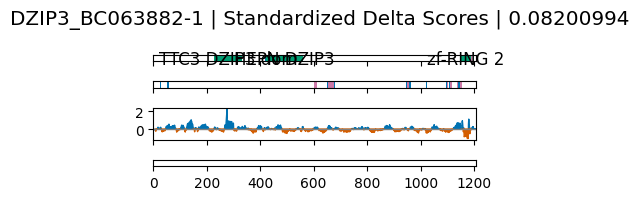

PABPC5_BC063113-1 PABPC5_BC063113-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PABPC5_BC063113-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 108-175
RRM_1: 201-269
RRM_1: 304-372
RRM_1: 20-88
Low complexity coordinates: 17-18, 188-188, 281-290, 292-292
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


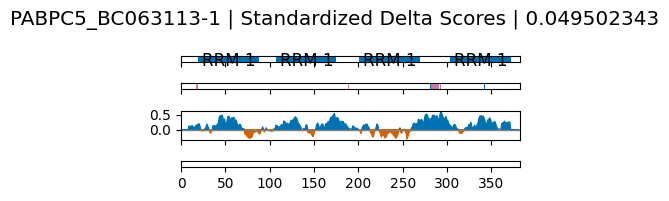

SUPT5H_BC024203-2 SUPT5H_BC024203-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SUPT5H_BC024203-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KOW: 596-626
KOW: 422-450
KOW: 276-305
KOW: 475-499
KOW: 707-737
Spt5-NGN: 178-264
Spt5_N: 75-172
Low complexity coordinates: 10-65, 83-97, 106-107, 147-147, 272-272, 323-323, 672-672, 675-698, 756-781, 837-837, 852-858, 860-872, 896-912, 924-925, 932-961
sig peak regions (p<0.05): 174-193, 350-369, 663-687, 757-795, 836-960
sig peak regions (p<0.001): 


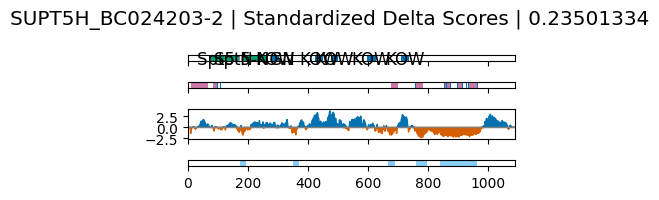

MAK16_BC050528-1 MAK16_BC050528-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MAK16_BC050528-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Mak16: 139-237
Ribosomal_L28e: 6-119
Low complexity coordinates: 119-126, 128-148, 151-161, 194-225, 227-231, 234-239
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


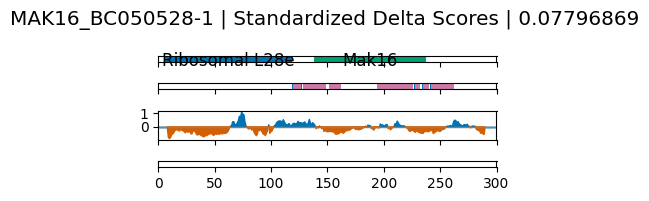

HNRPLL_BC008217-1 HNRPLL_BC008217-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HNRPLL_BC008217-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 74-123
RRM_8: 160-238
Low complexity coordinates: 13-13, 38-55, 57-57, 71-73
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


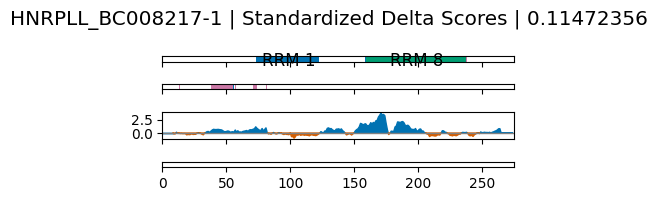

GTF2E2_BC030572-2 GTF2E2_BC030572-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GTF2E2_BC030572-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TFIIE_beta: 74-145
TFA2_Winged_2: 146-204
Low complexity coordinates: 22-47, 50-55, 57-57, 60-60, 67-67, 69-69, 102-102, 154-164
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


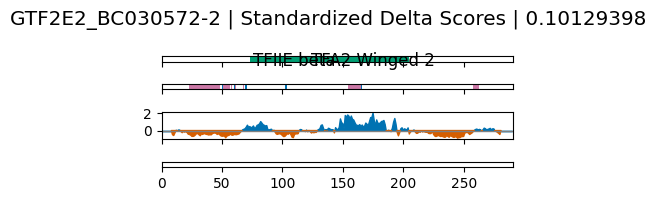

BCDIN3D_BC053560-1 BCDIN3D_BC053560-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BCDIN3D_BC053560-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Methyltransf_12: 71-128
Bin3: 158-263
Low complexity coordinates: 43-60
sig peak regions (p<0.05): 53-87, 93-138, 159-178
sig peak regions (p<0.001): 110-129


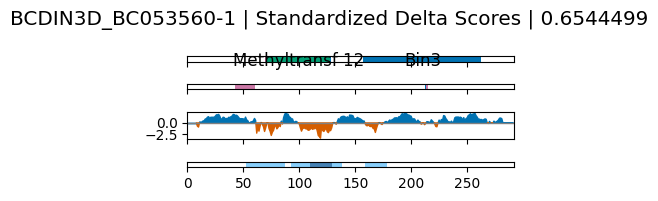

SLC25A5_BC056160-1 SLC25A5_BC056160-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SLC25A5_BC056160-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Mito_carr: 209-297
Mito_carr: 6-100
Mito_carr: 111-204
Low complexity coordinates: 11-14
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


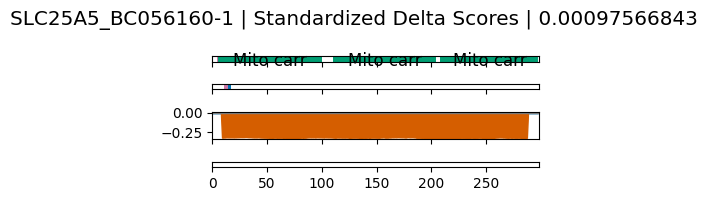

MRPS15_BC031336-1 MRPS15_BC031336-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPS15_BC031336-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S15: 108-187
Low complexity coordinates: 11-11, 104-104
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


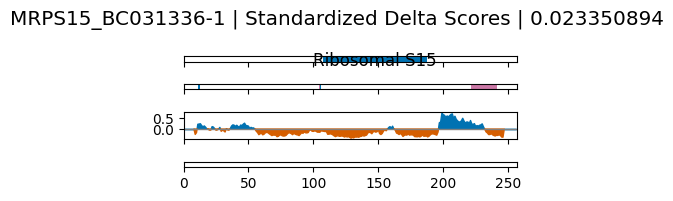

PEG10_BC050659-2 PEG10_BC050659-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PEG10_BC050659-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC_5: 293-314
DUF4939: 76-158
Retrotrans_gag: 120-211
Low complexity coordinates: 17-17, 30-36, 38-38, 42-42, 44-49, 51-51, 57-77, 79-80, 236-238, 243-255
sig peak regions (p<0.05): 0-52, 262-324
sig peak regions (p<0.001): 13-44, 276-323


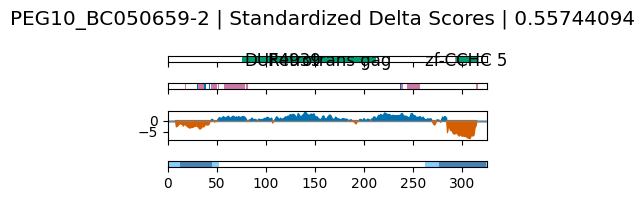

ZRANB2_BC039814-1 ZRANB2_BC039814-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZRANB2_BC039814-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-RanBP: 67-93
zf-RanBP: 10-35
Low complexity coordinates: 43-48, 105-118, 122-127, 147-191
sig peak regions (p<0.05): 0-20, 35-56, 66-87
sig peak regions (p<0.001): 


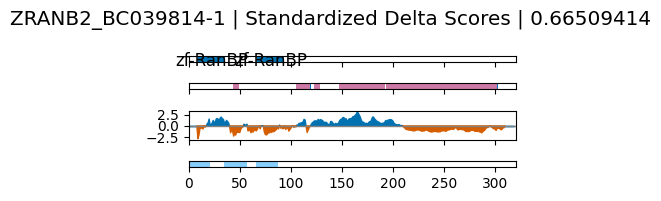

NUP35_BC047029-1_BC061698-1 NUP35_BC047029-1_BC061698-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NUP35_BC047029-1_BC061698-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Nup35_RRM: 168-251
Low complexity coordinates: 64-64, 79-80
sig peak regions (p<0.05): 5-34, 40-63, 112-146, 148-170, 241-261, 290-324
sig peak regions (p<0.001): 241-260, 295-314


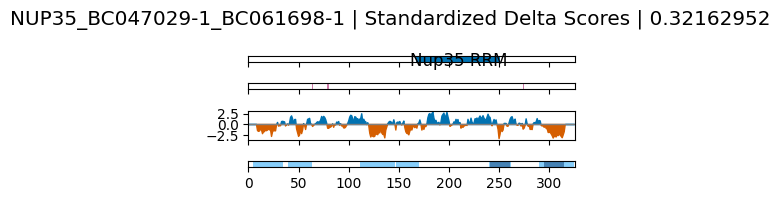

SURF6_BC014878-1 SURF6_BC014878-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SURF6_BC014878-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SURF6: 141-340
Low complexity coordinates: 38-59, 61-63, 65-71, 75-94, 99-99, 137-137, 141-186, 242-249, 289-306
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


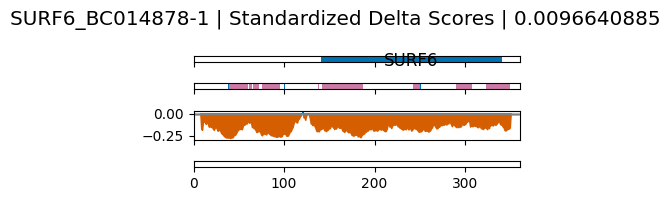

PCBP4_BC017098-1 PCBP4_BC017098-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PCBP4_BC017098-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 103-129
KH_1: 19-79
KH_1: 201-263
Low complexity coordinates: 34-35, 56-60, 275-302
sig peak regions (p<0.05): 41-61, 87-112, 142-172, 173-208, 222-255
sig peak regions (p<0.001): 


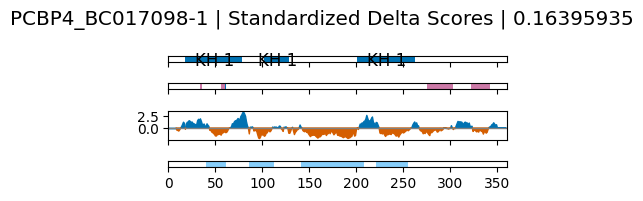

GTPBP10_BC021573-1 GTPBP10_BC021573-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GTPBP10_BC021573-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU: 237-312
MMR_HSR1: 121-250
GTP1_OBG: 7-102
Low complexity coordinates: 97-101, 227-237
sig peak regions (p<0.05): 110-148, 156-198
sig peak regions (p<0.001): 112-138, 156-197


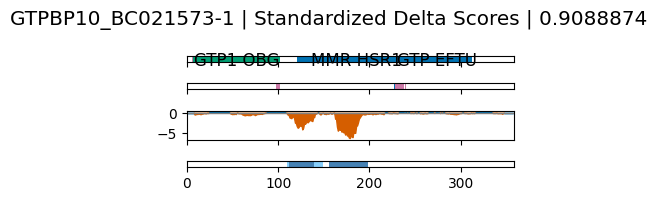

THUMPD1_BC000448-2 THUMPD1_BC000448-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/THUMPD1_BC000448-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
THUMP: 120-253
Low complexity coordinates: 10-12, 19-19
sig peak regions (p<0.05): 0-20, 48-88, 161-193, 277-352
sig peak regions (p<0.001): 56-80, 164-185, 282-343


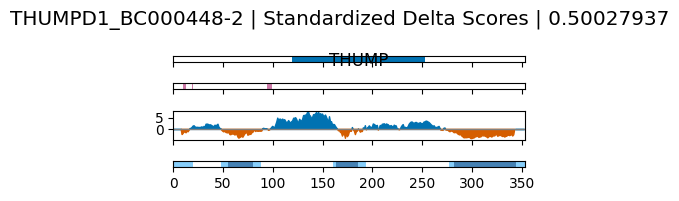

POU5F1_BC117437-1 POU5F1_BC117437-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/POU5F1_BC117437-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Homeodomain: 231-287
Pou: 143-212
Low complexity coordinates: 10-26, 41-61, 67-68, 70-70, 78-80, 85-94, 102-104, 134-134, 136-136, 143-149, 306-318
sig peak regions (p<0.05): 248-295, 306-328
sig peak regions (p<0.001): 251-286


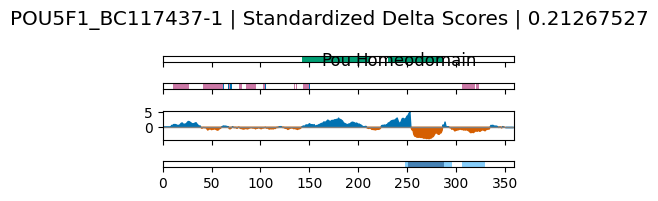

RRS1_BC001811-2_BC013043-2 RRS1_BC001811-2_BC013043-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RRS1_BC001811-2_BC013043-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRS1: 32-193
Low complexity coordinates: 11-11, 68-68, 70-70, 88-91, 94-109, 181-182, 185-187, 294-295
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


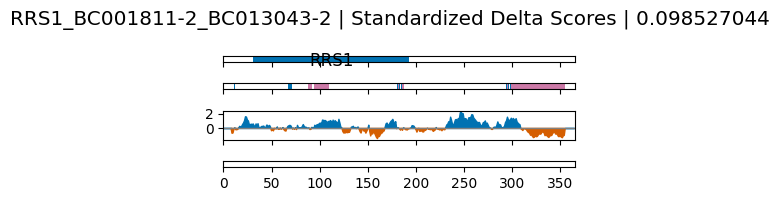

KIAA1967_BC018269-1 KIAA1967_BC018269-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/KIAA1967_BC018269-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KASH_CCD: 254-354
Low complexity coordinates: 10-38, 56-56, 58-58, 61-74, 76-76, 86-103, 145-146, 214-220, 233-233
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


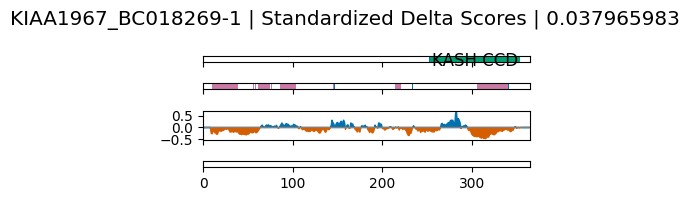

SAMSN1_BC029112-1 SAMSN1_BC029112-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SAMSN1_BC029112-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SLY: 17-164
SAM_2: 240-302
SH3_2: 167-219
Low complexity coordinates: 11-12, 26-30, 56-56, 58-60, 73-73, 76-77, 86-88, 125-145, 184-184, 186-189, 194-195, 231-234, 277-277, 279-280, 301-316, 318-322, 326-327
sig peak regions (p<0.05): 90-189, 321-351
sig peak regions (p<0.001): 124-159, 161-188


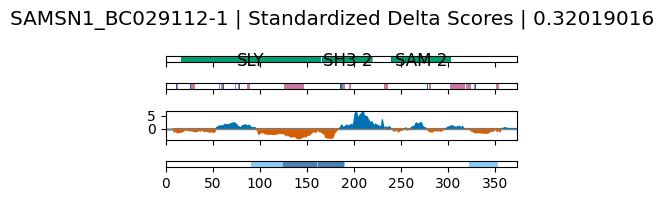

PSMD4_BC002365-2 PSMD4_BC002365-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PSMD4_BC002365-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
UIM: 282-297
VWA_2: 6-114
Low complexity coordinates: 125-131, 141-141, 179-179, 183-192, 198-198, 223-250, 312-314, 316-316
sig peak regions (p<0.05): 0-30, 109-135
sig peak regions (p<0.001): 


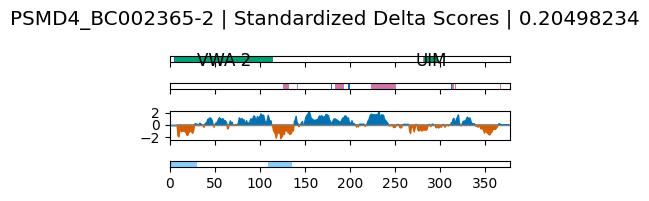

LYAR_BC015796-2 LYAR_BC015796-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LYAR_BC015796-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NPM1-C: 108-135
zf-LYAR: 31-58
zf-ACC: 3-28
Low complexity coordinates: 63-65, 177-177, 182-214, 235-235, 241-242, 249-264, 266-269, 288-288, 290-299, 302-302, 363-363
sig peak regions (p<0.05): 0-56
sig peak regions (p<0.001): 


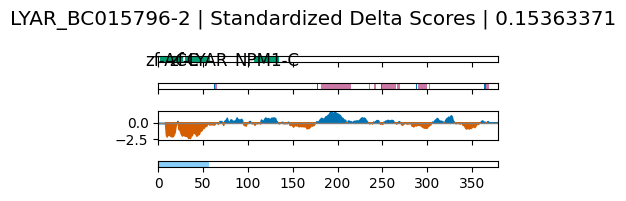

GPATCH2_BC063474-1 GPATCH2_BC063474-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GPATCH2_BC063474-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 63-64, 107-109, 158-159, 249-265
sig peak regions (p<0.05): 350-370
sig peak regions (p<0.001): 


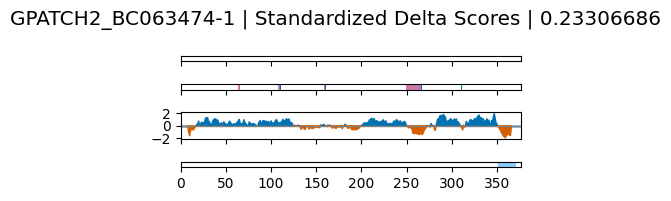

RTCA_BC012604-1 RTCA_BC012604-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RTCA_BC012604-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RTC: 13-350
Low complexity coordinates: 90-90, 216-218
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


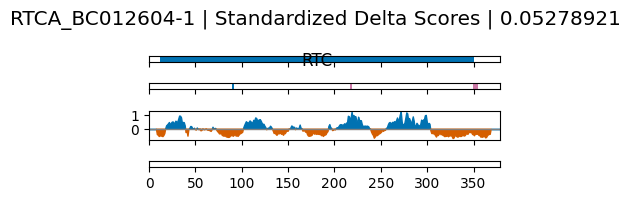

RDBP_BC025235-1_BC050617-2 RDBP_BC025235-1_BC050617-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RDBP_BC025235-1_BC050617-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 269-323
Low complexity coordinates: 14-36, 38-44, 129-129, 131-132, 147-158
sig peak regions (p<0.05): 39-81, 153-235, 269-330
sig peak regions (p<0.001): 47-71, 301-326


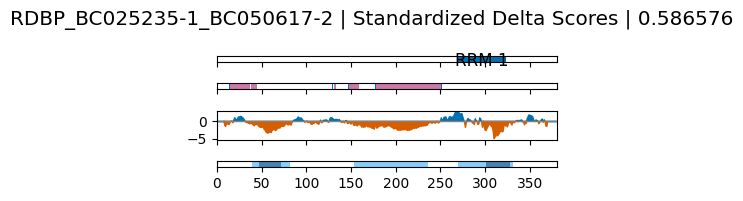

APOBEC3G_BC024268-1 APOBEC3G_BC024268-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/APOBEC3G_BC024268-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NAD2: 196-379
NAD2: 10-193
Low complexity coordinates: 
sig peak regions (p<0.05): 316-335
sig peak regions (p<0.001): 


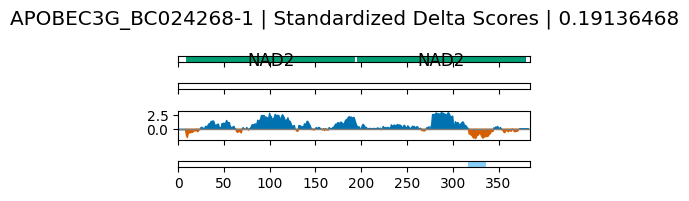

MBNL1_BC043493-1 MBNL1_BC043493-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MBNL1_BC043493-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH_2: 221-239
zf-CCCH_2: 53-71
zf-CCCH_4: 18-39
zf-CCCH_4: 184-205
Low complexity coordinates: 90-107, 114-114, 123-124, 136-136, 158-166, 247-271
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


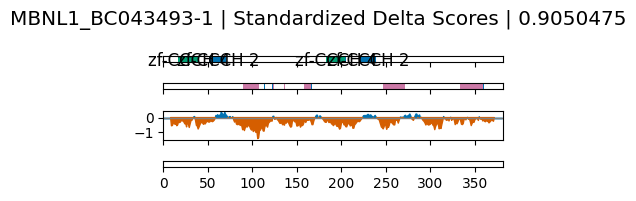

LUC7L2_BC017163-2_BC050708-2_BC056886-1 LUC7L2_BC017163-2_BC050708-2_BC056886-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LUC7L2_BC017163-2_BC050708-2_BC056886-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LUC7: 6-244
Low complexity coordinates: 111-114, 121-122, 137-137, 140-140, 158-164, 206-207, 218-220, 227-337, 339-364, 366-366
sig peak regions (p<0.05): 0-19, 172-191, 292-331, 356-380
sig peak regions (p<0.001): 


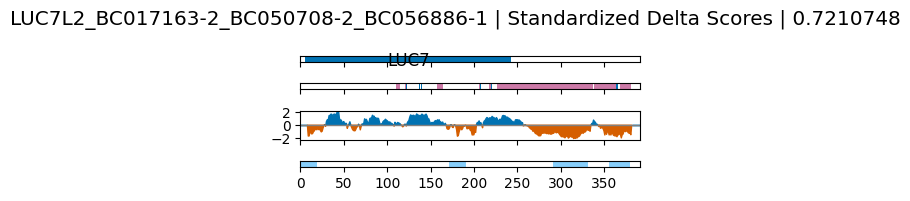

RBMX_BC006550-2 RBMX_BC006550-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBMX_BC006550-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 10-80
RBM1CTR: 173-217
Low complexity coordinates: 69-69, 92-126, 133-134, 148-189, 191-196, 198-204, 213-239, 241-282, 285-285, 293-338, 350-350
sig peak regions (p<0.05): 56-80
sig peak regions (p<0.001): 


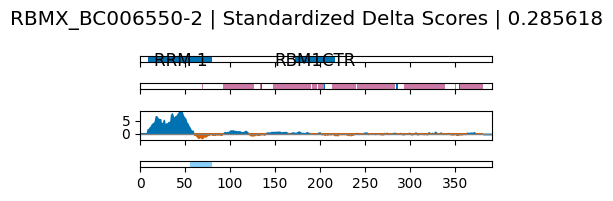

ILF2_BC000382-2 ILF2_BC000382-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ILF2_BC000382-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DZF_C: 220-351
DZF_N: 22-216
Low complexity coordinates: 10-25, 127-128
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


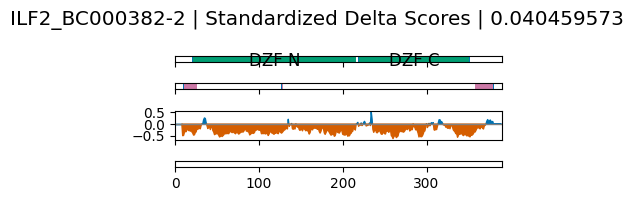

ACAA2_BC001918-1 ACAA2_BC001918-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ACAA2_BC001918-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Thiolase_C: 274-394
Thiolase_N: 7-266
Low complexity coordinates: 30-34, 247-259, 354-354
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


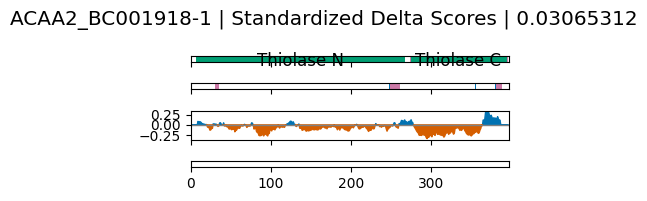

MRPS31_BC022045-1 MRPS31_BC022045-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPS31_BC022045-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MRP-S31: 96-389
Low complexity coordinates: 10-19, 76-90, 125-130, 132-132, 152-152, 156-159, 177-181, 183-185
sig peak regions (p<0.05): 71-97, 304-340, 360-394
sig peak regions (p<0.001): 


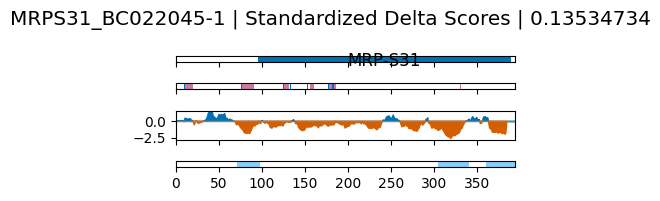

PA2G4_BC001951-1_BC007561-1_BC069786-1 PA2G4_BC001951-1_BC007561-1_BC069786-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PA2G4_BC001951-1_BC007561-1_BC069786-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Peptidase_M24: 23-201
Low complexity coordinates: 36-41, 43-43, 59-67, 135-135, 219-219
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


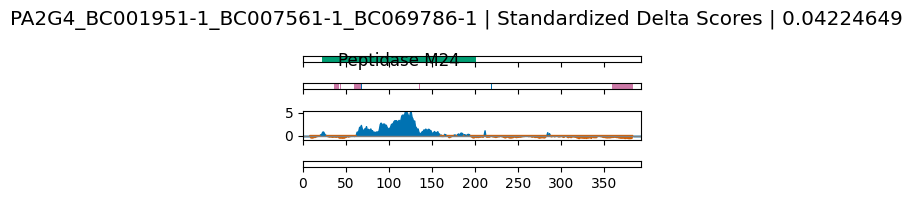

SNIP1_BC027040-1 SNIP1_BC027040-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNIP1_BC027040-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FHA: 281-361
Low complexity coordinates: 11-11, 17-19, 30-30, 44-45, 47-61, 67-67, 69-72, 75-98, 114-134, 137-143, 145-145, 149-149, 151-154, 158-159, 169-169, 179-184, 213-213, 223-223
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


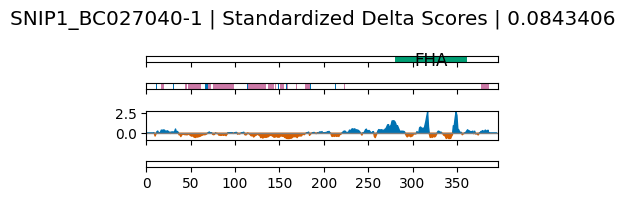

RBMS1_BC018951-2 RBMS1_BC018951-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBMS1_BC018951-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 143-207
RRM_1: 64-124
Low complexity coordinates: 10-10, 12-20, 33-33, 36-55, 119-127, 292-294, 299-302, 337-340
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


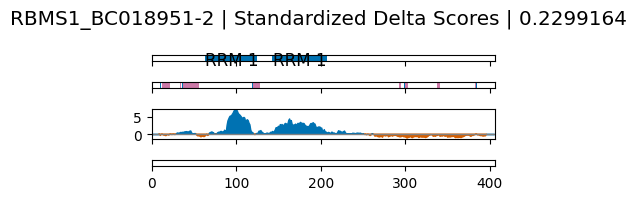

EIF4A3_BC004386-1_BC011151-1 EIF4A3_BC004386-1_BC011151-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF4A3_BC004386-1_BC011151-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 264-372
DEAD: 63-225
Low complexity coordinates: 26-26, 28-32
sig peak regions (p<0.05): 66-103, 169-207, 334-359
sig peak regions (p<0.001): 68-87


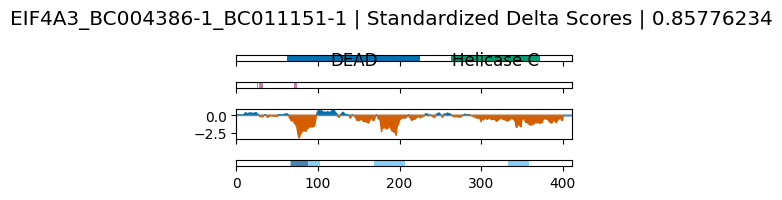

EIF4A1_BC009585-1 EIF4A1_BC009585-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF4A1_BC009585-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 57-222
Helicase_C: 259-367
Low complexity coordinates: 
sig peak regions (p<0.05): 62-97, 171-204, 329-350
sig peak regions (p<0.001): 177-201


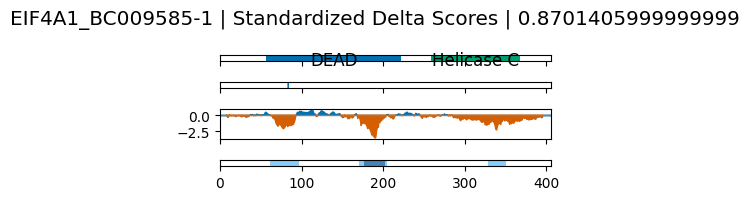

RBMS2_BC027863-1 RBMS2_BC027863-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBMS2_BC027863-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 58-118
RRM_1: 137-201
Low complexity coordinates: 33-48, 116-121, 281-294, 339-340, 343-344, 347-347
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


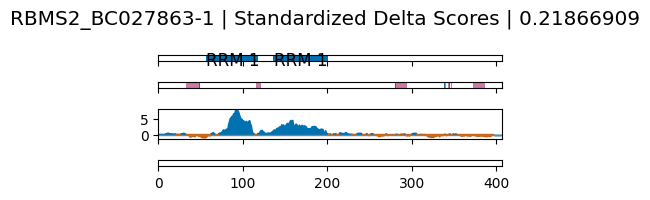

TES_BC001451-1 TES_BC001451-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TES_BC001451-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LIM: 301-356
LIM: 236-296
LIM: 361-414
PET: 92-193
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


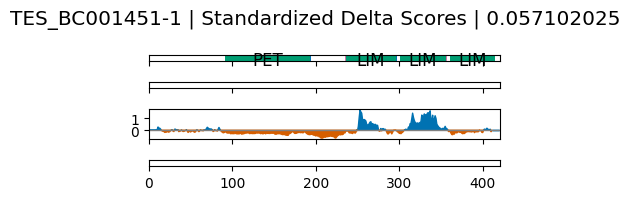

CALR_BC002500-2_BC007911-1_BC020493-1 CALR_BC002500-2_BC007911-1_BC020493-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CALR_BC002500-2_BC007911-1_BC020493-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Calreticulin: 23-257
Low complexity coordinates: 10-12, 14-14, 54-54, 205-210, 213-217, 219-219, 224-224, 226-227, 229-229, 233-249, 251-254, 259-259
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


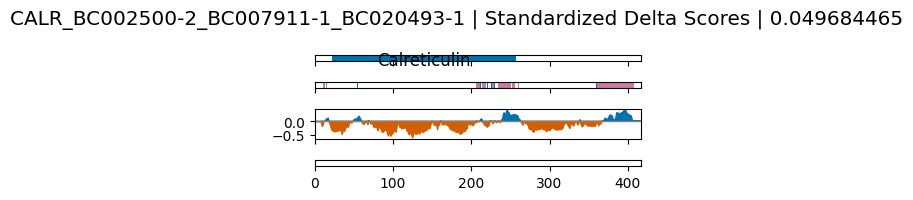

FDPS_BC010004-2 FDPS_BC010004-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FDPS_BC010004-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
polyprenyl_synt: 110-374
Low complexity coordinates: 23-24, 209-209, 214-214
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


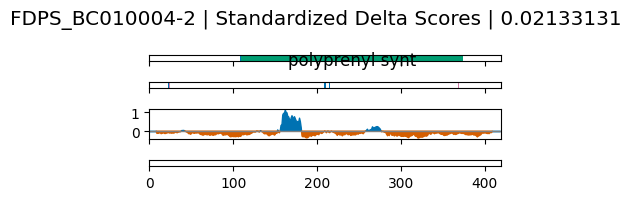

NOLC1_BC006769-2 NOLC1_BC006769-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOLC1_BC006769-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SRP40_C: 343-415
Low complexity coordinates: 10-23, 25-27, 35-96, 104-126, 129-129, 140-175, 179-250, 253-254, 269-271, 276-299, 310-313, 315-316, 318-318, 339-342, 346-346, 348-349, 353-354
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


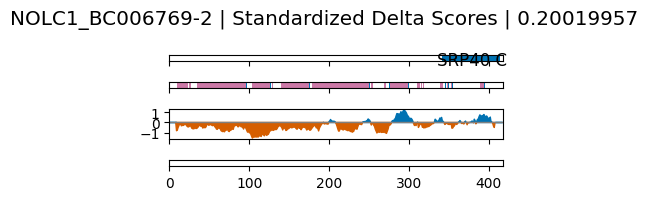

GRN_BC000324-2 GRN_BC000324-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GRN_BC000324-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Granulin: 72-112
Granulin: 220-261
Granulin: 377-418
Granulin: 295-336
Granulin: 138-179
Low complexity coordinates: 101-101, 370-372, 401-406, 409-409
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


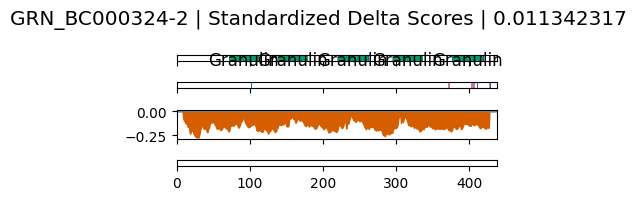

MFAP1_BC023557-2_BC050742-1 MFAP1_BC023557-2_BC050742-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MFAP1_BC023557-2_BC050742-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MFAP1: 191-399
Low complexity coordinates: 59-79, 81-81, 83-85, 117-117, 120-163, 166-190, 215-215, 217-231, 239-251, 253-256, 259-264, 266-269, 281-284
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


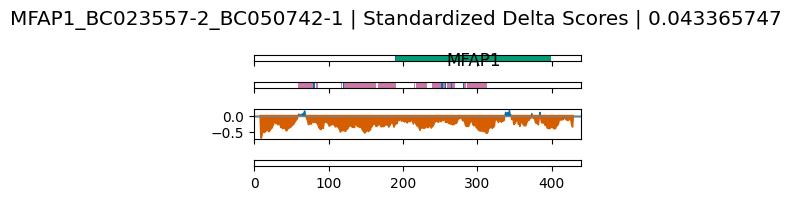

RBM23_BC002566-2 RBM23_BC002566-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM23_BC002566-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RBM39linker: 347-423
RRM_1: 249-318
RRM_1: 152-216
Low complexity coordinates: 24-24, 39-104, 180-180, 182-182
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


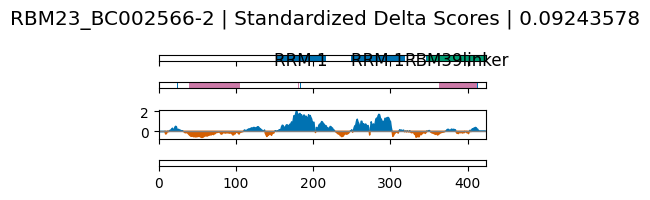

MRPL37_BC000041-2 MRPL37_BC000041-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL37_BC000041-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 10-21, 23-23, 81-81, 397-400
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


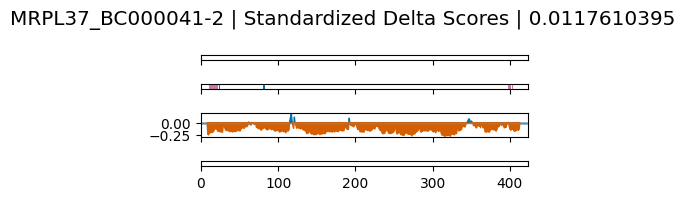

SRFBP1_BC031222-1 SRFBP1_BC031222-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRFBP1_BC031222-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 16-34, 107-109, 126-126, 143-143, 147-147, 224-224, 233-250, 253-253, 255-261, 270-270
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


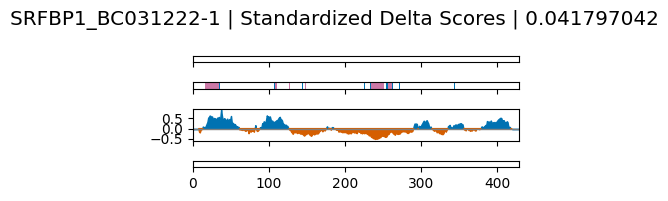

REXO4_BC009274-2 REXO4_BC009274-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/REXO4_BC009274-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RNase_T: 245-394
Low complexity coordinates: 10-16, 19-19, 22-42, 48-54, 100-100, 102-102, 104-106, 178-178, 182-183, 192-197, 200-202, 205-207, 228-229
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


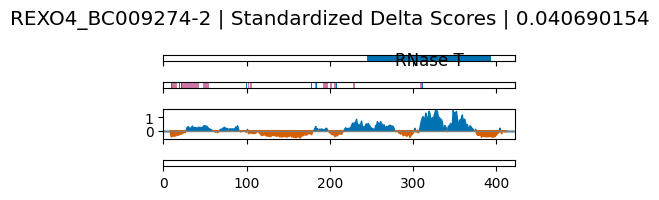

SF3B4_BC004273-1_BC013886-2 SF3B4_BC004273-1_BC013886-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SF3B4_BC004273-1_BC013886-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 102-172
RRM_1: 15-85
Low complexity coordinates: 209-213, 216-216
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


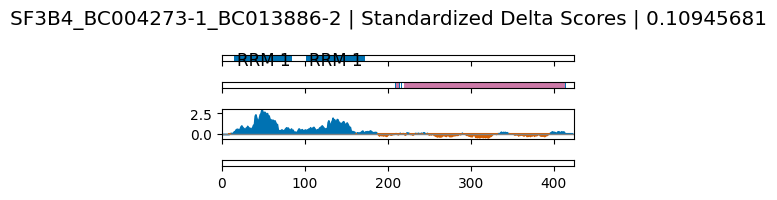

KRT18_BC000698-2 KRT18_BC000698-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/KRT18_BC000698-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Filament: 79-389
Low complexity coordinates: 22-71, 106-106, 108-108, 200-201, 204-204, 208-209, 211-211, 213-213, 281-292, 296-296, 351-351
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


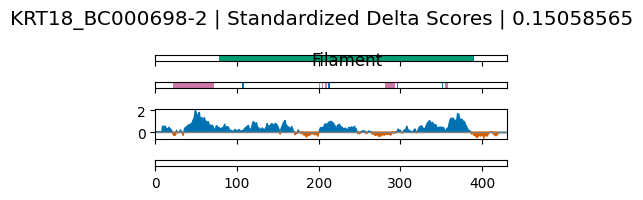

WDR3_BC058836-1 WDR3_BC058836-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/WDR3_BC058836-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


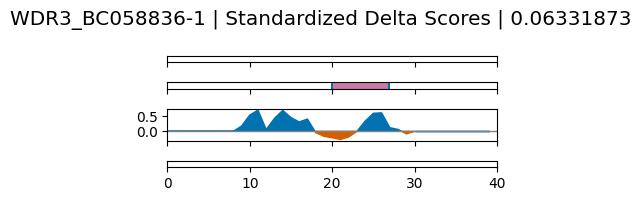

G3BP2_BC011731-2 G3BP2_BC011731-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/G3BP2_BC011731-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 300-356
NTF2: 11-133
Low complexity coordinates: 140-163, 188-275, 279-279, 373-377, 380-421, 423-425, 427-429
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


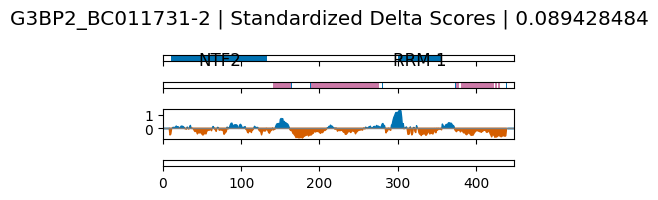

CORO1A_BC126385-1_BC126387-1 CORO1A_BC126385-1_BC126387-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CORO1A_BC126385-1_BC126387-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 122-160
WD40: 175-202
DUF1899: 5-69
WD40: 76-109
Trimer_CC: 410-461
WD40_4: 345-387
Low complexity coordinates: 377-378
sig peak regions (p<0.05): 78-128, 134-203
sig peak regions (p<0.001): 84-106, 141-172


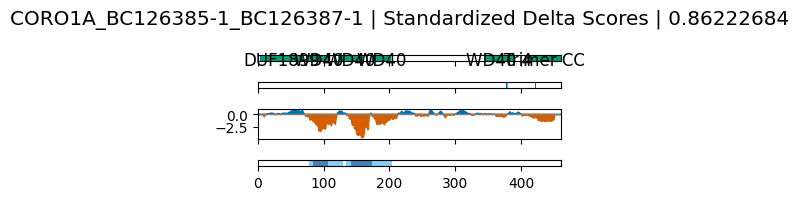

FLYWCH2_BC014089-2 FLYWCH2_BC014089-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FLYWCH2_BC014089-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FLYWCH_N: 1-106
Low complexity coordinates: 10-16, 47-47, 49-49, 83-83, 88-89, 91-91, 93-96, 115-116
sig peak regions (p<0.05): 0-36, 81-110
sig peak regions (p<0.001): 


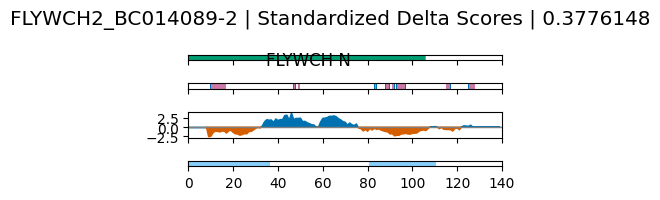

MBNL2_BC104040-1 MBNL2_BC104040-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MBNL2_BC104040-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH: 17-40
zf-CCCH_2: 218-236
zf-CCCH_2: 53-71
zf-CCCH_4: 181-202
Low complexity coordinates: 94-94, 98-98, 109-109, 115-115, 140-161, 243-270
sig peak regions (p<0.05): 98-117, 234-264
sig peak regions (p<0.001): 


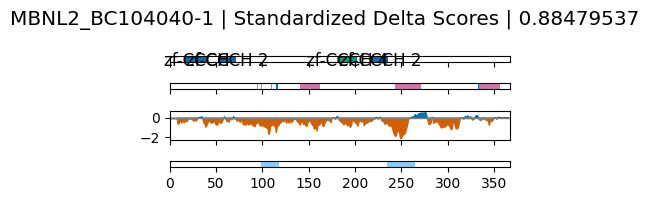

RPUSD4_BC014131-2 RPUSD4_BC014131-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPUSD4_BC014131-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PseudoU_synth_2: 105-276
Low complexity coordinates: 41-44, 75-75, 246-246
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


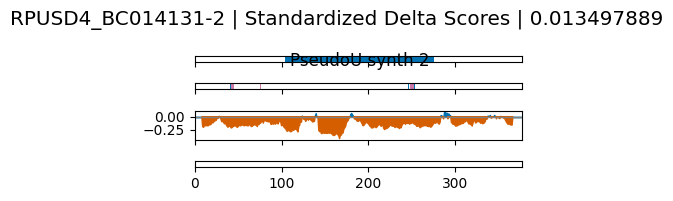

TRMT10C_BC035967-1 TRMT10C_BC035967-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRMT10C_BC035967-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
tRNA_m1G_MT: 207-374
Low complexity coordinates: 14-17, 56-56, 126-134, 136-137, 139-154
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


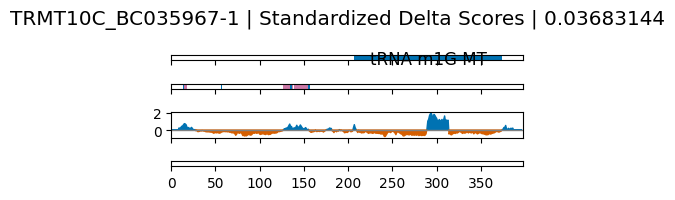

MRPS5_BC014172-2 MRPS5_BC014172-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPS5_BC014172-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S5: 218-283
Ribosomal_S5_C: 297-365
S5p_N: 88-207
Low complexity coordinates: 99-125, 167-167, 180-180, 199-202, 396-396
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


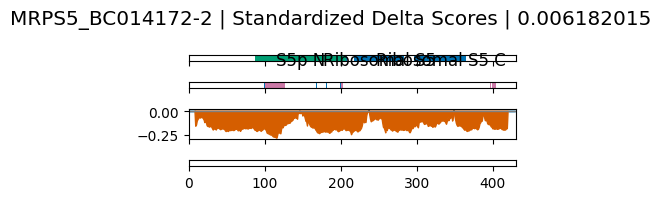

BZW1_BC026303-1 BZW1_BC026303-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BZW1_BC026303-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
W2: 338-414
Low complexity coordinates: 23-23, 128-136, 142-142, 159-160, 162-162, 165-166
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


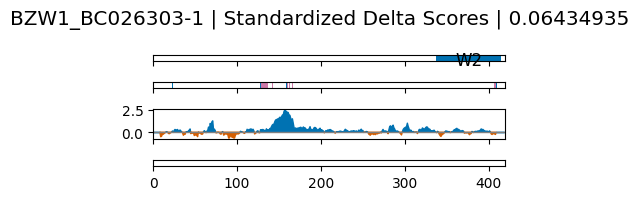

RPL4_BC001365-2_BC005817-2_BC007748-2_BC007996-1_BC009888-2_BC010151-2_BC014653-1_BC066925-1 RPL4_BC001365-2_BC005817-2_BC007748-2_BC007996-1_BC009888-2_BC010151-2_BC014653-1_BC066925-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL4_BC001365-2_BC005817-2_BC007748-2_BC007996-1_BC009888-2_BC010151-2_BC014653-1_BC066925-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribos_L4_asso_C: 275-348
Ribosomal_L4: 23-262
Low complexity coordinates: 77-77, 79-80, 89-90, 154-155, 161-167, 170-172, 174-174, 190-190, 193-199, 206-207, 309-320, 322-323
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


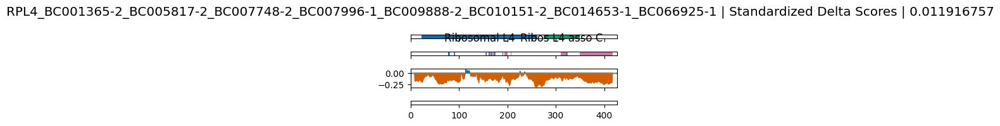

RBM34_BC029451-1 RBM34_BC029451-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM34_BC029451-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 182-213
RRM_1: 284-353
Low complexity coordinates: 43-48, 67-69, 79-80, 102-109, 111-111, 117-120, 368-368, 403-403
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


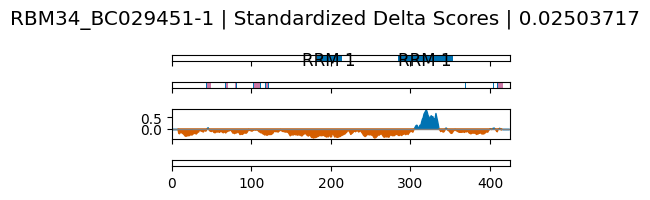

ERAL1_BC019094-2 ERAL1_BC019094-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ERAL1_BC019094-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU: 188-327
KH_1: 387-417
MMR_HSR1: 115-237
Low complexity coordinates: 50-54
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


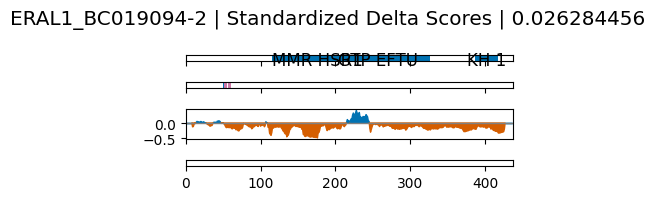

MRPS30_BC007735-2 MRPS30_BC007735-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPS30_BC007735-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PDCD9: 1-429
Low complexity coordinates: 11-11, 17-21, 26-35, 118-142, 159-163, 189-189
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


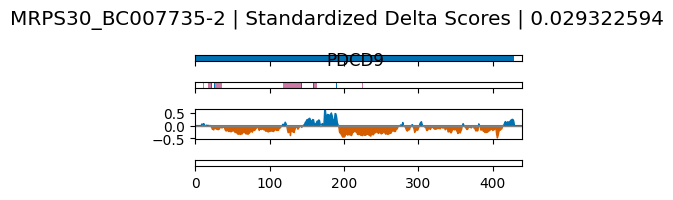

FASN_BC007909-1 FASN_BC007909-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FASN_BC007909-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Thioesterase: 170-428
PP-binding: 54-115
Low complexity coordinates: 71-79, 93-110, 118-118, 318-321, 414-414, 416-422, 424-425
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


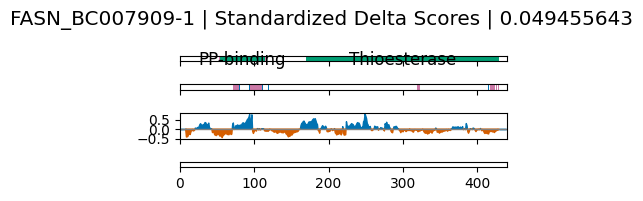

TUFM_BC001633-1_BC010041-2 TUFM_BC001633-1_BC010041-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TUFM_BC001633-1_BC010041-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU: 58-251
GTP_EFTU_D2: 275-343
GTP_EFTU_D3: 348-441
Low complexity coordinates: 10-11, 14-16, 23-42, 79-84, 86-87, 204-205, 327-331
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


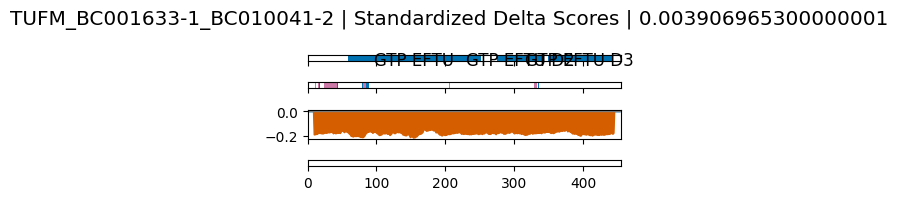

EEF1A1_BC008587-1_BC009733-1_BC009875-2_BC010735-1_BC012891-1_BC014224-2_BC018150-1_BC018641-2_BC019669-1_BC021686-1_BC028674-1_BC038339-1_BC066893-1 EEF1A1_BC008587-1_BC009733-1_BC009875-2_BC010735-1_BC012891-1_BC014224-2_BC018150-1_BC018641-2_BC019669-1_BC021686-1_BC028674-1_BC038339-1_BC066893-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EEF1A1_BC008587-1_BC009733-1_BC009875-2_BC010735-1_BC012891-1_BC014224-2_BC018150-1_BC018641-2_BC019669-1_BC021686-1_BC028674-1_BC038339-1_BC066893-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU_D2: 260-325
GTP_EFTU_D3: 336-441
GTP_EFTU: 5-237
Low complexity coordinates: 235-235, 237-237, 241-241, 264-269, 313-317, 320-321
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


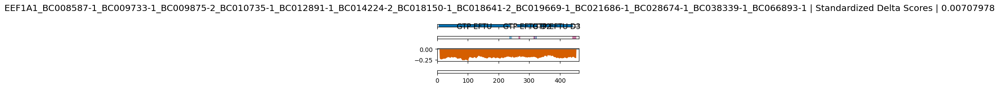

FKBP4_BC001786-1_BC007924-2 FKBP4_BC001786-1_BC007924-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FKBP4_BC001786-1_BC007924-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TPR_1: 275-295
TPR_2: 354-386
TPR_1: 321-352
FKBP_C: 162-250
FKBP_C: 44-134
Low complexity coordinates: 69-75, 135-140, 142-142, 147-150, 255-255, 257-259, 321-323
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


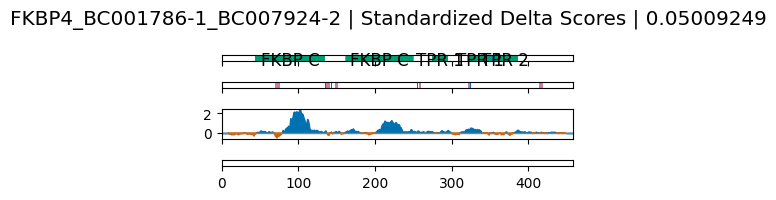

HFM1_BC132823-1 HFM1_BC132823-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HFM1_BC132823-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 283-465
Low complexity coordinates: 44-46, 49-50, 53-53, 57-59, 216-218
sig peak regions (p<0.05): 120-141, 286-368, 392-433
sig peak regions (p<0.001): 287-361, 392-433


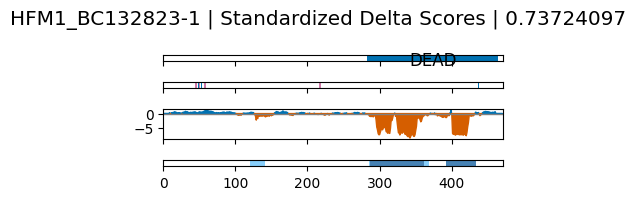

CPSF7_BC018135-1 CPSF7_BC018135-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CPSF7_BC018135-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 84-155
Low complexity coordinates: 38-38, 43-59, 144-144, 188-188, 190-191, 194-195, 227-255, 259-267, 270-298, 349-358, 412-441
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


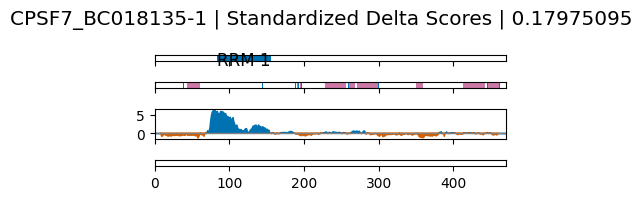

SCG3_BC014539-1 SCG3_BC014539-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SCG3_BC014539-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SGIII: 17-468
Low complexity coordinates: 86-86, 135-136, 252-252, 291-297, 364-370, 373-373
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


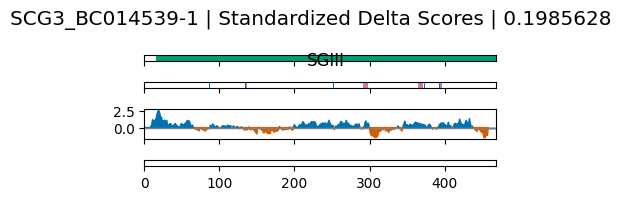

GLTSCR2_BC006311-2_BC010095-2 GLTSCR2_BC006311-2_BC010095-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GLTSCR2_BC006311-2_BC010095-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Nop53: 42-445
Low complexity coordinates: 10-15, 30-32, 35-35, 38-46, 98-111, 150-153, 162-162, 266-282, 284-288, 292-294, 298-318, 335-336, 339-339, 341-366, 376-400
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


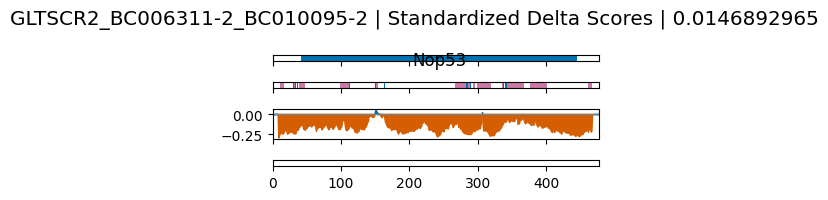

AK8_BC034776-1_BC050576-1 AK8_BC034776-1_BC050576-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/AK8_BC034776-1_BC050576-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ADK: 62-233
ADK: 273-447
Low complexity coordinates: 86-86, 90-92
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


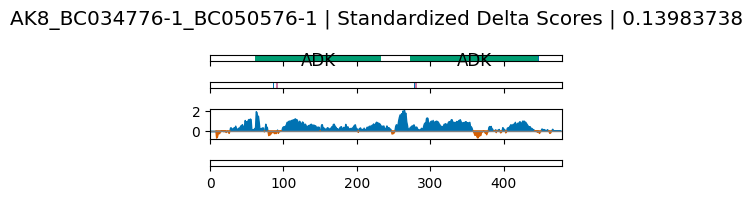

RPGR_BC031624-1 RPGR_BC031624-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPGR_BC031624-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RCC1: 55-101
RCC1_2: 91-118
RCC1_2: 245-273
RCC1: 262-310
RCC1_2: 142-171
RCC1: 314-363
RCC1_2: 195-220
RCC1: 208-258
RCC1_2: 38-66
RCC1: 106-155
RCC1_2: 298-325
RCC1: 158-205
Low complexity coordinates: 111-114, 270-276
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


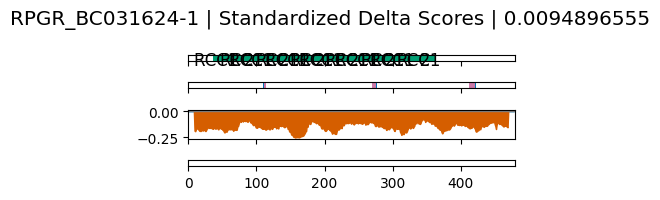

MECP2_BC011612-1 MECP2_BC011612-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MECP2_BC011612-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MBD: 96-159
Low complexity coordinates: 15-16, 19-19, 21-41, 44-49, 51-52, 56-72, 74-75, 167-195, 257-262, 270-270, 272-289, 307-314, 316-317, 319-321, 323-332, 335-405, 436-442, 448-448
sig peak regions (p<0.05): 9-28, 108-165, 340-359
sig peak regions (p<0.001): 110-163


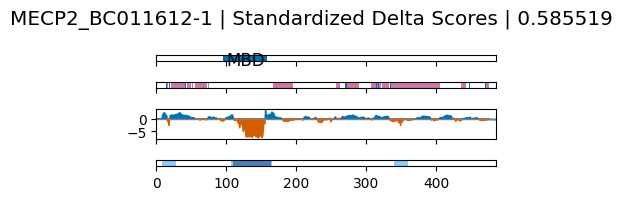

DDX49_BC002674-2 DDX49_BC002674-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX49_BC002674-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 26-195
Helicase_C: 233-343
Low complexity coordinates: 182-182, 188-190, 369-374, 380-380, 425-426, 434-438, 444-444, 461-461
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


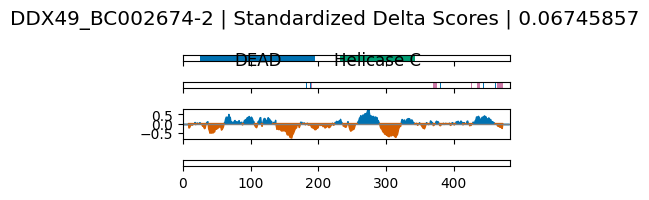

TRIM39_BC007661-2 TRIM39_BC007661-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRIM39_BC007661-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PRY: 309-358
SPRY: 362-468
zf-C3HC4_4: 29-69
zf-B_box: 103-143
Low complexity coordinates: 10-23, 155-158, 160-161, 179-179, 181-181, 189-220, 234-235, 266-272
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


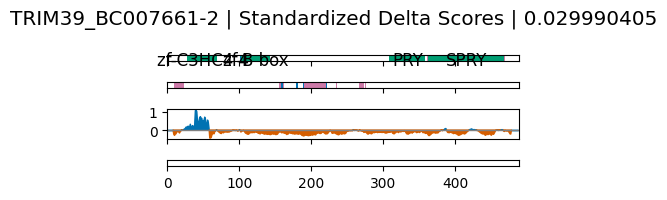

IFIT2_BC032839-2 IFIT2_BC032839-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/IFIT2_BC032839-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TPR_12: 55-112
TPR_19: 234-284
TPR_19: 153-206
TPR_17: 269-305
Low complexity coordinates: 219-239, 409-409
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


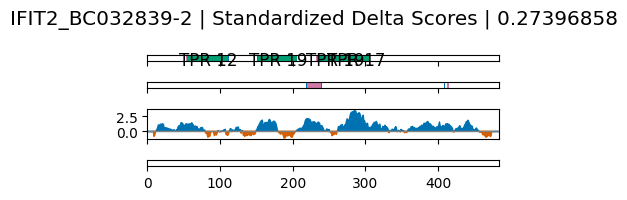

CELF5_BC028101-1 CELF5_BC028101-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CELF5_BC028101-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 47-112
RRM_1: 402-472
RRM_1: 136-198
Low complexity coordinates: 10-13, 15-32, 251-251, 253-254, 256-256, 293-305, 307-307, 314-315, 317-319, 376-376, 380-382
sig peak regions (p<0.05): 152-177
sig peak regions (p<0.001): 


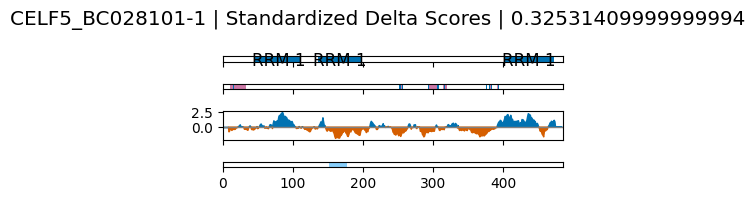

DGCR8_BC009323-2 DGCR8_BC009323-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DGCR8_BC009323-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WW: 20-49
dsrm: 230-293
dsrm: 337-401
Low complexity coordinates: 112-113, 115-129, 137-137, 278-280, 283-283
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


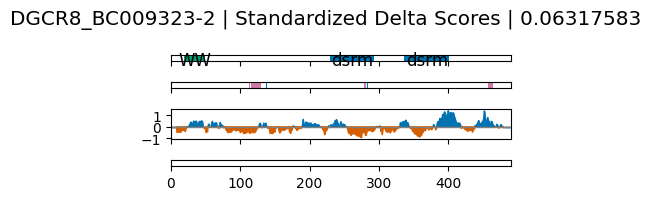

SRSF4_BC002781-2 SRSF4_BC002781-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF4_BC002781-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 4-64
RRM_1: 106-171
Low complexity coordinates: 76-94, 177-266, 288-406, 409-424, 428-440
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


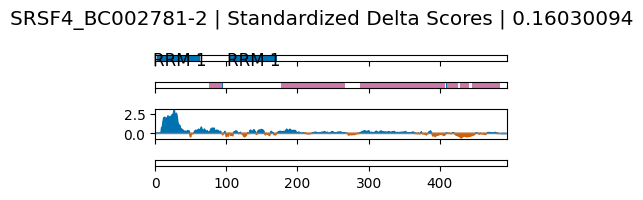

DUS2L_BC006527-2 DUS2L_BC006527-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DUS2L_BC006527-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Dus: 15-285
dsrm: 370-432
Low complexity coordinates: 101-102, 179-179, 330-331
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


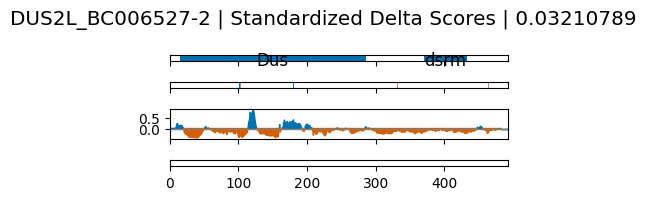

SLC7A9_BC017962-1 SLC7A9_BC017962-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SLC7A9_BC017962-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
AA_permease_2: 30-435
Low complexity coordinates: 32-46, 70-71, 187-192, 356-363, 414-420
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


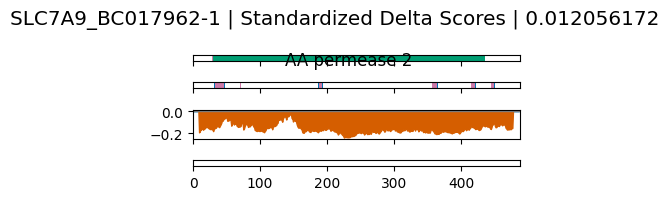

SPATS2L_BC018736-1 SPATS2L_BC018736-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SPATS2L_BC018736-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GIP1_N: 9-54
SPATS2-like: 147-298
Low complexity coordinates: 38-39, 69-76, 97-99, 130-133, 216-216, 218-219, 364-364
sig peak regions (p<0.05): 0-28, 99-124, 195-231, 327-379, 444-485
sig peak regions (p<0.001): 206-225, 456-478


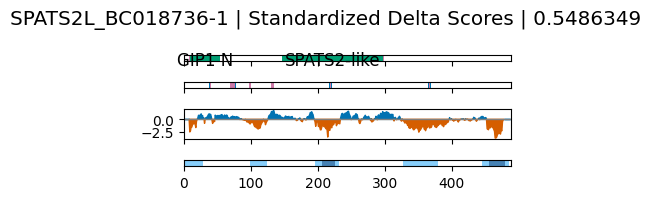

ZGPAT_BC019338-1 ZGPAT_BC019338-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZGPAT_BC019338-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
G-patch: 304-346
zf-CCCH_4: 178-198
Low complexity coordinates: 12-13, 15-15, 17-18, 23-25, 30-33, 52-55, 57-60, 84-87, 90-94, 96-126, 128-128, 278-289, 365-377, 379-379, 398-402, 412-412, 414-414, 419-419
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


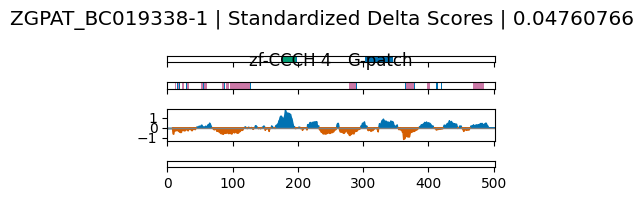

GTF2F1_BC000120-1 GTF2F1_BC000120-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GTF2F1_BC000120-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TFIIF_alpha: 3-517
Low complexity coordinates: 155-160, 184-198, 200-200, 211-213, 216-220, 226-227, 232-265, 267-273, 276-277, 283-293, 300-356, 372-398, 400-400, 432-432, 434-440, 442-442, 470-473, 475-475
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


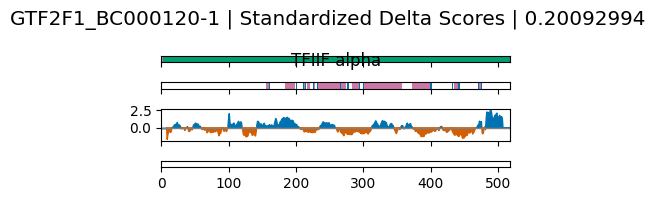

RC3H2_BC044642-1 RC3H2_BC044642-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RC3H2_BC044642-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ROQ_II: 268-323
zf-CCCH: 411-437
zf-RING_5: 14-54
Roquin_1_2-like_ROQ: 179-265
Low complexity coordinates: 150-154, 204-204, 207-213
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


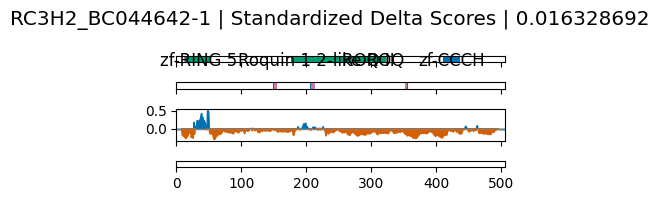

RPS20_BC007507-2 RPS20_BC007507-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS20_BC007507-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_S10: 21-115
Low complexity coordinates: 57-58
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


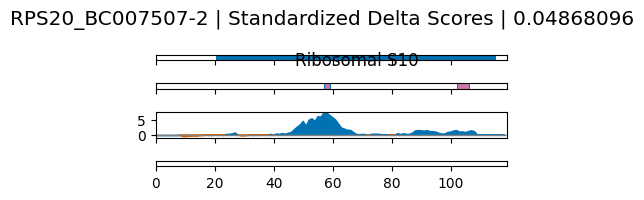

YTHDC1_BC041119-1 YTHDC1_BC041119-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/YTHDC1_BC041119-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
YTH: 355-492
Low complexity coordinates: 19-19, 43-43, 47-48, 50-50, 66-72, 75-75, 79-80, 111-113, 159-159, 166-168, 170-171, 173-173, 178-258, 268-268, 272-297, 323-328, 513-521, 523-531, 604-638, 655-656
sig peak regions (p<0.05): 588-641, 675-711
sig peak regions (p<0.001): 


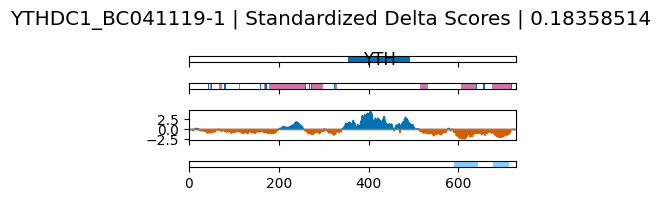

TRAP1_BC018950-2 TRAP1_BC018950-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRAP1_BC018950-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HATPase_c_3: 110-221
HSP90: 291-702
Low complexity coordinates: 10-27, 411-411, 432-433, 477-477, 531-532, 570-570
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


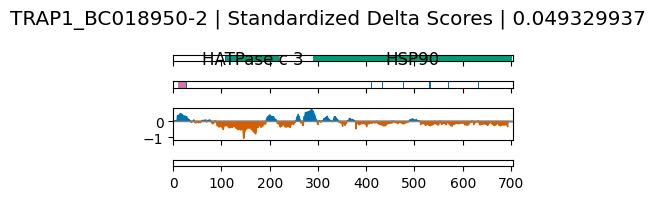

TFIP11_BC011599-2 TFIP11_BC011599-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TFIP11_BC011599-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TIP_N: 18-107
GCFC: 397-666
G-patch: 149-192
Low complexity coordinates: 11-11, 14-20, 22-25, 90-103, 105-105, 159-159, 178-178, 210-210, 212-213, 236-236, 238-239, 325-335, 581-581
sig peak regions (p<0.05): 1-31, 381-422, 466-502, 521-540, 622-643
sig peak regions (p<0.001): 


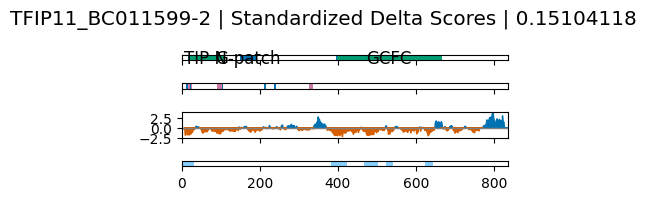

DDX52_BC041785-1 DDX52_BC041785-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX52_BC041785-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 399-507
DEAD: 189-361
Low complexity coordinates: 14-17, 78-86, 88-91, 274-275, 277-277, 279-279, 548-552, 554-556, 560-560, 583-585
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


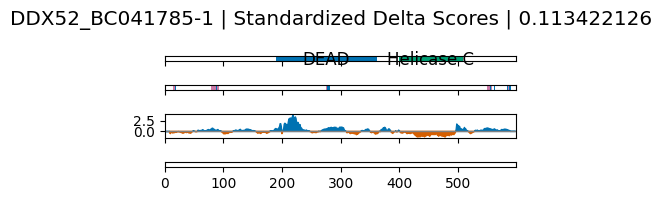

BOLL_BC033674-1 BOLL_BC033674-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BOLL_BC033674-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 35-103
Low complexity coordinates: 10-17, 92-92, 129-129, 156-164, 177-178, 180-182, 184-185
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


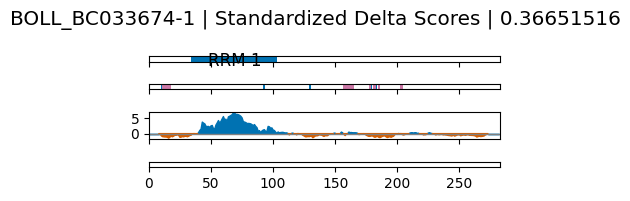

RPP25_BC002497-2_BC007270-1 RPP25_BC002497-2_BC007270-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPP25_BC002497-2_BC007270-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Alba: 37-100
Low complexity coordinates: 14-26, 116-116
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


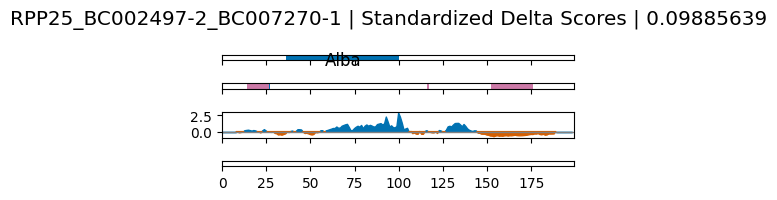

PCBP1_BC039742-1 PCBP1_BC039742-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PCBP1_BC039742-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 15-76
KH_1: 99-162
KH_1: 281-344
Low complexity coordinates: 30-36, 47-48
sig peak regions (p<0.05): 29-54, 97-136, 168-204, 298-329
sig peak regions (p<0.001): 171-190


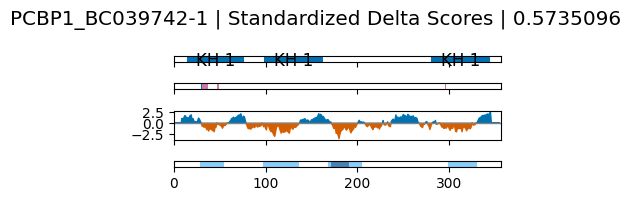

RBM17_BC039322-1 RBM17_BC039322-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM17_BC039322-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
G-patch: 237-277
RRM_1: 328-383
Low complexity coordinates: 29-42, 115-135, 138-139, 141-141, 149-149, 152-161, 163-163, 321-329
sig peak regions (p<0.05): 0-31, 55-91, 177-245, 280-375
sig peak regions (p<0.001): 0-20, 72-91, 280-307, 308-329, 337-368


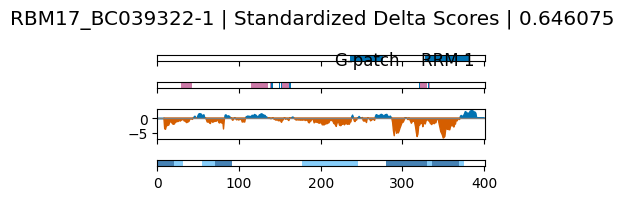

NOB1_BC064630-1 NOB1_BC064630-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOB1_BC064630-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PIN_6: 7-93
NOB1_Zn_bind: 260-332
WRNPLPNID: 153-212
Low complexity coordinates: 52-55, 57-57, 178-198
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


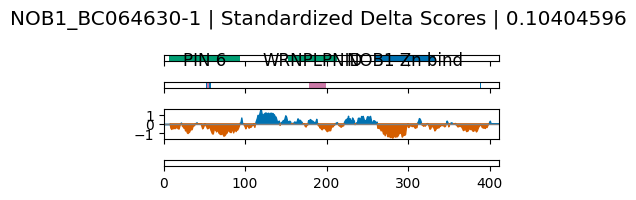

UTP3_BC004546-1 UTP3_BC004546-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/UTP3_BC004546-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Sas10: 406-478
Sas10_Utp3: 231-310
Low complexity coordinates: 10-15, 29-31, 39-39, 69-117, 149-170, 205-206, 210-212, 216-226, 228-244, 248-248, 250-250, 252-252, 334-334, 336-354, 356-361, 363-364, 372-373, 380-385, 389-389, 392-392, 431-433, 436-437, 441-451
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


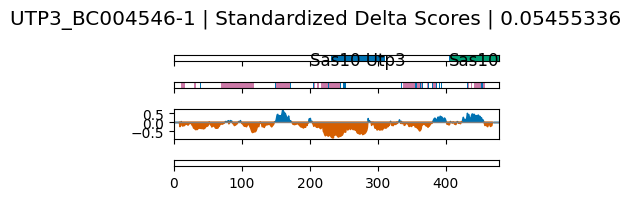

GPATCH4_BC056904-1 GPATCH4_BC056904-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GPATCH4_BC056904-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
G-patch: 19-54
Low complexity coordinates: 163-163, 175-178, 194-217, 221-223, 236-236, 246-247, 266-266, 296-309, 313-317, 343-345, 348-355, 358-358, 368-373, 388-388, 395-396, 406-412, 416-416
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


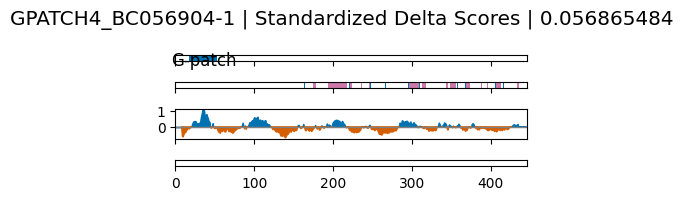

DDX6_BC065007-1 DDX6_BC065007-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX6_BC065007-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 120-286
Helicase_C: 321-429
Low complexity coordinates: 22-57, 71-76
sig peak regions (p<0.05): 116-164, 194-267, 388-460
sig peak regions (p<0.001): 226-265, 391-411


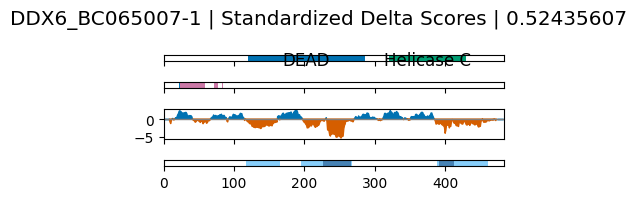

TRIP6_BC002680-2 TRIP6_BC002680-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRIP6_BC002680-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LIM: 277-332
LIM: 337-393
LIM: 397-459
Low complexity coordinates: 17-31, 37-37, 87-87, 116-122, 130-135, 140-159, 165-165, 170-176, 181-186, 188-193, 199-201, 208-210, 221-234, 238-239, 277-277, 279-294
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


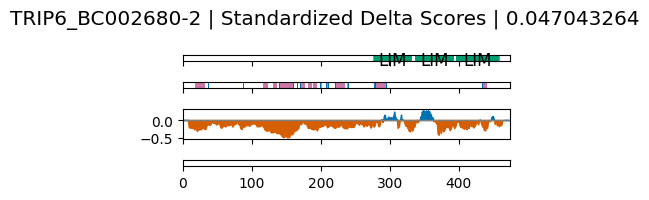

SRSF11_BC040436-1 SRSF11_BC040436-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF11_BC040436-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 37-103
Low complexity coordinates: 10-35, 125-152, 155-179, 242-418, 428-437
sig peak regions (p<0.05): 0-23, 58-79, 159-197
sig peak regions (p<0.001): 


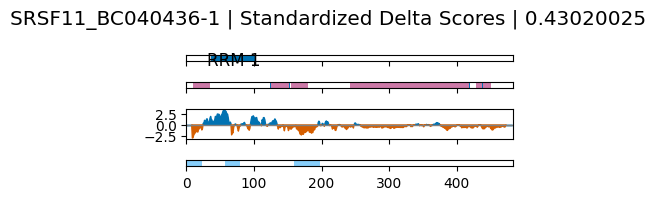

DHX30_BC014237-2 DHX30_BC014237-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX30_BC014237-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HA2_N: 158-183
OB_NTP_bind: 323-409
Helicase_C: 5-93
HA2_C: 187-245
Low complexity coordinates: 199-199, 424-430, 434-435, 439-439, 441-441, 452-459
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


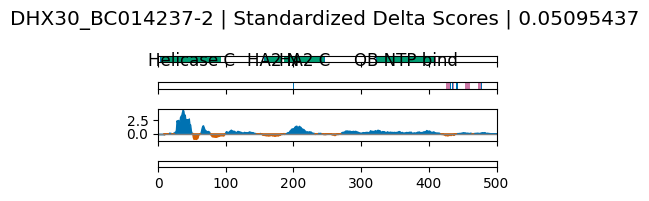

CHD2_BC007347-2 CHD2_BC007347-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CHD2_BC007347-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Chromo: 299-334
Chromo: 379-447
Low complexity coordinates: 12-80, 119-119, 127-127, 133-139, 141-146, 149-158, 160-163, 165-165, 176-198, 201-218, 243-244, 328-328, 331-340
sig peak regions (p<0.05): 0-66, 118-137, 287-306, 406-450
sig peak regions (p<0.001): 


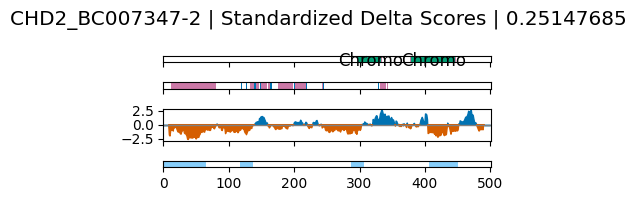

NMD3_BC013317-1 NMD3_BC013317-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NMD3_BC013317-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NMD3: 17-246
NMD3_OB: 313-406
NMD_SH3: 249-296
Low complexity coordinates: 80-82, 84-85, 87-87, 374-377, 418-419
sig peak regions (p<0.05): 10-39, 285-305
sig peak regions (p<0.001): 


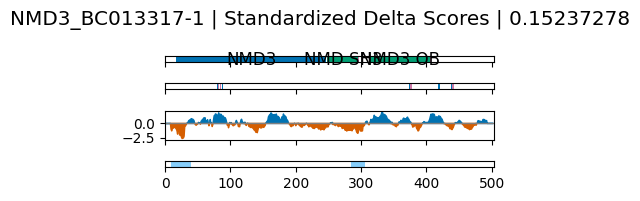

PRPF31_BC117389-1 PRPF31_BC117389-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRPF31_BC117389-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Nop: 100-330
Prp31_C: 338-465
Low complexity coordinates: 10-29, 32-34, 177-180, 184-190, 228-228, 292-297, 336-336, 342-344, 347-347, 350-350
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


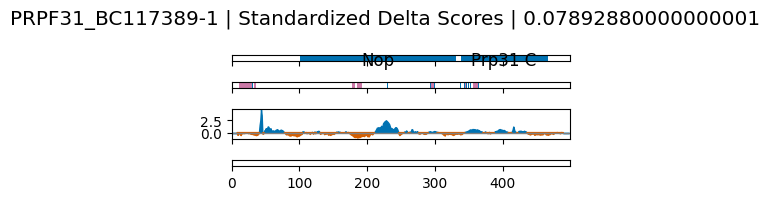

RSL1D1_BC113699-1 RSL1D1_BC113699-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RSL1D1_BC113699-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L1: 60-258
Low complexity coordinates: 10-21, 140-140, 144-145, 153-158, 246-247, 280-303, 306-307, 336-341, 345-345, 394-402, 408-408, 411-411, 413-415, 417-440, 463-463
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


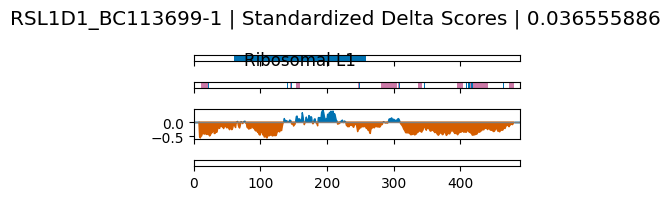

OASL_BC117408-1_BC117410-1 OASL_BC117408-1_BC117410-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/OASL_BC117408-1_BC117410-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DZF_N: 21-93
OAS1_C: 168-350
ubiquitin: 436-505
Low complexity coordinates: 60-60, 68-68, 125-126, 254-254, 257-258, 399-399, 464-480, 482-484, 492-492
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


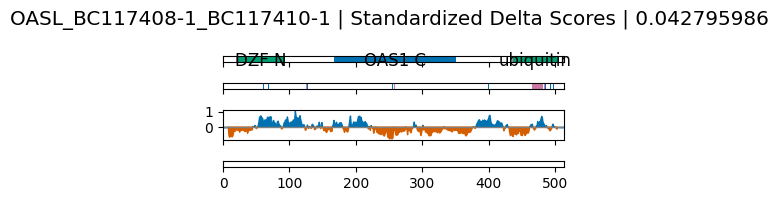

DKC1_BC010015-2 DKC1_BC010015-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DKC1_BC010015-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PUA: 297-370
DKCLD: 49-106
TruB_N: 110-226
TruB_C_2: 227-293
Low complexity coordinates: 13-16, 18-19, 236-245, 421-452, 464-485
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


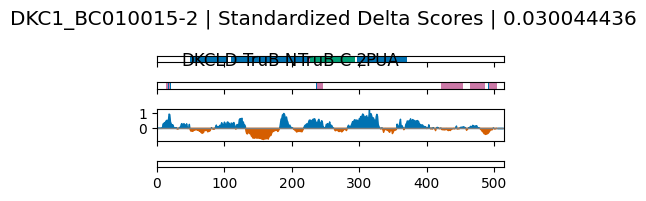

SREK1_BC067770-1_BC112343-1 SREK1_BC067770-1_BC112343-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SREK1_BC067770-1_BC112343-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 68-136
Low complexity coordinates: 10-13, 15-23, 25-28, 31-31, 34-34, 40-40, 183-183, 187-357, 362-439, 448-451, 454-459, 461-464, 466-470
sig peak regions (p<0.05): 0-20, 45-64
sig peak regions (p<0.001): 


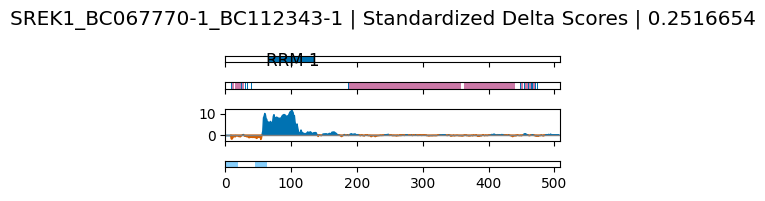

P4HB_BC010859-1_BC029617-1 P4HB_BC010859-1_BC029617-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/P4HB_BC010859-1_BC029617-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Thioredoxin: 369-471
Thioredoxin: 26-131
Thioredoxin_6: 161-344
Low complexity coordinates: 10-20, 61-66, 73-73, 145-146, 199-199, 326-326, 330-330, 378-382
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


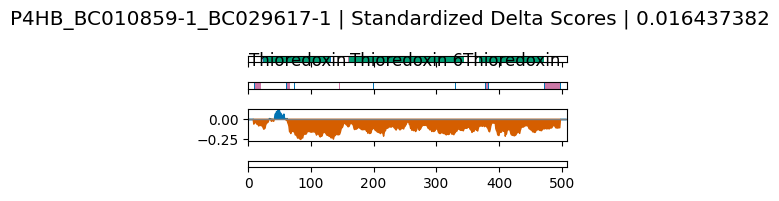

DYNC1LI1_BC131620-1 DYNC1LI1_BC131620-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DYNC1LI1_BC131620-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DLIC: 43-511
Low complexity coordinates: 13-18, 25-25, 28-37, 92-93, 139-144, 395-416, 418-419, 421-421, 455-484
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


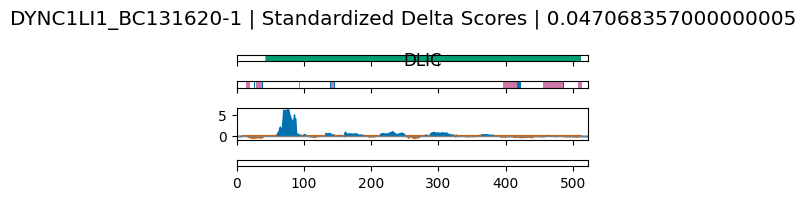

PNLDC1_BC112246-1 PNLDC1_BC112246-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PNLDC1_BC112246-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CAF1: 15-362
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


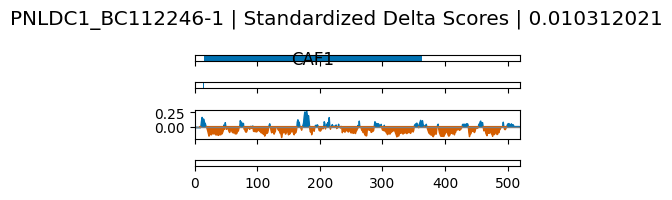

SYNCRIP_BC032643-1 SYNCRIP_BC032643-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SYNCRIP_BC032643-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 305-366
RRM_1: 164-229
hnRNP_Q_AcD: 34-103
RRM_1: 245-302
Low complexity coordinates: 149-150, 378-381, 384-385, 388-388, 400-446, 453-454
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


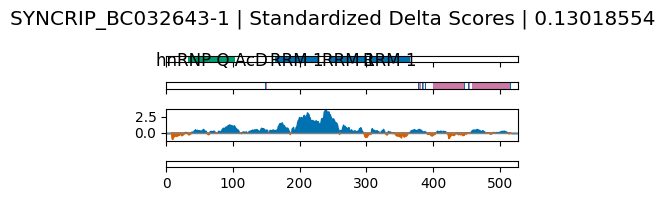

FUS_BC000402-2_BC002459-1 FUS_BC000402-2_BC002459-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FUS_BC000402-2_BC002459-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-RanBP: 422-453
RRM_1: 287-365
Low complexity coordinates: 13-264, 374-418, 420-420, 422-422, 450-451
sig peak regions (p<0.05): 0-28, 92-111, 415-461
sig peak regions (p<0.001): 0-21, 425-444


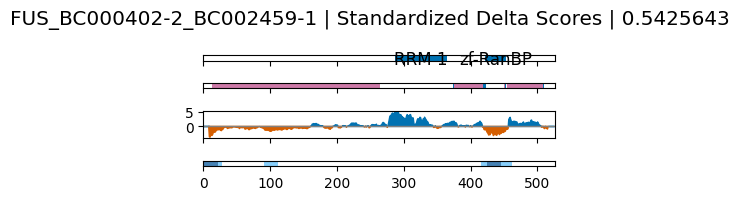

YARS_BC001933-1_BC016689-1 YARS_BC001933-1_BC016689-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/YARS_BC001933-1_BC016689-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
tRNA_bind: 370-465
tRNA-synt_1b: 32-321
Low complexity coordinates: 22-22, 24-31, 166-166, 229-238, 240-240, 340-341, 343-346, 478-482
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


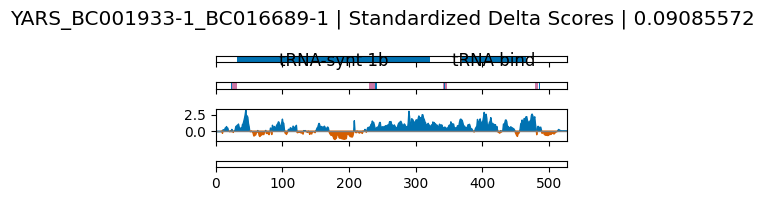

TUT1_BC005013-1 TUT1_BC005013-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TUT1_BC005013-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PAP_assoc: 152-210
Low complexity coordinates: 19-19, 48-48, 52-53, 87-87, 176-178, 189-191, 194-194, 232-237, 245-277, 281-281, 305-316, 332-342, 345-345, 348-353, 378-378, 409-409, 414-416, 432-464, 481-481
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


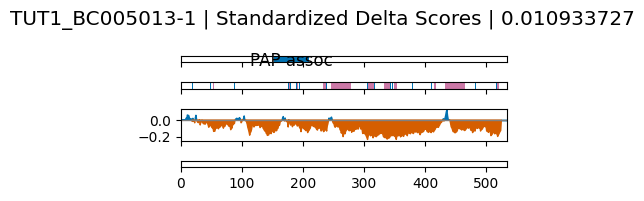

NOP58_BC032592-2 NOP58_BC032592-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOP58_BC032592-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Nop: 168-396
NOP5NT: 2-66
Low complexity coordinates: 52-52, 71-72, 74-74, 76-76, 79-79, 81-83, 224-232, 236-240, 302-304, 447-447, 449-496
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


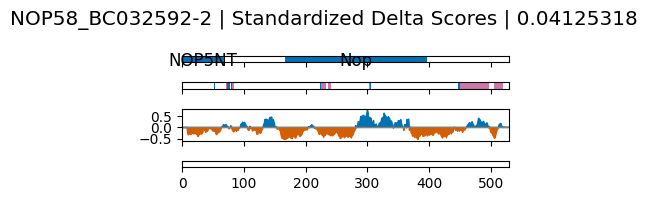

PKM_BC007640-1 PKM_BC007640-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PKM_BC007640-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PK_C: 410-528
PK: 43-375
Low complexity coordinates: 130-130, 262-262, 265-266, 268-268, 387-391
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


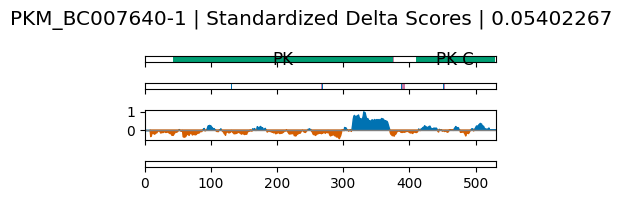

CCDC9_BC002787-2_BC009743-2 CCDC9_BC002787-2_BC009743-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CCDC9_BC002787-2_BC009743-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DUF4594: 206-374
Low complexity coordinates: 11-24, 28-29, 81-101, 105-140, 159-173, 201-216, 218-219, 248-248, 250-250, 343-356, 377-395, 398-404, 406-450, 478-490
sig peak regions (p<0.05): 0-48, 248-268, 380-404, 482-501
sig peak regions (p<0.001): 6-39


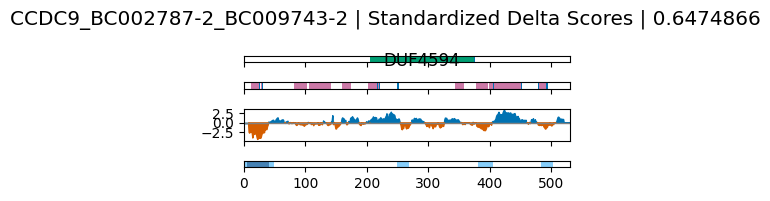

RBM46_BC028588-2 RBM46_BC028588-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM46_BC028588-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 63-127
RRM_1: 143-204
DND1_DSRM: 392-468
RRM_1: 238-301
Low complexity coordinates: 46-59, 152-152, 157-162, 481-484
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


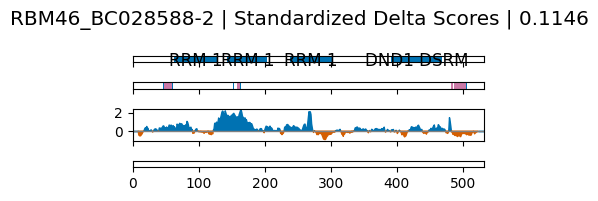

CCT6A_BC106942-1 CCT6A_BC106942-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CCT6A_BC106942-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Cpn60_TCP1: 30-524
Low complexity coordinates: 10-12, 16-17, 19-20, 22-23, 262-270, 406-406
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


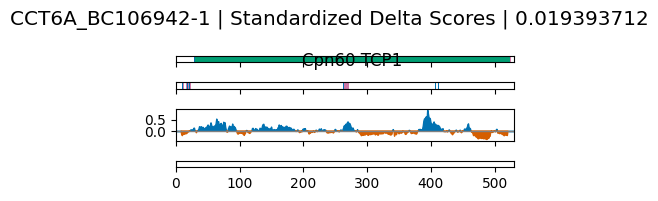

NXF3_BC031616-1 NXF3_BC031616-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NXF3_BC031616-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Tap-RNA_bind: 113-192
NTF2: 346-492
Low complexity coordinates: 48-52, 355-355
sig peak regions (p<0.05): 34-68
sig peak regions (p<0.001): 


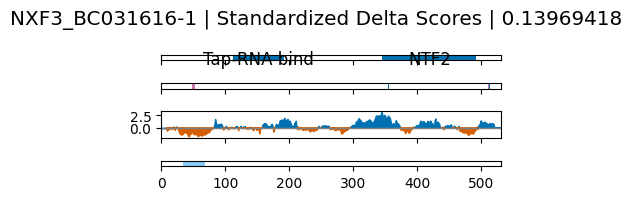

CCT4_BC106934-1 CCT4_BC106934-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CCT4_BC106934-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Cpn60_TCP1: 44-538
Low complexity coordinates: 11-23, 171-174, 177-182, 427-428, 510-517
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


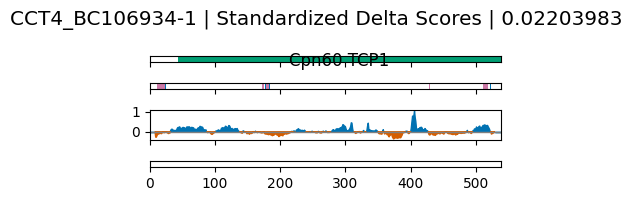

TROVE2_BC036658-2 TROVE2_BC036658-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TROVE2_BC036658-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TROVE: 17-328
Low complexity coordinates: 215-233, 244-253
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


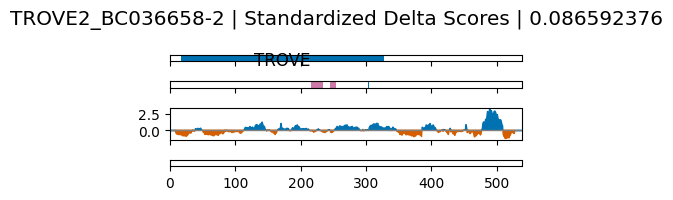

ALDH6A1_BC004909-1_BC032371-1 ALDH6A1_BC004909-1_BC032371-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ALDH6A1_BC004909-1_BC032371-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Aldedh: 48-512
Low complexity coordinates: 10-14, 24-32, 118-121, 189-189
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


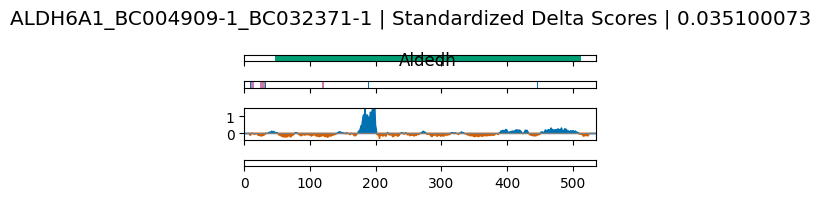

STIP1_BC002987-1 STIP1_BC002987-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/STIP1_BC002987-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TPR_1: 73-105
STI1-HOP_DP: 130-184
TPR_1: 230-258
TPR_12: 262-328
TPR_1: 429-460
TPR_11: 367-406
TPR_11: 16-52
STI1-HOP_DP: 483-536
TPR_1: 394-427
Low complexity coordinates: 86-86, 194-221, 224-224, 228-231, 241-246
sig peak regions (p<0.05): 183-205
sig peak regions (p<0.001): 184-205


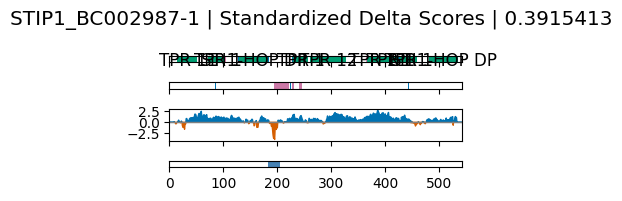

DBR1_BC009472-1 DBR1_BC009472-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DBR1_BC009472-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DBR1: 247-377
Metallophos: 1-229
Low complexity coordinates: 112-115, 401-408, 428-431
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


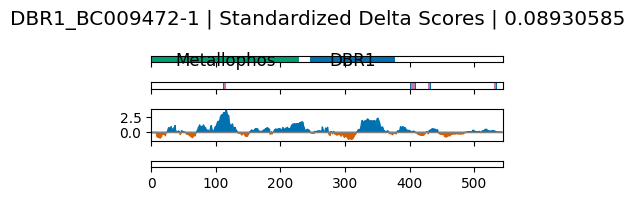

PTCD3_BC011832-2 PTCD3_BC011832-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PTCD3_BC011832-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PPR_3: 213-239
PPR_3: 141-201
PPR_2: 115-160
Low complexity coordinates: 43-45
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


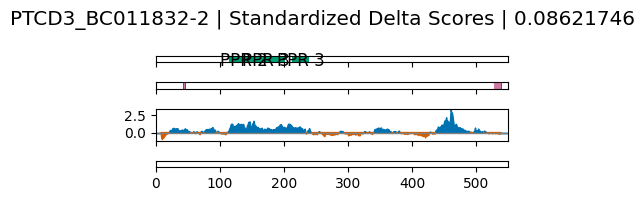

PTBP3_BC044585-1 PTBP3_BC044585-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PTBP3_BC044585-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 485-545
RRM_8: 183-262
RRM_5: 336-460
Low complexity coordinates: 37-38, 153-167, 174-174, 303-319, 321-322, 331-331, 335-339, 408-408
sig peak regions (p<0.05): 31-57, 174-193, 285-328
sig peak regions (p<0.001): 


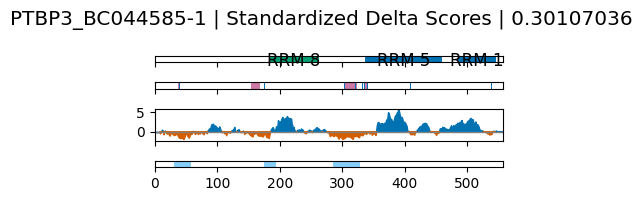

XRN2_BC006417-1 XRN2_BC006417-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/XRN2_BC006417-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
XRN_M: 2-396
Low complexity coordinates: 16-31, 33-33, 85-91, 274-275, 483-483, 519-519
sig peak regions (p<0.05): 3-29, 38-129, 177-209, 213-233, 264-288, 298-350, 382-414, 427-458, 502-536
sig peak regions (p<0.001): 8-27, 49-100, 431-455


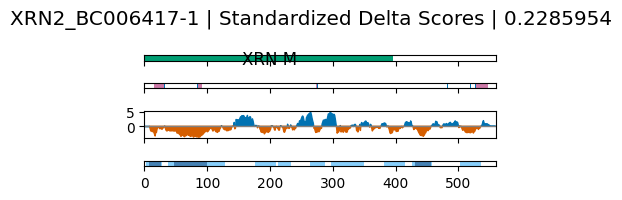

EIF4B_BC073139-1 EIF4B_BC073139-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF4B_BC073139-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 99-167
Low complexity coordinates: 11-11, 21-21, 51-51, 72-73, 145-145, 148-156, 170-191, 194-196, 199-200, 204-204, 207-207, 209-209, 211-211, 214-324, 327-328, 346-349, 353-354, 376-395, 400-445, 467-473, 484-484, 496-497, 511-512, 555-558, 566-570, 574-575
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


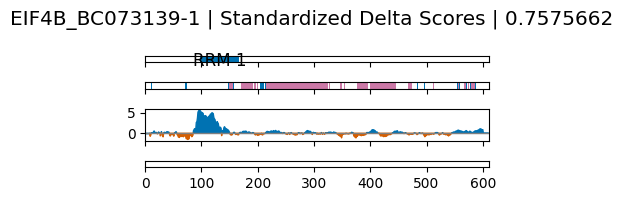

RBM47_BC126261-1 RBM47_BC126261-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM47_BC126261-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 248-311
RRM_1: 153-214
RRM_1: 73-137
Low complexity coordinates: 10-27, 29-29, 57-57, 59-60, 65-65, 329-334, 336-336, 381-401, 403-406, 413-413, 439-441, 454-454, 482-506, 512-513, 540-543, 550-562
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


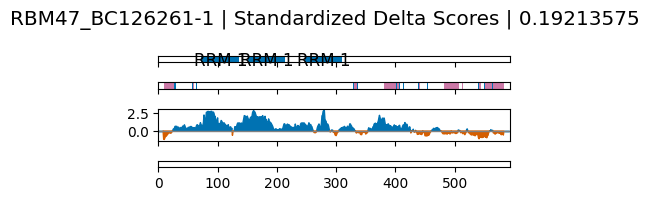

GNL3L_BC011720-2 GNL3L_BC011720-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GNL3L_BC011720-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU: 117-194
MMR_HSR1: 254-321
Low complexity coordinates: 64-77, 172-177, 264-264, 379-379, 544-546, 548-555, 557-559
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


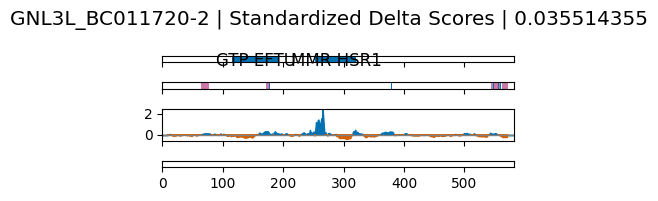

BUD13_BC006350-2 BUD13_BC006350-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BUD13_BC006350-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Bud13: 460-600
Low complexity coordinates: 26-45, 74-81, 126-162, 165-168, 175-212, 217-235, 243-244, 248-248, 257-257, 259-260, 346-347, 361-367, 372-407, 409-409, 445-449, 472-473, 475-475, 478-485, 532-533, 550-556, 559-559
sig peak regions (p<0.05): 10-34, 45-68, 109-296, 363-406, 566-596
sig peak regions (p<0.001): 121-277


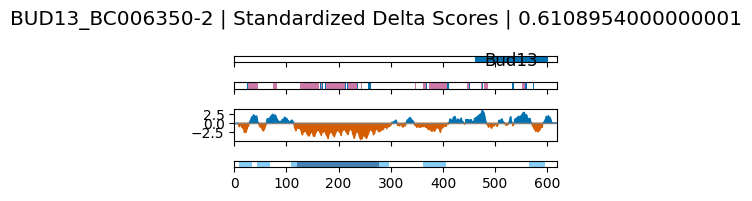

ADAD2_BC033491-1 ADAD2_BC033491-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ADAD2_BC033491-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
dsrm: 116-178
A_deamin: 261-576
Low complexity coordinates: 11-12, 22-46, 48-48, 65-65, 70-74, 76-81, 101-104, 106-109, 189-190, 292-301, 314-316, 401-410, 413-417, 539-539, 542-542
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


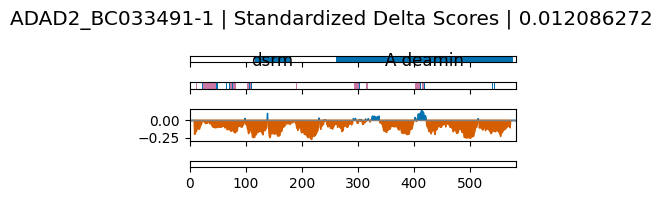

BTN3A3_BC015815-2 BTN3A3_BC015815-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BTN3A3_BC015815-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
C2-set_2: 163-223
SPRY: 394-499
PRY: 342-390
V-set: 38-143
Low complexity coordinates: 10-10, 12-16, 195-198, 206-208, 211-214, 216-218, 252-260, 281-281, 290-291, 307-308, 522-522, 524-524
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


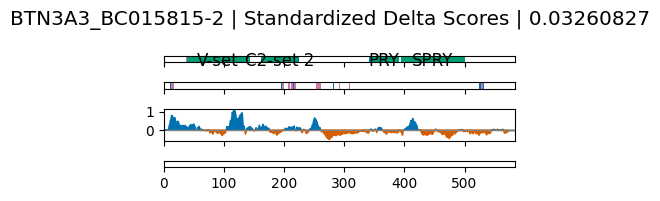

EZR_BC013903-2 EZR_BC013903-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EZR_BC013903-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FERM_C: 210-298
FERM_M: 91-206
ERM_helical: 337-456
ERM_C: 511-586
FERM_N: 9-68
Low complexity coordinates: 256-259, 261-261, 310-349, 351-354, 364-399, 419-430, 438-444, 465-481
sig peak regions (p<0.05): 184-209
sig peak regions (p<0.001): 


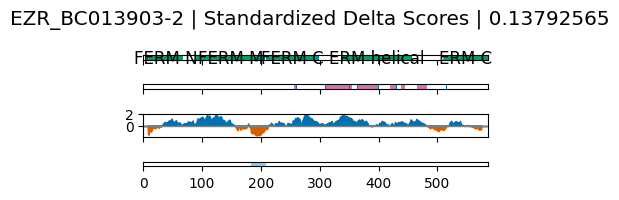

RPL30_BC032700-2 RPL30_BC032700-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL30_BC032700-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L7Ae: 13-105
Low complexity coordinates: 
sig peak regions (p<0.05): 0-24, 33-69
sig peak regions (p<0.001): 42-61


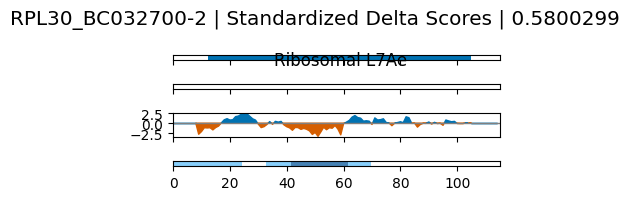

LUC7L3_BC056409-1 LUC7L3_BC056409-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LUC7L3_BC056409-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 1-34
sig peak regions (p<0.001): 


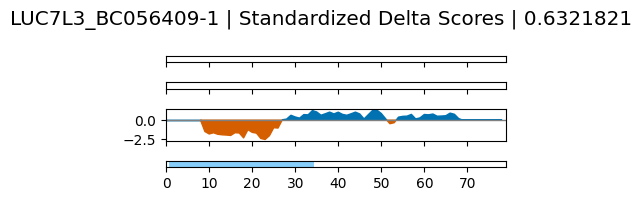

XPO1_BC032847-2 XPO1_BC032847-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/XPO1_BC032847-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CRM1_repeat_3: 485-535
CRM1_C: 709-1026
Xpo1: 124-268
CRM1_repeat: 345-381
IBN_N: 46-111
CRM1_repeat_2: 405-472
Low complexity coordinates: 287-287, 289-289, 291-292
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


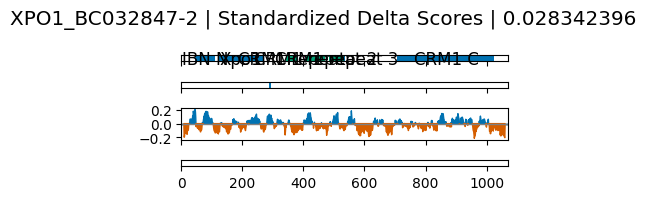

IGF2BP3_BC051296-1 IGF2BP3_BC051296-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/IGF2BP3_BC051296-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 4-68
Low complexity coordinates: 
sig peak regions (p<0.05): 0-28
sig peak regions (p<0.001): 


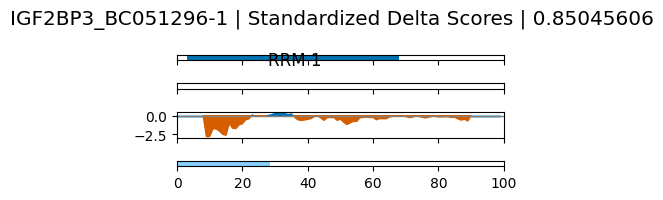

ASCC3_BC050681-1 ASCC3_BC050681-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ASCC3_BC050681-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Death_3: 24-84
Low complexity coordinates: 
sig peak regions (p<0.05): 9-34, 53-86
sig peak regions (p<0.001): 55-74


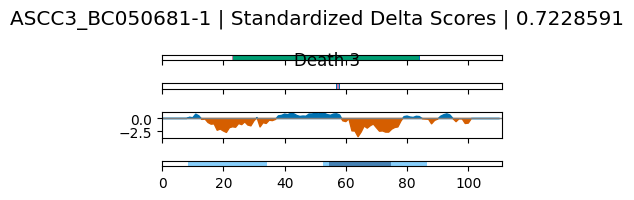

RPS19BP1_BC037573-1_BC047711-1 RPS19BP1_BC037573-1_BC047711-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPS19BP1_BC037573-1_BC047711-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
AROS: 34-134
Low complexity coordinates: 10-15, 26-35
sig peak regions (p<0.05): 108-135
sig peak regions (p<0.001): 


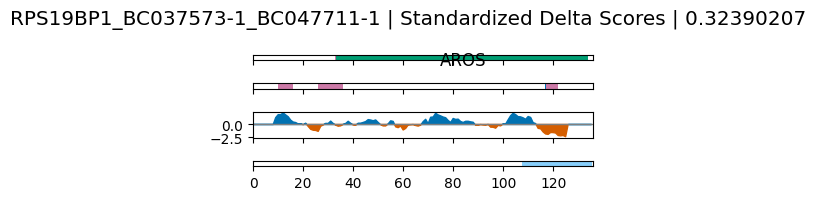

MRPL41_BC040035-1 MRPL41_BC040035-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MRPL41_BC040035-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MRP-L27: 13-127
Low complexity coordinates: 25-26, 28-39, 84-84
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


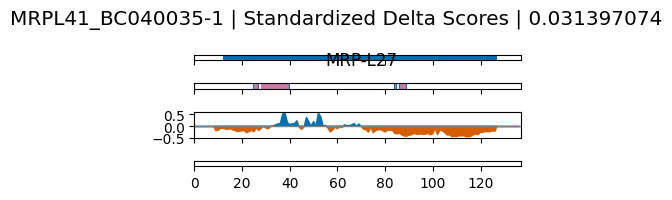

A1CF_BC054873-1 A1CF_BC054873-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/A1CF_BC054873-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 58-121
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


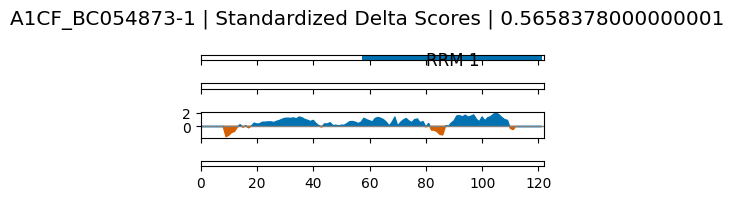

PRPF38B_BC053838-1 PRPF38B_BC053838-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRPF38B_BC053838-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PRP38: 48-186
Low complexity coordinates: 11-35, 110-117, 119-119
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


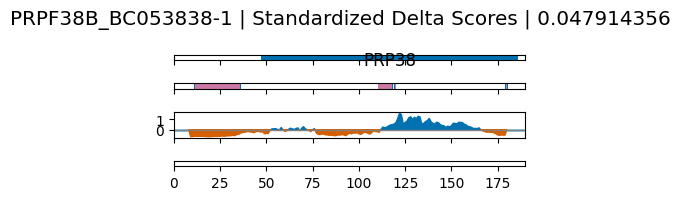

POLK_BC050718-1 POLK_BC050718-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/POLK_BC050718-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
IMS_C: 413-452
IMS_HHH: 340-370
IMS: 106-325
Low complexity coordinates: 21-22, 275-275, 391-392, 436-438
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


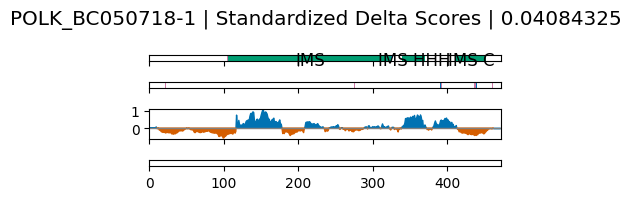

FSCN1_BC000521-2_BC007948-2 FSCN1_BC000521-2_BC007948-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FSCN1_BC000521-2_BC007948-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Fascin: 21-134
Fascin: 268-377
Fascin: 392-493
Fascin: 143-256
Low complexity coordinates: 435-436
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


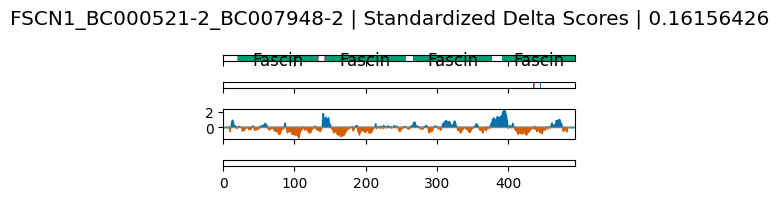

TRMT6_BC001262-1 TRMT6_BC001262-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRMT6_BC001262-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Gcd10p: 20-254
Low complexity coordinates: 12-14, 33-35, 38-39, 108-110, 142-156, 292-292, 301-302, 305-308, 343-345, 348-348, 351-358, 445-445, 473-473
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


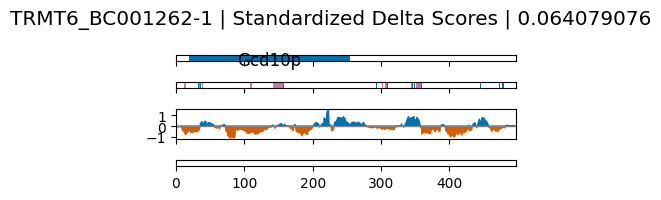

DHX33_BC042040-1 DHX33_BC042040-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX33_BC042040-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 61-184
HA2_C: 279-338
OB_NTP_bind: 396-473
HA2_N: 247-278
Low complexity coordinates: 134-135, 251-253
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


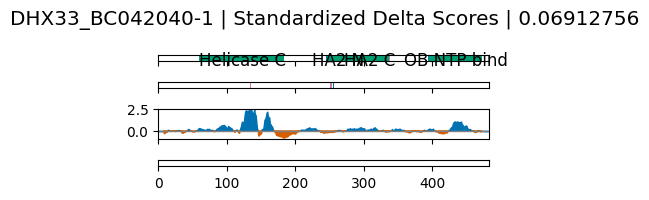

TEFM_BC024328-1 TEFM_BC024328-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TEFM_BC024328-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HHH_3: 77-128
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


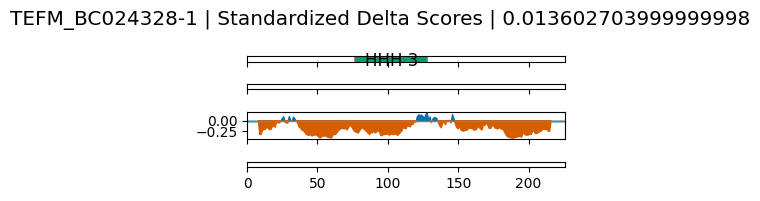

CTNNA1_BC031262-1 CTNNA1_BC031262-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CTNNA1_BC031262-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Vinculin: 1-497
Low complexity coordinates: 92-93, 95-95, 98-99, 105-105, 134-134, 172-176, 272-275, 278-281, 308-308, 313-313, 316-317
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


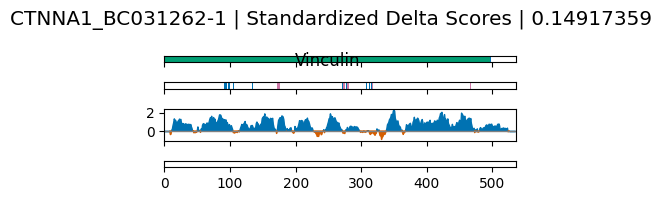

PTBP1_BC004383-1 PTBP1_BC004383-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PTBP1_BC004383-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 63-111
RRM_5: 312-433
RRM_8: 178-258
RRM_1: 458-518
Low complexity coordinates: 38-45, 148-174, 307-331, 335-335
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


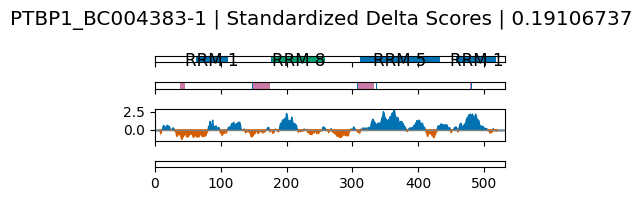

SLC3A2_BC001061-2_BC003000-1 SLC3A2_BC001061-2_BC003000-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SLC3A2_BC001061-2_BC003000-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Alpha-amylase: 220-374
DUF3459: 423-522
SLC3A2_N: 54-124
Low complexity coordinates: 33-33, 43-52, 55-63, 82-95, 136-136, 147-147, 149-151, 283-283, 287-302, 304-308, 338-349, 352-352, 419-419, 423-428, 477-490, 502-506
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


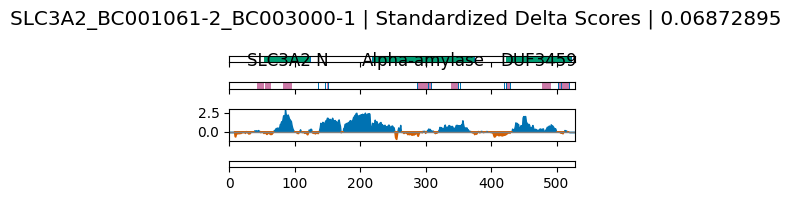

EIF3D_BC080515-1 EIF3D_BC080515-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF3D_BC080515-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
eIF-3_zeta: 4-521
Low complexity coordinates: 68-69, 96-96, 101-109, 111-111, 128-128, 132-133, 136-138, 142-142, 144-147, 162-162
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


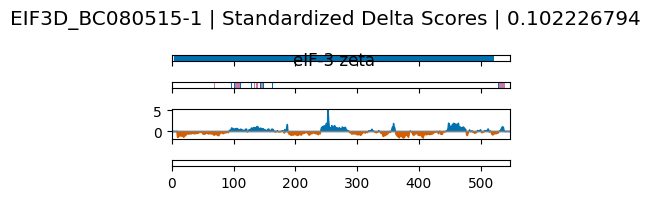

GNL3_BC001024-2 GNL3_BC001024-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GNL3_BC001024-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MMR_HSR1: 256-311
GN3L_Grn1: 15-88
Low complexity coordinates: 24-29, 31-38, 62-86, 125-125, 213-218, 310-310, 313-317, 319-320, 471-495
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


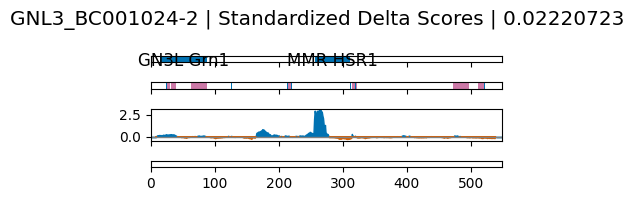

FASTK_BC011770-2 FASTK_BC011770-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FASTK_BC011770-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RAP: 483-536
FAST_1: 278-343
FAST_2: 355-444
Low complexity coordinates: 10-17, 21-21, 43-43, 45-45, 73-73, 78-78, 80-81, 123-129, 183-203, 247-254, 273-273, 378-380, 464-464, 485-485, 498-498, 509-510, 518-520, 527-527, 529-529
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


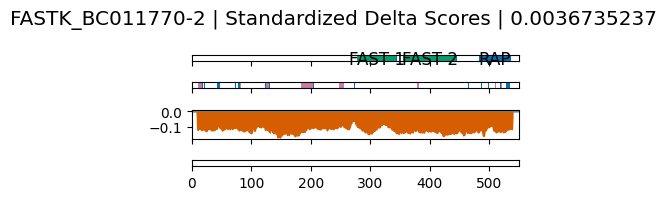

RBM5_BC002957-1 RBM5_BC002957-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM5_BC002957-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 234-294
zf-RanBP: 181-209
OCRE: 458-508
RRM_1: 100-163
Low complexity coordinates: 15-86, 190-190, 193-198, 285-290, 335-345, 348-348, 351-351, 353-354, 356-357, 362-387, 392-405, 408-410, 425-446, 449-450, 465-471, 473-473, 476-481, 484-488
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


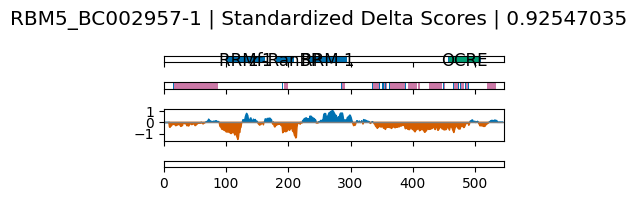

EIF3L_BC001101-2_BC007510-2 EIF3L_BC001101-2_BC007510-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF3L_BC001101-2_BC007510-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Paf67: 152-550
Low complexity coordinates: 10-16, 230-230, 272-274
sig peak regions (p<0.05): 0-40, 68-87, 170-189, 277-350
sig peak regions (p<0.001): 312-349


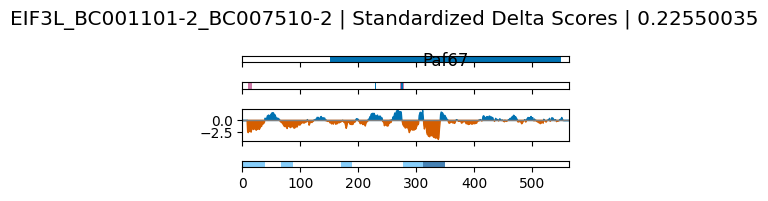

FTSJ3_BC000131-1 FTSJ3_BC000131-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FTSJ3_BC000131-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Spb1_C: 363-566
DUF3381: 4-127
Low complexity coordinates: 57-57, 61-100, 106-124, 182-198, 223-225, 230-245, 272-272, 285-299, 325-361, 464-484, 523-524, 526-543
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


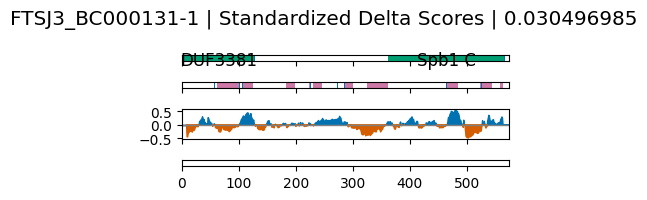

METTL16_BC050603-1 METTL16_BC050603-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/METTL16_BC050603-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Methyltransf_10: 1-291
Low complexity coordinates: 205-205, 300-300, 302-302, 388-391, 432-432, 437-438, 447-447, 453-461, 464-467
sig peak regions (p<0.05): 82-153, 160-205
sig peak regions (p<0.001): 89-146, 161-205


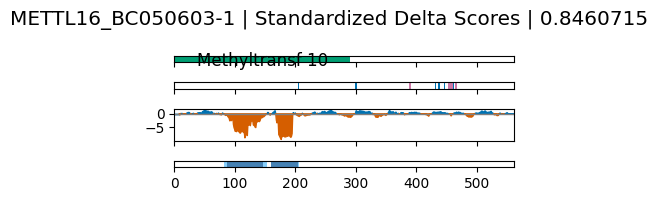

NSUN2_BC001041-2 NSUN2_BC001041-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NSUN2_BC001041-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Methyltr_RsmB-F: 7-140
Low complexity coordinates: 101-103, 134-137, 143-143, 319-325
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


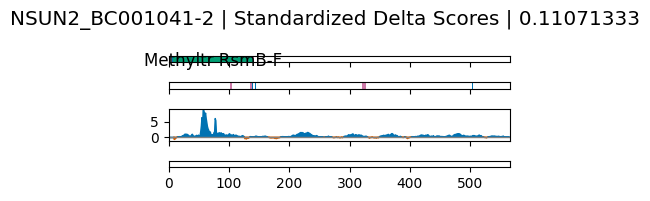

PES1_BC032489-1 PES1_BC032489-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PES1_BC032489-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pescadillo_N: 7-275
BRCT_2: 325-413
Low complexity coordinates: 231-231, 273-275, 283-290, 292-295, 300-301, 314-314, 317-320, 322-324, 451-499, 524-526, 533-534, 536-536, 541-541, 547-547, 549-550, 559-559, 564-564
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


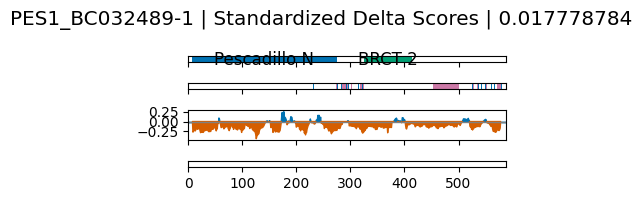

REPIN1_BC001760-1 REPIN1_BC001760-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/REPIN1_BC001760-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-C2H2: 177-199
zf-C2H2: 292-314
zf-C2H2: 375-397
zf-C2H2: 403-425
zf-C2H2: 236-258
zf-C2H2_4: 543-565
zf-C2H2: 116-138
zf-C2H2: 86-107
zf-C2H2_4: 146-168
zf-H2C2_2: 501-526
zf-H2C2_2: 278-302
zf-C2H2: 487-509
zf-H2C2_2: 251-274
zf-H2C2_2: 417-442
zf-C2H2: 264-286
zf-C2H2: 459-481
zf-H2C2_2: 473-498
zf-H2C2_2: 445-469
zf-H2C2_2: 390-412
zf-C2H2: 515-537
zf-C2H2: 431-453
Low complexity coordinates: 13-13, 17-18, 44-45, 53-55, 57-58, 101-101, 161-161, 165-165, 199-226
sig peak regions (p<0.05): 547-566
sig peak regions (p<0.001): 


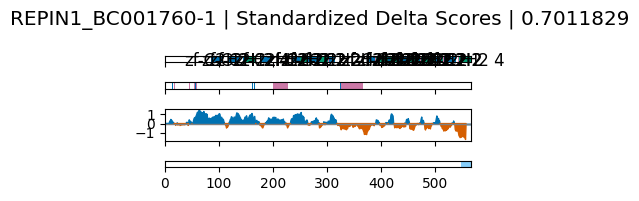

RBM15B_BC139836-1 RBM15B_BC139836-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM15B_BC139836-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 93-153
RRM_1: 12-81
SPOC: 386-560
Low complexity coordinates: 205-205, 234-242, 244-244, 246-249, 278-279, 293-298, 300-300, 306-306, 312-325, 328-348
sig peak regions (p<0.05): 468-487
sig peak regions (p<0.001): 


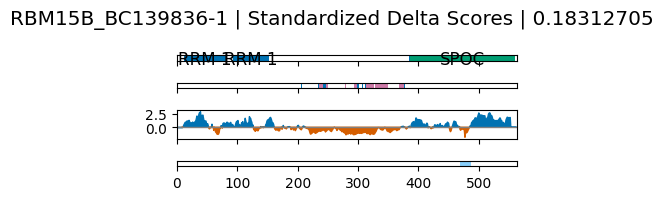

RDX_BC047109-1 RDX_BC047109-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RDX_BC047109-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FERM_N: 9-70
ERM_C: 508-583
FERM_M: 90-206
ERM_helical: 337-456
FERM_C: 210-298
Low complexity coordinates: 256-259, 261-261, 310-405, 407-413, 415-415, 421-448, 465-485, 488-494, 502-502
sig peak regions (p<0.05): 186-207
sig peak regions (p<0.001): 


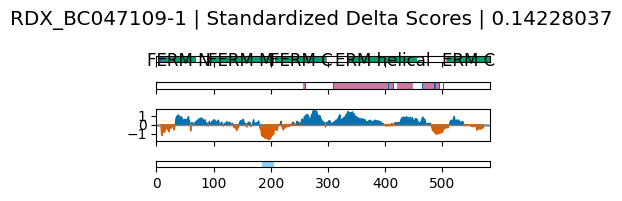

STAU1_BC050432-1 STAU1_BC050432-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/STAU1_BC050432-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
dsrm: 103-160
Staufen_C: 447-557
dsrm: 186-249
dsrm: 287-352
Low complexity coordinates: 11-11, 18-21, 23-27, 29-36, 59-69, 112-114, 116-122, 145-145, 149-150, 168-176, 222-233, 236-237, 239-270, 306-308, 336-336
sig peak regions (p<0.05): 0-20, 29-76, 88-114, 172-216, 429-448
sig peak regions (p<0.001): 172-214


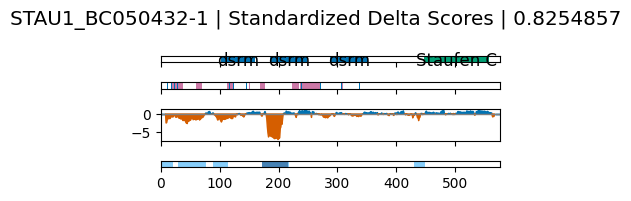

ZYX_BC008743-2_BC009360-2_BC010031-2 ZYX_BC008743-2_BC009360-2_BC010031-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZYX_BC008743-2_BC009360-2_BC010031-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LIM: 444-499
LIM: 384-439
LIM: 504-568
Low complexity coordinates: 10-13, 15-15, 20-28, 30-31, 37-37, 39-41, 54-58, 65-133, 146-152, 175-237, 241-241, 252-253, 257-257, 259-281, 284-284, 286-286, 325-332, 334-334, 337-340, 354-355, 357-366, 409-409
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


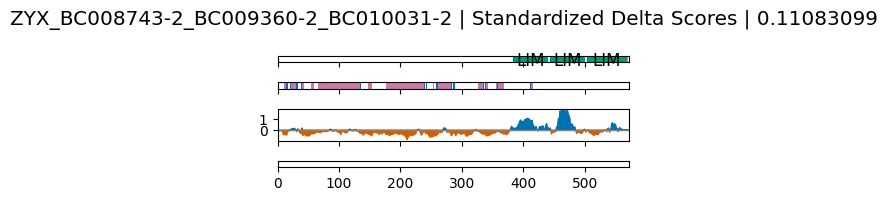

RBM6_BC046643-1 RBM6_BC046643-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM6_BC046643-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
OCRE: 265-315
G-patch: 529-572
Low complexity coordinates: 71-76, 81-81, 87-88, 90-90, 110-111, 113-118, 122-122, 124-124, 249-256, 268-268, 275-277, 279-279, 302-302, 309-329, 360-370, 373-374, 386-415, 421-422, 485-489, 521-521
sig peak regions (p<0.05): 1-22, 260-303, 418-470
sig peak regions (p<0.001): 270-290, 428-469


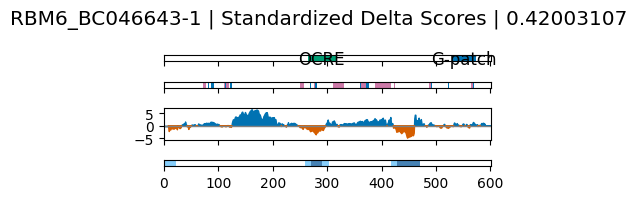

GRN_BC010577-2 GRN_BC010577-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GRN_BC010577-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Granulin: 138-179
Granulin: 455-496
Granulin: 377-417
Granulin: 72-112
Granulin: 220-261
Granulin: 532-573
Granulin: 295-336
Low complexity coordinates: 101-101, 372-372, 556-561, 564-564
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


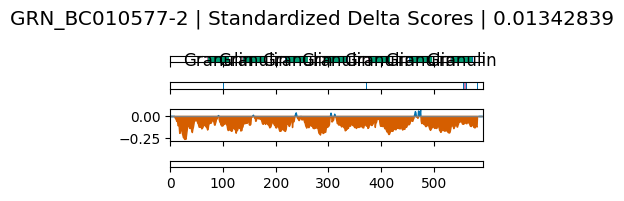

STXBP1_BC015749-1 STXBP1_BC015749-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/STXBP1_BC015749-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Sec1: 29-580
Low complexity coordinates: 13-23, 25-26, 203-206, 416-416, 508-508, 578-579
sig peak regions (p<0.05): 11-56, 108-127, 211-253, 387-406, 414-458, 517-568, 572-591
sig peak regions (p<0.001): 219-253, 415-434, 435-454, 546-568


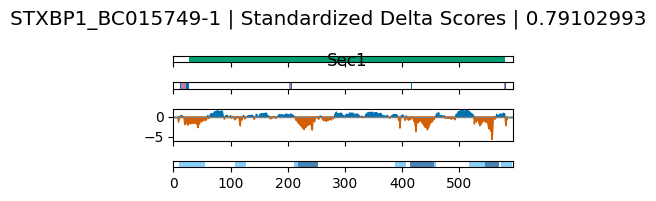

IGF2BP2_BC021290-2 IGF2BP2_BC021290-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/IGF2BP2_BC021290-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 277-341
RRM_1: 85-147
KH_1: 430-491
KH_1: 512-576
KH_1: 195-259
RRM_1: 4-61
Low complexity coordinates: 111-122, 169-169, 298-298, 370-370, 382-393, 409-416, 550-550, 575-577, 579-581
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


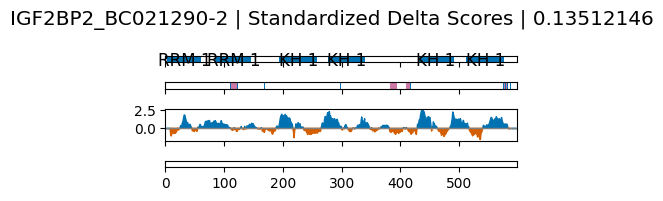

RPN1_BC010839-1 RPN1_BC010839-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPN1_BC010839-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribophorin_I: 32-456
Low complexity coordinates: 10-21, 62-62, 67-67, 70-74, 97-97, 448-450, 562-563
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


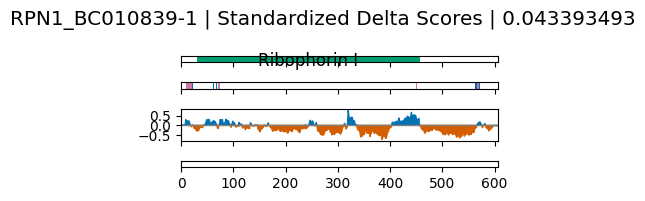

NXF1_BC004904-2_BC028041-1 NXF1_BC004904-2_BC028041-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NXF1_BC004904-2_BC028041-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LRR_8: 265-327
TAP_C: 569-617
Tap-RNA_bind: 119-198
NTF2: 388-535
Low complexity coordinates: 28-28, 30-36, 38-49, 80-80, 87-91, 263-272, 274-276, 301-302, 305-313, 449-449, 548-548
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


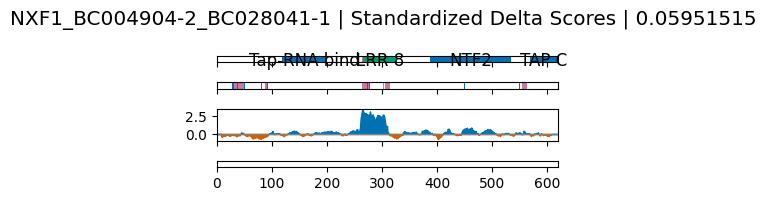

DDX59_BC041801-1 DDX59_BC041801-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX59_BC041801-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 227-393
zf-HIT: 105-132
Helicase_C: 429-540
Low complexity coordinates: 135-139, 148-152, 183-187, 303-303, 305-308, 312-314, 433-441, 448-449, 497-500
sig peak regions (p<0.05): 334-372, 517-536
sig peak regions (p<0.001): 


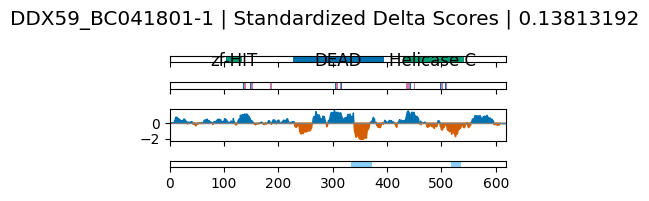

SRBD1_BC032538-1 SRBD1_BC032538-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRBD1_BC032538-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Tex_YqgF: 163-288
S1: 541-614
HHH_3: 328-392
HHH_9: 446-518
Low complexity coordinates: 34-34, 330-330
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


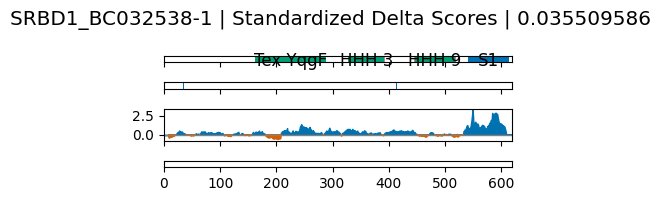

DDX41_BC015476-1 DDX41_BC015476-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX41_BC015476-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC: 580-597
Helicase_C: 420-527
DEAD: 205-384
Low complexity coordinates: 19-21, 23-24, 35-37, 40-55, 61-61, 65-67, 69-70, 96-115, 204-205, 419-419, 528-528
sig peak regions (p<0.05): 325-367, 489-509
sig peak regions (p<0.001): 


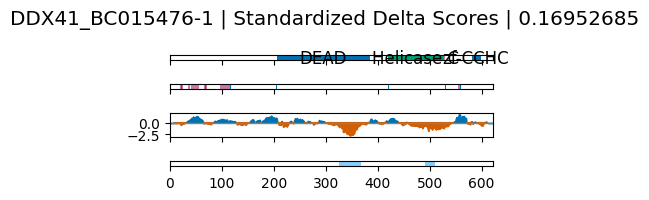

CSTF2T_BC028239-1 CSTF2T_BC028239-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CSTF2T_BC028239-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 18-88
CSTF_C: 572-612
CSTF2_hinge: 113-191
Low complexity coordinates: 112-118, 164-169, 206-237, 257-297, 317-333, 365-365, 387-395, 401-405, 422-446, 450-452, 468-499
sig peak regions (p<0.05): 493-557
sig peak regions (p<0.001): 501-538


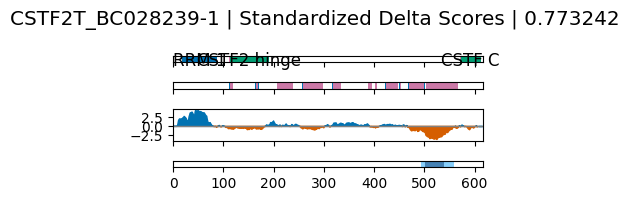

GTPBP4_BC038975-2 GTPBP4_BC038975-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GTPBP4_BC038975-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NOG1_N: 6-165
NOG1: 235-292
NOGCT: 395-446
Low complexity coordinates: 387-397, 447-448, 452-457, 460-460, 465-465, 482-494, 551-553, 560-561, 564-564, 566-568, 570-571
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


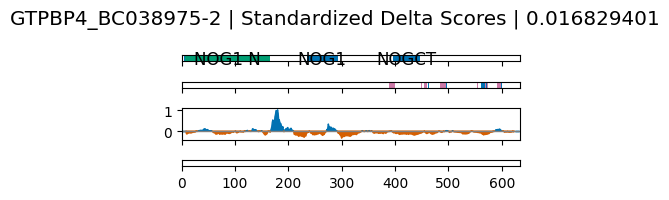

PABPC3_BC027617-2 PABPC3_BC027617-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PABPC3_BC027617-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 13-82
RRM_1: 193-261
RRM_1: 101-168
PABP: 545-609
RRM_1: 296-363
Low complexity coordinates: 461-462, 472-473, 481-504, 524-524, 587-589, 610-611
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


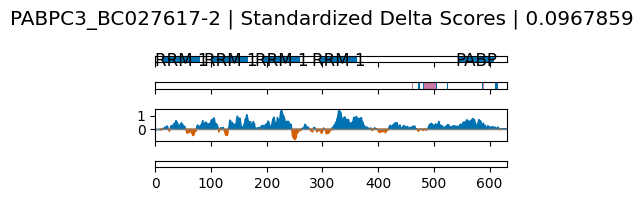

TBRG4_BC014918-1_BC017235-2 TBRG4_BC014918-1_BC017235-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TBRG4_BC014918-1_BC017235-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FATC: 68-85
RAP: 566-620
FAST_1: 369-438
FAST_2: 452-536
Low complexity coordinates: 20-25, 193-206, 267-267, 416-421, 468-475, 478-478
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


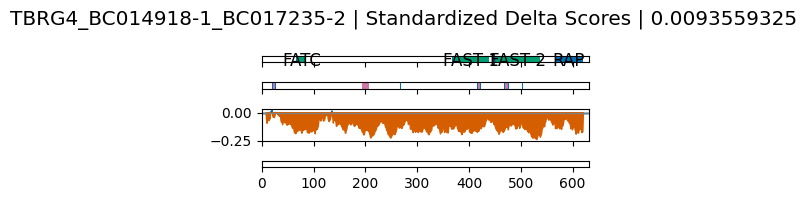

PARN_BC050029-1 PARN_BC050029-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PARN_BC050029-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CAF1: 4-390
RNA_bind: 437-514
Low complexity coordinates: 26-28, 82-82, 95-96, 192-192, 237-237, 239-245, 251-256
sig peak regions (p<0.05): 445-483
sig peak regions (p<0.001): 


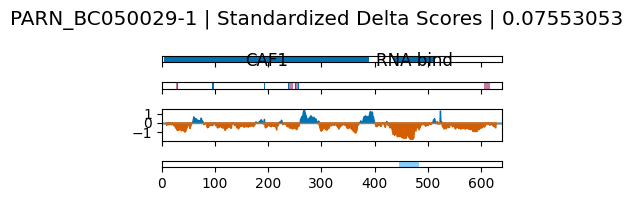

HNRNPR_BC001449-2 HNRNPR_BC001449-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HNRNPR_BC001449-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 248-313
RRM_1: 167-231
RRM_1: 346-407
hnRNP_Q_AcD: 37-106
Low complexity coordinates: 328-328, 332-335, 366-366, 397-399, 409-410, 420-422, 428-428, 437-437, 442-572, 598-601, 612-614
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


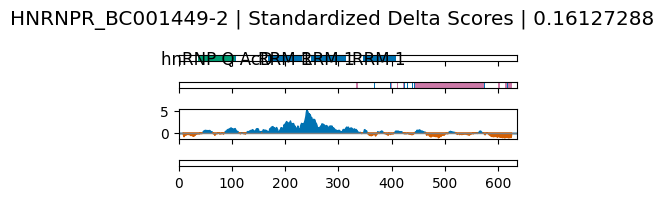

TRMT2A_BC013352-2_BC017184-2 TRMT2A_BC013352-2_BC017184-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRMT2A_BC013352-2_BC017184-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
tRNA_U5-meth_tr: 401-588
Low complexity coordinates: 26-34, 36-48, 145-146, 189-191, 600-603
sig peak regions (p<0.05): 418-443, 467-494
sig peak regions (p<0.001): 421-442


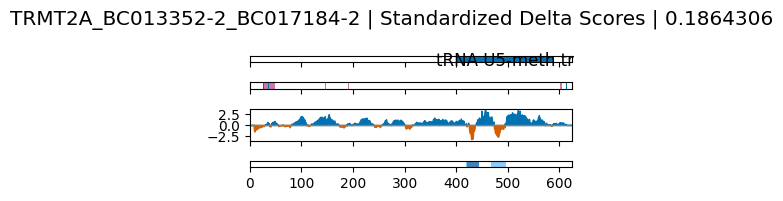

PATL1_BC065264-1_BC109038-1 PATL1_BC065264-1_BC109038-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PATL1_BC065264-1_BC109038-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PAT1: 331-574
Low complexity coordinates: 20-23, 37-43, 74-80, 99-99, 102-127, 173-195, 214-235, 237-239, 366-370, 375-375, 393-400, 403-404, 496-503, 505-505, 520-520, 546-546
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


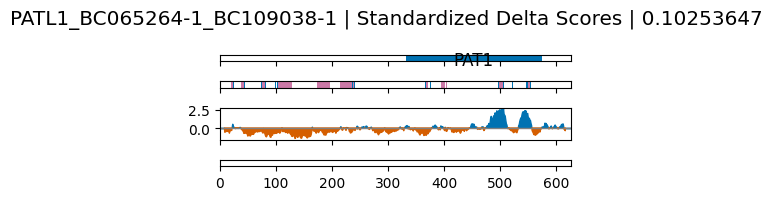

DDX53_BC067878-1 DDX53_BC067878-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX53_BC067878-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 53-110
Helicase_C: 455-562
DEAD: 246-416
Low complexity coordinates: 24-24, 26-26, 30-30, 34-36
sig peak regions (p<0.05): 248-291, 339-415, 474-583
sig peak regions (p<0.001): 249-290, 354-398, 486-551


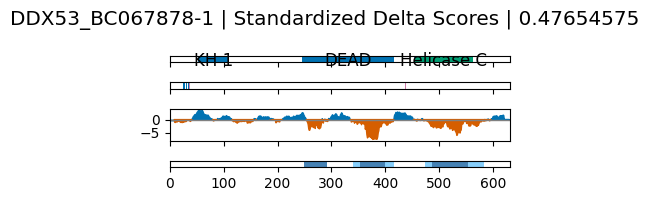

SF3B2_BC007610-1 SF3B2_BC007610-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SF3B2_BC007610-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PSP: 346-395
DUF382: 212-337
Low complexity coordinates: 23-34, 39-44, 52-52, 57-78, 80-82, 87-96, 110-111, 116-117, 123-124, 135-136, 139-155, 166-186, 284-286, 290-293, 388-392, 447-473, 564-570, 612-612, 614-615
sig peak regions (p<0.05): 380-400
sig peak regions (p<0.001): 


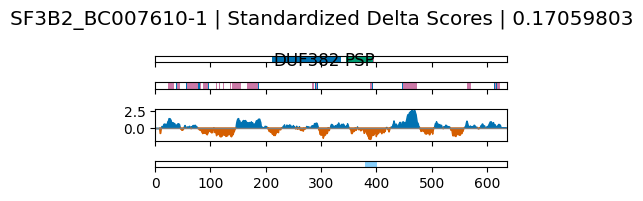

DDX43_BC066938-1 DDX43_BC066938-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX43_BC066938-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 75-129
Helicase_C: 475-582
DEAD: 266-436
Low complexity coordinates: 14-27, 45-48, 92-101, 581-584, 628-630
sig peak regions (p<0.05): 211-232, 268-300, 348-422, 500-613
sig peak regions (p<0.001): 271-290, 374-418, 508-571


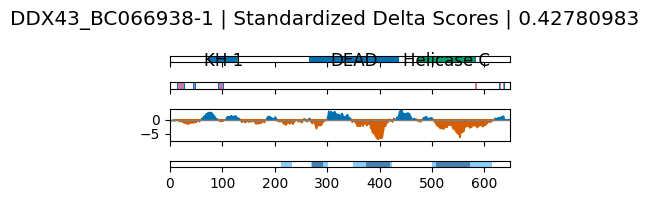

PDIA4_BC000425-2 PDIA4_BC000425-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PDIA4_BC000425-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Thioredoxin: 64-165
Thioredoxin: 527-632
Calsequestrin: 229-350
Thioredoxin_6: 312-502
Thioredoxin: 179-279
Low complexity coordinates: 10-20, 31-63, 65-65, 71-74, 111-112, 218-220, 222-223, 417-417, 462-463, 514-524, 528-528
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


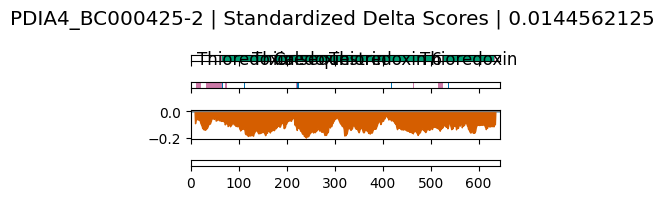

DDX17_BC000595-2 DDX17_BC000595-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX17_BC000595-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 326-433
DEAD: 116-286
Low complexity coordinates: 10-32, 476-488, 514-517, 522-527, 531-531, 540-607, 610-616
sig peak regions (p<0.05): 228-265, 396-416
sig peak regions (p<0.001): 246-265


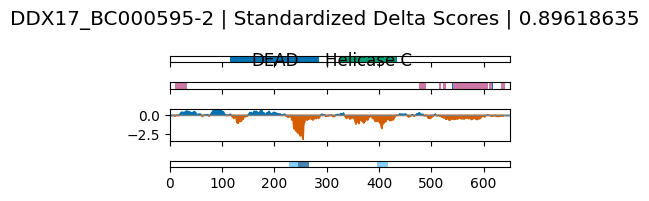

TDRD3_BC030514-1 TDRD3_BC030514-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TDRD3_BC030514-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RMI1_N_C: 1-72
UBA: 194-230
TUDOR: 554-611
Low complexity coordinates: 144-146, 148-148, 156-163, 244-246, 249-255, 323-324, 327-327, 354-354, 356-358, 538-538, 634-637
sig peak regions (p<0.05): 545-564
sig peak regions (p<0.001): 


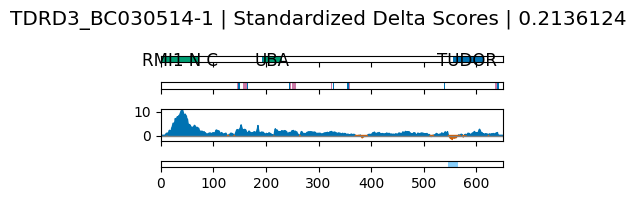

FASTKD3_BC113563-1 FASTKD3_BC113563-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FASTKD3_BC113563-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FAST_1: 408-479
RAP: 594-650
FAST_2: 490-580
Low complexity coordinates: 30-30, 186-187, 189-191, 227-227, 229-229
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


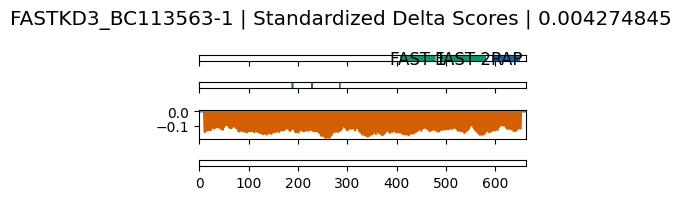

KIAA0020_BC016137-2 KIAA0020_BC016137-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/KIAA0020_BC016137-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CPL: 434-573
Low complexity coordinates: 68-80, 82-88, 105-120, 300-300, 302-302, 304-304, 420-425, 545-545, 626-626, 628-628
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


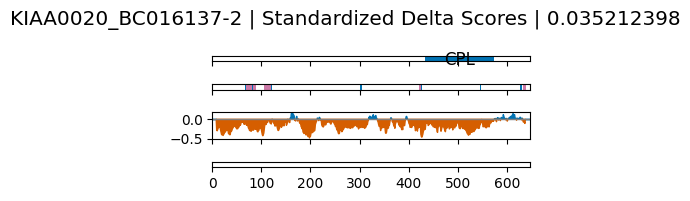

FANCM_BC036056-1 FANCM_BC036056-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FANCM_BC036056-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 472-580
DEAD: 105-254
Low complexity coordinates: 11-11, 17-30, 35-35, 39-44, 46-57, 577-578, 585-585
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


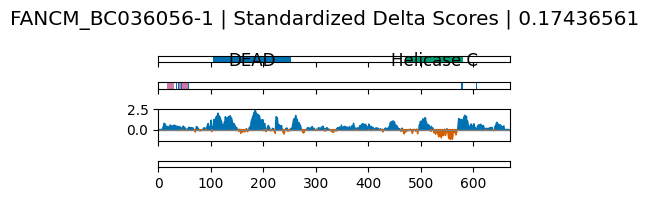

CIRH1A_BC009348-2 CIRH1A_BC009348-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CIRH1A_BC009348-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ANAPC4_WD40: 142-200
WD40: 102-128
Low complexity coordinates: 617-617
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


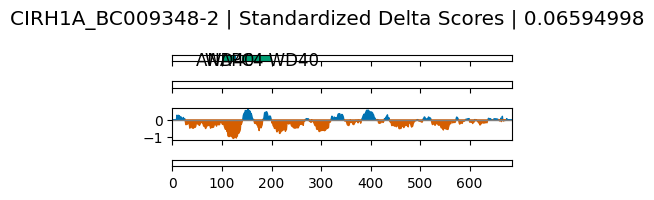

HSPA9_BC000478-2 HSPA9_BC000478-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HSPA9_BC000478-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HSP70: 55-652
Low complexity coordinates: 10-17, 419-419, 423-436, 439-442, 444-444, 568-575, 645-646, 658-658
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


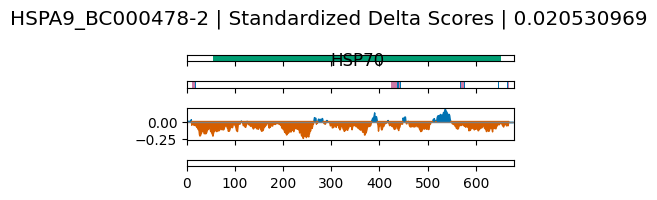

POLR3E_BC000285-1 POLR3E_BC000285-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/POLR3E_BC000285-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RPC5_C: 443-648
RPC5: 5-432
Low complexity coordinates: 98-98, 158-160, 184-184, 246-246, 250-250, 475-477, 482-483, 485-485
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


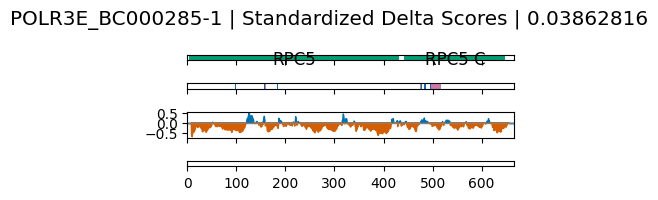

ESRP1_BC067098-1 ESRP1_BC067098-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ESRP1_BC067098-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 329-397
RRM_1: 448-518
RRM_1: 230-285
Low complexity coordinates: 82-83, 255-256, 422-434, 543-546, 549-554, 562-562, 609-612
sig peak regions (p<0.05): 228-247, 296-322, 550-576, 609-630
sig peak regions (p<0.001): 


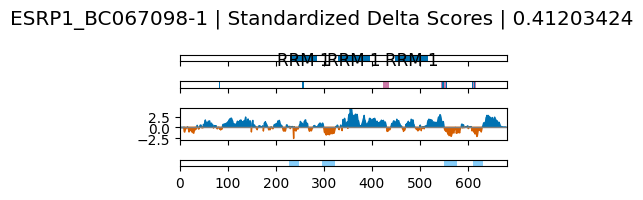

TRMT1L_BC045535-1 TRMT1L_BC045535-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRMT1L_BC045535-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TRM: 242-563
Low complexity coordinates: 10-18, 26-31, 33-73, 102-104, 106-109, 330-342, 430-442, 444-446, 457-462
sig peak regions (p<0.05): 98-128, 174-193, 295-314, 471-494
sig peak regions (p<0.001): 


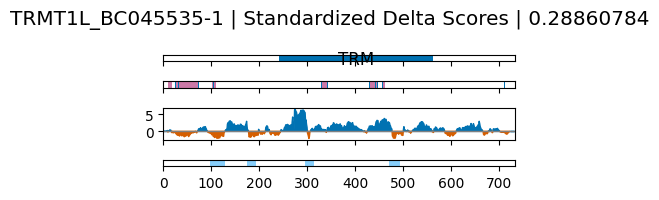

FASTKD2_BC001544-1 FASTKD2_BC001544-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FASTKD2_BC001544-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FAST_1: 456-529
FAST_2: 572-615
RAP: 637-692
Low complexity coordinates: 121-122, 124-124, 132-134
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


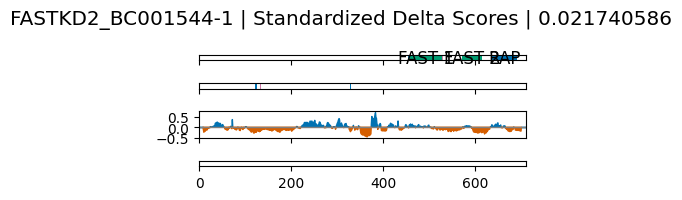

PUS7L_BC033621-2 PUS7L_BC033621-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PUS7L_BC033621-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
R3H: 225-262
TruD: 296-696
Low complexity coordinates: 61-61, 70-71, 220-220, 358-358, 365-365
sig peak regions (p<0.05): 33-52
sig peak regions (p<0.001): 


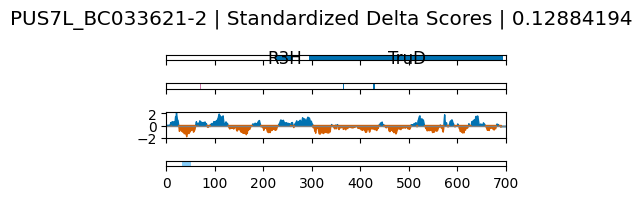

SSRP1_BC005116-1 SSRP1_BC005116-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SSRP1_BC005116-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
POB3_N: 6-97
SSRP1_C: 657-705
Rttp106-like_middle: 340-427
HMG_box: 547-615
SSrecog: 106-170
PH1_SSRP1-like: 197-326
Low complexity coordinates: 466-466, 470-508, 511-511, 516-533, 535-539, 585-589, 594-595, 597-604, 606-609, 613-613
sig peak regions (p<0.05): 0-21, 68-101, 143-206, 248-267, 277-299, 326-348, 366-410, 455-475, 492-515, 535-622
sig peak regions (p<0.001): 1-20, 73-92, 165-189, 378-401, 582-609


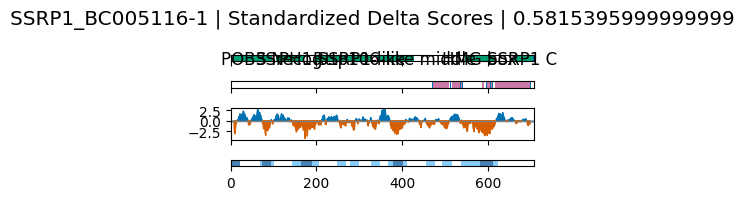

GFM1_BC049210-1 GFM1_BC049210-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GFM1_BC049210-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU: 44-319
EFG_C: 645-729
EFG_IV: 521-641
GTP_EFTU_D2: 366-432
EFG_III: 446-519
Low complexity coordinates: 10-15
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


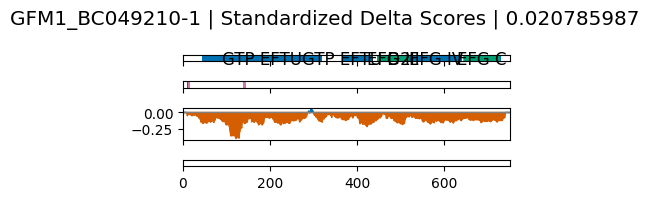

ZC3H18_BC050463-1 ZC3H18_BC050463-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZC3H18_BC050463-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH_4: 222-243
Low complexity coordinates: 14-16, 24-44, 46-46, 53-54, 58-60, 67-73, 76-76, 95-116, 118-118, 122-123, 126-161, 165-167, 173-208, 210-211, 264-274, 281-292, 294-295, 297-297, 333-333, 335-335, 397-494, 496-497, 524-621, 629-656, 658-745, 749-751, 758-766, 775-775, 778-802, 838-838, 844-844, 849-849, 851-854, 856-866, 869-869, 887-891, 897-917, 922-922, 925-925
sig peak regions (p<0.05): 256-329, 534-588, 648-668, 685-704, 834-887, 898-922
sig peak regions (p<0.001): 282-329


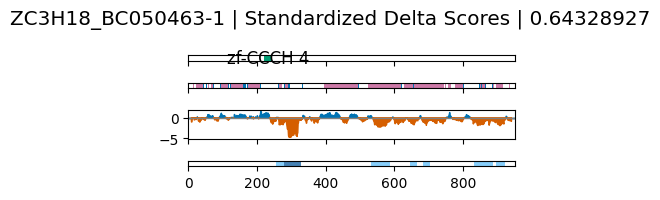

DPPA5_BC137549-1 DPPA5_BC137549-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DPPA5_BC137549-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MOEP19: 11-95
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


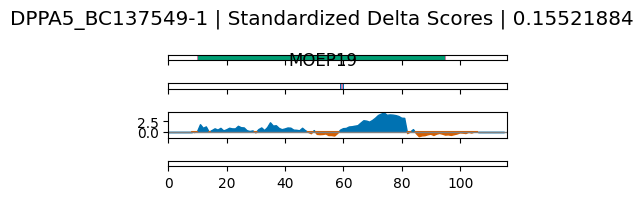

POLR2G_BC112162-1 POLR2G_BC112162-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/POLR2G_BC112162-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SHS2_Rpb7-N: 10-64
S1: 79-158
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


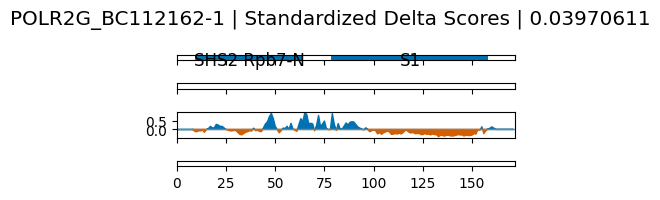

RPL21_BC001603-1_BC007505-2_BC071902-1 RPL21_BC001603-1_BC007505-2_BC071902-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL21_BC001603-1_BC007505-2_BC071902-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L21e: 1-101
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


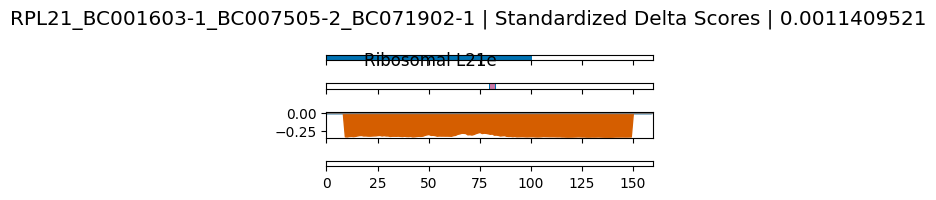

SRSF3_BC000914-1_BC069018-1 SRSF3_BC000914-1_BC069018-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF3_BC000914-1_BC069018-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 12-77
Low complexity coordinates: 51-51, 54-54, 56-58
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


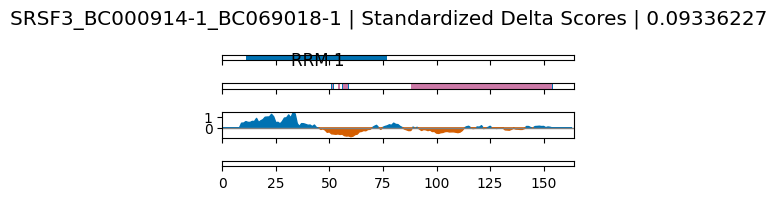

RBM24_BC104810-1 RBM24_BC104810-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM24_BC104810-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GCV_T_C: 128-160
Low complexity coordinates: 81-83, 88-88, 92-92
sig peak regions (p<0.05): 93-112
sig peak regions (p<0.001): 


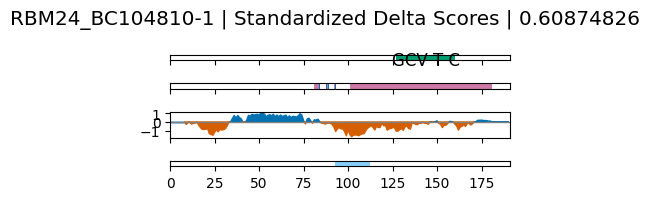

RBM18_BC008942-2 RBM18_BC008942-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM18_BC008942-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 27-99
Low complexity coordinates: 47-51
sig peak regions (p<0.05): 9-38, 59-96
sig peak regions (p<0.001): 64-94


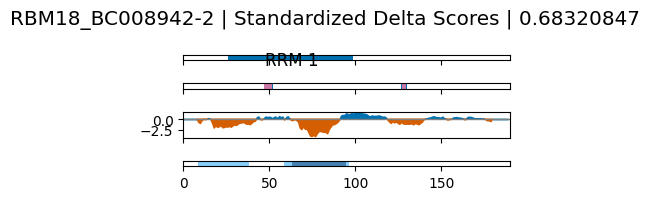

SRSF9_BC093971-1 SRSF9_BC093971-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRSF9_BC093971-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 16-83
RRM_1: 113-174
Low complexity coordinates: 90-90, 92-102, 112-112
sig peak regions (p<0.05): 57-79
sig peak regions (p<0.001): 


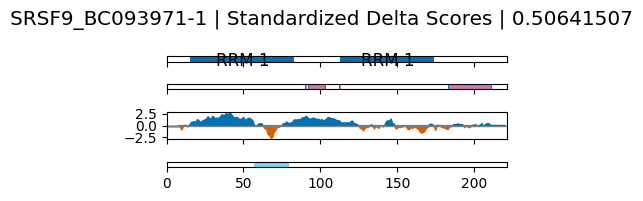

NGRN_BC001682-2_BC007222-1_BC009389-2_BC017192-2 NGRN_BC001682-2_BC007222-1_BC009389-2_BC017192-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NGRN_BC001682-2_BC007222-1_BC009389-2_BC017192-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Neugrin: 1-219
Low complexity coordinates: 58-60, 64-64, 67-70
sig peak regions (p<0.05): 17-65, 93-135, 153-188
sig peak regions (p<0.001): 17-61, 106-126


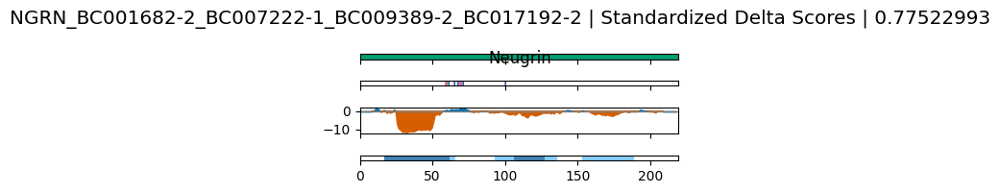

LIN28B_BC137526-1 LIN28B_BC137526-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LIN28B_BC137526-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC: 149-166
CSD: 31-101
zf-CCHC: 128-143
Low complexity coordinates: 10-19, 85-85, 179-179, 212-213, 215-217, 219-225, 227-227, 229-232, 235-235
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


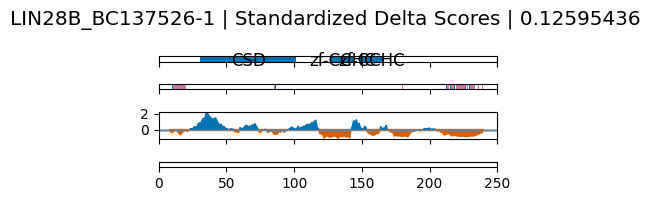

RRP36_BC011933-2 RRP36_BC011933-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RRP36_BC011933-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRP36: 90-252
Low complexity coordinates: 10-33, 154-198, 219-238
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


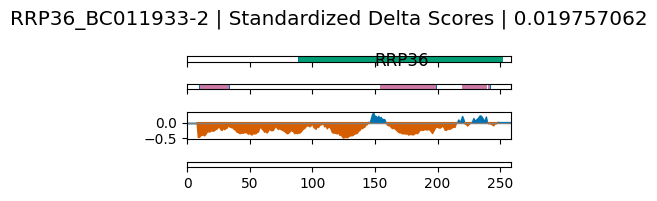

RPL7_BC006095-1_BC008850-2_BC009599-1 RPL7_BC006095-1_BC008850-2_BC009599-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL7_BC006095-1_BC008850-2_BC009599-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L30_N: 14-85
Ribosomal_L30: 90-140
Low complexity coordinates: 10-14, 24-30, 34-44, 49-49
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


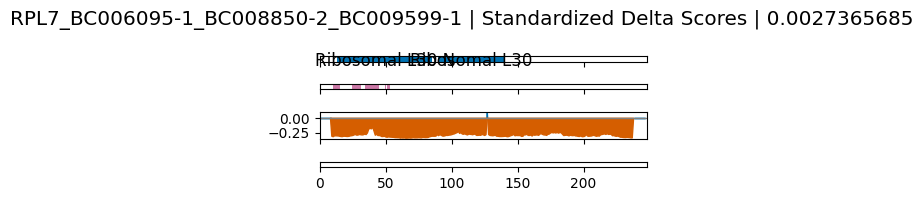

MAZ_BC041629-1 MAZ_BC041629-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MAZ_BC041629-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-C2H2: 50-72
zf-C2H2_4: 78-100
zf-H2C2_2: 93-119
zf-C2H2_4: 137-159
zf-met: 191-208
zf-C2H2_jaz: 225-244
zf-C2H2: 108-131
zf-H2C2_2: 64-89
zf-H2C2_2: 122-148
Low complexity coordinates: 10-38, 244-244
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


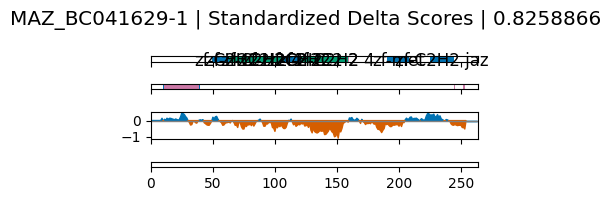

RALY_BC103753-1 RALY_BC103753-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RALY_BC103753-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ZapB: 177-210
RRM_1: 23-85
Low complexity coordinates: 111-127, 138-158, 173-174, 179-181, 183-188, 218-257, 275-275
sig peak regions (p<0.05): 183-221
sig peak regions (p<0.001): 


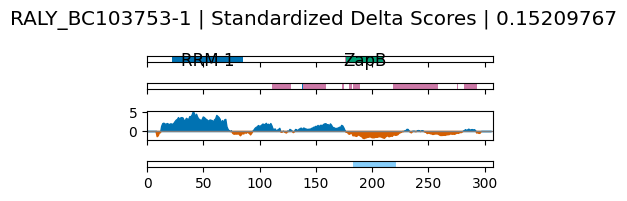

PCBP3_BC012061-1 PCBP3_BC012061-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PCBP3_BC012061-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 237-300
KH_1: 15-75
KH_1: 99-162
Low complexity coordinates: 31-33
sig peak regions (p<0.05): 184-212
sig peak regions (p<0.001): 


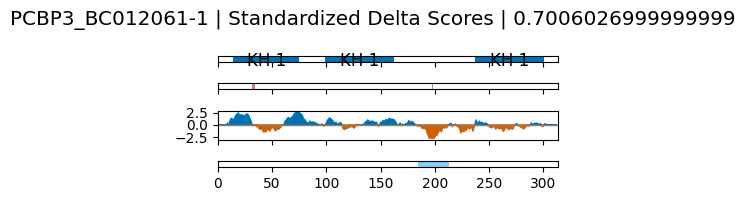

ISY1_BC004442-1_BC019849-1 ISY1_BC004442-1_BC019849-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ISY1_BC004442-1_BC019849-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Isy1: 1-266
Low complexity coordinates: 142-143, 167-167, 181-218, 224-229
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


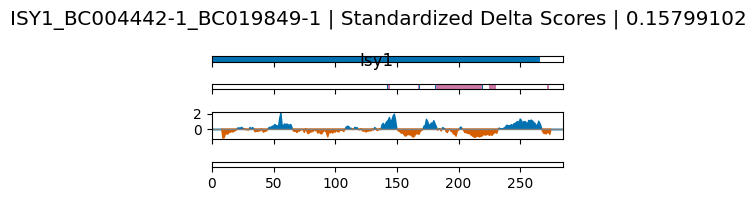

RBMX2_BC033750-1 RBMX2_BC033750-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBMX2_BC033750-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 38-108
Low complexity coordinates: 148-178, 193-193, 244-265
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


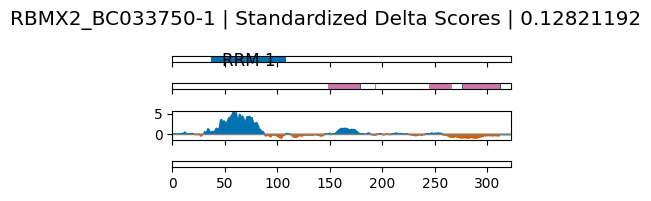

PURB_BC101735-1 PURB_BC101735-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PURB_BC101735-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PurA: 31-279
Low complexity coordinates: 10-22, 103-108, 111-111, 147-151, 153-170, 192-216, 218-218
sig peak regions (p<0.05): 53-72, 80-101, 141-202, 216-246
sig peak regions (p<0.001): 176-199


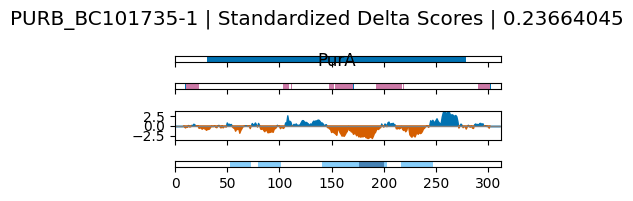

GTSF1L_BC040049-1 GTSF1L_BC040049-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GTSF1L_BC040049-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-U11-48K: 7-30
zf-U11-48K: 40-63
Low complexity coordinates: 36-36
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


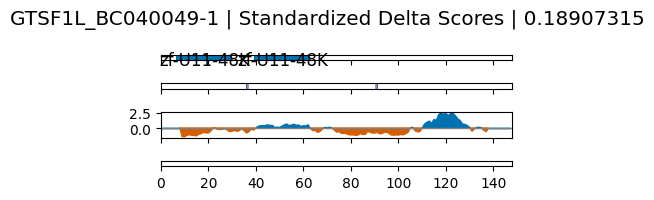

DNAJC5_BC053642-1 DNAJC5_BC053642-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DNAJC5_BC053642-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DnaJ: 16-77
Low complexity coordinates: 54-54, 113-137
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


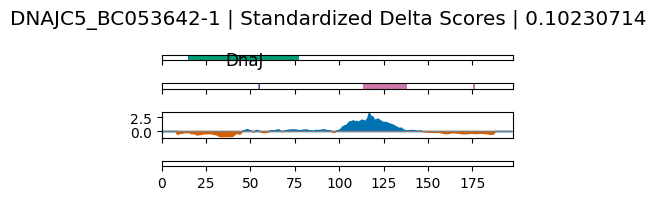

RPL22_BC058887-1 RPL22_BC058887-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RPL22_BC058887-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ribosomal_L22e: 16-125
Low complexity coordinates: 10-15, 69-69, 85-92
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


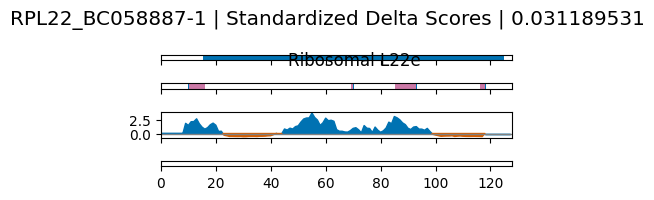

SUCLG1_BC000504-2 SUCLG1_BC000504-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SUCLG1_BC000504-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CoA_binding: 40-133
Ligase_CoA: 186-311
Low complexity coordinates: 10-13, 70-70, 72-77, 79-80, 109-109, 111-123, 164-164, 174-175, 178-179, 240-248
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


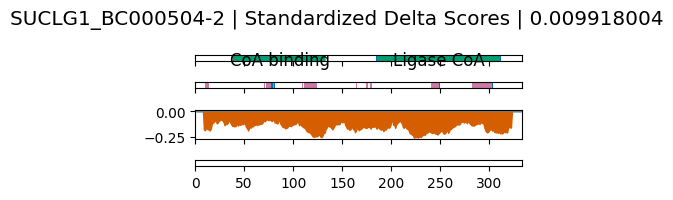

SNRNP70_BC001315-1 SNRNP70_BC001315-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNRNP70_BC001315-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
U1snRNP70_N: 3-94
RRM_1: 105-174
Low complexity coordinates: 12-15, 18-18, 27-27, 50-78, 174-175, 179-203, 222-312, 316-404
sig peak regions (p<0.05): 78-101, 146-175
sig peak regions (p<0.001): 


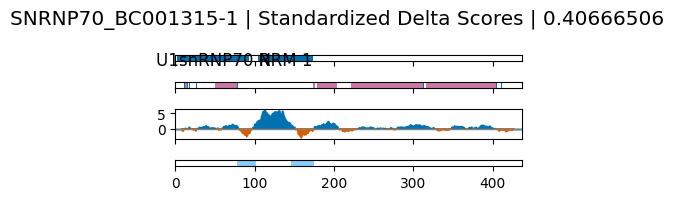

PTRF_BC066123-1 PTRF_BC066123-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PTRF_BC066123-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PTRF_SDPR: 48-320
Low complexity coordinates: 21-35, 76-76, 81-81, 110-119, 167-218, 246-268, 342-343
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


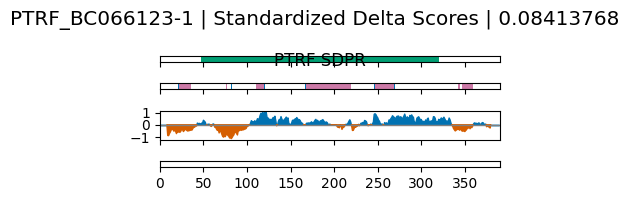

TIAL1_BC030025-1 TIAL1_BC030025-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TIAL1_BC030025-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 84-148
RRM_1: 2-46
Low complexity coordinates: 171-176, 184-192, 198-201
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


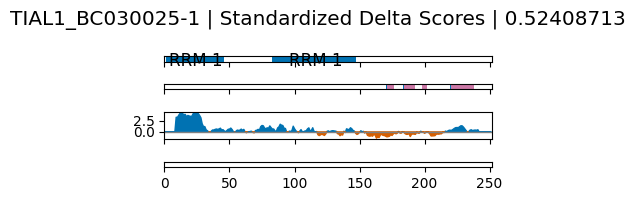

C16orf88_BC117562-1 C16orf88_BC117562-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/C16orf88_BC117562-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SMAP: 362-435
Low complexity coordinates: 10-23, 60-76, 144-149, 205-210, 234-243, 252-253, 261-276, 280-286, 288-292
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


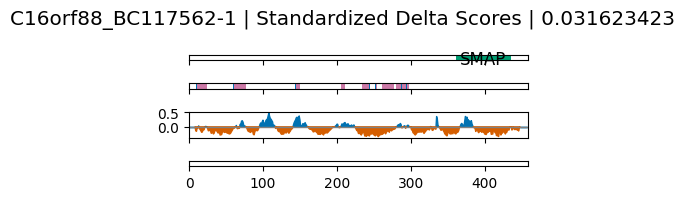

CELF3_BC052491-1 CELF3_BC052491-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CELF3_BC052491-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 9-74
RRM_1: 97-161
RRM_1: 381-451
Low complexity coordinates: 207-219, 222-226, 229-231, 238-239, 250-271, 312-315, 330-330
sig peak regions (p<0.05): 111-138, 228-263, 271-321
sig peak regions (p<0.001): 


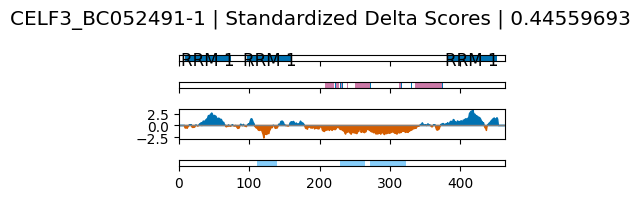

CELF4_BC001946-1 CELF4_BC001946-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CELF4_BC001946-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 153-215
RRM_1: 56-121
RRM_1: 440-471
Low complexity coordinates: 15-15, 17-20, 24-34, 246-246, 248-253, 261-274, 278-278, 281-282, 287-304, 307-329, 372-402
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


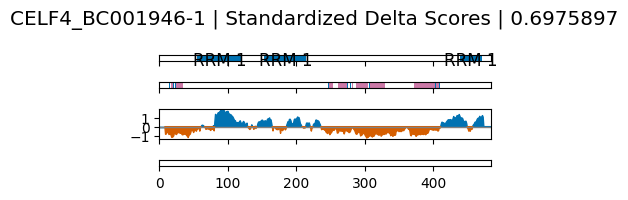

DDX28_BC024273-1 DDX28_BC024273-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX28_BC024273-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 378-492
DEAD: 152-337
Low complexity coordinates: 10-18, 23-24, 29-29, 41-66, 182-196, 198-199, 212-212, 215-216, 222-224, 226-226, 234-237, 239-239, 283-294
sig peak regions (p<0.05): 448-474
sig peak regions (p<0.001): 


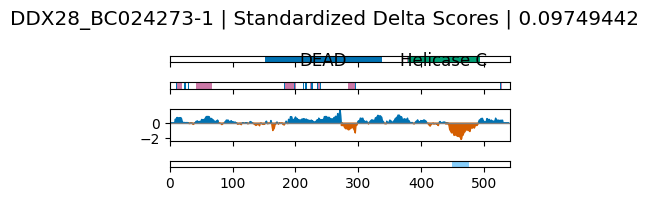

NOVA1_BC075038-2 NOVA1_BC075038-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOVA1_BC075038-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 424-489
KH_1: 53-112
KH_1: 174-238
Low complexity coordinates: 73-73, 152-162, 263-265, 275-296, 321-321, 323-402
sig peak regions (p<0.05): 67-86, 200-230, 251-280, 353-382, 412-431, 467-493
sig peak regions (p<0.001): 


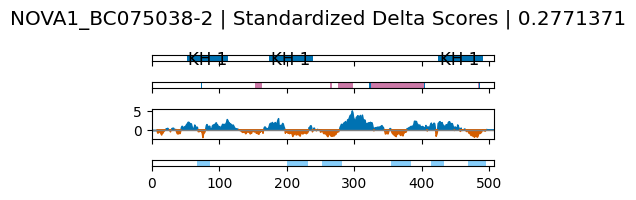

NOP9_BC025332-1 NOP9_BC025332-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOP9_BC025332-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 11-40, 42-42, 48-51, 154-179, 186-186, 269-269, 322-322, 327-331, 333-343, 346-347, 349-349, 382-390, 401-401, 417-417, 468-470, 480-481, 484-485, 488-489, 491-499, 507-513
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


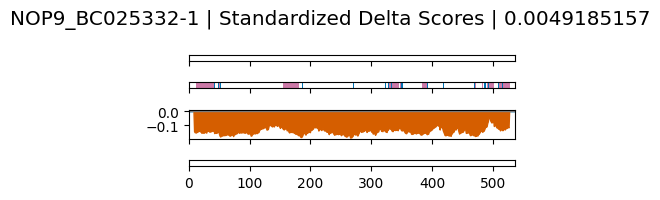

SPATS2_BC048299-1 SPATS2_BC048299-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SPATS2_BC048299-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SPATS2-like: 81-385
Low complexity coordinates: 81-101, 114-118, 151-151, 155-155, 290-290, 293-294, 305-305, 380-411, 443-448, 476-488
sig peak regions (p<0.05): 274-310
sig peak regions (p<0.001): 


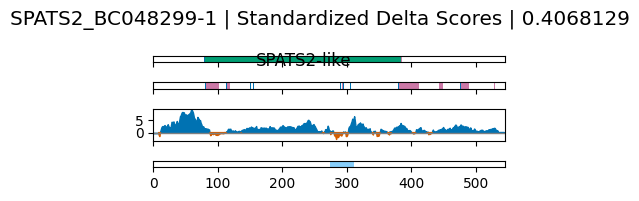

LARP7_BC066945-1 LARP7_BC066945-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LARP7_BC066945-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 127-188
RRM_3: 454-552
La: 38-96
Low complexity coordinates: 10-29, 114-114, 210-231, 267-267, 303-303, 318-320, 322-333, 342-366, 400-405
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


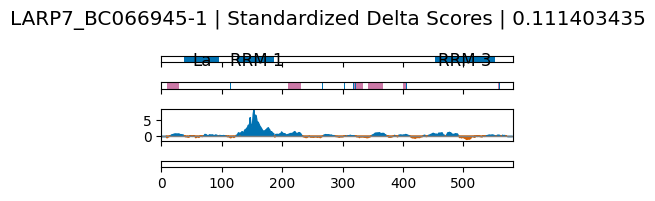

SAFB2_BC025279-1 SAFB2_BC025279-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SAFB2_BC025279-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SAP: 30-63
RRM_1: 409-478
Low complexity coordinates: 10-16, 101-101, 104-106, 211-212, 261-265, 278-281, 317-341, 378-378, 387-387, 394-395, 407-410, 498-499, 504-504, 508-509
sig peak regions (p<0.05): 1-20, 127-146, 408-443
sig peak regions (p<0.001): 411-441


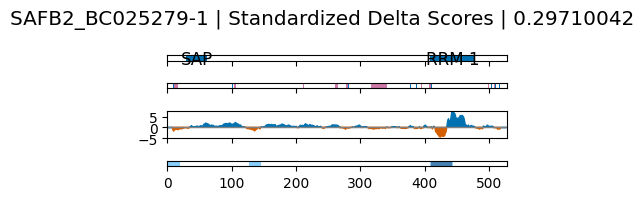

SRP68_BC020238-1 SRP68_BC020238-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SRP68_BC020238-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SRP68: 75-263
SRP68: 257-567
Low complexity coordinates: 10-44, 64-64, 66-66, 82-85, 101-101, 159-161, 163-164, 380-381, 399-400, 402-402
sig peak regions (p<0.05): 0-42, 115-149, 160-179, 198-236, 288-307, 376-401, 431-483, 503-522
sig peak regions (p<0.001): 129-149, 432-474


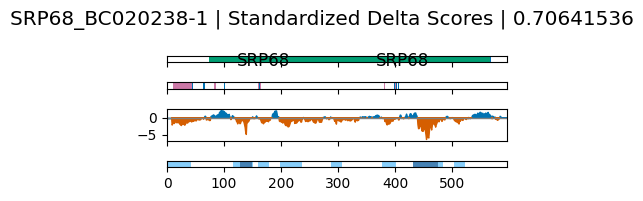

YTHDF1_BC050284-1 YTHDF1_BC050284-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/YTHDF1_BC050284-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
YTH: 390-523
Low complexity coordinates: 47-61, 63-63, 135-154, 156-157, 195-218, 236-236, 238-241, 243-244, 247-256, 284-324, 339-342, 344-353, 355-355, 473-473
sig peak regions (p<0.05): 0-21, 34-86, 135-157, 166-197, 216-239, 371-430, 455-512
sig peak regions (p<0.001): 217-238, 459-478


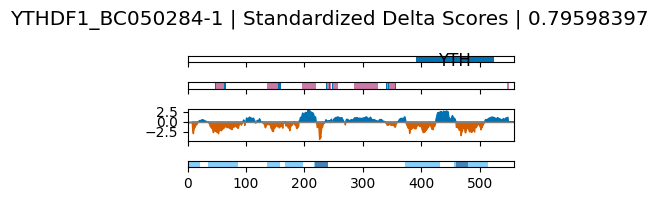

CNOT4_BC035590-1 CNOT4_BC035590-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CNOT4_BC035590-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH_2: 196-214
RRM_1: 130-187
zf-RING_4: 14-60
Low complexity coordinates: 77-89, 109-109, 234-236, 241-244, 282-288, 290-293, 295-297, 300-308, 343-344, 347-352, 354-354, 356-359, 361-362, 371-371, 427-438, 445-446, 516-516
sig peak regions (p<0.05): 12-31, 34-80
sig peak regions (p<0.001): 


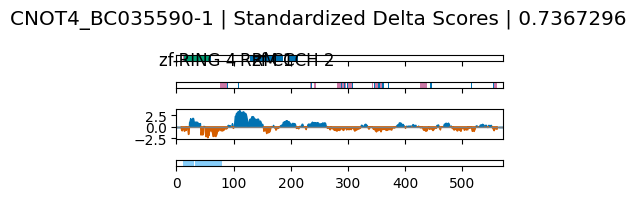

DDX18_BC001238-1_BC003360-1_BC024739-1 DDX18_BC001238-1_BC003360-1_BC024739-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX18_BC001238-1_BC003360-1_BC024739-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DUF4217: 572-619
Helicase_C: 416-518
DEAD: 203-374
Low complexity coordinates: 10-10, 12-18, 102-122, 128-157, 416-424, 428-428, 499-499, 519-521, 527-528, 633-643, 645-645
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


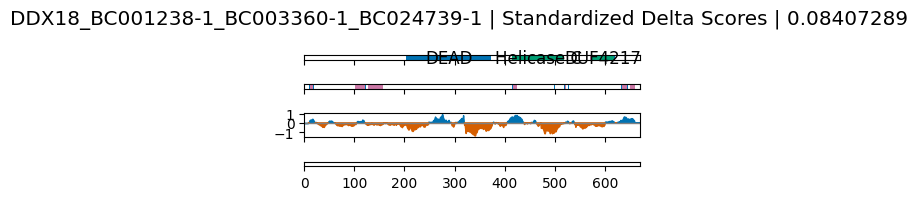

ZC3HAV1_BC040956-1 ZC3HAV1_BC040956-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZC3HAV1_BC040956-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WWE: 607-679
HTH_53: 5-66
zf-CCCH_8: 143-170
Low complexity coordinates: 31-31, 59-59, 63-64, 120-123, 128-130, 236-236, 239-241, 258-261, 317-317, 355-356
sig peak regions (p<0.05): 63-92, 160-226, 342-371, 419-450, 462-540, 542-561, 591-635
sig peak regions (p<0.001): 65-84, 166-225, 608-627


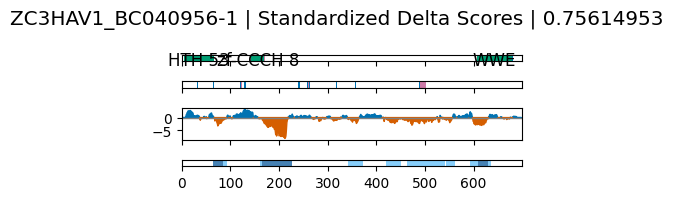

PRPF6_BC001666-2 PRPF6_BC001666-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRPF6_BC001666-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TPR_19: 725-777
TPR_14: 409-443
TPR_14: 311-352
TPR_14: 576-615
TPR_14: 439-473
PRP1_N: 13-169
TPR_19: 620-677
Low complexity coordinates: 16-16, 66-76, 103-110, 113-131, 213-230, 386-387, 447-447, 659-661
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


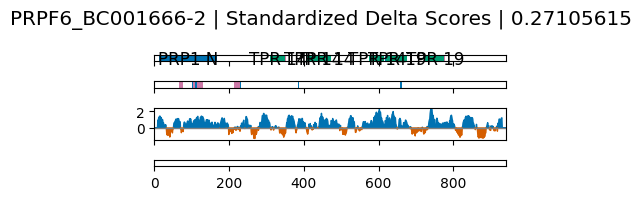

EIF2AK2_BC101475-1 EIF2AK2_BC101475-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EIF2AK2_BC101475-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
dsrm: 101-164
Pkinase: 268-534
dsrm: 13-75
Low complexity coordinates: 58-58, 60-60, 62-63, 67-76, 94-94, 157-160, 186-187, 190-228, 230-233, 303-303, 336-349, 511-514
sig peak regions (p<0.05): 199-230, 279-298, 326-348, 405-428, 453-472
sig peak regions (p<0.001): 


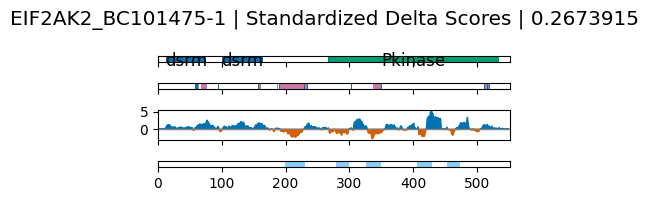

ADARB1_BC065545-1 ADARB1_BC065545-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ADARB1_BC065545-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
dsrm: 244-294
dsrm: 79-140
A_deamin: 370-691
Low complexity coordinates: 35-54, 197-230, 284-292, 362-365, 539-540
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


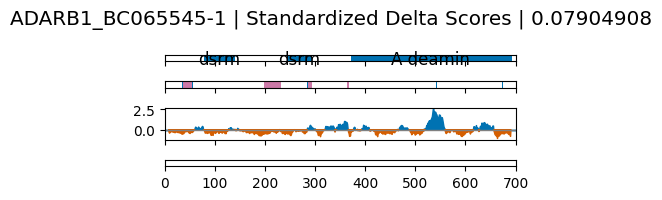

PARP12_BC081541-1 PARP12_BC081541-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PARP12_BC081541-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH_8: 149-175
WWE: 299-352
HTH_53: 10-62
PARP: 507-678
WWE: 377-458
zf-CCCH: 180-200
Low complexity coordinates: 10-15, 22-38, 45-67, 599-599
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


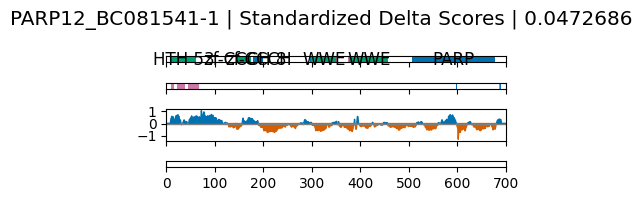

MTPAP_BC061703-1 MTPAP_BC061703-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MTPAP_BC061703-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TUTase: 185-245
RL: 63-131
PAP_assoc: 440-483
Low complexity coordinates: 11-11, 13-14, 17-20, 198-199, 442-444, 525-526
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


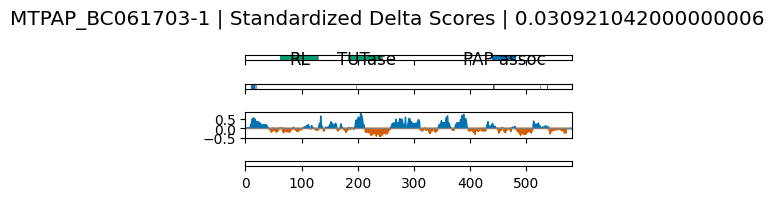

SUGP1_BC142988-1 SUGP1_BC142988-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SUGP1_BC142988-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Surp: 189-241
Surp: 265-316
G-patch: 563-606
Low complexity coordinates: 41-49, 103-131, 243-246, 252-253, 338-339, 346-378, 426-427, 445-446, 448-452, 455-458, 460-460, 575-578
sig peak regions (p<0.05): 0-25, 91-123, 340-384, 401-441, 473-492, 500-519, 572-626
sig peak regions (p<0.001): 0-20, 345-376, 403-425


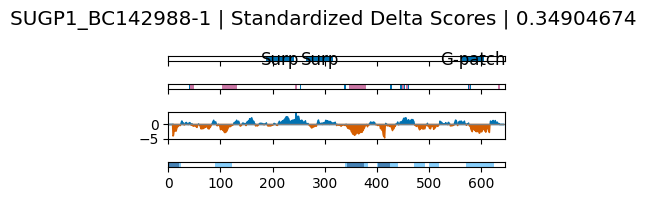

SFPQ_BC051192-1 SFPQ_BC051192-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SFPQ_BC051192-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 299-363
RRM_1: 374-433
NOPS: 444-495
Low complexity coordinates: 10-30, 40-262, 266-268, 379-379, 457-457, 507-507, 537-593, 597-619, 621-622, 627-634, 636-636, 639-642, 644-644, 662-662, 671-691
sig peak regions (p<0.05): 115-156, 158-180, 604-638, 640-665, 671-703
sig peak regions (p<0.001): 


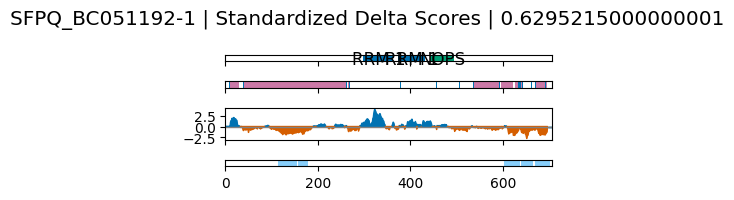

PNN_BC062602-1 PNN_BC062602-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PNN_BC062602-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pinin_SDK_N: 1-132
Pinin_SDK_memA: 136-260
Low complexity coordinates: 46-64, 86-86, 88-90, 92-99, 171-215, 217-217, 297-315, 325-377, 383-383, 413-413, 416-427, 429-429, 431-433, 453-507, 534-534, 537-537, 539-547, 558-649, 651-653, 655-657
sig peak regions (p<0.05): 125-144, 154-173, 185-223, 575-716
sig peak regions (p<0.001): 


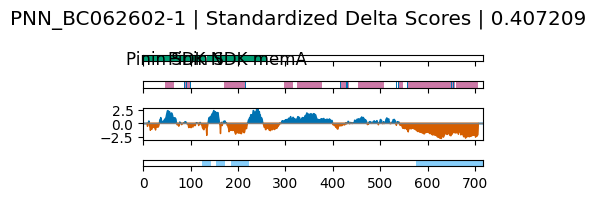

RBM25_BC136775-1 RBM25_BC136775-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM25_BC136775-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PWI: 771-836
RRM_1: 89-157
Low complexity coordinates: 11-51, 163-169, 237-238, 289-454, 460-460, 466-504, 513-513, 525-545, 564-566, 568-609, 611-611, 619-619, 624-624, 627-632
sig peak regions (p<0.05): 349-396
sig peak regions (p<0.001): 


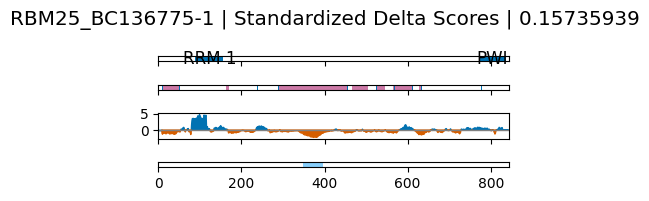

NOP2_BC106072-1 NOP2_BC106072-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NOP2_BC106072-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Methyltr_RsmB-F: 410-618
P120R: 782-801
P120R: 716-738
P120R: 656-677
Methyltr_RsmF_N: 329-407
Low complexity coordinates: 11-12, 16-17, 43-52, 69-69, 74-75, 108-126, 141-151, 159-159, 162-164, 169-169, 171-177, 198-201, 204-207, 211-231, 323-324, 344-344, 346-346, 350-350, 353-353, 590-596, 655-657, 659-673, 703-705, 794-795
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


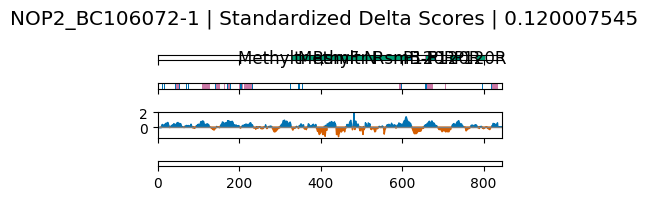

NAA15_BC104806-1 NAA15_BC104806-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NAA15_BC104806-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ANAPC3: 23-105
TPR_11: 92-120
NatA_aux_su: 187-698
Low complexity coordinates: 119-119, 200-200, 598-638, 640-640, 642-650
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


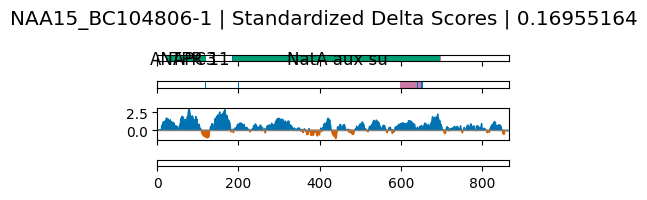

SART3_BC111983-1 SART3_BC111983-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SART3_BC111983-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LSM_int_assoc: 877-937
RRM_1: 803-871
Lsm_interact: 944-962
RRM_1: 706-774
Low complexity coordinates: 10-22, 26-26, 34-40, 65-84, 86-86, 88-99, 234-234, 292-307, 450-452, 583-637, 661-662, 669-669
sig peak regions (p<0.05): 1-20, 137-164, 174-195, 216-235, 261-284, 311-331, 402-485, 516-550, 553-579, 700-720, 844-863
sig peak regions (p<0.001): 


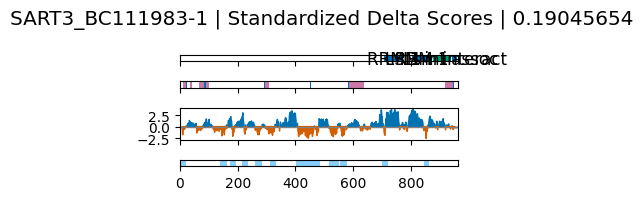

GANAB_BC065266-1 GANAB_BC065266-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GANAB_BC065266-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Glyco_hydro_31_2nd: 290-617
Glyco_hydro_31_3rd: 625-713
DUF5110: 730-788
Gal_mutarotas_2: 9-227
Low complexity coordinates: 12-12, 14-22, 61-61, 65-65, 68-71, 103-108, 113-115, 119-121
sig peak regions (p<0.05): 1-20, 25-53, 247-267, 321-390, 508-530, 620-639, 711-757, 780-803
sig peak regions (p<0.001): 352-390, 508-529


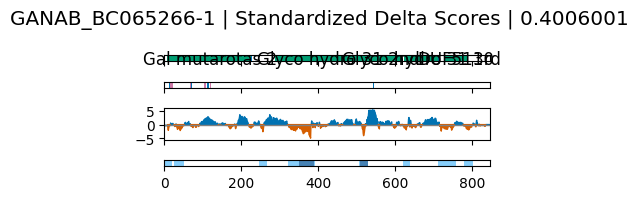

SUGP2_BC020586-1 SUGP2_BC020586-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SUGP2_BC020586-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Surp: 537-585
G-patch: 908-939
Surp: 734-784
Low complexity coordinates: 11-12, 38-40, 177-185, 190-191, 209-210, 212-213, 420-420, 498-498, 500-508, 622-622, 625-641, 644-647, 651-652, 693-701, 819-819, 821-832, 834-834, 897-897, 899-900
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


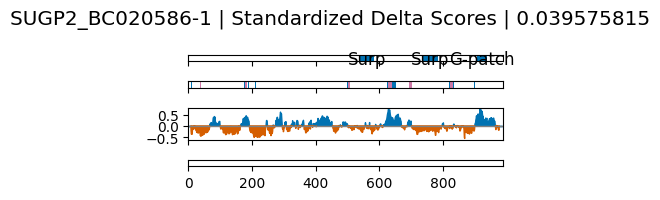

SKIV2L2_BC028604-2 SKIV2L2_BC028604-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SKIV2L2_BC028604-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 449-528
MTR4_beta-barrel: 646-841
MTR4-like_stalk: 582-645
DEAD: 143-290
DSHCT: 868-1037
Low complexity coordinates: 21-40, 358-361, 450-460, 466-466, 468-468, 529-529, 610-614, 618-618, 669-669, 712-712, 778-781
sig peak regions (p<0.05): 234-271
sig peak regions (p<0.001): 


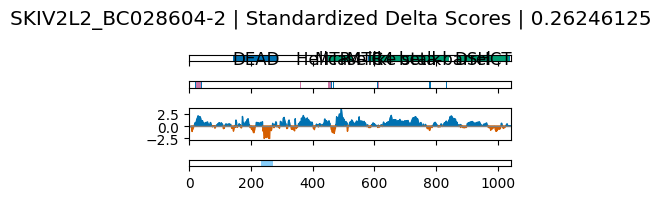

FAM120A_BC098584-1 FAM120A_BC098584-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FAM120A_BC098584-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 35-38, 347-348, 351-358, 377-394, 451-453, 457-468, 507-507, 509-515, 854-870, 884-889, 891-896, 904-904, 917-918, 920-920, 922-922, 924-925, 932-934, 957-960, 967-977, 982-997, 1006-1011, 1027-1044
sig peak regions (p<0.05): 96-120, 152-204, 330-492, 508-527, 679-712, 749-768, 775-810, 922-948, 1009-1028, 1033-1103
sig peak regions (p<0.001): 154-195, 342-387, 432-455, 784-803


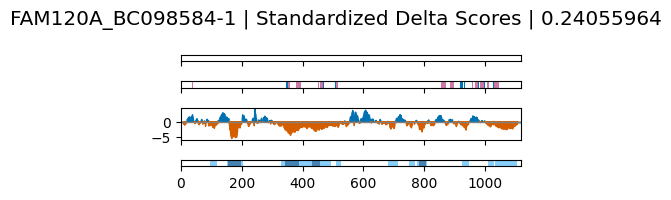

WDR36_BC133025-1 WDR36_BC133025-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/WDR36_BC133025-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ANAPC4_WD40: 256-333
WD40: 153-187
Utp21: 745-947
WD40: 613-650
Low complexity coordinates: 52-53, 55-69, 571-571, 578-578, 581-581, 703-703, 732-735, 770-785, 838-838, 904-906
sig peak regions (p<0.05): 162-192, 338-377, 602-662
sig peak regions (p<0.001): 624-655


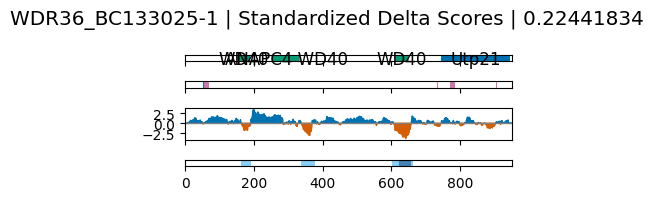

SFSWAP_BC136678-1 SFSWAP_BC136678-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SFSWAP_BC136678-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Surp: 210-255
Surp: 459-502
DRY_EERY: 35-155
Low complexity coordinates: 10-31, 107-108, 115-117, 119-125, 127-127, 129-134, 159-161, 164-164, 166-166, 168-177, 180-183, 185-186, 276-286, 398-400, 402-454, 525-556, 562-562, 595-613, 617-617, 623-626, 628-629, 634-634, 636-636, 638-681, 683-685, 706-706, 708-709, 716-716, 721-724, 726-731, 737-787, 789-789, 791-791, 793-793, 795-828, 832-837, 839-909
sig peak regions (p<0.05): 56-75, 331-358, 369-424, 445-475, 762-787, 793-828, 886-910
sig peak regions (p<0.001): 


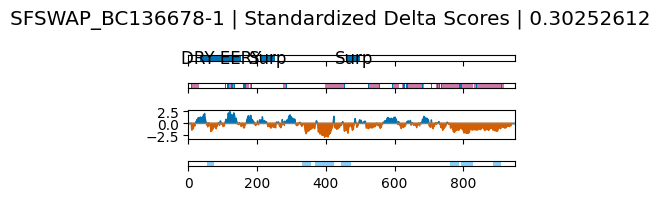

HERC5_BC140716-1 HERC5_BC140716-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HERC5_BC140716-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RCC1: 209-258
HECT: 733-1024
RCC1_2: 140-169
RCC1_2: 195-222
RCC1: 261-309
RCC1_2: 297-327
RCC1_2: 248-274
RCC1: 157-206
RCC1: 315-350
Low complexity coordinates: 10-17, 20-22, 24-24, 29-29, 69-75, 265-266, 320-322, 346-354, 646-650, 659-659, 661-663, 777-777, 781-782, 785-787, 795-795, 798-799, 801-804, 810-815, 948-949
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


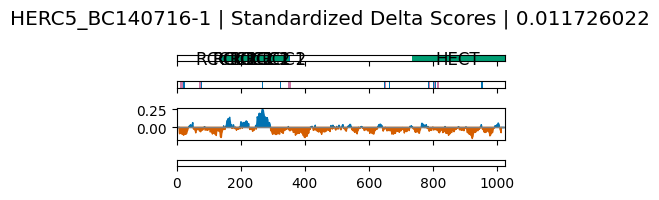

BMS1_BC043345-1 BMS1_BC043345-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BMS1_BC043345-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GTP_EFTU: 123-212
MMR_HSR1: 85-135
AARP2CN: 231-316
RIBIOP_C: 817-1105
Low complexity coordinates: 11-17, 19-21, 24-30, 76-77, 79-82, 84-86, 144-145, 192-195, 197-198, 343-344, 346-350, 436-469, 496-504, 506-545, 547-547, 586-588, 590-608, 610-610, 643-652, 655-655, 700-708, 768-768, 770-771, 773-776, 807-828, 830-831, 1017-1021, 1175-1178, 1180-1180, 1186-1186
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


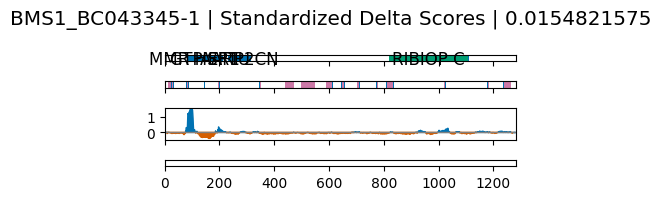

SEC61B_BC001734-1 SEC61B_BC001734-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SEC61B_BC001734-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Sec61_beta: 53-91
Low complexity coordinates: 10-13, 15-24, 41-47
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


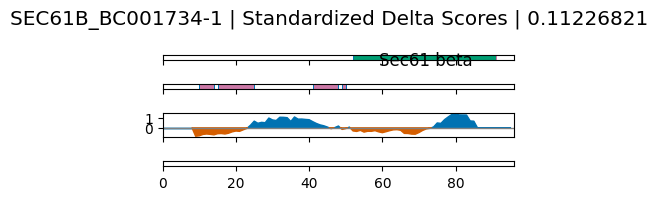

APOBEC3H_BC069023-1 APOBEC3H_BC069023-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/APOBEC3H_BC069023-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
APOBEC3: 23-154
Low complexity coordinates: 18-19, 23-23
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


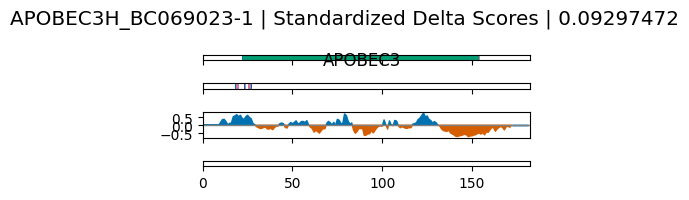

CCDC137_BC009369-2 CCDC137_BC009369-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CCDC137_BC009369-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 10-33, 77-77, 92-93, 152-186, 229-230, 250-250
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


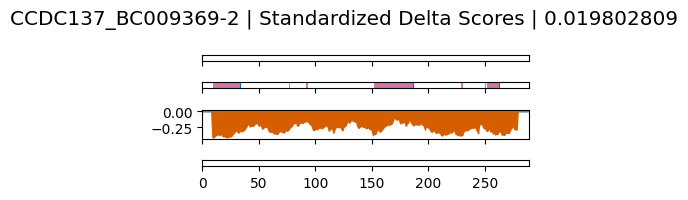

ADK_BC003568-1 ADK_BC003568-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ADK_BC003568-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PfkB: 29-339
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


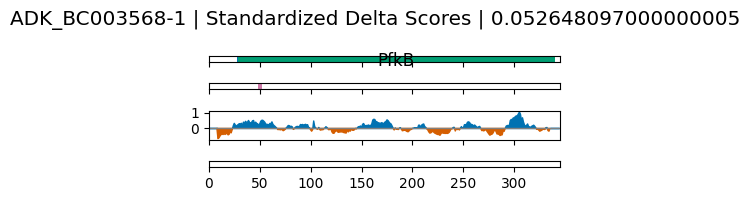

WDR6_BC002826-2 WDR6_BC002826-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/WDR6_BC002826-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 138-178
Choline_sulf_C: 93-119
Low complexity coordinates: 
sig peak regions (p<0.05): 94-132, 220-252
sig peak regions (p<0.001): 102-130


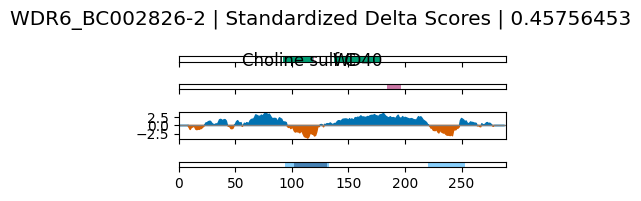

APOBEC3D_BC017022-1 APOBEC3D_BC017022-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/APOBEC3D_BC017022-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NAD2: 10-201
NAD2: 207-385
Low complexity coordinates: 
sig peak regions (p<0.05): 0-25, 136-173
sig peak regions (p<0.001): 


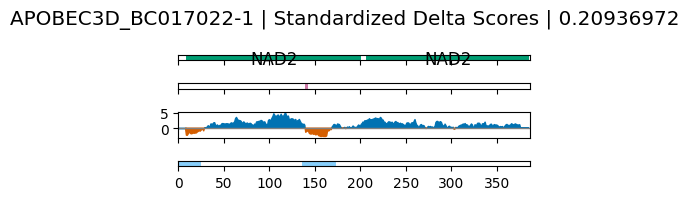

SNRNP35_BC009622-1 SNRNP35_BC009622-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNRNP35_BC009622-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 58-127
Low complexity coordinates: 140-148, 150-157, 184-209, 211-212, 224-224, 227-229
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


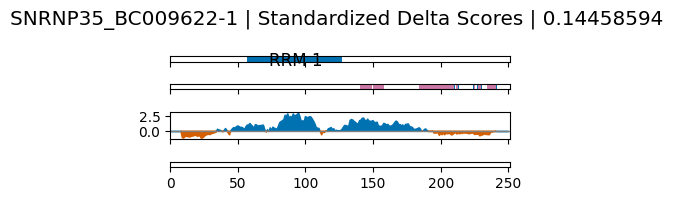

HNRNPD_BC002401-1 HNRNPD_BC002401-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HNRNPD_BC002401-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NID: 227-265
CBFNT: 1-78
RRM_1: 100-167
RRM_1: 184-243
Low complexity coordinates: 10-69, 71-72, 268-283, 285-286, 288-336
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


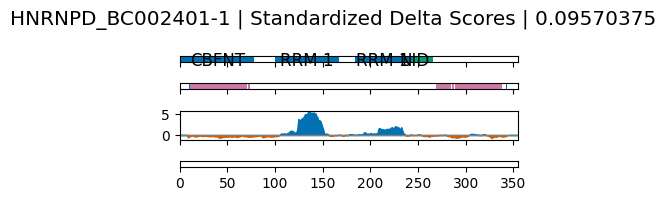

DAZAP1_BC012062-1 DAZAP1_BC012062-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DAZAP1_BC012062-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 12-69
RRM_1: 115-183
Low complexity coordinates: 220-231, 234-335
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


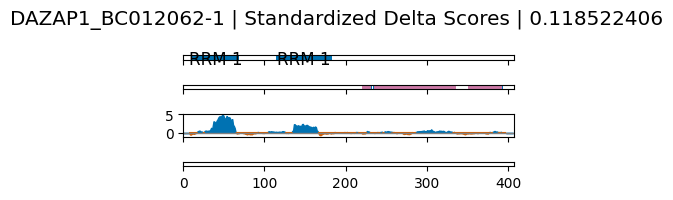

G3BP1_BC006997-1 G3BP1_BC006997-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/G3BP1_BC006997-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NTF2: 11-133
RRM_1: 342-396
Low complexity coordinates: 142-161, 187-215, 218-218, 229-229, 268-269, 280-280, 283-317, 319-322
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


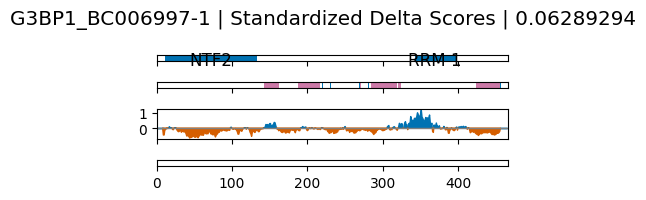

U2AF2_BC008740-2 U2AF2_BC008740-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/U2AF2_BC008740-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Transformer: 15-106
RRM_1: 185-224
RRM_1: 261-330
RRM_1: 396-455
Low complexity coordinates: 12-12, 14-18, 20-59, 61-61, 120-120, 125-132, 243-246, 379-379
sig peak regions (p<0.05): 109-128
sig peak regions (p<0.001): 


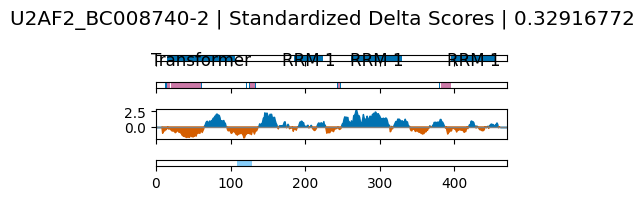

RRP8_BC001071-2 RRP8_BC001071-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RRP8_BC001071-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Methyltransf_8: 238-456
Low complexity coordinates: 16-20, 36-36, 42-44, 46-49, 59-60, 65-77, 79-89, 91-93, 96-100, 168-173, 175-176, 190-199, 210-215, 238-244
sig peak regions (p<0.05): 295-335
sig peak regions (p<0.001): 


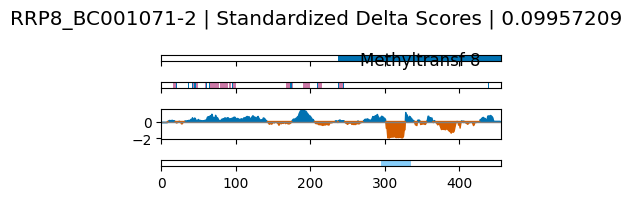

PSPC1_BC014184-2 PSPC1_BC014184-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PSPC1_BC014184-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 158-216
RRM_1: 84-148
NOPS: 229-280
Low complexity coordinates: 24-55, 191-191, 194-194, 201-201, 303-311
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


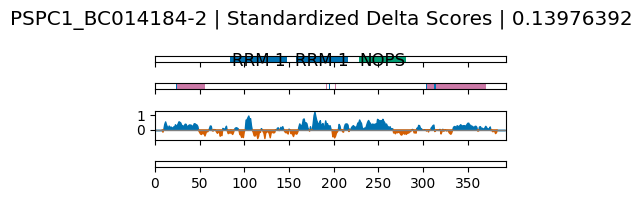

FAM46A_BC000683-2 FAM46A_BC000683-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FAM46A_BC000683-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NTP_transf_7: 66-384
Low complexity coordinates: 24-48
sig peak regions (p<0.05): 373-410
sig peak regions (p<0.001): 


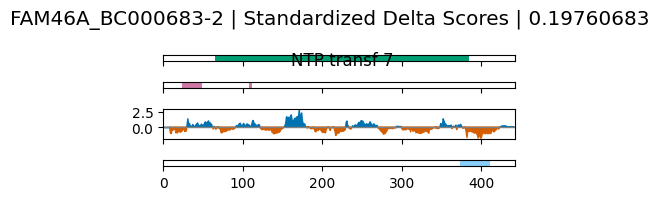

HNRNPF_BC004254-1 HNRNPF_BC004254-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HNRNPF_BC004254-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 293-355
RRM_1: 114-181
zf-RNPHF: 255-290
Low complexity coordinates: 241-250, 255-255, 333-333, 372-372, 374-377, 379-380, 396-399
sig peak regions (p<0.05): 275-295, 386-414
sig peak regions (p<0.001): 


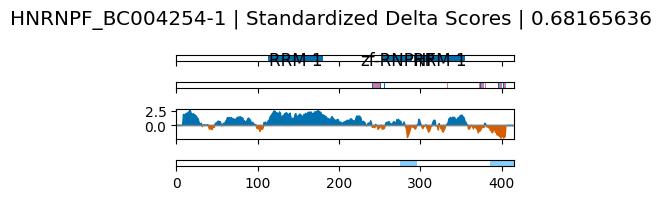

RBFOX1_BC113691-1 RBFOX1_BC113691-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBFOX1_BC113691-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Fox-1_C: 273-363
RRM_1: 140-206
Low complexity coordinates: 15-17, 27-28, 38-38, 40-44, 59-61, 66-71, 102-120, 275-291, 312-317, 337-344
sig peak regions (p<0.05): 116-152, 183-210
sig peak regions (p<0.001): 


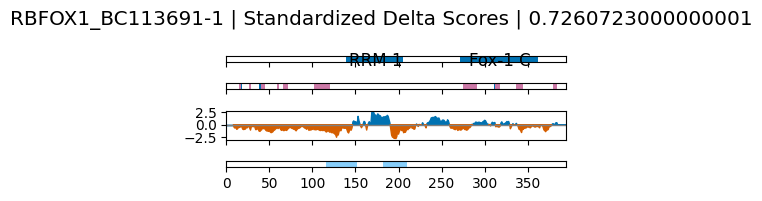

DARS_BC000629-2 DARS_BC000629-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DARS_BC000629-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
tRNA_anti-codon: 60-145
tRNA-synt_2: 175-495
Low complexity coordinates: 
sig peak regions (p<0.05): 423-467
sig peak regions (p<0.001): 446-465


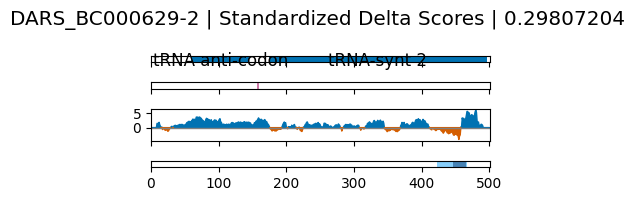

LARP6_BC006082-1_BC009446-1_BC014018-2 LARP6_BC006082-1_BC009446-1_BC014018-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LARP6_BC006082-1_BC009446-1_BC014018-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SUZ-C: 468-482
La: 97-153
Low complexity coordinates: 23-39, 60-68, 84-84, 88-88, 190-190, 264-266, 268-268, 291-291, 294-294, 301-303, 338-343
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


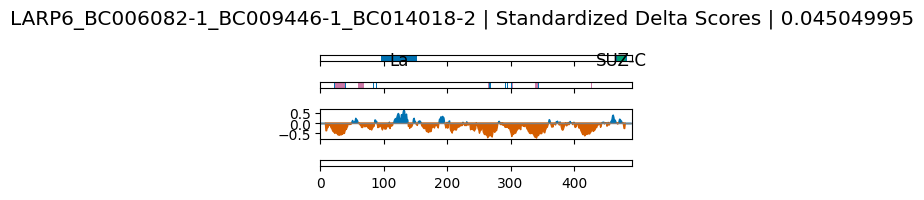

SF1_BC008080-2_BC020217-1 SF1_BC008080-2_BC020217-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SF1_BC008080-2_BC020217-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC: 278-293
SF1-HH: 18-130
KH_1: 151-222
Low complexity coordinates: 80-80, 97-104, 327-358, 360-363, 378-404, 406-444, 468-525, 527-527, 531-531
sig peak regions (p<0.05): 113-137, 230-249, 319-350, 357-379
sig peak regions (p<0.001): 


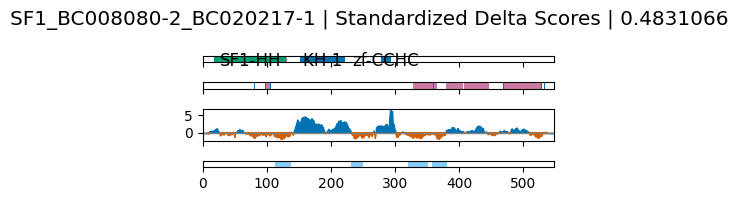

RBM45_BC066549-1 RBM45_BC066549-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM45_BC066549-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 257-309
RRM_1: 127-183
RRM_1: 34-92
RRM_1: 404-455
Low complexity coordinates: 353-354
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


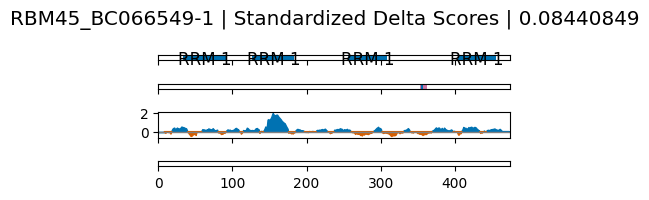

UBAP2L_BC003170-1 UBAP2L_BC003170-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/UBAP2L_BC003170-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
UBA_4: 51-84
UBAP2-Lig: 495-526
Low complexity coordinates: 22-26, 108-112, 118-118, 123-146, 148-148, 163-191, 238-238, 240-241, 308-308, 365-380, 384-392, 443-473, 476-492, 534-534, 536-575, 578-578, 599-601, 629-634, 640-641, 643-643, 654-654, 656-659, 665-665, 668-674, 688-718, 721-779, 787-805, 877-894, 905-905, 907-913, 915-915, 917-917, 964-969, 973-978, 1006-1007, 1009-1015, 1017-1021, 1027-1027, 1040-1050, 1052-1057, 1059-1066
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


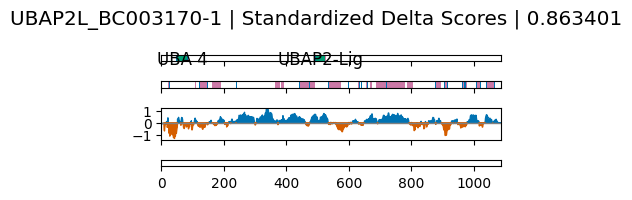

TRIM56_BC048194-1 TRIM56_BC048194-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TRIM56_BC048194-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-B_box: 114-147
zf-RING_UBOX: 21-57
zf-B_box: 166-205
Low complexity coordinates: 59-61, 91-92, 97-98, 105-109, 121-129, 189-189, 192-197, 202-203, 209-214, 222-226, 228-258, 261-268, 270-316, 318-318, 322-326, 335-335, 338-350, 355-357, 378-383, 385-388, 394-396, 414-414, 421-421, 423-427, 429-431, 454-458, 461-462, 465-465, 480-480, 557-563, 588-588, 593-593, 595-600
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


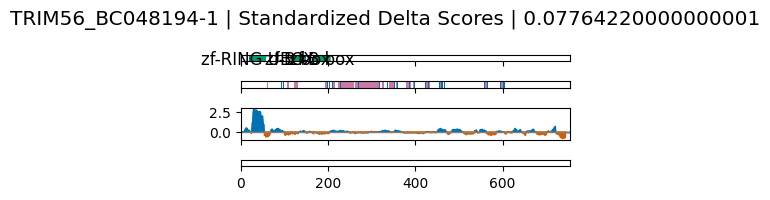

PRPF4B_BC034969 PRPF4B_BC034969
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRPF4B_BC034969_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pkinase: 689-1003
Low complexity coordinates: 23-23, 25-25, 27-28, 39-80, 103-114, 138-143, 148-148, 150-150, 184-196, 204-238, 263-284, 291-324, 326-377, 382-421, 431-433, 435-500, 509-509, 521-540, 566-576, 709-712, 736-736, 754-754
sig peak regions (p<0.05): 794-837, 853-898
sig peak regions (p<0.001): 798-836, 855-888


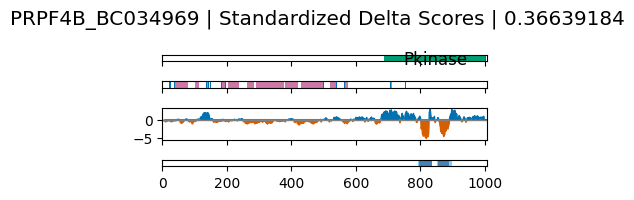

CRKRS_NM_016507 CRKRS_NM_016507
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CRKRS_NM_016507_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pkinase: 729-1020
Low complexity coordinates: 15-24, 27-27, 33-42, 44-45, 81-83, 97-103, 105-117, 131-135, 138-147, 171-195, 200-200, 211-212, 215-215, 217-217, 220-230, 234-240, 242-243, 254-255, 257-261, 265-265, 272-272, 277-277, 281-386, 398-414, 512-591, 593-610, 622-642, 648-648, 664-665, 668-683, 691-692, 695-698, 702-703, 1053-1053, 1056-1056, 1062-1073, 1078-1081, 1086-1088, 1092-1092, 1113-1120, 1127-1129, 1155-1161, 1167-1167, 1182-1183, 1190-1193, 1246-1246, 1257-1285, 1294-1302, 1307-1314, 1316-1316, 1383-1386, 1449-1458
sig peak regions (p<0.05): 743-763, 901-939
sig peak regions (p<0.001): 909-929


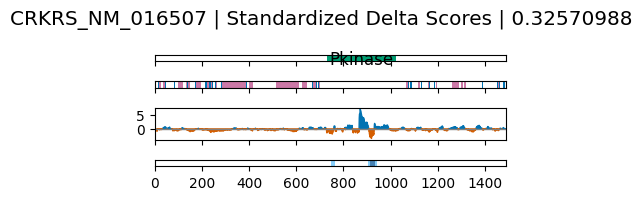

TCOF1_nan TCOF1_nan
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TCOF1_nan_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 82-100, 127-128, 169-170, 183-183, 185-186, 189-189, 196-209, 221-235, 243-250, 261-284, 308-326, 334-354, 358-358, 362-368, 370-371, 378-397, 406-425, 428-461, 471-486, 515-530, 542-558, 585-595, 606-627, 629-641, 644-644, 646-646, 648-648, 650-650, 661-661, 665-666, 670-680, 685-685, 691-702, 714-727, 738-745, 758-777, 780-801, 803-806, 808-810, 816-821, 824-826, 846-854, 862-880, 905-926
sig peak regions (p<0.05): 117-139, 226-251, 301-335, 491-512, 519-544, 645-690, 736-763, 827-865, 912-933
sig peak regions (p<0.001): 


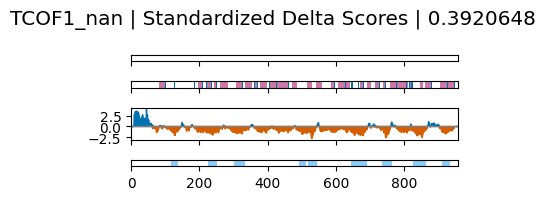

SFRS10_BC000160 SFRS10_BC000160
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SFRS10_BC000160_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 122-190
Low complexity coordinates: 10-30, 35-102, 207-208, 211-211, 213-253, 260-260
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


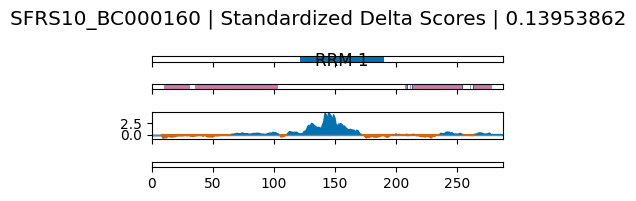

SF3A2_BC004434 SF3A2_BC004434
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SF3A2_BC004434_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SF3A2: 112-206
zf-met: 54-78
Low complexity coordinates: 17-18, 20-21, 25-26, 85-85, 87-102, 107-110
sig peak regions (p<0.05): 0-97
sig peak regions (p<0.001): 35-95


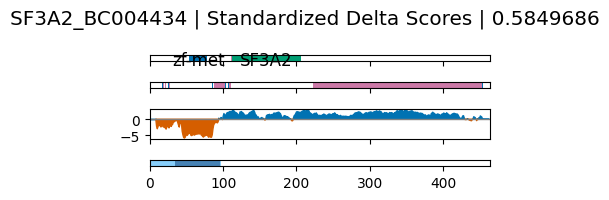

ADAR_BC038227 ADAR_BC038227
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ADAR_BC038227_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
dsrm: 615-679
z-alpha: 295-358
z-alpha: 135-200
dsrm: 727-792
dsrm: 504-567
A_deamin: 886-1215
Low complexity coordinates: 27-27, 32-32, 67-75, 107-112, 156-156, 230-233, 271-272, 278-279, 281-281, 564-566, 579-604, 607-608, 659-659, 667-670, 673-674, 1169-1172
sig peak regions (p<0.05): 0-31, 127-226, 233-281, 303-342, 379-420, 433-476, 501-531, 543-568, 577-600, 621-640, 653-705, 714-759, 891-912, 967-992, 1001-1029, 1121-1140, 1141-1160
sig peak regions (p<0.001): 0-30, 128-204, 386-415, 510-529, 715-758


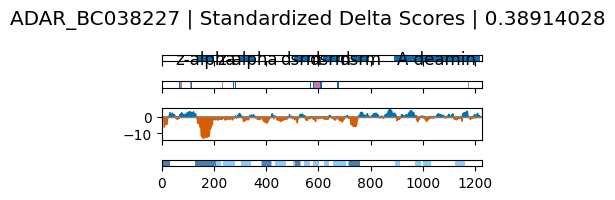

DDX5_BC016027 DDX5_BC016027
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX5_BC016027_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
P68HR: 551-583
DEAD: 118-288
Helicase_C: 328-435
P68HR: 498-532
Low complexity coordinates: 10-27, 36-36, 332-333, 482-495, 500-500, 541-542, 568-569, 591-592
sig peak regions (p<0.05): 230-268, 397-423
sig peak regions (p<0.001): 236-267


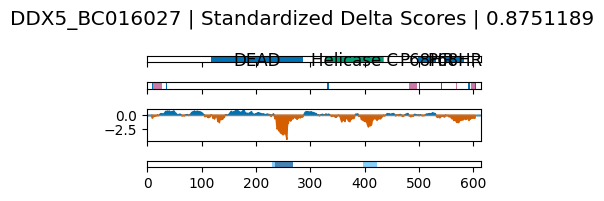

SKIV2L_BC015758 SKIV2L_BC015758
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SKIV2L_BC015758_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Ski2_N: 79-199
MTR4_beta-barrel: 832-1046
DSHCT: 1073-1240
DEAD: 314-460
MTR4-like_stalk: 763-829
Helicase_C: 629-708
Low complexity coordinates: 10-16, 37-38, 40-44, 56-56, 60-60, 129-129, 133-135, 169-169, 174-174, 196-196, 207-219, 223-226, 228-230, 251-252, 257-257, 260-260, 263-263, 270-275, 593-593, 965-967, 1032-1034, 1041-1041, 1043-1043, 1047-1047, 1052-1052
sig peak regions (p<0.05): 405-442, 634-687
sig peak regions (p<0.001): 644-683


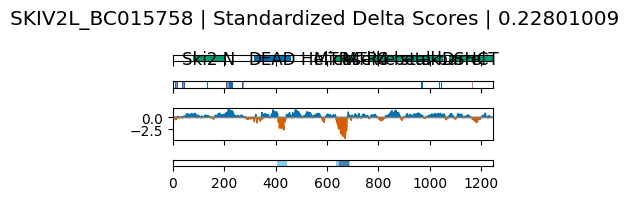

DDX56_BC001235 DDX56_BC001235
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX56_BC001235_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Helicase_C: 244-380
DEAD: 32-206
Low complexity coordinates: 49-49, 118-120, 151-156, 158-163, 165-173, 176-176, 251-255, 326-337, 448-452, 477-478, 480-480, 482-483, 485-490, 496-497, 505-505
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


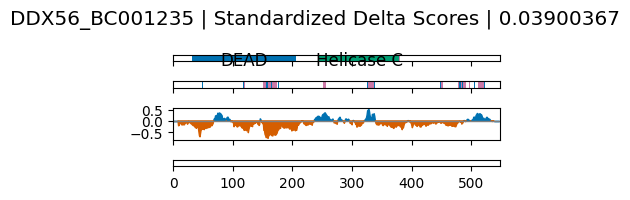

METTL3_BC052244 METTL3_BC052244
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/METTL3_BC052244_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DUF445: 117-272
MT-A70: 389-550
Low complexity coordinates: 18-26, 52-54, 56-63, 79-87, 91-91, 95-95, 164-164, 166-167, 191-202, 207-211
sig peak regions (p<0.05): 0-20, 45-72, 192-228, 327-350, 370-415, 452-475, 487-541, 544-579
sig peak regions (p<0.001): 370-415, 488-540, 549-573


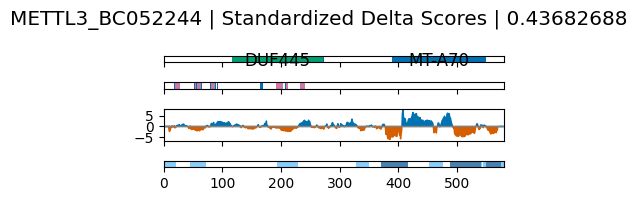

FIP1L1_AL136910 FIP1L1_AL136910
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FIP1L1_AL136910_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Fip1: 139-181
Low complexity coordinates: 11-31, 37-37, 39-39, 41-41, 45-46, 65-81, 112-113, 116-117, 215-217, 221-222, 285-331, 382-414
sig peak regions (p<0.05): 38-61, 85-111, 115-134, 151-224, 302-391, 425-444, 465-490
sig peak regions (p<0.001): 359-378


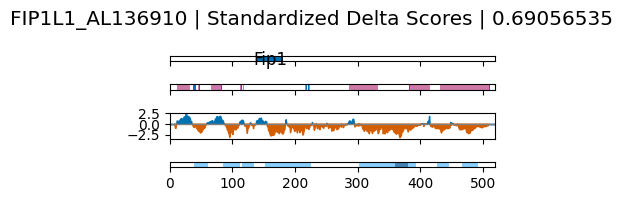

CPSF1_BC017232 CPSF1_BC017232
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CPSF1_BC017232_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MMS1_N: 92-670
CPSF_A: 1073-1408
Low complexity coordinates: 78-78, 95-95, 292-292, 389-389, 407-407, 410-415, 553-554, 719-729, 734-734, 764-771, 833-834, 900-902, 909-929, 1029-1031
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


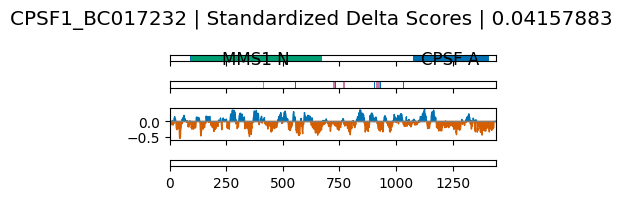

CSTF1_BC001011 CSTF1_BC001011
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CSTF1_BC001011_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 393-424
ANAPC4_WD40: 212-271
WD40: 260-290
WD40: 166-201
WD40: 295-333
CSTF1_dimer: 8-60
Low complexity coordinates: 17-17
sig peak regions (p<0.05): 72-101, 155-177, 281-300, 378-430
sig peak regions (p<0.001): 399-428


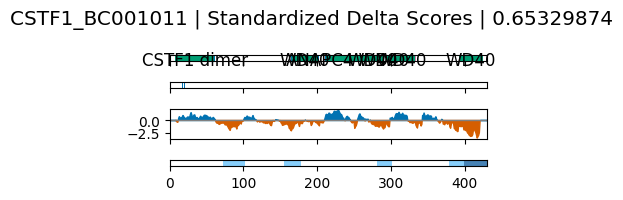

CPSF3_BC011654 CPSF3_BC011654
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CPSF3_BC011654_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RMMBL: 382-439
Beta-Casp: 246-367
CPSF73-100_C: 479-682
Lactamase_B: 24-191
Low complexity coordinates: 56-60, 64-65, 242-242, 656-660
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


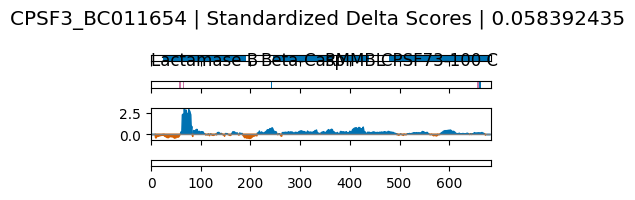

SYMPK_BC006567 SYMPK_BC006567
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SYMPK_BC006567_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Symplekin_C: 755-936
SYMPK_PTA1_N: 1-214
Low complexity coordinates: 166-169, 171-172, 213-220, 233-240, 338-347, 349-351, 382-382, 390-390, 490-490, 775-778, 855-857, 974-977, 979-1003, 1013-1023, 1030-1054, 1056-1056, 1082-1085, 1090-1090, 1092-1093, 1095-1095
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


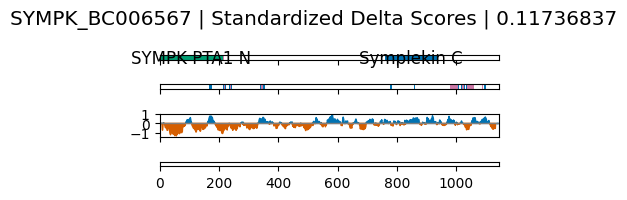

THOC6_nan THOC6_nan
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/THOC6_nan_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 48-48, 55-61, 132-133, 293-295
sig peak regions (p<0.05): 147-214
sig peak regions (p<0.001): 


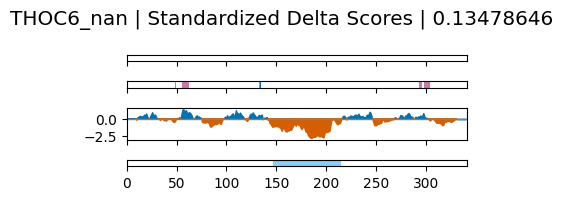

THOC4_BC052302-1 THOC4_BC052302-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/THOC4_BC052302-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 115-183
FoP_duplication: 204-260
Low complexity coordinates: 10-11, 24-78, 106-107
sig peak regions (p<0.05): 0-23, 236-263
sig peak regions (p<0.001): 


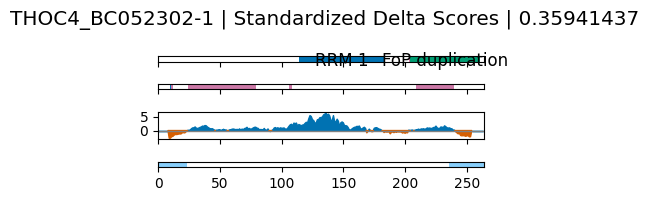

CNOT2_BC011826 CNOT2_BC011826
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CNOT2_BC011826_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NOT2_3_5_C: 397-521
Low complexity coordinates: 68-75, 112-120, 155-167, 174-174, 198-200, 292-308, 311-317, 384-385, 445-445
sig peak regions (p<0.05): 0-21, 117-171, 214-234, 309-331, 334-356, 399-421, 471-521
sig peak regions (p<0.001): 335-355, 477-520


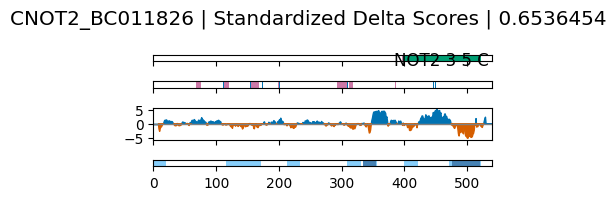

THOC1_BC010381 THOC1_BC010381
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/THOC1_BC010381_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Death: 572-651
efThoc1: 71-538
Low complexity coordinates: 11-11, 67-69, 184-187, 208-216, 472-473, 538-541, 546-553
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


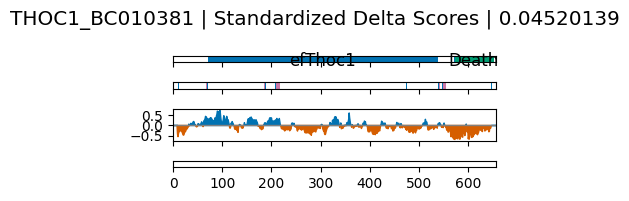

TOB2_BC038957 TOB2_BC038957
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TOB2_BC038957_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PAM2: 129-144
PAM2: 249-264
BTG: 1-113
Low complexity coordinates: 28-28, 31-31, 38-41, 147-167, 169-175, 179-179, 182-215, 228-231, 233-233
sig peak regions (p<0.05): 53-99
sig peak regions (p<0.001): 62-89


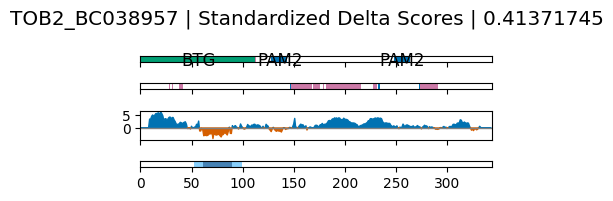

NAP1L3_BC034954 NAP1L3_BC034954
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NAP1L3_BC034954_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NAP: 106-210
NAP: 217-487
Low complexity coordinates: 22-82, 159-170, 172-176, 183-185, 187-230, 233-233, 252-262, 264-269, 272-273, 275-278, 414-414, 421-422
sig peak regions (p<0.05): 24-80, 88-152, 334-377, 380-424
sig peak regions (p<0.001): 37-74, 339-371, 391-413


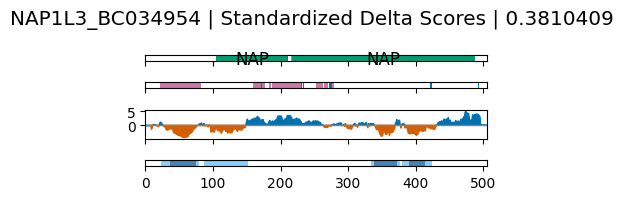

FUBP1_BC017247 FUBP1_BC017247
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FUBP1_BC017247_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DUF1897: 575-594
KH_1: 187-252
KH_1: 379-444
KH_1: 279-339
KH_1: 101-164
DUF1897: 603-621
Low complexity coordinates: 10-29, 38-39, 118-125, 280-280, 349-368, 390-396, 399-399, 450-514, 526-530, 533-533, 538-569, 597-597, 601-604, 606-606, 614-621, 624-624
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


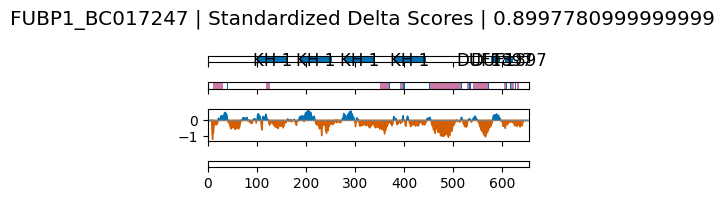

ZFP36L2_BC005010 ZFP36L2_BC005010
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZFP36L2_BC005010_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH: 154-179
Tis11B_N: 1-140
zf-CCCH: 192-217
Low complexity coordinates: 24-24, 48-48, 50-50, 58-58, 62-66, 70-72, 74-91, 97-102, 135-141, 230-230, 259-274, 278-342, 345-361, 386-386
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


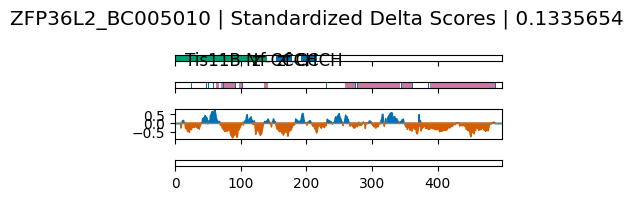

BTG1_BC016759 BTG1_BC016759
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BTG1_BC016759_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
BTG: 11-125
Low complexity coordinates: 34-37
sig peak regions (p<0.05): 65-96, 113-136
sig peak regions (p<0.001): 


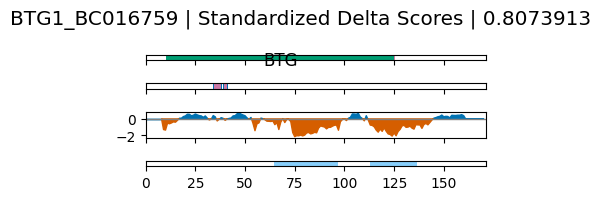

BTG4_BC031045 BTG4_BC031045
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BTG4_BC031045_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
BTG: 1-112
Low complexity coordinates: 140-144, 147-147
sig peak regions (p<0.05): 13-47, 77-110, 121-159
sig peak regions (p<0.001): 14-36, 137-156


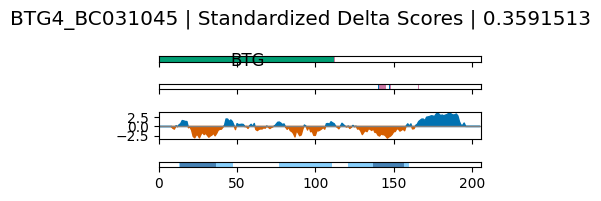

CUGBP1_BC031079 CUGBP1_BC031079
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CUGBP1_BC031079_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 400-470
RRM_1: 110-174
RRM_1: 19-84
Low complexity coordinates: 160-160, 162-163, 193-203, 206-208, 223-227, 229-229, 232-232, 234-237, 243-244, 252-308, 317-348, 364-364
sig peak regions (p<0.05): 232-260, 342-361
sig peak regions (p<0.001): 


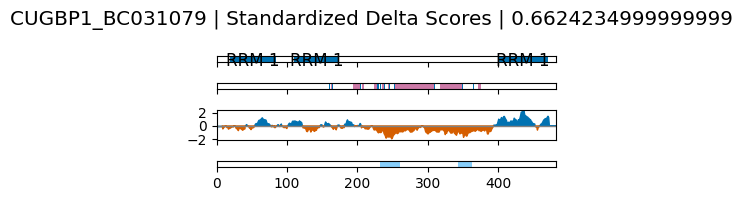

BTG2_BC105949 BTG2_BC105949
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BTG2_BC105949_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
BTG: 9-123
Low complexity coordinates: 
sig peak regions (p<0.05): 0-20, 63-132
sig peak regions (p<0.001): 68-89, 98-126


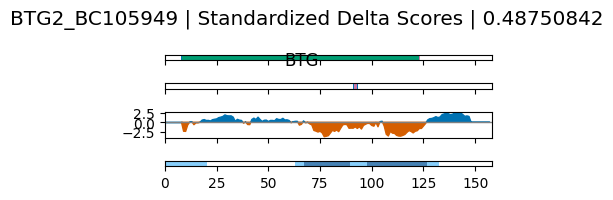

ZCCHC6_AL832026 ZCCHC6_AL832026
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ZCCHC6_AL832026_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC: 1109-1124
TUTF7_u4: 1126-1213
PAP_assoc: 996-1049
zf-CCHC: 1215-1231
PAP_assoc: 428-478
TUTase: 274-363
Low complexity coordinates: 21-21, 44-45, 180-185, 215-215, 262-274, 277-282, 689-693, 697-697, 719-739, 761-776, 802-802, 804-806, 1154-1154
sig peak regions (p<0.05): 227-281
sig peak regions (p<0.001): 227-260


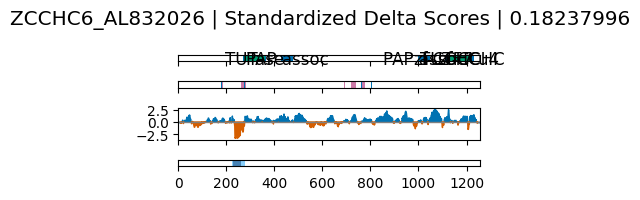

TARDBP_BC095435 TARDBP_BC095435
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TARDBP_BC095435_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TDP43_N: 4-76
TDP-43_C: 262-371
RRM_1: 106-164
RRM_1: 193-241
Low complexity coordinates: 12-12, 274-322, 326-355, 357-357, 359-362
sig peak regions (p<0.05): 194-227
sig peak regions (p<0.001): 


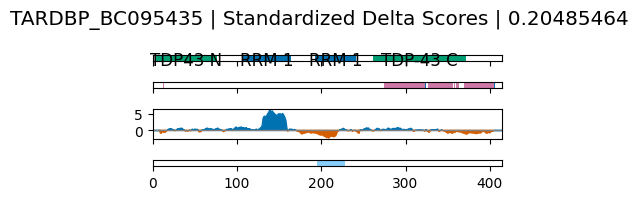

HSPB1_BC073768_BC000510 HSPB1_BC073768_BC000510
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HSPB1_BC073768_BC000510_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HSP20: 88-184
Low complexity coordinates: 61-71, 74-75
sig peak regions (p<0.05): 12-49
sig peak regions (p<0.001): 


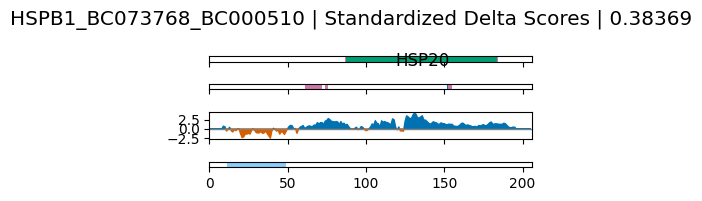

MATR3_BC015031 MATR3_BC015031
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MATR3_BC015031_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 501-552
RRM_5: 394-475
Low complexity coordinates: 11-11, 13-13, 16-21, 25-25, 29-32, 54-54, 60-80, 176-176, 181-181, 210-212, 214-227, 229-229, 357-363, 365-377, 481-482, 580-580, 591-591, 594-638, 650-674, 680-680, 693-715, 717-722, 727-731, 734-736, 739-741, 745-746
sig peak regions (p<0.05): 1-20, 30-85, 200-221, 274-354, 530-555, 768-805
sig peak regions (p<0.001): 274-346


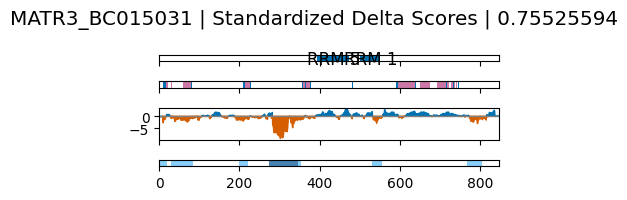

YWHAE_BC000179_BC001440 YWHAE_BC000179_BC001440
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/YWHAE_BC000179_BC001440_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
14-3-3: 11-232
Low complexity coordinates: 
sig peak regions (p<0.05): 181-208
sig peak regions (p<0.001): 183-202


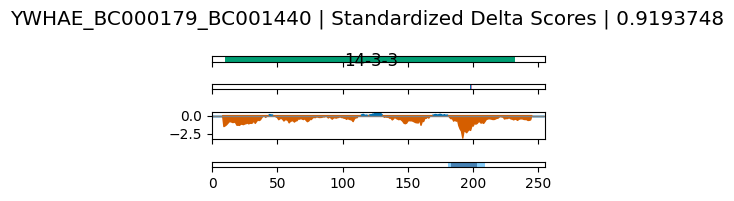

RBM8A_GQ129283 RBM8A_GQ129283
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM8A_GQ129283_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 75-144
Low complexity coordinates: 10-12, 34-42
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


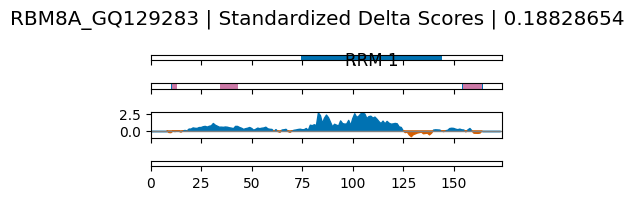

RBM22_AL136933 RBM22_AL136933
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM22_AL136933_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
STL11_N: 21-107
RRM_1: 234-298
zf_CCCH_4: 165-183
Low complexity coordinates: 75-75, 236-237, 267-275, 329-348
sig peak regions (p<0.05): 0-93, 387-415
sig peak regions (p<0.001): 26-46


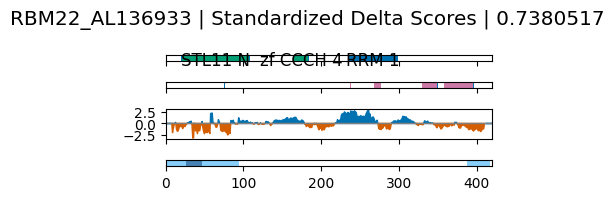

EXOSC2_BC000747 EXOSC2_BC000747
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EXOSC2_BC000747_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_6: 169-209
ECR1_N: 26-63
RRP4_S1: 75-146
Low complexity coordinates: 110-113
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


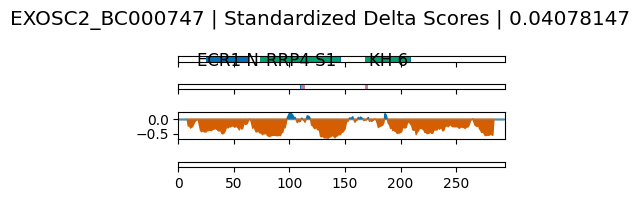

EXOSC10_BC073788-1 EXOSC10_BC073788-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EXOSC10_BC073788-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DNA_pol_A_exo1: 289-455
PMC2NT: 44-133
HRDC: 506-572
Low complexity coordinates: 41-41, 120-120, 218-218, 220-220, 227-229, 303-303, 589-589, 732-761, 786-787, 795-806, 808-813, 830-830
sig peak regions (p<0.05): 1-36, 45-107, 113-148, 393-412, 420-465, 474-493, 608-645, 650-684, 774-793, 805-824
sig peak regions (p<0.001): 122-141, 661-681


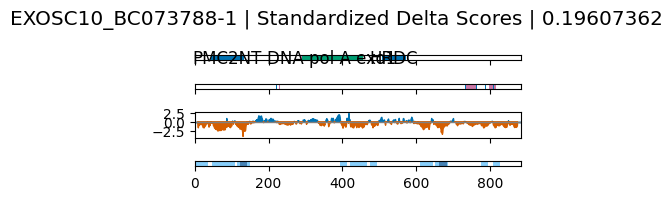

RBM38_BC018711 RBM38_BC018711
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM38_BC018711_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 13-70
Low complexity coordinates: 127-146, 149-169, 171-171, 173-173, 175-180, 183-196
sig peak regions (p<0.05): 28-47, 135-170
sig peak regions (p<0.001): 


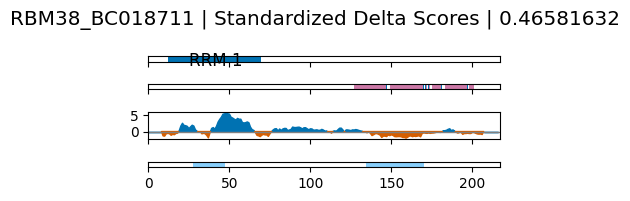

SFRS2IP_NM_004719 SFRS2IP_NM_004719
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SFRS2IP_NM_004719_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-RING_2: 40-82
Low complexity coordinates: 185-187, 193-197, 266-266, 301-302, 310-330, 350-351, 353-353, 377-392, 394-396, 401-407, 409-409, 493-494, 571-572, 577-585, 607-610, 661-689, 782-783, 785-789, 791-794, 811-811, 816-828, 833-843, 848-859, 864-887, 901-950, 952-952, 958-958, 990-991, 1047-1047, 1049-1080, 1103-1103, 1111-1113, 1116-1116, 1118-1123, 1178-1178, 1192-1192, 1205-1220, 1247-1247, 1259-1259, 1269-1289, 1314-1315, 1329-1329, 1331-1336, 1338-1367, 1374-1375
sig peak regions (p<0.05): 10-62, 958-991, 1206-1232
sig peak regions (p<0.001): 31-61


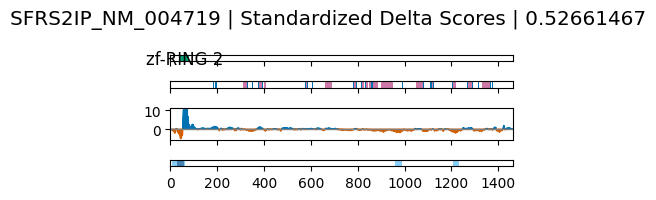

PRPF3_BC00184-2_BC001954-1 PRPF3_BC00184-2_BC001954-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRPF3_BC00184-2_BC001954-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PWI: 9-77
PRP3: 308-521
Prp3_C: 544-673
Low complexity coordinates: 76-85, 88-89, 99-99, 108-127, 165-173, 206-214, 230-231, 348-349, 443-444, 447-457, 505-508, 511-511, 514-515, 518-518, 521-526, 573-582
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


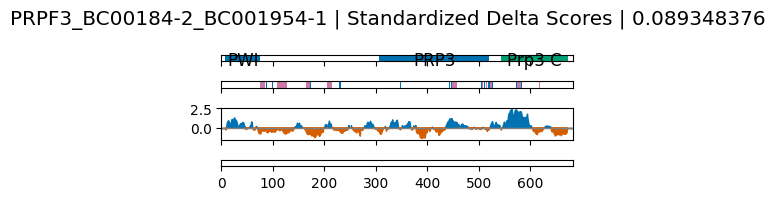

RSRC1_HQ448170 RSRC1_HQ448170
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RSRC1_HQ448170_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 10-157, 183-214, 217-220, 245-245, 248-251, 255-258
sig peak regions (p<0.05): 116-137, 192-211, 250-303
sig peak regions (p<0.001): 265-288


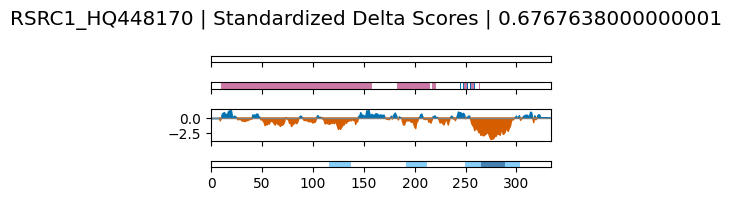

CLK1_BC031549-1 CLK1_BC031549-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CLK1_BC031549-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pkinase: 161-477
Low complexity coordinates: 19-35
sig peak regions (p<0.05): 267-309, 342-377
sig peak regions (p<0.001): 269-307


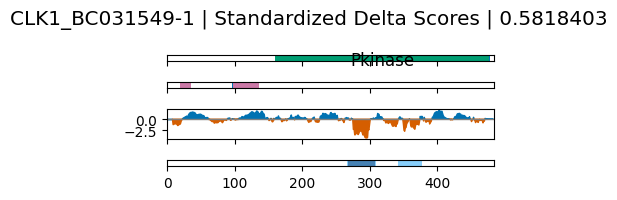

CLK2_BC014067-2 CLK2_BC014067-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CLK2_BC014067-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Pkinase: 162-478
Low complexity coordinates: 10-93, 99-138
sig peak regions (p<0.05): 254-310, 333-374, 381-400, 456-476
sig peak regions (p<0.001): 274-306, 343-368


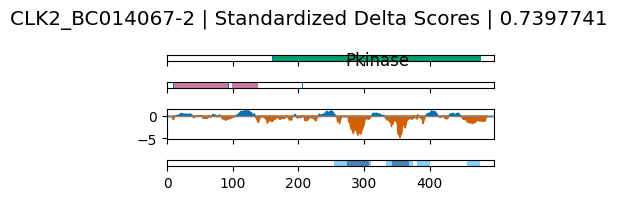

RY1_BC017890-1 RY1_BC017890-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RY1_BC017890-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SNRNP27: 98-153
Low complexity coordinates: 
sig peak regions (p<0.05): 80-107
sig peak regions (p<0.001): 


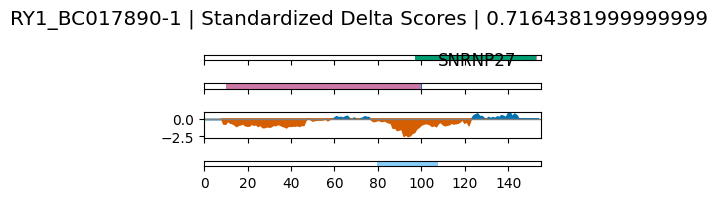

LUC7L_HQ448098 LUC7L_HQ448098
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/LUC7L_HQ448098_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LUC7: 6-226
Low complexity coordinates: 96-97, 100-101, 104-105, 113-113, 119-121, 143-150, 189-190, 221-328
sig peak regions (p<0.05): 0-20, 172-191, 238-308
sig peak regions (p<0.001): 243-272, 274-296


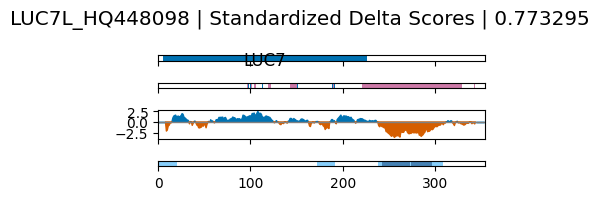

PLRG1_BC020786-1 PLRG1_BC020786-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PLRG1_BC020786-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 354-389
WD40: 453-480
WD40: 185-223
WD40: 227-265
WD40: 395-431
WD40: 270-307
WD40: 313-349
Low complexity coordinates: 176-176
sig peak regions (p<0.05): 127-163, 196-235, 239-276, 300-352, 383-404, 408-441
sig peak regions (p<0.001): 197-226, 413-432


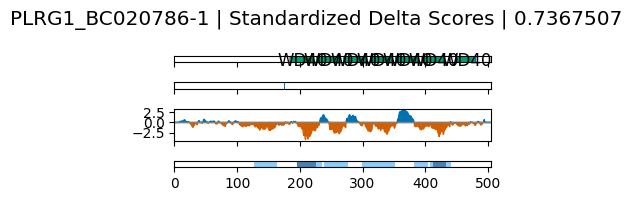

CDC40_HQ258473 CDC40_HQ258473
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CDC40_HQ258473_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 499-536
WD40: 542-579
WD40: 409-445
WD40: 323-360
WD40: 279-316
Low complexity coordinates: 10-27, 39-40, 49-56, 172-172, 207-207, 219-222, 226-231
sig peak regions (p<0.05): 300-335, 395-422, 428-464
sig peak regions (p<0.001): 


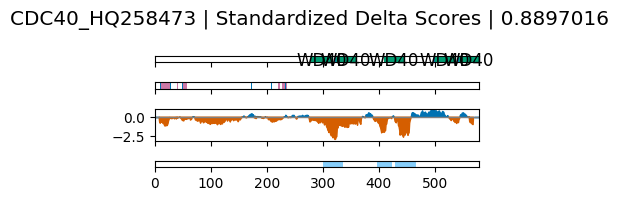

RBMX2_BC125126-1 RBMX2_BC125126-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBMX2_BC125126-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TPR_16: 422-483
TPR_14: 57-98
Low complexity coordinates: 22-24, 241-241, 244-250, 274-276, 420-420, 426-428, 578-581
sig peak regions (p<0.05): 0-20, 90-109, 231-271, 405-429, 538-564, 605-626
sig peak regions (p<0.001): 


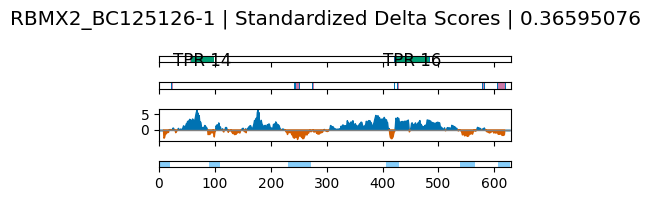

PRPF40A_BC027178-1 PRPF40A_BC027178-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRPF40A_BC027178-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FF: 4-54
Low complexity coordinates: 64-170, 172-172, 174-175, 179-182, 187-188, 190-191
sig peak regions (p<0.05): 27-46, 77-129, 134-177, 180-203
sig peak regions (p<0.001): 141-172


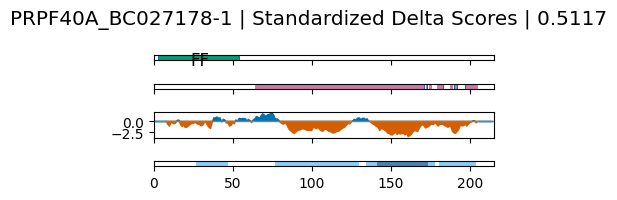

SNW1_BC108903-1 SNW1_BC108903-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SNW1_BC108903-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SKIP_SNW: 175-335
Low complexity coordinates: 20-23, 26-30, 32-34, 157-157, 163-164, 215-215, 217-218, 225-226, 228-228, 302-326, 349-360
sig peak regions (p<0.05): 8-47, 56-75, 150-192, 215-249, 269-319, 340-439, 502-530
sig peak regions (p<0.001): 8-27, 274-310, 397-416


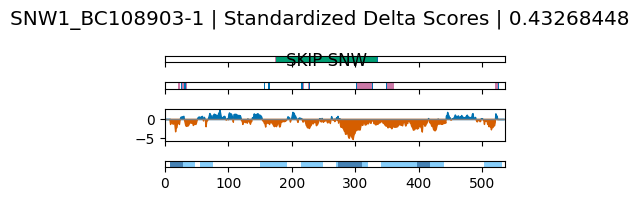

DDX21_BC008071-2 DDX21_BC008071-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX21_BC008071-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GUCT: 620-715
DEAD: 211-381
Helicase_C: 434-532
Low complexity coordinates: 23-45, 48-56, 65-65, 67-74, 78-83, 96-115, 119-121, 124-132, 135-142, 163-176, 336-336, 603-613
sig peak regions (p<0.05): 317-358
sig peak regions (p<0.001): 


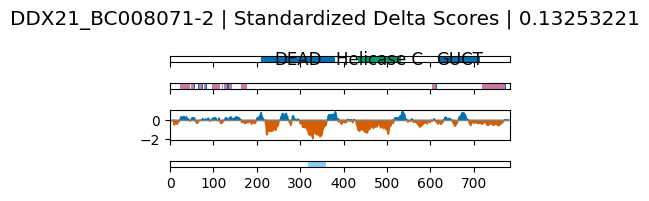

CCNL2_BC016333-1 CCNL2_BC016333-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CCNL2_BC016333-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Cyclin_N: 73-191
Low complexity coordinates: 10-30, 33-33, 157-159
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


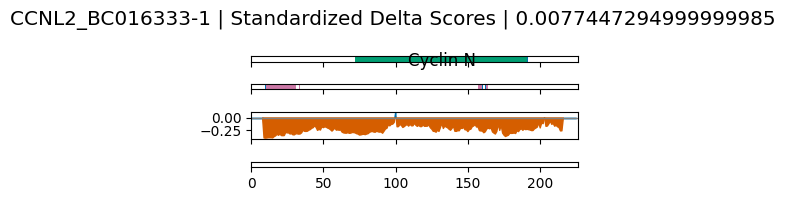

CIR1_BC015040-1 CIR1_BC015040-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CIR1_BC015040-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCHC_6: 126-150
Cir_N: 13-49
Low complexity coordinates: 38-44
sig peak regions (p<0.05): 27-56, 109-154
sig peak regions (p<0.001): 109-154


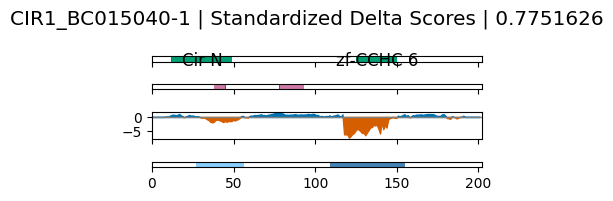

CCNL1_JF432881 CCNL1_JF432881
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CCNL1_JF432881_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Cyclin_N: 83-196
CycT2-like_C: 200-272
Low complexity coordinates: 10-40, 254-254, 277-277, 282-282, 293-297, 301-301, 304-310, 322-322, 331-333, 341-348, 354-355, 380-439, 441-441
sig peak regions (p<0.05): 13-45, 382-401, 411-442, 464-493
sig peak regions (p<0.001): 


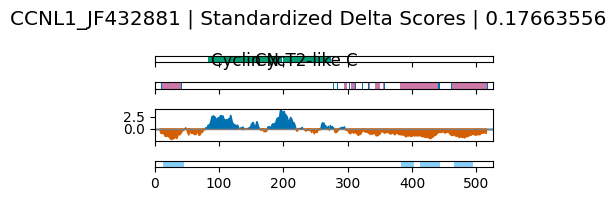

PRPF19_BC008719-2 PRPF19_BC008719-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PRPF19_BC008719-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 297-328
WD40: 467-503
WD40: 256-292
WD40: 384-420
Prp19: 68-134
U-box: 3-54
Low complexity coordinates: 13-13, 15-15, 67-67, 96-96, 121-124, 127-127, 143-146, 148-148, 188-195
sig peak regions (p<0.05): 20-56, 65-138, 216-268, 273-308, 332-351, 354-403
sig peak regions (p<0.001): 26-45, 78-121, 226-259, 275-308, 359-396


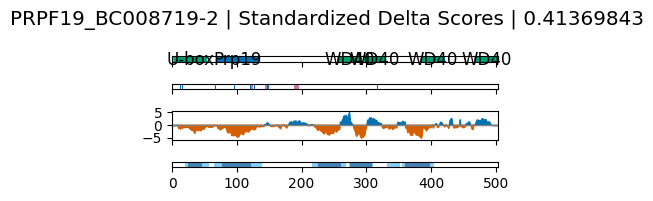

DHX37_BC004463-1 DHX37_BC004463-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX37_BC004463-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


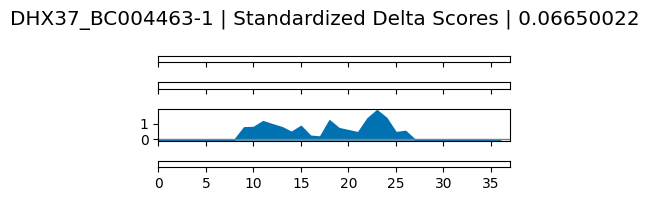

FTO_NM_001080432 FTO_NM_001080432
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FTO_NM_001080432_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FTO_NTD: 37-325
FTO_CTD: 329-497
Low complexity coordinates: 10-22, 24-26, 28-28, 154-156, 249-249, 253-255, 257-259
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


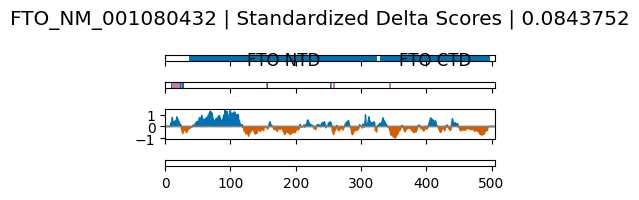

DHX35_HQ258480 DHX35_HQ258480
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX35_HQ258480_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
AAA_22: 71-206
OB_NTP_bind: 607-683
Helicase_C: 262-397
HA2_C: 490-548
HA2_N: 459-488
Low complexity coordinates: 101-123, 194-196, 280-280, 339-341, 347-347
sig peak regions (p<0.05): 159-195
sig peak regions (p<0.001): 


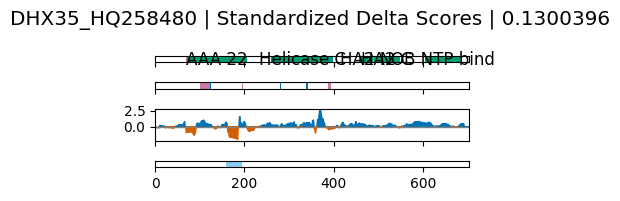

FZD8_BC111845 FZD8_BC111845
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FZD8_BC111845_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Frizzled: 268-620
Fz: 35-141
Low complexity coordinates: 13-26, 159-228, 340-377, 451-452, 456-457, 542-542, 624-671
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


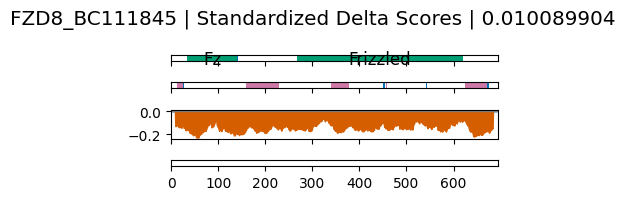

INTS6_BC039829-1 INTS6_BC039829-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/INTS6_BC039829-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
VWA_2: 4-131
INT_SG_DDX_CT_C: 808-869
Low complexity coordinates: 93-93, 382-388, 396-397, 478-479, 558-558, 560-561, 687-688
sig peak regions (p<0.05): 30-69
sig peak regions (p<0.001): 


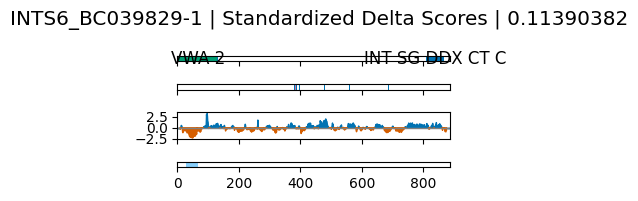

DHX40_BC024187-2 DHX40_BC024187-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX40_BC024187-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
OB_NTP_bind: 619-698
HA2_C: 493-544
Helicase_C: 268-400
DEAD: 60-216
HA2_N: 463-491
Low complexity coordinates: 11-11, 17-20
sig peak regions (p<0.05): 154-192
sig peak regions (p<0.001): 


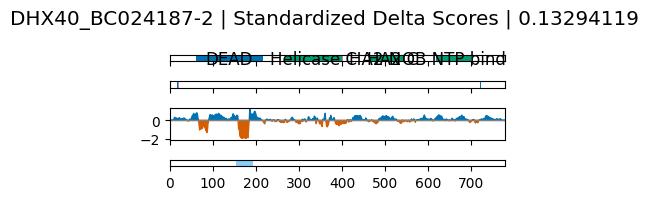

DDX31_BC156832 (NM_138620-1) DDX31_BC156832 (NM_138620-1)
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DDX31_BC156832 (NM_138620-1)_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Occlusion plot of DDX31_BC156832 (NM_138620-1) is not found.
DHX34_BC172389 DHX34_BC172389
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX34_BC172389_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DEAD: 171-315
OB_NTP_bind: 800-910
Helicase_C: 378-496
HA2_N: 557-585
HA2_C: 589-645
Low complexity coordinates: 10-14, 665-665, 704-705, 709-709, 716-727, 730-730, 732-734, 751-757, 781-794, 797-797, 801-801, 803-806, 933-963, 970-970, 975-977, 1025-1027, 1029-1030, 1052-1054
sig peak regions (p<0.05): 264-290, 449-469
sig peak regions (p<0.001): 


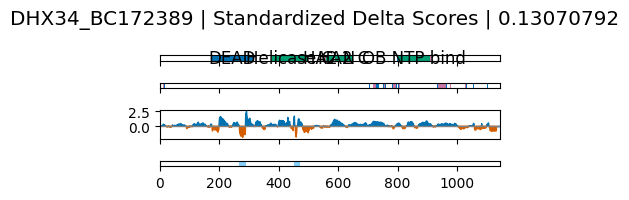

DHX58_JF432115 DHX58_JF432115
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DHX58_JF432115_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DUF6825: 493-548
ResIII: 1-170
RIG-I_C-RD: 552-667
Helicase_C: 350-472
RIG-I_C: 216-343
Low complexity coordinates: 112-113, 121-121, 124-124, 163-163, 210-210, 268-268, 276-276, 297-298, 368-368, 383-385, 391-396, 506-506, 524-537, 542-543, 585-585
sig peak regions (p<0.05): 4-50, 112-150, 405-480, 574-594
sig peak regions (p<0.001): 10-48, 427-463


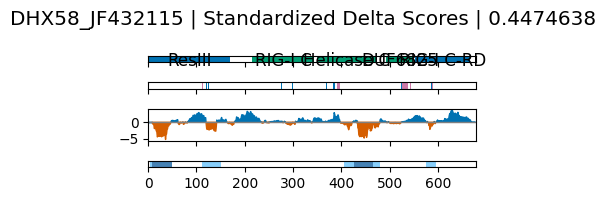

CPSF4L_BC157870-1 CPSF4L_BC157870-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CPSF4L_BC157870-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-CCCH: 119-143
zf_CCCH_4: 148-165
zf-CCCH_3: 39-118
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


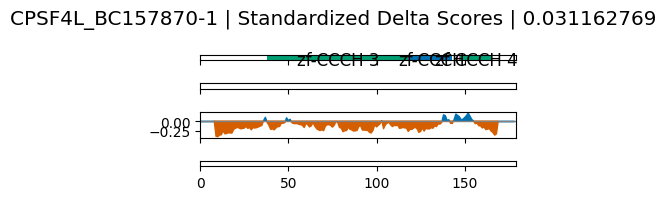

CPSF3L_AM393218 CPSF3L_AM393218
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CPSF3L_AM393218_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Lactamase_B: 15-82
Beta-Casp: 129-243
IntS11_C: 289-380
RMMBL: 258-283
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


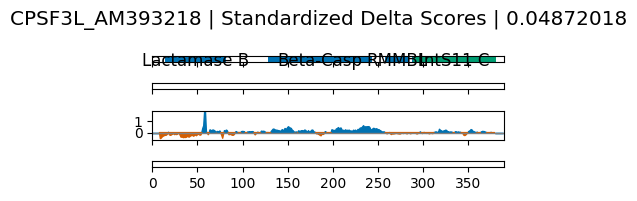

CLP1_BC000446-1 CLP1_BC000446-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CLP1_BC000446-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Clp1: 313-423
CLP1_P: 121-307
CLP1_N: 16-107
Low complexity coordinates: 17-18, 24-28, 110-110, 248-250, 259-259, 292-292, 294-296, 299-303
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


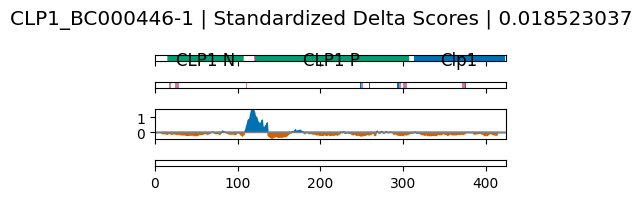

WDR33_BC013990-2 WDR33_BC013990-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/WDR33_BC013990-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 155-188
Low complexity coordinates: 29-29
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


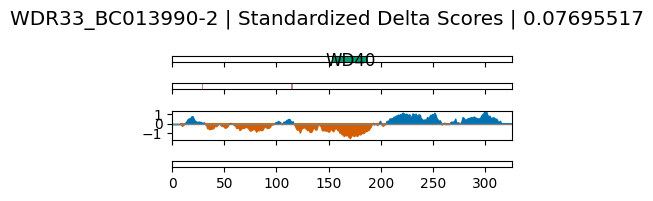

HNRNPUL2_NM_001079559-1 HNRNPUL2_NM_001079559-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/HNRNPUL2_NM_001079559-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
SPRY: 312-416
AAA_33: 454-599
SAP: 4-37
Low complexity coordinates: 34-64, 67-130, 135-137, 142-143, 145-163, 180-186, 201-201, 238-238, 417-420, 423-435, 442-444, 552-552, 566-569, 575-575, 635-669, 671-680
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


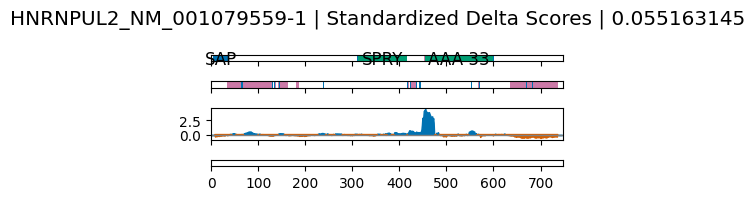

CPSF2_BC070095-1 CPSF2_BC070095-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CPSF2_BC070095-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CPSF100_C: 608-779
Beta-Casp: 243-368
Lactamase_B_6: 22-199
RMMBL: 529-591
Low complexity coordinates: 269-269, 382-425
sig peak regions (p<0.05): 35-83
sig peak regions (p<0.001): 


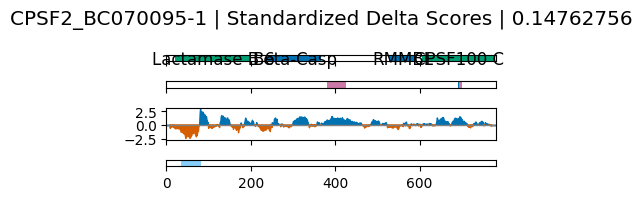

CSTF3_HQ447885 CSTF3_HQ447885
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CSTF3_HQ447885_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TPR_14: 42-73
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


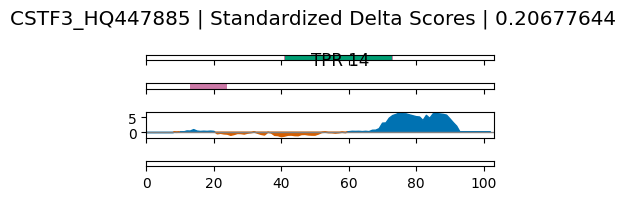

THOC5_CU013430 THOC5_CU013430
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/THOC5_CU013430_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
FmiP_Thoc5: 97-452
Low complexity coordinates: 212-213, 215-219, 304-317
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


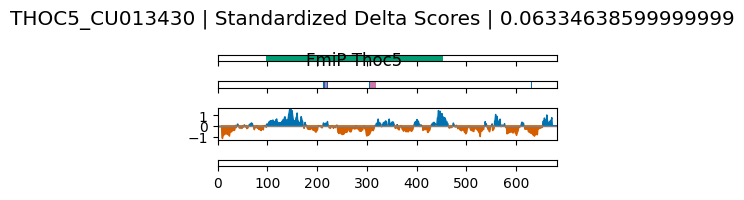

THOC3_BC006849 THOC3_BC006849
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/THOC3_BC006849_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 48-81
WD40: 215-252
WD40: 94-128
ANAPC4_WD40: 266-316
Low complexity coordinates: 10-15
sig peak regions (p<0.05): 105-146, 230-270
sig peak regions (p<0.001): 106-144, 244-270


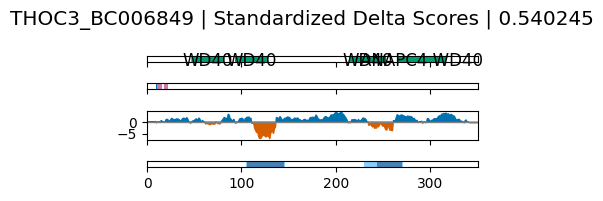

SOX21_BC111584 SOX21_BC111584
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SOX21_BC111584_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
HMG_box: 8-76
Low complexity coordinates: 79-84, 106-124, 128-170, 176-180, 183-224, 253-256, 258-259
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


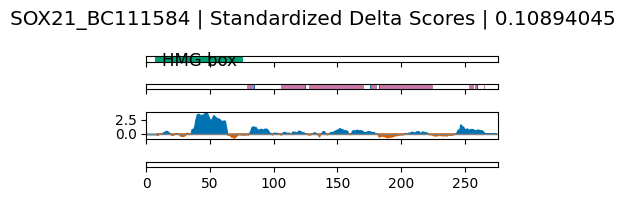

FZD3_NM_017412 FZD3_NM_017412
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/FZD3_NM_017412_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Frizzled: 193-512
Fz: 28-133
Low complexity coordinates: 213-218, 374-374, 376-376, 379-388, 390-393, 430-430, 553-553, 555-555, 581-582, 585-585, 616-620
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


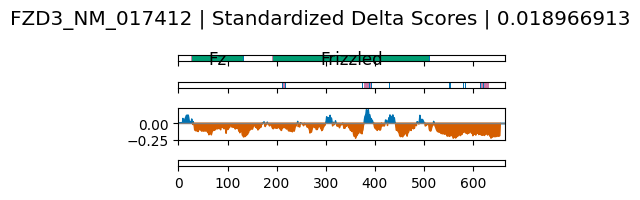

CNOT3_BC016474 CNOT3_BC016474
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CNOT3_BC016474_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Not3: 4-232
NOT2_3_5_C: 622-747
Low complexity coordinates: 39-40, 43-45, 49-50, 52-52, 163-165, 221-225, 227-227, 256-274, 306-306, 314-314, 316-361, 363-363, 366-425, 434-437, 439-459, 461-507, 540-540, 543-543, 577-581, 585-586, 644-646
sig peak regions (p<0.05): 320-386, 702-751
sig peak regions (p<0.001): 


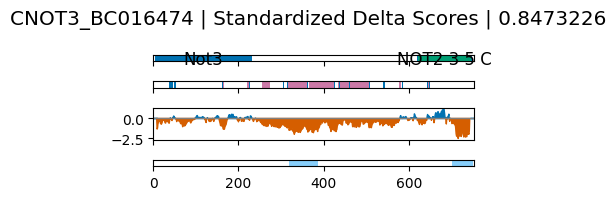

CNOT6_NM_015455-3 CNOT6_NM_015455-3
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CNOT6_NM_015455-3_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
LRR_4: 98-138
LRR_8: 52-109
Exo_endo_phos: 193-531
Low complexity coordinates: 47-55, 98-98, 100-102, 104-106, 108-109, 111-111, 116-118, 121-123, 128-128, 130-130, 146-146, 532-532
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


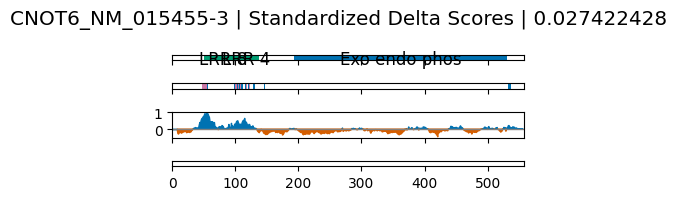

CNOT6_BC160174 CNOT6_BC160174
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CNOT6_BC160174_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


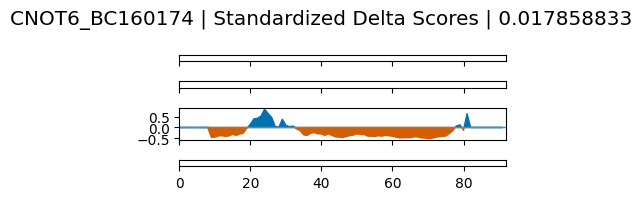

CHAF1B_JF432525 CHAF1B_JF432525
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CHAF1B_JF432525_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
WD40: 162-199
CAF-1_p60_C: 381-549
WD40: 120-157
Low complexity coordinates: 357-357, 419-419, 424-424, 426-434, 436-436, 439-439, 441-445, 450-450, 502-502, 509-523
sig peak regions (p<0.05): 9-63, 68-175, 403-459, 463-482, 503-539
sig peak regions (p<0.001): 18-63, 68-112, 131-175


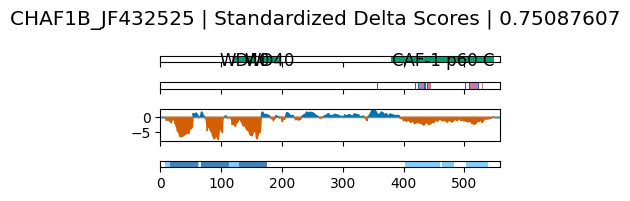

DCP2_BC064593-1 DCP2_BC064593-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DCP2_BC064593-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NUDIX: 98-210
DCP2: 12-93
Low complexity coordinates: 239-239, 242-250
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


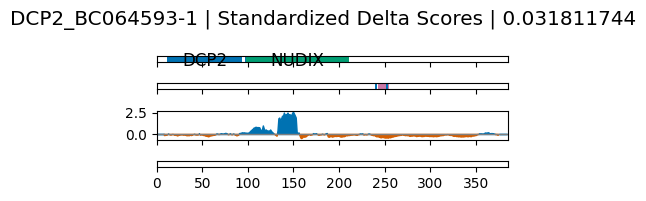

TERT_BC172541 TERT_BC172541
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TERT_BC172541_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
TERT_C: 956-1085
RVT_1: 810-893
Telomerase_RBD: 460-592
Low complexity coordinates: 57-58, 106-106, 136-153, 156-157, 182-182, 186-187, 214-242, 299-305, 312-316, 343-343, 348-351, 374-375, 378-387, 599-600, 602-602, 604-606, 651-652, 849-851, 854-857, 859-859, 957-958, 1042-1046, 1088-1092, 1095-1096
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


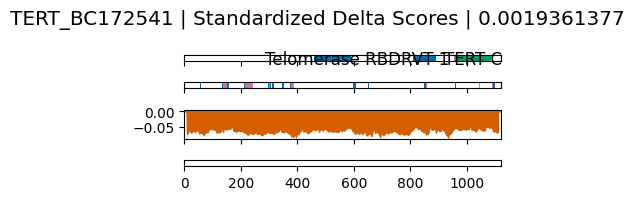

PABPN1L_BC148673 PABPN1L_BC148673
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PABPN1L_BC148673_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 149-218
Low complexity coordinates: 38-68, 76-78, 105-120, 236-236, 242-253, 261-263, 265-269
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


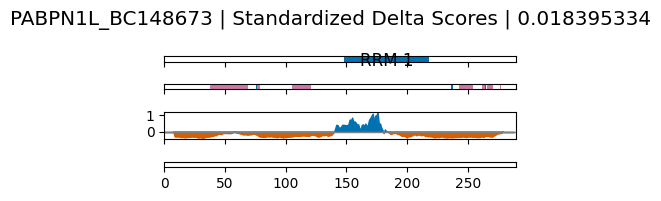

NUDT16L1_BC006223-2 NUDT16L1_BC006223-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NUDT16L1_BC006223-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Low complexity coordinates: 60-60, 80-84, 86-86, 182-187
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


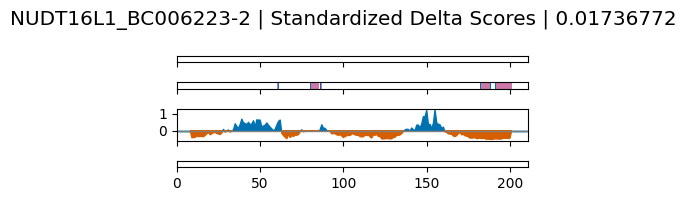

TOB1_DQ893993 TOB1_DQ893993
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TOB1_DQ893993_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PAM2: 263-275
BTG: 1-113
Low complexity coordinates: 38-41, 143-160, 173-176, 179-187, 225-225
sig peak regions (p<0.05): 44-95, 118-174, 264-310
sig peak regions (p<0.001): 49-81, 273-308


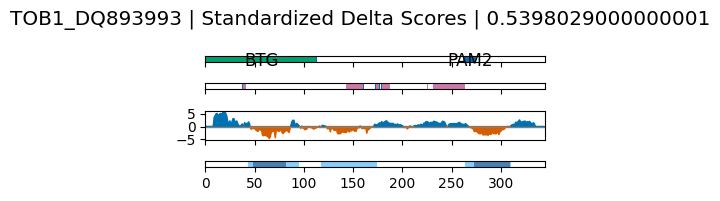

PABPC1P2_BC068242-1 PABPC1P2_BC068242-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PABPC1P2_BC068242-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 116-184
RRM_1: 33-80
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


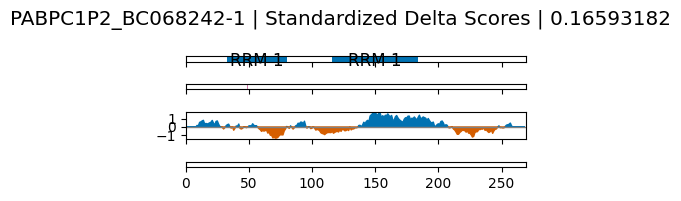

NUDT16_BC031215-1 NUDT16_BC031215-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/NUDT16_BC031215-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NUDIX: 12-81
Low complexity coordinates: 39-39, 41-52, 87-88, 109-115
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


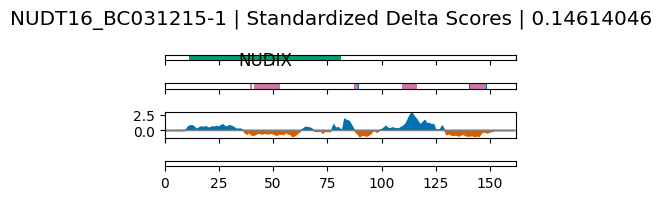

GAPDH_BC001601-1_BC004109-2_BC009081-1_BC013310-2_BC023632-2_BC025925-1_BC026907-1_BC029618-1 GAPDH_BC001601-1_BC004109-2_BC009081-1_BC013310-2_BC023632-2_BC025925-1_BC026907-1_BC029618-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GAPDH_BC001601-1_BC004109-2_BC009081-1_BC013310-2_BC023632-2_BC025925-1_BC026907-1_BC029618-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Gp_dh_C: 157-314
Gp_dh_N: 4-104
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


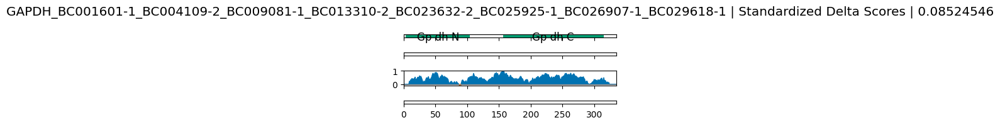

GLE1_BC030012-1 GLE1_BC030012-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/GLE1_BC030012-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GLE1: 408-648
Low complexity coordinates: 70-75, 78-98, 160-160, 176-176, 210-213, 223-243, 251-257, 259-262, 265-267, 299-307, 314-314, 317-317, 340-341, 343-345, 348-348, 350-351, 358-365
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


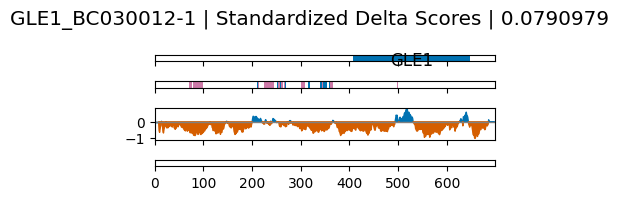

EDC3_BC011534-1_BC021271-2 EDC3_BC011534-1_BC021271-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EDC3_BC011534-1_BC021271-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Edc3_linker: 103-194
FDF: 199-300
YjeF_N: 304-465
LSM14: 4-66
Low complexity coordinates: 131-132, 153-161, 163-163, 194-198
sig peak regions (p<0.05): 103-130, 275-317, 355-378, 405-457
sig peak regions (p<0.001): 103-122, 276-316, 355-378, 409-453


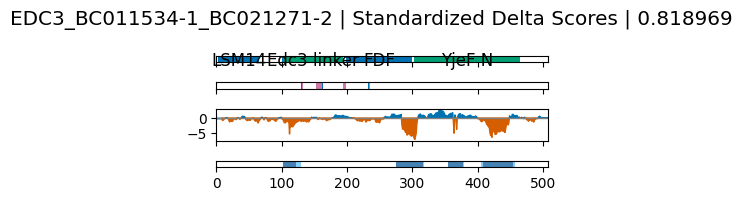

PNRC2_BC001959-1 PNRC2_BC001959-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PNRC2_BC001959-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PNRC: 93-111
Low complexity coordinates: 22-27, 68-70
sig peak regions (p<0.05): 86-105
sig peak regions (p<0.001): 


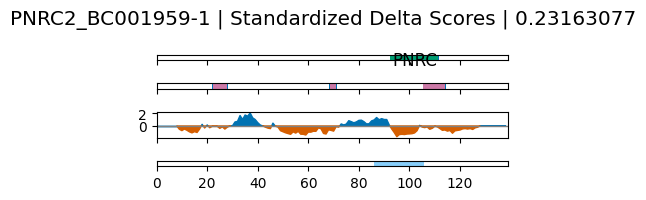

DCP1A_BC007439-2 DCP1A_BC007439-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DCP1A_BC007439-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
DCP1: 9-123
mRNA_decap_C: 541-581
Low complexity coordinates: 183-185, 187-189, 192-192, 194-195, 316-318, 320-326, 440-440, 446-457, 484-504
sig peak regions (p<0.05): 278-303, 477-496
sig peak regions (p<0.001): 


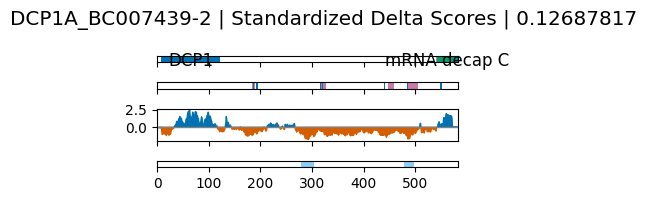

BTG3_BC011957-1 BTG3_BC011957-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/BTG3_BC011957-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
BTG: 1-105
Low complexity coordinates: 23-23, 30-30, 104-105, 133-133, 188-193, 195-202, 204-204, 249-251
sig peak regions (p<0.05): 183-210
sig peak regions (p<0.001): 


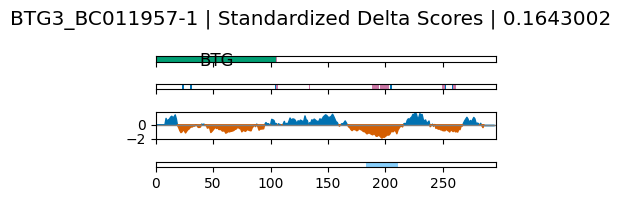

SMG6_BC148373 SMG6_BC148373
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SMG6_BC148373_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
EST1_DNA_bind: 5-196
PIN_4: 340-500
Low complexity coordinates: 90-90, 92-92, 99-100, 112-112, 175-179, 184-185, 270-289, 298-312, 478-478, 481-485
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


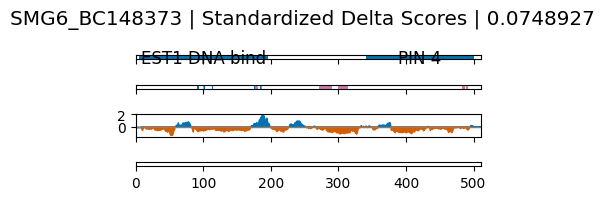

IGF2BP1_NM_006546-3 IGF2BP1_NM_006546-3
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/IGF2BP1_NM_006546-3_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
KH_1: 408-471
KH_1: 198-262
KH_1: 280-344
RRM_1: 85-150
KH_1: 491-555
RRM_1: 4-68
Low complexity coordinates: 114-117, 120-122, 167-184, 373-392, 410-410
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


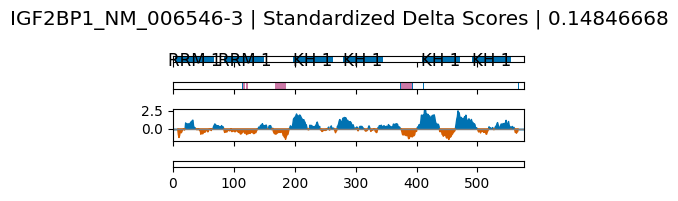

TOE1_JF432181 TOE1_JF432181
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/TOE1_JF432181_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CAF1: 169-451
CAF1: 39-166
Low complexity coordinates: 10-18, 28-30
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


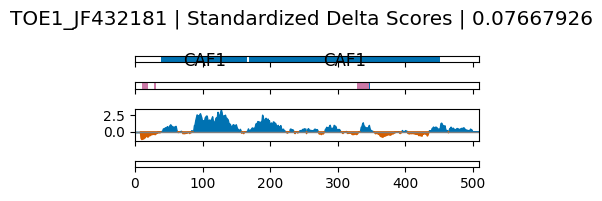

DMGDH_BC156312 DMGDH_BC156312
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DMGDH_BC156312_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
GCV_T_C: 770-847
GCV_T: 479-744
FAO_M: 417-470
DAO: 52-414
Low complexity coordinates: 10-21, 23-24, 30-30, 207-207, 652-652
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


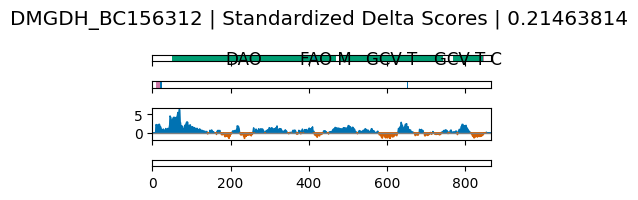

PHF6_BC005994-1 PHF6_BC005994-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PHF6_BC005994-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
zf-HC5HC2H: 240-295
zf-HC5HC2H: 42-132
Low complexity coordinates: 144-148, 151-155, 157-167, 184-191, 193-194
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


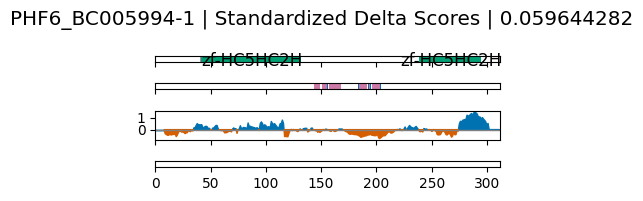

PCSK9_NM_174936-2 PCSK9_NM_174936-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PCSK9_NM_174936-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Inhibitor_I9: 77-149
PCSK9_C1: 450-531
PCSK9_C3: 602-682
PCSK9_C2: 535-600
Peptidase_S8: 181-419
Low complexity coordinates: 10-30, 35-35, 39-44, 46-46, 48-48, 93-95, 97-98, 126-127, 239-241, 281-286, 288-289, 304-306, 379-380, 390-391, 490-490, 494-494, 659-659, 662-666
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


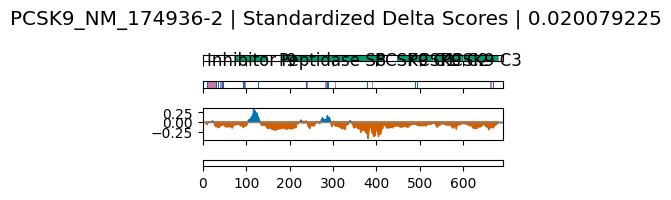

CPEB1_BC035348-1 CPEB1_BC035348-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/CPEB1_BC035348-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 352-410
CEBP1_N: 1-232
RRM_7: 235-330
CEBP_ZZ: 422-479
Low complexity coordinates: 33-33, 37-37, 40-41, 43-47, 62-63, 65-79, 96-140, 142-144, 172-172, 175-177, 364-365
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


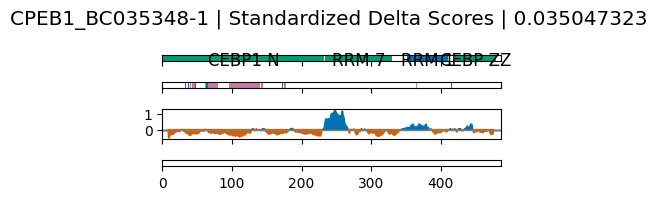

ALDH18A1_HQ258499 ALDH18A1_HQ258499
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ALDH18A1_HQ258499_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
Aldedh: 363-625
AA_kinase: 71-329
Low complexity coordinates: 165-165, 223-223, 269-269, 395-395, 401-401, 409-409, 411-415, 417-418, 420-422, 424-432, 435-436, 496-496, 498-502
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


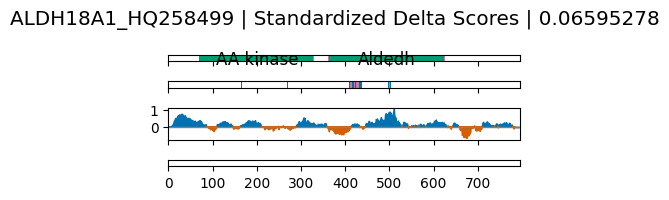

PPAPDC2_BC038108-2 PPAPDC2_BC038108-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PPAPDC2_BC038108-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PAP2: 166-271
Low complexity coordinates: 10-39, 75-81, 106-108, 168-183, 232-235, 237-240
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


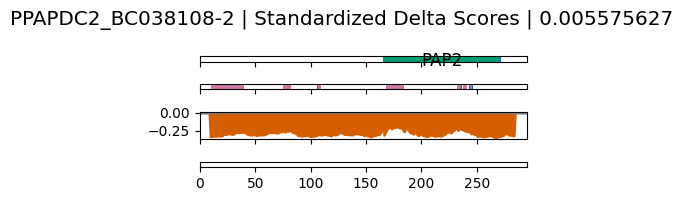

SF3B3_BC000463-1 SF3B3_BC000463-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SF3B3_BC000463-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
CPSF_A: 45-365
Low complexity coordinates: 10-22, 147-153, 155-155
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


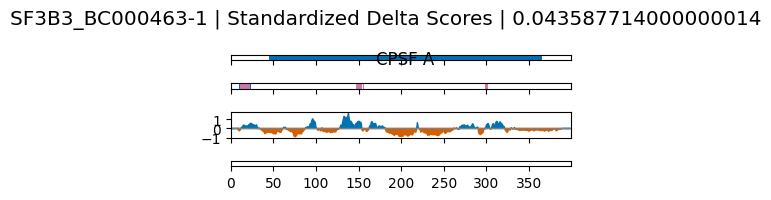

ELMOD3_BC001942-1 ELMOD3_BC001942-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/ELMOD3_BC001942-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ELMO_CED12: 157-313
Low complexity coordinates: 67-71, 208-208, 213-213, 339-339, 342-344
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


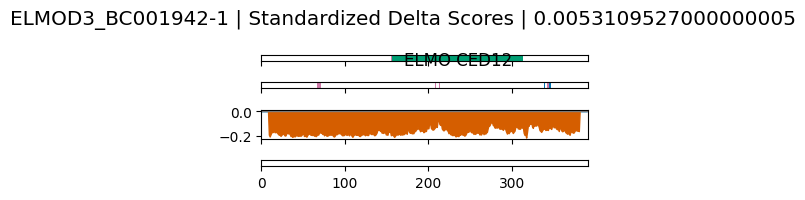

SF3B14_BC015463-1 SF3B14_BC015463-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/SF3B14_BC015463-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RRM_1: 21-87
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


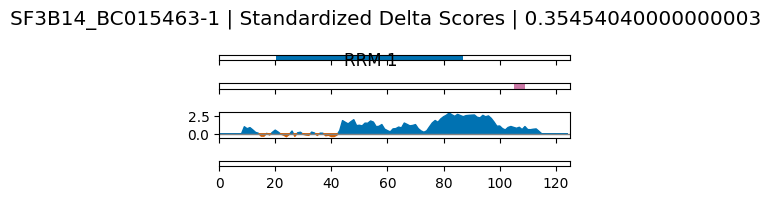

PAPD7_HQ258305 PAPD7_HQ258305
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/PAPD7_HQ258305_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
PAP_assoc: 178-237
NTP_transf_2: 15-123
Low complexity coordinates: 129-129, 132-132, 186-186, 207-207, 342-372, 393-401, 417-421, 458-458, 461-467, 486-487, 490-507
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


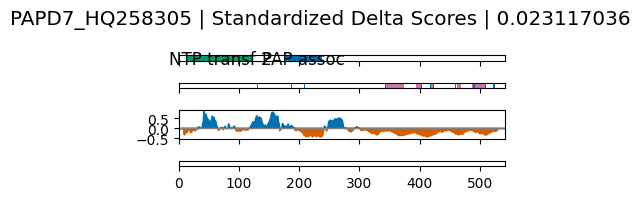

MPHOSPH6_BC031017-1 MPHOSPH6_BC031017-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/MPHOSPH6_BC031017-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
MPP6: 8-135
Low complexity coordinates: 30-35, 37-37, 40-44, 55-55, 57-57, 59-60
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


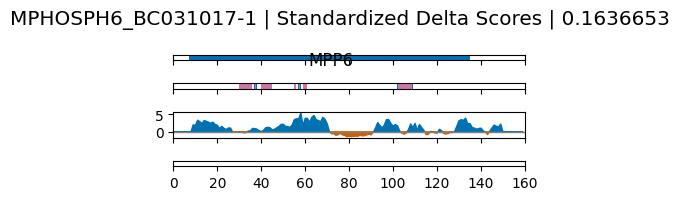

RBM43_BC136411-1 RBM43_BC136411-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/RBM43_BC136411-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
NID: 10-51
Low complexity coordinates: 25-26, 123-124, 134-134, 163-167, 191-192, 194-194
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


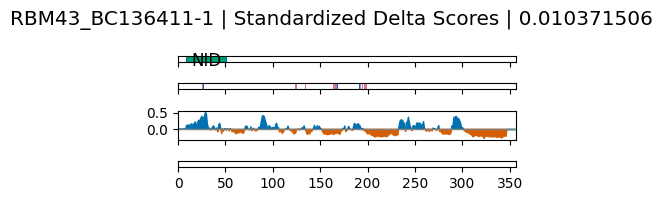

EXOSC7_BC012831-2 EXOSC7_BC012831-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EXOSC7_BC012831-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RNase_PH: 32-166
RNase_PH_C: 196-261
Low complexity coordinates: 27-27, 29-32, 220-221
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


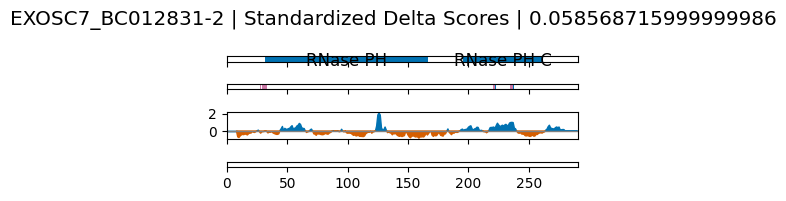

EXOSC5_BC007742-2 EXOSC5_BC007742-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EXOSC5_BC007742-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
RNase_PH: 28-147
RNase_PH_C: 151-215
Low complexity coordinates: 127-127
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


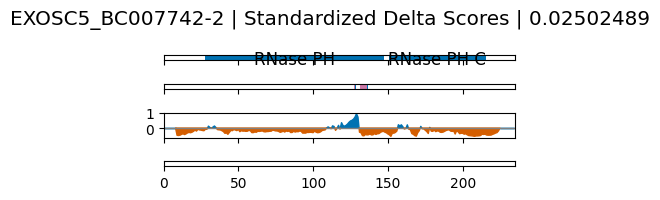

DIS3_BC038101-1 DIS3_BC038101-1
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/DIS3_BC038101-1_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
OB_Dis3: 210-276
Rrp44_CSD1: 65-157
Rrp44_S1: 685-756
RNB: 305-630
Low complexity coordinates: 154-155, 159-159, 163-165, 167-168, 226-226, 266-267, 456-459
sig peak regions (p<0.05): 4-23, 218-260, 305-336, 527-568, 635-655
sig peak regions (p<0.001): 


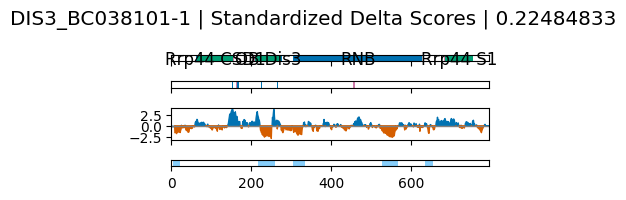

EXOSC1_BC022067-2 EXOSC1_BC022067-2
/tscc/nfs/home/pjaganna1/projects/apa_screen_yongsheng/hydra_2/occlusion_maps_noppinopia/maps_revision/len_norm_occ/EXOSC1_BC022067-2_Occlusion_score_matrix_full_aac_addZscoresProtLenWiseFib_pvalues_datanorm.xls
ECR1_N: 8-41
EXOSC1: 95-135
Low complexity coordinates: 
sig peak regions (p<0.05): 
sig peak regions (p<0.001): 


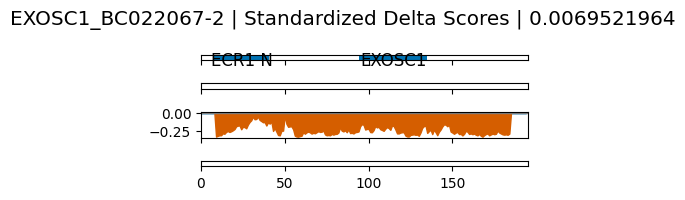

In [26]:
domain_coordinates = []
low_complexity_coordinates = []
sig_peaks_list = []
main4(rbps_list, p_threshold1=0.05, p_threshold2=0.001, savefig=True)
#main4(viz, p_threshold1=0.05, p_threshold2=0.001, savefig=True)


In [27]:
all_occ = pd.DataFrame()
for path_test in glob.glob('./maps_revision_innerCV/len_norm_occ/*addZscoresProtLenWiseFib_pvalues_datanorm.xls'):
    occ_df_pb = pd.read_table(path_test, index_col=0)[['zscore_deltaProteinBERT', 'occluded_coord', 'deltaProteinBERT_zscore_pvalue']]
    occ_df_pb['start'] = occ_df_pb.apply(lambda x: x['occluded_coord'].split('-')[0], axis=1)
    occ_df_pb['end'] = occ_df_pb.apply(lambda x: x['occluded_coord'].split('-')[1], axis=1)
    occ_df_pb['score'] = occ_df_pb.apply(lambda x: f"{x['zscore_deltaProteinBERT']},{x['deltaProteinBERT_zscore_pvalue']}", axis=1)
                                         
    occ_df_pb['RBP'] = path_test.split('/')[-1].split("_Occlusion")[0]
    occ_df_pb['key'] = occ_df_pb.apply(lambda x: f"{x['RBP']}_{x['occluded_coord']}", axis=1)
    all_occ = pd.concat([all_occ, occ_df_pb])

In [28]:
occ_df_pb

,zscore_deltaProteinBERT,occluded_coord,deltaProteinBERT_zscore_pvalue,start,end,score,RBP,key
0,-0.302112,0-19,0.381283,0,19,"-0.3021118527062304,0.3812833986093589",RPL23_BC062716-1,RPL23_BC062716-1_0-19
1,-0.304218,1-20,0.380481,1,20,"-0.3042180232785043,0.3804808972956412",RPL23_BC062716-1,RPL23_BC062716-1_1-20
2,-0.300783,2-21,0.381790,2,21,"-0.3007831936493477,0.3817899124148753",RPL23_BC062716-1,RPL23_BC062716-1_2-21
3,-0.272158,3-22,0.392750,3,22,"-0.2721583550454269,0.3927501307167066",RPL23_BC062716-1,RPL23_BC062716-1_3-22
4,-0.319950,4-23,0.374503,4,23,"-0.3199504615532125,0.37450294200904977",RPL23_BC062716-1,RPL23_BC062716-1_4-23
...,...,...,...,...,...,...,...,...
116,-0.310611,116-135,0.378048,116,135,"-0.3106108177099021,0.3780482511883577",RPL23_BC062716-1,RPL23_BC062716-1_116-135
117,-0.313460,117-136,0.376966,117,136,"-0.3134598008733999,0.3769656785400039",RPL23_BC062716-1,RPL23_BC062716-1_117-136
118,-0.319718,118-137,0.374591,118,137,"-0.3197178583225038,0.3745911104114482",RPL23_BC062716-1,RPL23_BC062716-1_118-137
119,-0.322708,119-138,0.373458,119,138,"-0.3227083553787713,0.3734580618798236",RPL23_BC062716-1,RPL23_BC062716-1_119-138


In [29]:
all_occ[['RBP', 'start', 'end', 'key', 'score']]

,RBP,start,end,key,score
0,RBMX2_BC033750-1,0,19,RBMX2_BC033750-1_0-19,"-0.48048873362605604,0.31543995620115506"
1,RBMX2_BC033750-1,1,20,RBMX2_BC033750-1_1-20,"0.25362250573448075,0.6001063960245622"
2,RBMX2_BC033750-1,2,21,RBMX2_BC033750-1_2-21,"0.6272290319137502,0.7347454423247564"
3,RBMX2_BC033750-1,3,22,RBMX2_BC033750-1_3-22,"0.9589835432849668,0.8312164821587424"
4,RBMX2_BC033750-1,4,23,RBMX2_BC033750-1_4-23,"0.7912127212074136,0.7855900653479693"
...,...,...,...,...,...
116,RPL23_BC062716-1,116,135,RPL23_BC062716-1_116-135,"-0.3106108177099021,0.3780482511883577"
117,RPL23_BC062716-1,117,136,RPL23_BC062716-1_117-136,"-0.3134598008733999,0.3769656785400039"
118,RPL23_BC062716-1,118,137,RPL23_BC062716-1_118-137,"-0.3197178583225038,0.3745911104114482"
119,RPL23_BC062716-1,119,138,RPL23_BC062716-1_119-138,"-0.3227083553787713,0.3734580618798236"


In [30]:
all_occ = all_occ[['RBP', 'start', 'end', 'key', 'score']]

In [31]:
all_occ.head()

,RBP,start,end,key,score
0,RBMX2_BC033750-1,0,19,RBMX2_BC033750-1_0-19,"-0.48048873362605604,0.31543995620115506"
1,RBMX2_BC033750-1,1,20,RBMX2_BC033750-1_1-20,"0.25362250573448075,0.6001063960245622"
2,RBMX2_BC033750-1,2,21,RBMX2_BC033750-1_2-21,"0.6272290319137502,0.7347454423247564"
3,RBMX2_BC033750-1,3,22,RBMX2_BC033750-1_3-22,"0.9589835432849668,0.8312164821587424"
4,RBMX2_BC033750-1,4,23,RBMX2_BC033750-1_4-23,"0.7912127212074136,0.7855900653479693"


In [32]:
#all_occ.to_csv('occlusion_map_scores_wheldout.bed', sep='\t', index=False, header=None)

In [33]:
sig_peaks_list_df = pd.DataFrame(sig_peaks_list)

In [34]:
sig_peaks_list_df.head()

,0,1,2
0,RPS28_BC000354-1_BC021239-2,36,55
1,RPS21_BC027976-1,23,57
2,RPS21_BC027976-1,31,51
3,SNRPG_BC000070-2_BC022432-1_BC066302-1,28,66
4,LSM5_BC005938-1,43,81


In [35]:
#sig_peaks_list_df.to_csv('occlusion_map_sig_peaks_wheldout.bed', sep='\t', header=None, index=False)

In [36]:
domain_coordinates = pd.DataFrame(domain_coordinates)[[0,2,3, 1]]

In [37]:
domain_coordinates.head()

,0,2,3,1
0,NOP10_BC008886-2,3,52,Nop10p
1,RPS28_BC000354-1_BC021239-2,7,68,Ribosomal_S28e
2,RPS21_BC027976-1,1,47,Ribosomal_S21e
3,LSM6_BC016026-1,10,74,LSM
4,SNRPG_BC000070-2_BC022432-1_BC066302-1,8,71,LSM


In [38]:
domain_coordinates.to_csv('occlusion_map_domains_wheldout.bed', sep='\t', header=None, index=False)

In [39]:
low_complexity = pd.DataFrame(low_complexity_coordinates)

In [40]:
low_complexity.head()

,0,1,2
0,SNRPF_BC063397-1_BC128453-1,12,13
1,RPL36_BC004971-1,21,21
2,RPL36_BC004971-1,76,76
3,S100A4_BC016300-1,27,27
4,S100A4_BC016300-1,30,31


In [41]:
#low_complexity.to_csv('occlusion_map_low_complexity_wheldout.bed', sep='\t', header=None, index=False)

```bedtools intersect -b occlusion_map_scores_wheldout.bed -a occlusion_map_sig_peaks_wheldout.bed -wa -wb > occlusion_map_sig_peaks_score_overlap_wheldout.txt```

```bedtools intersect -b occlusion_map_low_complexity_wheldout.bed -a occlusion_map_sig_peaks_wheldout.bed -wa -wb > occlusion_map_sig_peaks_low_complexity_overlap_wheldout.txt```

```bedtools intersect -b occlusion_map_domains_wheldout.bed -a occlusion_map_sig_peaks_wheldout.bed -wa -wb > occlusion_map_sig_peaks_domain_wheldout.txt```

In [2]:
sig_peak_score = pd.read_csv('occlusion_map_sig_peaks_score_overlap_wheldout.txt', sep='\t', header=None)
sig_peak_score['pval'] = sig_peak_score.apply(lambda x: np.float(x[7].split(',')[1]), axis=1)
sig_peak_score['occ_score'] = sig_peak_score.apply(lambda x: np.float(x[7].split(',')[0]), axis=1)
sig_peak_score['abs_occ_score'] = sig_peak_score.apply(lambda x: np.abs(x['occ_score']), axis=1)

In [3]:
sig_peak_score = sig_peak_score[sig_peak_score['pval']<0.05]

In [4]:
sig_peak_score['key'] = sig_peak_score.apply(lambda x: f"{x[0]}_{x[1]}-{x[2]}", axis=1)
sig_peak_score_drop = sig_peak_score.loc[sig_peak_score.groupby("key")['abs_occ_score'].idxmax().values] # keeping the entry for each peak with the highest absolute value occlusion score 
sig_peak_score_dict = dict(zip(sig_peak_score_drop.key, sig_peak_score_drop['occ_score']))

In [5]:
sig_peak_score_drop.head()

,0,1,2,3,4,5,6,7,pval,occ_score,abs_occ_score,key
3146,ACTN4_BC005033-1,0,39,ACTN4_BC005033-1,0,19,ACTN4_BC005033-1_0-19,"-2.9240434133353723,0.0017275827735353064",0.001728,-2.924043,2.924043,ACTN4_BC005033-1_0-39
3106,ACTN4_BC005033-1,0,40,ACTN4_BC005033-1,0,19,ACTN4_BC005033-1_0-19,"-2.9240434133353723,0.0017275827735353064",0.001728,-2.924043,2.924043,ACTN4_BC005033-1_0-40
34197,ADAR_BC038227,0,30,ADAR_BC038227,0,19,ADAR_BC038227_0-19,"-3.357497077833925,0.0003932578742025774",0.000393,-3.357497,3.357497,ADAR_BC038227_0-30
33302,ADAR_BC038227,0,31,ADAR_BC038227,0,19,ADAR_BC038227_0-19,"-3.357497077833925,0.0003932578742025774",0.000393,-3.357497,3.357497,ADAR_BC038227_0-31
34101,ADAR_BC038227,1001,1029,ADAR_BC038227,1007,1026,ADAR_BC038227_1007-1026,"-1.7246033500102709,0.04229948965634472",0.042299,-1.724603,1.724603,ADAR_BC038227_1001-1029


In [6]:
sig_peak_low_complexity = pd.read_csv('occlusion_map_sig_peaks_low_complexity_overlap_wheldout.txt', sep='\t', header=None)
sig_peak_low_complexity = sig_peak_low_complexity[sig_peak_low_complexity[3] !='.']
sig_peak_low_complexity['key'] = sig_peak_low_complexity.apply(lambda x: f"{x[0]}_{x[1]}-{x[2]}", axis=1)
sig_peak_low_complexity['gene'] = sig_peak_low_complexity.apply(lambda x: x[0].split('_')[0], axis=1)

In [7]:
sig_peak_low_complexity['occ_score'] = sig_peak_low_complexity.key.map(sig_peak_score_dict)

In [8]:
sig_peak_low_complexity.head()

,0,1,2,3,4,5,key,gene,occ_score
0,ILF3_BC064836-1,662,696,ILF3_BC064836-1,643,685,ILF3_BC064836-1_662-696,ILF3,NaN
1,DDX50_BC000272-1,261,312,DDX50_BC000272-1,287,287,DDX50_BC000272-1_261-312,DDX50,-4.184942
2,LARP4B_BC131630-1,22,47,LARP4B_BC131630-1,36,36,LARP4B_BC131630-1_22-47,LARP4B,NaN
3,LARP4B_BC131630-1,22,47,LARP4B_BC131630-1,38,43,LARP4B_BC131630-1_22-47,LARP4B,NaN
4,LARP4B_BC131630-1,212,231,LARP4B_BC131630-1,212,212,LARP4B_BC131630-1_212-231,LARP4B,-1.954292


In [9]:
sig_peak_domain = pd.read_csv('occlusion_map_sig_peaks_domain_wheldout.txt', sep='\t', header=None)
sig_peak_domain = sig_peak_domain[sig_peak_domain[3] !='.']
sig_peak_domain['key'] = sig_peak_domain.apply(lambda x: f"{x[0]}_{x[1]}-{x[2]}", axis=1)
sig_peak_domain['gene'] = sig_peak_domain.apply(lambda x: x[0].split('_')[0], axis=1)

In [10]:
sig_peak_domain['occ_score'] = sig_peak_domain.key.map(sig_peak_score_dict)

In [11]:
sig_peak_domain.head()

,0,1,2,3,4,5,6,key,gene,occ_score
0,RPS28_BC000354-1_BC021239-2,36,55,RPS28_BC000354-1_BC021239-2,7,68,Ribosomal_S28e,RPS28_BC000354-1_BC021239-2_36-55,RPS28,-1.696400
1,RPS21_BC027976-1,23,57,RPS21_BC027976-1,1,47,Ribosomal_S21e,RPS21_BC027976-1_23-57,RPS21,-2.388340
2,RPS21_BC027976-1,31,51,RPS21_BC027976-1,1,47,Ribosomal_S21e,RPS21_BC027976-1_31-51,RPS21,-2.388340
3,SNRPG_BC000070-2_BC022432-1_BC066302-1,28,66,SNRPG_BC000070-2_BC022432-1_BC066302-1,8,71,LSM,SNRPG_BC000070-2_BC022432-1_BC066302-1_28-66,SNRPG,-3.310932
4,LSM5_BC005938-1,43,81,LSM5_BC005938-1,17,84,LSM,LSM5_BC005938-1_43-81,LSM5,-3.074955


In [12]:
# Convert keys for fast lookup
domain_keys = set(sig_peak_domain['key'])
lcr_keys = set(sig_peak_low_complexity['key'])
all_keys = list(sig_peak_score_dict.keys())
num_rbps = [g.split('_')[0] for g in all_keys]

print(f"Number of RBPs with Signficanlty Occluded Regions: {len(set(num_rbps))}")


# Prepare summary lists
occ_region = []
domain_overlap = []
lcr_overlap = []
both_overlap = []
neither_overlap = []

# Evaluate overlap types
for key in all_keys:
    occ_region.append(key)
    is_domain = key in domain_keys
    is_lcr = key in lcr_keys
    domain_overlap.append(is_domain)
    lcr_overlap.append(is_lcr)
    both_overlap.append(is_domain and is_lcr)
    neither_overlap.append(not is_domain and not is_lcr)
        

# Combine into a DataFrame
overlap_df = pd.DataFrame({
    'key': occ_region,
    'domain_overlap': domain_overlap,
    'lcr_overlap': lcr_overlap,
    'both_overlap': both_overlap,
    'neither_overlap': neither_overlap
})      

Number of RBPs with Signficanlty Occluded Regions: 188


In [13]:
overlap_df

,key,domain_overlap,lcr_overlap,both_overlap,neither_overlap
0,ACTN4_BC005033-1_0-39,False,True,False,False
1,ACTN4_BC005033-1_0-40,False,True,False,False
2,ADAR_BC038227_0-30,False,True,False,False
3,ADAR_BC038227_0-31,False,True,False,False
4,ADAR_BC038227_1001-1029,True,False,False,False
...,...,...,...,...,...
620,ZFP36L1_BC018340-1_231-260,False,True,False,False
621,ZFP36L1_BC018340-1_280-326,False,True,False,False
622,ZRANB2_BC039814-1_0-20,True,False,False,False
623,ZRANB2_BC039814-1_35-56,False,True,False,False


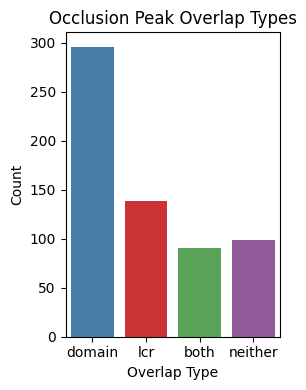

In [14]:

# Determine a region class column
def classify_region(row):
    if row['both_overlap']:
        return 'both'
    elif row['domain_overlap']:
        return 'domain'
    elif row['lcr_overlap']:
        return 'lcr'
    else:
        return 'neither'

overlap_df['region_class'] = overlap_df.apply(classify_region, axis=1)

# Get unique region classes
classes = overlap_df['region_class'].unique()

# Get a color palette with the same number of colors
palette = sns.color_palette('Set1', n_colors=len(classes))

# Create a mapping from region class to color
region_color_dict = dict(zip(classes, palette))


# Plot barplot of region_class counts
plt.figure(figsize=(3, 4))
sns.countplot(data=overlap_df, x='region_class', order=['domain', 'lcr', 'both', 'neither'], palette=region_color_dict)
plt.title('Occlusion Peak Overlap Types')
plt.xlabel('Overlap Type')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

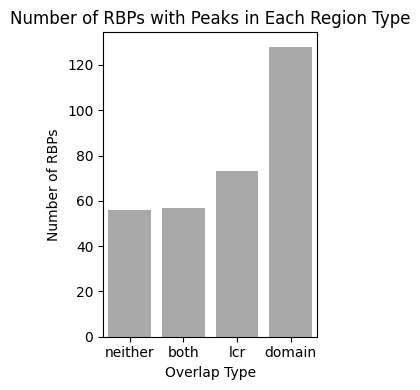

In [34]:
# Extract RBP ID (assuming it's the part before the first underscore)
overlap_df['rbp'] = overlap_df['key'].str.split('_').str[0]

# For each RBP, get the *set* of region classes across its peaks
rbp_region_classes = overlap_df.groupby('rbp')['region_class'].apply(lambda x: list(set(x)))

# Count how many RBPs have peaks in each region type
from collections import Counter
rbp_region_counts = Counter([cls for classes in rbp_region_classes for cls in classes])

# Plot
rbp_region_df = pd.DataFrame.from_dict(rbp_region_counts, orient='index', columns=['RBPs']).reset_index()
rbp_region_df.rename(columns={'index': 'region_class'}, inplace=True)

plt.figure(figsize=(3, 4))
sns.barplot(data=rbp_region_df.sort_values('RBPs'), x='region_class', y='RBPs', color='darkgrey')
plt.title('Number of RBPs with Peaks in Each Region Type')
plt.ylabel('Number of RBPs')
plt.xlabel('Overlap Type')
plt.tight_layout()
plt.savefig('./revision_figures/RBPs_w_peaks_in_region_type.png')
plt.savefig('./revision_figures/RBPs_w_peaks_in_region_type.jpg')
plt.savefig('./revision_figures/RBPs_w_peaks_in_region_type.svg')

plt.show()

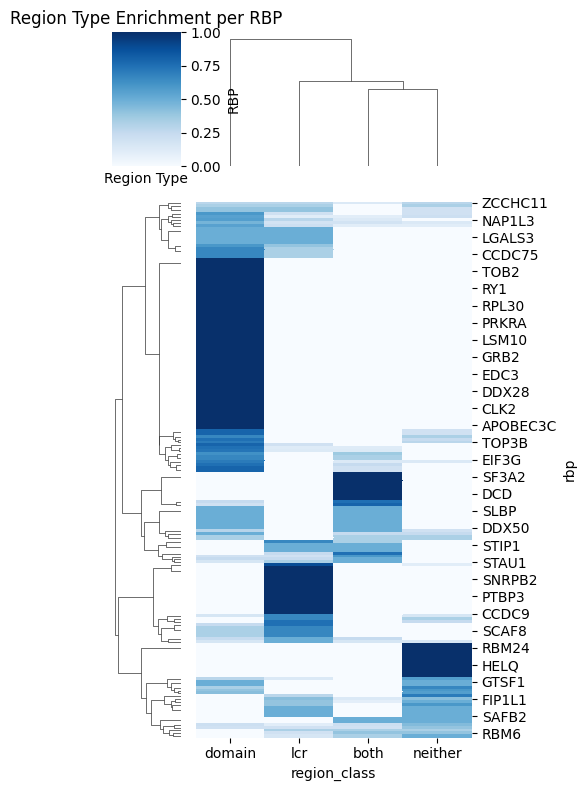

In [17]:
# For each RBP, compute fraction of peaks falling in each class
rbp_class_frac = overlap_df.groupby(['rbp', 'region_class']).size().unstack(fill_value=0)
rbp_class_frac = rbp_class_frac.div(rbp_class_frac.sum(axis=1), axis=0)

# Optional: plot as heatmap
sns.clustermap(rbp_class_frac, cmap="Blues", cbar_kws={'label': 'Fraction of Peaks'}, figsize=(5,8))
plt.title('Region Type Enrichment per RBP')
plt.xlabel('Region Type')
plt.ylabel('RBP')
plt.tight_layout()
plt.show()

In [18]:
sig_peak_domain['abs_occ_score'] = np.abs(sig_peak_domain['occ_score'])

In [19]:
sig_peak_domain.head()

,0,1,2,3,4,5,6,key,gene,occ_score,abs_occ_score
0,RPS28_BC000354-1_BC021239-2,36,55,RPS28_BC000354-1_BC021239-2,7,68,Ribosomal_S28e,RPS28_BC000354-1_BC021239-2_36-55,RPS28,-1.696400,1.696400
1,RPS21_BC027976-1,23,57,RPS21_BC027976-1,1,47,Ribosomal_S21e,RPS21_BC027976-1_23-57,RPS21,-2.388340,2.388340
2,RPS21_BC027976-1,31,51,RPS21_BC027976-1,1,47,Ribosomal_S21e,RPS21_BC027976-1_31-51,RPS21,-2.388340,2.388340
3,SNRPG_BC000070-2_BC022432-1_BC066302-1,28,66,SNRPG_BC000070-2_BC022432-1_BC066302-1,8,71,LSM,SNRPG_BC000070-2_BC022432-1_BC066302-1_28-66,SNRPG,-3.310932,3.310932
4,LSM5_BC005938-1,43,81,LSM5_BC005938-1,17,84,LSM,LSM5_BC005938-1_43-81,LSM5,-3.074955,3.074955


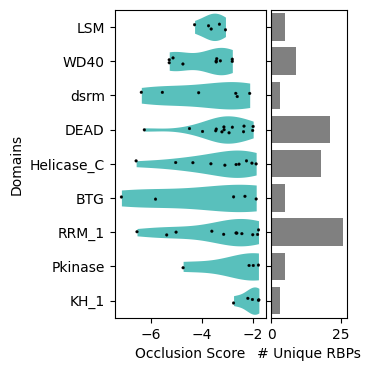

In [30]:
# Step 1: Prepare the domain_scores dataframe
domain_scores = (
    sig_peak_domain
    .groupby([3, 4, 5, 6])  # group by gene and domain
    .max('abs_occ_score')
    .reset_index()[[6, 'occ_score', 3]]  # domain, score, gene
    .rename(columns={6: 'domain', 3: 'gene'})
)

# Step 2: Filter to domains with enough peaks (min_peaks per domain)
min_peaks = 5
domain_counts = domain_scores['domain'].value_counts()
top_domains = domain_counts[domain_counts >= min_peaks].index
plot_df = domain_scores[domain_scores['domain'].isin(top_domains)]

# Step 3: Get order of domains by median score
ordered_domains = (
    plot_df.groupby('domain')['occ_score']
    .median()
    .sort_values()
    .index
)

# Step 4: Count unique RBPs per domain
rbp_counts = (
    plot_df.groupby('domain')['gene']
    .nunique()
    .reindex(ordered_domains)
)

# Step 5: Plot with shared y-axis
fig = plt.figure(figsize=(3, 4))
gs = fig.add_gridspec(1, 2, width_ratios=[2, 1], wspace=0.05)

# Barplot of # RBPs per domain
ax0 = fig.add_subplot(gs[0, 1])
ax0.barh(y=rbp_counts.index, width=rbp_counts.values, color='gray')
ax0.set_xlabel('# Unique RBPs')
ax0.set_ylabel('Domain')
ax0.invert_yaxis()  # top-to-bottom ordering

# Violin + strip plot of occlusion scores
ax1 = fig.add_subplot(gs[0, 0], sharey=ax0)
sns.violinplot(data=plot_df, y='domain', x='occ_score',
               order=ordered_domains, scale='width', inner=None, cut=0,
               linewidth=0, color='mediumturquoise', ax=ax1)
sns.stripplot(data=plot_df, y='domain', x='occ_score',
              order=ordered_domains, linewidth=0.2, ax=ax1, color='k', size=2)
#ax1.axvline(0, color='gray', linestyle='--', linewidth=0.5)
ax1.set_xlabel('Occlusion Score')
ax1.set_ylabel('Domains')
plt.savefig('./revision_figures/domain_occlusion_scores.png')
plt.savefig('./revision_figures/domain_occlusion_scores.svg')
plt.savefig('./revision_figures/domain_occlusion_scores.jpg')